In [1]:
import sys
print(sys.version)

3.6.5 |Anaconda custom (64-bit)| (default, Mar 29 2018, 13:14:23) 
[GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]


In [2]:
"""
Created on June 10 2018
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/Users/nevencaplar/Documents/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)  

In [3]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [4]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [5]:
%load_ext autoreload
%autoreload 2

#import Zernike_Module
#from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

#Zernike_Module_lastOct15_beforeScatterChange
import Zernike_Module
from Zernike_Module import *

In [6]:
import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math
import pickle

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"

from shutil import copy
from scipy.optimize import curve_fit

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c

# Verifying that images with new stop do look different

In [7]:
from astropy.io import fits

sci_data_32=fits.open('/Users/nevencaplar/Documents/PFS/ReducedData/FEB25/Feb2019/rerun/Feb13_2019/Feb14/calExp/2019-02-16/v0012310/calExp-LA012310r1.fits')[1].data
sci_data_28=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/NeonApr_2019/rerun/Apr30_2019/detrend/calExp/2019-04-17/v0016344/calExp-LA016344r1.fits')[1].data
sci_data_25=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v0019578/calExp-LA019578r1.fits')[1].data

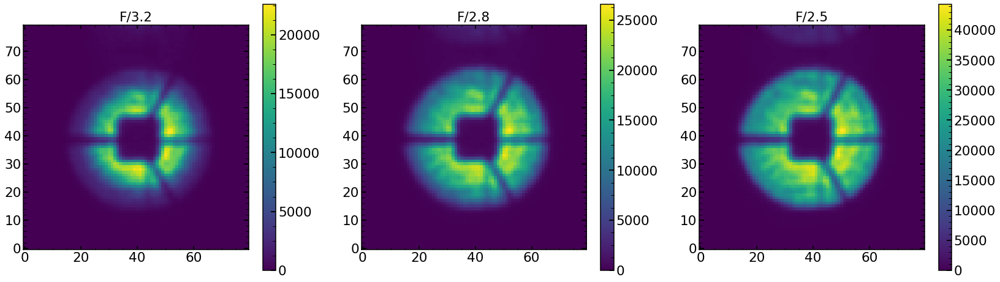

In [8]:
plt.figure(figsize=(28,8))

sci_data_32_cut=sci_data_32[1343:1423,2444-40:2444+40]
sci_data_28_cut=sci_data_28[1340:1420,2437-40:2437+40]
sci_data_25_cut=sci_data_25[1340:1420,2437-40:2437+40]

plt.subplot(131)
plt.title('F/3.2')
plt.imshow(sci_data_32_cut,vmin=0)
plt.colorbar()

plt.subplot(132)
plt.title('F/2.8')
plt.imshow(sci_data_28_cut,vmin=0)
plt.colorbar()

plt.subplot(133)
plt.title('F/2.5')
plt.imshow(sci_data_25_cut,vmin=0)
plt.colorbar()

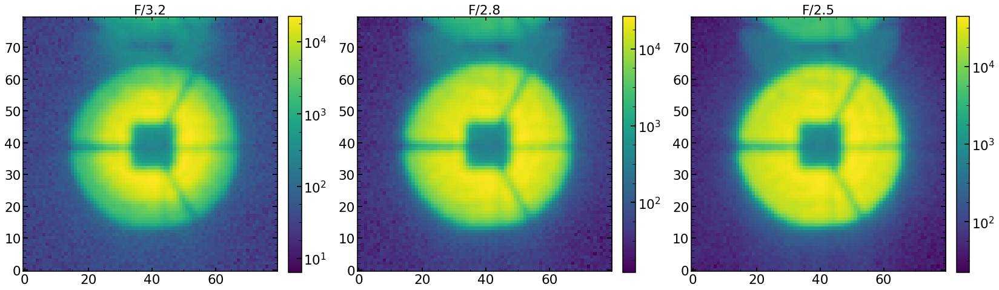

In [9]:
plt.figure(figsize=(28,8))

sci_data_32_cut=sci_data_32[1343:1423,2444-40:2444+40]
sci_data_28_cut=sci_data_28[1340:1420,2437-40:2437+40]
sci_data_25_cut=sci_data_25[1340:1420,2436-40:2436+40]

plt.subplot(131)
plt.title('F/3.2')
plt.imshow(sci_data_32_cut,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(132)
plt.title('F/2.8')
plt.imshow(sci_data_28_cut,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(133)
plt.title('F/2.5')
plt.imshow(sci_data_25_cut,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

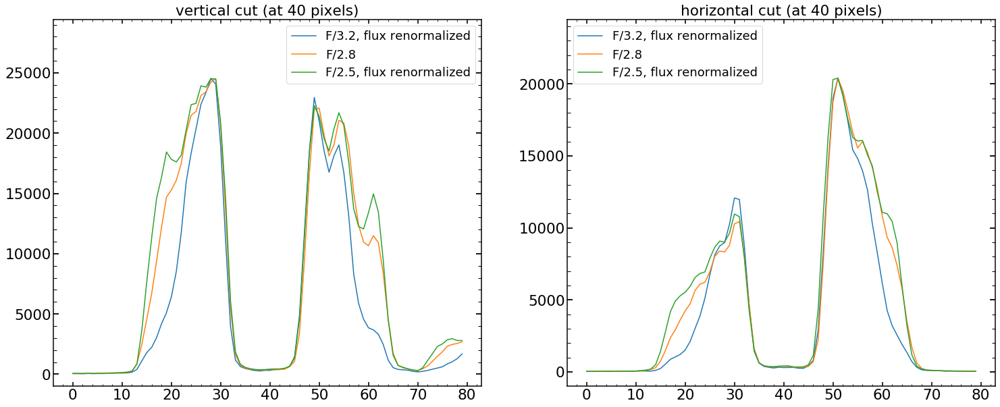

In [10]:
plt.figure(figsize=(25,10))
plt.subplot(121)
plt.title('vertical cut (at 40 pixels)')
plt.plot(sci_data_32_cut[:,40]*(np.max(sci_data_28_cut[:,40])/np.max(sci_data_32_cut[:,40])),label='F/3.2, flux renormalized')
plt.plot(sci_data_28_cut[:,40],label="F/2.8")
plt.plot(sci_data_25_cut[:,40]*(np.max(sci_data_28_cut[:,40])/np.max(sci_data_25_cut[:,40])),label='F/2.5, flux renormalized')
plt.ylim(-1000,np.max(sci_data_28_cut[:,40])*1.2)

plt.legend()

plt.subplot(122)
plt.title('horizontal cut (at 40 pixels)')
plt.plot(sci_data_32_cut[40]*(np.max(sci_data_28_cut[40])/np.max(sci_data_32_cut[40])),label='F/3.2, flux renormalized')
plt.plot(sci_data_28_cut[40],label="F/2.8")
plt.plot(sci_data_25_cut[40]*(np.max(sci_data_28_cut[40])/np.max(sci_data_25_cut[40])),label='F/2.5, flux renormalized')
plt.ylim(-1000,np.max(sci_data_28_cut[40])*1.2)
plt.legend()

# Preparation of the initial DATAFRAMES_FOLDER for analysis for the F/2.8 data 

In [18]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/'
# where are the dataframe which we use to guess the initial solution
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_interpolation_HgAr_from_Apr15.pkl', 'rb') as f:
    results_of_fit_many_interpolation_preDecemberrun_HgAr=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_interpolation_Ne_from_Apr15.pkl', 'rb') as f:
    results_of_fit_many_interpolation_preDecemberrun_Ne=pickle.load(f)
    
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  

In [31]:
finalHgAr_May2019['old_index_approx'].values

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  72,  73,  74,  75,
        76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,
        89,  90,  91,  92,  93,  94,  95, 120, 121, 122, 123, 124, 125,
       126, 127, 128, 129, 130, 131, 144, 145, 146, 147, 148, 149, 150,
       151, 152, 153, 154, 155, 168, 169, 170, 171, 172, 173, 174, 175,
       176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188,
       189, 190, 191])

In [84]:
results_of_fit_many_interpolation_preJunerun_HgAr=results_of_fit_many_interpolation_preDecemberrun_HgAr.copy()
for l in ['m4','m35','m3','m25','m2','m15','m1','m05','0','p05','p1','p15','p2','p25','p3','p35','p4']:
    results_of_fit_many_interpolation_preJunerun_HgAr[l]=results_of_fit_many_interpolation_preJunerun_HgAr[l].loc[finalHgAr_May2019['old_index_approx'].values]
    # manually increasing the illumination due to faster
    results_of_fit_many_interpolation_preJunerun_HgAr[l]['effective_radius_illumination']=np.full((120),0.9)
    results_of_fit_many_interpolation_preJunerun_HgAr[l].index=range(120)
    
    
results_of_fit_many_interpolation_preJunerun_Ne=results_of_fit_many_interpolation_preDecemberrun_Ne.copy()
for l in ['m4','m35','m3','m25','m2','m15','m1','m05','0','p05','p1','p15','p2','p25','p3','p35','p4']:
    results_of_fit_many_interpolation_preJunerun_Ne[l]=results_of_fit_many_interpolation_preJunerun_Ne[l].loc[finalNe_May2019['old_index_approx'].values]
    # manually increasing the illumination due to faster
    results_of_fit_many_interpolation_preJunerun_Ne[l]['effective_radius_illumination']=np.full((90),0.9)
    results_of_fit_many_interpolation_preJunerun_Ne[l].index=range(90)

In [85]:
pickle.dump(results_of_fit_many_interpolation_preJunerun_HgAr,open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/results_of_fit_many_interpolation_preJunerun_HgAr.pkl','wb'))
pickle.dump(results_of_fit_many_interpolation_preJunerun_Ne,open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/results_of_fit_many_interpolation_preJunerun_Ne.pkl','wb'))

In [86]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/' + 'results_of_fit_many_interpolation_preJunerun_HgAr.pkl', 'rb') as f:
    results_of_fit_many_interpolation_preJunerun_HgAr=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/' + 'results_of_fit_many_interpolation_preJunerun_Ne.pkl', 'rb') as f:
    results_of_fit_many_interpolation_preJunerun_Ne=pickle.load(f)    

# Jun13 analysis - Defocus 1 for F/2.8 (dataset==2)

## unit test

In [7]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

sci_image_unit=np.ones((50,50))
var_image_unit=np.ones((50,50))
#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([24,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.80,
                                 0.01,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])
print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal,return_Image=True)
print(res[0])

version of the code is: 0.21d
extraZernike: None
zmax: 11
31
-3291.8137877809145


In [8]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')



res_iapetus=res[1]

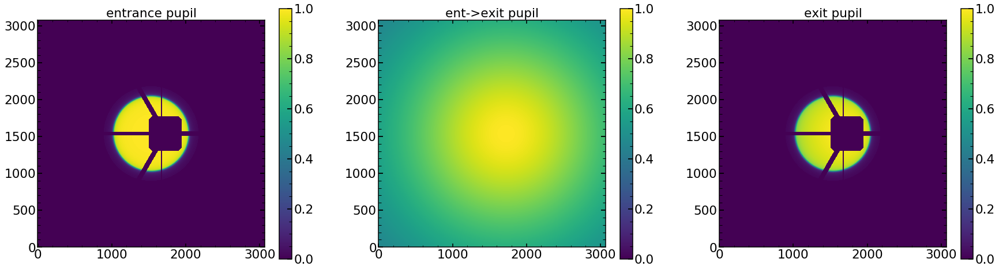

In [9]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

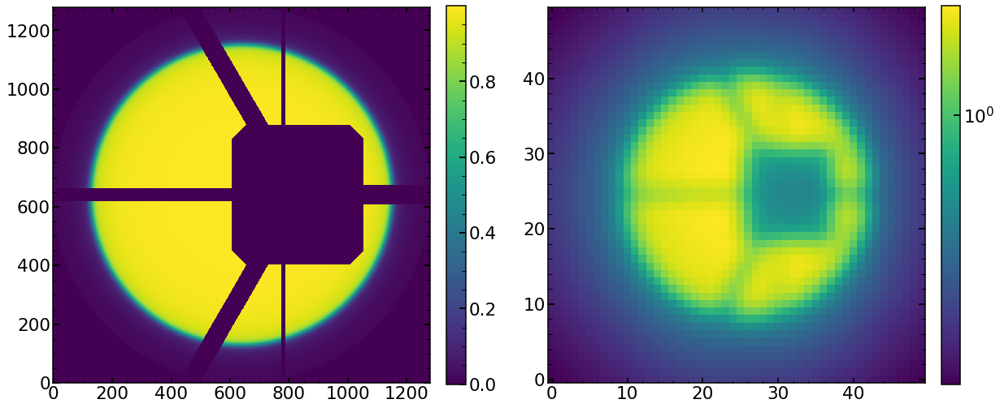

In [10]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(res_iapetus,norm=LogNorm(),origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([1,10**-2,10**-3,10**-4,10**-5,10,10**2,10**3,10**4,10**5])

## Codes

In [8]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

columns11=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

columns11_analysis=columns+['chi2','chi2max']

columns22=['z4','z5','z6','z7','z8','z9','z10','z11',
           'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

columns22_analysis=columns22+['chi2','chi2max']

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c

In [9]:
def create_minchain_err(chain0,likechain0,sci_image,var_image,old=0):
    minchain_err_test=[]
    if len(chain0[0][0])==42:
        columns=columns22
        
    else:
        columns=columns11
    
    
    
    for var_number in range(len(columns)):
        #ravel likelihood
        likechain0_Emcee3_ravel=np.ravel(likechain0)

        # connect chain and lnchain
        chain0_Emcee3_ravel=np.ravel(chain0[:,:,var_number])
        chain0_Emcee3_ravel_argsort=np.argsort(chain0_Emcee3_ravel)  
        chain0_Emcee3_ravel_sort=chain0_Emcee3_ravel[chain0_Emcee3_ravel_argsort]
        likechain0_Emcee3_ravel_sort=likechain0_Emcee3_ravel[chain0_Emcee3_ravel_argsort]

        # move to chi2 space
        chi2_Emcee3_ravel_sort=-(np.array(likechain0_Emcee3_ravel_sort)*(2)-np.log(2*np.pi*np.sum(var_image)))/(sci_image.shape[0])**2
        min_chi2_Emcee3_ravel_sort=np.min(chi2_Emcee3_ravel_sort)

        # simplest standard deviation
        std_chain=np.std(chain0_Emcee3_ravel_sort)

        #best solution
        mean_chain=chain0_Emcee3_ravel_sort[chi2_Emcee3_ravel_sort==np.min(chi2_Emcee3_ravel_sort)][0]

        # step size
        step=std_chain/10

        # create result 3*std in each direction
        try:
            res=[]
            if step==0:
                step=10e-17
            for i in np.arange(mean_chain-30*step,mean_chain+30*step,step):
                selected_chi2_Emcee3_ravel_sort=chi2_Emcee3_ravel_sort[(np.array(chain0_Emcee3_ravel_sort<i+step)&np.array(chain0_Emcee3_ravel_sort>i))]
                if len(selected_chi2_Emcee3_ravel_sort>10):   
                    res.append([i+step/2,np.min(chi2_Emcee3_ravel_sort[(np.array(chain0_Emcee3_ravel_sort<i+step)&np.array(chain0_Emcee3_ravel_sort>i))])])

            res=np.array(res)

            #print(columns[var_number]+' min : '+str(mean_chain))
            #print(columns[var_number]+' std : '+str(std_chain))

            # find low limit and high limit
            res_within2_chi=res[res[:,1]<min_chi2_Emcee3_ravel_sort*2]
            minchain_err_element=[-np.abs(mean_chain-res_within2_chi[0,0]),np.abs(res_within2_chi[-1,0]-mean_chain)]
        except IndexError:
            if var_number!=25:
                print(columns[var_number]+': failed!')
                minchain_err_element=[-mean_chain,mean_chain]

        minchain_err_test.append(minchain_err_element)
        #print(columns[var_number]+' min_err : '+str(minchain_err_element[0]))
        #print(columns[var_number]+' max_err : '+str(minchain_err_element[1]))
    if old==1:
        minchain_err_test=np.mean(np.abs(np.array(minchain_err_test)),axis=1)
        #print(minchain_err_test)
        return minchain_err_test
    else:       
        return np.array(minchain_err_test)
    
    
import scipy.optimize as optimize
def curve_fit_custom_lin(V,index_arr,z4_arr,z4_arr_err_low,z4_arr_err_up):
    a,b=V
    yfit=lin_fit_1D(index_arr,a,b)
    weight=np.ones_like(yfit)
    weight[yfit>z4_arr]=z4_arr_err_up[yfit>z4_arr] # if the fit point is above the measure, use upper weight
    weight[yfit<=z4_arr]=z4_arr_err_low[yfit<=z4_arr] # else use lower weight
    return (yfit-z4_arr)**2/weight**2

def curve_fit_custom_con(V,index_arr,z4_arr,z4_arr_err_low,z4_arr_err_up):
    a=V
    yfit=lin_fit_1DConstant(index_arr,a)
    weight=np.ones_like(yfit)
    weight[yfit>z4_arr]=z4_arr_err_up[yfit>z4_arr] # if the fit point is above the measure, use upper weight
    weight[yfit<=z4_arr]=z4_arr_err_low[yfit<=z4_arr] # else use lower weight
    return (yfit-z4_arr)**2/weight**2 

In [61]:
def create_results_of_fit_single(date,single_number,arc=None,zMax=None,dataset=None):
    """create solution from a single image, create error and lower and upper erros

    @param[in] date             date when the analysis was conducted
    @param[in] single_number    number of the image
    @param[in] arc              which arc was analyzed
    @param[in] zMax             largest Zernike polynomial that you will use
    @param[in] dataset          number of the dataset that you will be using 
    @returns       results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper to be fed to solution_at_0_and_plots
    """
    print(zMax)
    if arc is None:
        arc='HgAr'
    
    if dataset is None:
        if arc=='HgAr':
            obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
        elif arc=='Ne':
            obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
    
    if dataset=='2':
        STAMPS_FOLDER='/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/'
        
        if arc=='HgAr':
            obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
        elif arc=='Ne':
            # different sequence than for HgAr
            obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])

    if dataset==3:
        STAMPS_FOLDER='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/'
        
        if arc=='HgAr':
            obs_possibilites=np.array([19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+54,19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+102,19238+54])
        elif arc=='Ne':
        # different sequence than for HgAr
            obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54])  
            
            
    if zMax==22:
        columns_analysis=columns22_analysis
    else:
        columns_analysis=columns11_analysis
    
    results_of_fit_single=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single_lower=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single_upper=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)

    # arrange all results in one pandas 
    #date='Sep19'
    #date='Sep27'
    RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+str(date)+'/'

    single_defocus_list=obs_possibilites

    #single_number=55
    image_index=single_number
    method='P'
    eps=5

    res_likelihood=[]

    for single_defocus in range(0,len(single_defocus_list)):
        try:
            obs=single_defocus_list[single_defocus]
            try:
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee3.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee3.npy')
                print(str(single_number)+' obs (Emcee3): '+str(obs)+' is found!')
            except:    
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee2.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee2.npy')
                print(str(single_number)+'obs (Emcee2): '+str(obs)+' is found!')

            if obs==8600:
                sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked_Dithered.npy')
                var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked_Dithered.npy')
            else:       
                sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
                var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
                #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
                #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

 
            likechain0=likechain

            chain0=chain
            minchain=chain0[np.abs(likechain0)==np.min(np.abs(likechain0))][0]
            chi2reduced=2*np.min(np.abs(likechain0))/(sci_image.shape[0])**2
            #print(" test0")

            """
            minchain_err=[]
            for i in range(len(columns)):
                #minchain_err=np.append(minchain_err,np.std(chain0[:,:,i].flatten()))
                minchain_err=np.append(minchain_err,np.sqrt(chi2reduced)*np.std(chain0[:,:,i].flatten()))

            minchain_err=np.array(minchain_err)
            """
            minchain_err_old=create_minchain_err(chain0,likechain0,sci_image,var_image,old=1)
            #print(minchain_err_old)
            #print(" test1")
            minchain_err=create_minchain_err(chain0,likechain0,sci_image,var_image)
            #print(" test2")
            results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain,np.array([chi2reduced,np.mean(sci_image**2/var_image)])),axis=0)
            #print(" test3")
            #print(results_of_fit_single.iloc[single_defocus])
            err_results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain_err_old,np.array([1,1])),axis=0)
            #print(" test4")
            err_results_of_fit_single_lower.iloc[single_defocus]=np.concatenate((minchain_err[:,0],np.array([1,1])),axis=0)
            #print(" test5")
            err_results_of_fit_single_upper.iloc[single_defocus]=np.concatenate((minchain_err[:,1],np.array([1,1])),axis=0)
            #print(" test6")
        
        except:
            ValueError
            print(str(single_number)+' '+str(obs)+' '+str(arc)+' is NOT found or failed!')
    #results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    #err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    #err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    #err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]              
    
    return results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper

# have to add new data from May/June 2019
def create_results_of_fit_single_focus(date,single_number,arc=None,zMax=None,dataset=None):
    """create solution from a single image, create error and lower and upper erros

    @param[in] date             date when the analysis was conducted
    @param[in] single_number    number of the image
    @param[in] arc              which arc was analyzed
    @returns       results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper to be fed to solution_at_0_and_plots
    """
    print(zMax)
    if arc is None:
        arc='HgAr'
        
    if arc=='HgAr':
        obs_possibilites=np.array([11748])
        labels=['11748']
    elif arc=='Ne':
        obs_possibilites=np.array([12355])
        labels=['12355']
        
    if dataset==2:
        if arc=='HgAr':
            obs_possibilites=np.array([17017+54])
            labels=['17071']
        elif arc=='Ne':
            obs_possibilites=np.array([16292])
            labels=['16292']
            
    if dataset==3:
        if arc=='HgAr':
            obs_possibilites=np.array([19238+54])
            labels=['19292']
        elif arc=='Ne':
            obs_possibilites=np.array([19472+54 ])
            labels=['19526']
            
            
            
    if zMax==22:
        columns_analysis=columns22_analysis
    else:
        columns_analysis=columns11_analysis        
        

    results_of_fit_single=pd.DataFrame(np.zeros((len(labels),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=labels,columns=columns_analysis)
    err_results_of_fit_single=pd.DataFrame(np.zeros((len(labels),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=labels,columns=columns_analysis)
    err_results_of_fit_single_lower=pd.DataFrame(np.zeros((len(labels),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=labels,columns=columns_analysis)
    err_results_of_fit_single_upper=pd.DataFrame(np.zeros((len(labels),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=labels,columns=columns_analysis)

    # arrange all results in one pandas 
    #date='Sep19'
    #date='Sep27'
    RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+str(date)+'/'

    single_defocus_list=obs_possibilites

    #single_number=55
    image_index=single_number
    method='P'
    eps=5

    res_likelihood=[]

    for single_defocus in range(0,len(single_defocus_list)):
        try:
            obs=single_defocus_list[single_defocus]
            try:
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee3.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee3.npy')
                print(str(single_number)+' obs (Emcee3): '+str(obs)+' is found!')
            except:    
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee2.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee2.npy')
                print(str(single_number)+'obs (Emcee2): '+str(obs)+' is found!')

            if obs==8600:
                sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked_Dithered.npy')
                var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked_Dithered.npy')
            else:       
                sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
                var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
                #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
                #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

 
            likechain0=likechain

            chain0=chain
            minchain=chain0[np.abs(likechain0)==np.min(np.abs(likechain0))][0]
            chi2reduced=2*np.min(np.abs(likechain0))/(sci_image.shape[0])**2
            #print(" test0")

            """
            minchain_err=[]
            for i in range(len(columns)):
                #minchain_err=np.append(minchain_err,np.std(chain0[:,:,i].flatten()))
                minchain_err=np.append(minchain_err,np.sqrt(chi2reduced)*np.std(chain0[:,:,i].flatten()))

            minchain_err=np.array(minchain_err)
            """
            minchain_err_old=create_minchain_err(chain0,likechain0,sci_image,var_image,old=1)
            #print(minchain_err_old)
            #print(" test1")
            minchain_err=create_minchain_err(chain0,likechain0,sci_image,var_image)
            #print(" test2")
            results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain,np.array([chi2reduced,np.mean(sci_image**2/var_image)])),axis=0)
            #print(" test3")
            #print(results_of_fit_single.iloc[single_defocus])
            err_results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain_err_old,np.array([1,1])),axis=0)
            #print(" test4")
            err_results_of_fit_single_lower.iloc[single_defocus]=np.concatenate((minchain_err[:,0],np.array([1,1])),axis=0)
            #print(" test5")
            err_results_of_fit_single_upper.iloc[single_defocus]=np.concatenate((minchain_err[:,1],np.array([1,1])),axis=0)
            #print(" test6")
        
        except:
            ValueError
            print(str(single_number)+' '+str(obs)+' '+str(arc)+' is NOT found or failed!')
    #results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    #err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    #err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    #err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]              
    
    return results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper

In [62]:
def solution_at_0_and_plots(date,single_number,arc,results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,plot=True,zMax=None):
    """create solution at the focus and plot dependence with defocu

    @param[in] date             date when the analysis was conducted
    @param[in] single_number    number of the image
    @param[in] arc              which arc was analyzed
  
    """    
    
    if zMax==22:
        columns_analysis=columns22_analysis
        columns=columns22
        z_addition_factor=11
    else:
        columns_analysis=columns11_analysis
        columns=columns11
        z_addition_factor=0
    
    results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]    
    
    if len(results_of_fit_single)<=7:
        if zMax==22:
            solution_at_0=np.full(31+11,0)

        else:
            solution_at_0=np.full(31,0)       

        return solution_at_0
    else:
        IMAGES_FOLDER='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/'

        solution_at_0=[]

        for q in columns_analysis:

            z4_arr=np.array(results_of_fit_single[q])
            z4_arr_err=np.array(err_results_of_fit_single[q])
            z4_arr_err_up=np.array(err_results_of_fit_single_upper[q])
            z4_arr_err_low=np.array(err_results_of_fit_single_lower[q])
            index_arr=results_of_fit_single[q].index.values.astype(float)
            #print(q)
            #print(index_arr)
            #print(z4_arr)
            #print(z4_arr_err)
            #print(z4_arr_err_up)
            #print(z4_arr_err_low)
            
            z4_arr_no0=z4_arr[np.abs(index_arr)>0.5]
            z4_arr_no0_err=z4_arr_err[np.abs(index_arr)>0.5]
            z4_arr_no0_err_up=z4_arr_err_up[np.abs(index_arr)>0.5]
            z4_arr_no0_err_low=z4_arr_err_low[np.abs(index_arr)>0.5]
            index_arr_no0=index_arr[np.abs(index_arr)>0.5]
            #print(q)
            #print(index_arr_no0)
            #print(z4_arr_no0)
            #print(z4_arr_no0_err)
            #print(z4_arr_no0_err_up)
            #print(z4_arr_no0_err_low)
            
            
            z4_arr_only0=z4_arr[np.abs(index_arr)<=0.5]
            z4_arr_only0_err=z4_arr_err[np.abs(index_arr)<=0.5]
            z4_arr_only0_err_up=z4_arr_err_up[np.abs(index_arr)<=0.5] 
            z4_arr_only0_err_low=z4_arr_err_low[np.abs(index_arr)<=0.5]
            index_arr_only0=index_arr[np.abs(index_arr)<=0.5]

            fit_res=[]
            interim_zero_solutions=[]

            
            if q in columns[:8+z_addition_factor]:
                # these variables are fit via linear fit, without values at focus
                # it is z4-z11
                # for loop below removes 2 points from the fit that create largest deviations from median result in focus
                for l in range(len(index_arr_no0)):
                    #print('good_index'+str(np.delete(index_arr_no0,l)))
                    #print('index_arr_no0'+str(np.delete(z4_arr_no0,l)))
                    #print('z4_arr_no0_err_low'+str(np.delete(z4_arr_no0_err_low,l)))
                    #print('z4_arr_no0_err_up'+str(np.delete(z4_arr_no0_err_up,l)))
                    popt=optimize.leastsq(curve_fit_custom_lin,x0=[1,1],args=(np.delete(index_arr_no0,l),np.delete(z4_arr_no0,l), np.delete(z4_arr_no0_err_low,l),np.delete(z4_arr_no0_err_up,l)))[0]
                    interim_zero_solutions.append([l,lin_fit_1D(0,popt[0],popt[1])])
                interim_zero_solutions_arr=np.array(interim_zero_solutions)
                interim_zero_solutions_arr_dif=np.abs(interim_zero_solutions_arr[:,1]-np.median(interim_zero_solutions_arr[:,1]))
                second_max_dif=np.sort(interim_zero_solutions_arr_dif)[-2]
                interim_zero_solutions_arr=interim_zero_solutions_arr[interim_zero_solutions_arr_dif<second_max_dif]
                #print(interim_zero_solutions_arr[:,0])
                good_index=interim_zero_solutions_arr[:,0].astype(int)
                #print('good_index'+str(good_index))
                #print('index_arr_no0'+str(index_arr_no0))
                #print('z4_arr_no0_err_low'+str(z4_arr_no0_err_low))
                #print('z4_arr_no0_err_up'+str(z4_arr_no0_err_up))
                popt=optimize.leastsq(curve_fit_custom_lin,x0=[1,1],args=(np.array(index_arr_no0)[good_index],np.array(z4_arr_no0)[good_index],np.array(z4_arr_no0_err_low)[good_index],np.array(z4_arr_no0_err_up)[good_index]))[0]
                #print(popt)
                for i in np.linspace(-4.5,4.5,19):
                    fit_res.append(lin_fit_1D(i,popt[0],popt[1]))
                solution_at_0.append(fit_res[9])

            interim_zero_solutions=[]
            if q in columns[8+z_addition_factor:25+z_addition_factor]:
                # these variables are set at mean value (constant fit), without values at focus
                # these are variables that describe the pupil
                for l in range(len(index_arr_no0)):
                    popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(np.delete(index_arr_no0,l),np.delete(z4_arr_no0,l), np.delete(z4_arr_no0_err_low,l),np.delete(z4_arr_no0_err_up,l)))[0]
                    interim_zero_solutions.append([l,popt[0]])
                interim_zero_solutions_arr=np.array(interim_zero_solutions)
                interim_zero_solutions_arr_dif=np.abs(interim_zero_solutions_arr[:,1]-np.median(interim_zero_solutions_arr[:,1]))
                third_max_dif=np.sort(interim_zero_solutions_arr_dif)[-3]
                interim_zero_solutions_arr=interim_zero_solutions_arr[interim_zero_solutions_arr_dif<=(third_max_dif*1.1)]
                #print(interim_zero_solutions_arr[:,0])
                good_index=interim_zero_solutions_arr[:,0].astype(int)
                popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(np.array(index_arr_no0)[good_index],np.array(z4_arr_no0)[good_index],np.array(z4_arr_no0_err_low)[good_index],np.array(z4_arr_no0_err_up)[good_index]))[0]
                fit_res=lin_fit_1DConstant(np.linspace(-4.5,4.5,19),popt[0])
                solution_at_0.append(fit_res[9])

            if q in np.concatenate((np.array(columns[25+z_addition_factor:]),np.array(['chi2','chi2max'])),axis=0):
                # these variables are set at value as measured at 0 - (perhaps is should be close to 0)
                if z4_arr_only0.size==1:
                    for i in np.linspace(-4.5,4.5,19):
                        fit_res.append(z4_arr_only0) 
                    solution_at_0.append(fit_res[9])
                else:
                    # these variables are set at mean value (constant fit), without values at focus
                    popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(index_arr_only0, z4_arr_only0, z4_arr_only0_err_low,z4_arr_only0_err_up))[0]
                    fit_res=lin_fit_1DConstant(np.linspace(-4.5,4.5,19),popt[0])
                    solution_at_0.append(fit_res[9])


            #making plots here
            ######
            #print(q)
            #print(fit_res)
            plt.figure(figsize=(20,10))
            plt.errorbar(index_arr,z4_arr,yerr=[np.abs(z4_arr_err_low),z4_arr_err_up],color='blue',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='single fit results')
            plt.plot(np.linspace(-4.5,4.5,19),fit_res,color='orange',label='fit')
            if q in columns[:8]:
                plt.plot(np.linspace(-4.5,4.5,19),np.zeros((19,1)),':',color='black')
            plt.plot([0], [fit_res[9]], marker='o', markersize=10, color="red",label='prediction for focus')
            #print('prediction for focus: '+str(q)+' '+str(fit_res[9]))
            plt.title(q,size=40)
            plt.legend(fontsize=25)
            plt.xlabel('defocus lab [mm]',size=30)
            plt.ylabel('defocus model',size=30)
            #print(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/')
            if not os.path.exists(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/'):
                os.makedirs(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/')
            plt.savefig(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/'+str(arc)+str(q))

            if not os.path.exists(IMAGES_FOLDER+'Defocus/'+str(q)+'/'):
                os.makedirs(IMAGES_FOLDER+'Defocus/'+str(q)+'/')
            plt.savefig(IMAGES_FOLDER+'Defocus/'+str(q)+'/'+str(arc)+str(single_number))

            plt.close()   
            ######

        solution_at_0=np.array(solution_at_0)[:len(solution_at_0)-2]
        return solution_at_0

In [63]:
def residual_1D(sci_image,var_image,res_iapetus):
    #sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')    
    multiplicative_factor_to_renormalize_to_50000=np.max(sci_image)/50000
    sci_image_smaller=sci_image[:,8:14]/multiplicative_factor_to_renormalize_to_50000
    var_image_smaller=var_image[:,8:14]/multiplicative_factor_to_renormalize_to_50000

    residual_initial_smaller=sci_image_smaller-res_iapetus[:,8:14]/multiplicative_factor_to_renormalize_to_50000
    #residual_RF_smaller=chi_RF_corrected_image[:,8:14]*np.sqrt(var_image_smaller)

    #################################
    # step 5 from Horne, very simplified
    inputimage_smaller=sci_image_smaller
    Px=np.sum(inputimage_smaller,axis=0)/np.sum(inputimage_smaller)
    var_inputimage_smaller=var_image_smaller
    #################################
    # Equation 8 from Horne with modification from Robert abut variance for extraction of signal
    # note that this uses profile from full thing, and not "residual profile"

    # nominator
    weighted_inputimage_smaller=inputimage_smaller*Px/(1)
    # denominator
    weights_array=np.ones((inputimage_smaller.shape[0],inputimage_smaller.shape[1]))*Px**2

    init_lamda=np.array(list(map(np.sum, weighted_inputimage_smaller)))/(np.array(list(map(np.sum,weights_array))))
    init_lamda_boxcar=np.array(list(map(np.sum, inputimage_smaller)))
    # Equation 8.5 from Horne
    var_f_std_lamda=1/np.sum(np.array(Px**2/(var_inputimage_smaller)),axis=1)
    std_init_lamda=np.sqrt(var_f_std_lamda)
    std_init_lamda_boxcar=np.sqrt(np.array(list(map(np.sum, var_inputimage_smaller))))


    #################################
    # Equation 8 from Horne with modification from Robert abut variance for initial removal
    # note that this uses profile from full thing, and not "residual profile"

    # nominator
    weighted_inputimage_smaller=residual_initial_smaller*Px/(1)
    # denominator
    weights_array=np.ones((residual_initial_smaller.shape[0],residual_initial_smaller.shape[1]))*Px**2

    init_removal_lamda=np.array(list(map(np.sum, weighted_inputimage_smaller)))/(np.array(list(map(np.sum,weights_array))))
    init_removal_lamda_boxcar=np.array(list(map(np.sum, residual_initial_smaller)))
    # Equation 8.5 from Horne
    var_init_removal_lamda=1/np.sum(np.array(Px**2/(var_inputimage_smaller)),axis=1)
    std_init_removal_lamda=np.sqrt(var_init_removal_lamda)
    return init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda

def chi_50000(sci_image,var_image,res_iapetus):

    #sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')    
    multiplicative_factor_to_renormalize_to_50000=np.max(sci_image)/50000
    sci_image_renormalized=sci_image/multiplicative_factor_to_renormalize_to_50000
    var_image_renormalized=var_image/multiplicative_factor_to_renormalize_to_50000
    res_iapetus_renormalized=res_iapetus/multiplicative_factor_to_renormalize_to_50000
    

    return np.mean((sci_image_renormalized-res_iapetus_renormalized)**2/var_image_renormalized)

In [64]:
def add_artificial_noise(sci_image,var_image,res_iapetus):
    
    """
    add extra noise so that it has comparable noise as if the max flux in the image (in the single pixel) is 40000
    
    
    """

    
    multi_factor=np.max(sci_image)/40000
    Max_SN_now=np.max(sci_image)/np.max(np.sqrt(var_image))
    dif_in_SN=Max_SN_now/200
    artifical_noise=np.zeros_like(res_iapetus)
    artifical_noise=np.array(artifical_noise)
    for i in range(len(artifical_noise)):
        for j in range(len(artifical_noise)):
            artifical_noise[i,j]=np.random.randn()*np.sqrt((dif_in_SN**2-1)*var_image[i,j])   
            
    if dif_in_SN>1:        
        return (sci_image+artifical_noise),((dif_in_SN**2)*var_image),res_iapetus
    else:
        return (sci_image),((dif_in_SN**2)*var_image),res_iapetus   

## Preparation of scripts

In [87]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  

In [104]:
list_of_Ne_to_analyze=finalNe_May2019.index[(finalNe_May2019['fiber'].values.astype(int)<=464)&(finalNe_May2019['fiber'].values.astype(int)>=255)
                                        &(finalNe_May2019['close'].values.astype(int)==1)]
print(len(list_of_Ne_to_analyze))

list_of_HgAr_to_analyze=finalHgAr_May2019.index[(finalHgAr_May2019['fiber'].values.astype(int)<=464)&(finalHgAr_May2019['fiber'].values.astype(int)>=255)
                                        &(finalHgAr_May2019['close'].values.astype(int)==1)]
print(len(list_of_HgAr_to_analyze))


16
20


### First run

In [148]:
#MPI
for single_spot in list_of_HgAr_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T01S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [17023,17023+108,17023+48,17023+12,17023+102,17023+42,17023+54,17023+12,17023+96,17023+30,17023+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger01'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T01S'+str(single_spot)+'Jun.sh \n')

file.close()

In [149]:
#MPI
for single_spot in list_of_Ne_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T02S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [16238,16238+108,16238+48,16238+12,16238+102,16238+42,16238+54,16238+12,16238+96,16238+30,16238+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger02'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T02S'+str(single_spot)+'Jun.sh \n')

file.close()

### Second run

In [291]:
list_of_Ne_to_analyze=finalNe_May2019.index[(finalNe_May2019['fiber'].values.astype(int)<255)&(finalNe_May2019['fiber'].values.astype(int)>=0)
                                        &(finalNe_May2019['close'].values.astype(int)==1)]
print(len(list_of_Ne_to_analyze))

list_of_HgAr_to_analyze=finalHgAr_May2019.index[(finalHgAr_May2019['fiber'].values.astype(int)<255)&(finalHgAr_May2019['fiber'].values.astype(int)>=0)
                                        &(finalHgAr_May2019['close'].values.astype(int)==1)]
print(len(list_of_HgAr_to_analyze))


12
15


In [292]:
#MPI
for single_spot in list_of_HgAr_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T03S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [17023,17023+108,17023+48,17023+12,17023+102,17023+42,17023+54,17023+12,17023+96,17023+30,17023+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger03'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T03S'+str(single_spot)+'Jun.sh \n')

file.close()

In [293]:
#MPI
for single_spot in list_of_Ne_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T04S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [16238,16238+108,16238+48,16238+12,16238+102,16238+42,16238+54,16238+12,16238+96,16238+30,16238+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger04'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T04S'+str(single_spot)+'Jun.sh \n')

file.close()

### Third run

In [294]:
list_of_Ne_to_analyze=finalNe_May2019.index[(finalNe_May2019['fiber'].values.astype(int)<=np.inf)&(finalNe_May2019['fiber'].values.astype(int)>464)
                                        &(finalNe_May2019['close'].values.astype(int)==1)]
print(len(list_of_Ne_to_analyze))

list_of_HgAr_to_analyze=finalHgAr_May2019.index[(finalHgAr_May2019['fiber'].values.astype(int)<=np.inf)&(finalHgAr_May2019['fiber'].values.astype(int)>464)
                                        &(finalHgAr_May2019['close'].values.astype(int)==1)]
print(len(list_of_HgAr_to_analyze))


12
15


In [295]:
#MPI
for single_spot in list_of_HgAr_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T05S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [17023,17023+108,17023+48,17023+12,17023+102,17023+42,17023+54,17023+12,17023+96,17023+30,17023+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger05'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T05S'+str(single_spot)+'Jun.sh \n')

file.close()

In [296]:
#MPI
for single_spot in list_of_Ne_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T06S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [16238,16238+108,16238+48,16238+12,16238+102,16238+42,16238+54,16238+12,16238+96,16238+30,16238+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger06'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T06S'+str(single_spot)+'Jun.sh \n')

file.close()

## which images are avaliable

In [17]:
import glob
Emcee3_Ne=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Jun13/chainJun13_Single_P_*5NeEmcee3.npy', recursive=True)
Emcee3_HgAr=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Jun13/chainJun13_Single_P_*5HgArEmcee3.npy', recursive=True)

In [18]:
analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][90:len(Emcee3_Ne[i])-13]
    analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:])])
    
analyzed_Neon_images=np.array(analyzed_Neon_images)

analyzed_HgAr_images=[]
for i in range(len(Emcee3_HgAr)):
    single_string=Emcee3_HgAr[i][90:len(Emcee3_HgAr[i])-15]
    analyzed_HgAr_images.append([int(single_string[:5]),int(single_string[5:])])
    
analyzed_HgAr_images=np.array(analyzed_HgAr_images)

In [19]:
single_string

'1702349'

In [20]:
arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]

arranged_by_defocus_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,0].argsort()]
arranged_by_spot_number_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,1].argsort()]

In [21]:
arranged_by_defocus_HgAr[arranged_by_defocus_HgAr[:,0]==17023]

array([[17023,    49],
       [17023,   111],
       [17023,    39],
       [17023,    66],
       [17023,    73],
       [17023,    99],
       [17023,    57],
       [17023,    42],
       [17023,    33],
       [17023,    83],
       [17023,    18],
       [17023,    45],
       [17023,    69],
       [17023,    61],
       [17023,    21],
       [17023,    81],
       [17023,     6],
       [17023,    59],
       [17023,    63],
       [17023,    93],
       [17023,     1],
       [17023,    15],
       [17023,    71],
       [17023,    27],
       [17023,     9],
       [17023,    78],
       [17023,   119],
       [17023,    23],
       [17023,    13],
       [17023,    25],
       [17023,    30],
       [17023,    11],
       [17023,     3],
       [17023,    90],
       [17023,    37],
       [17023,    97],
       [17023,    54],
       [17023,    85],
       [17023,    75]])

In [22]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(finalHgAr.iloc[arranged_by_defocus_HgAr[arranged_by_defocus_HgAr[:,0]==17023][:,1]])

NameError: name 'finalHgAr' is not defined

## Analysis of a single

In [35]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalHgAr_Feb2019.pkl', 'rb') as f:
    finalHgAr_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalNe_Feb2019.pkl', 'rb') as f:
    finalNe_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  


dataset=2
date='Jun13'
obs=17023
single_number='57'
image_index=int(single_number)
eps=5
arc='HgAr'

STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
"""

if arc=="HgAr":
    single_number_focus=11748
elif arc=="Ne":
    single_number_focus=11748+607    
else:
    print("Not recognized arc-line")
"""
if arc=="HgAr":
    single_number_focus=17017+54
elif arc=="Ne":
    single_number_focus=16292  
else:
    print("Not recognized arc-line")

"""
if arc=='HgAr':
    obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
elif arc=='Ne':
    obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
"""

if arc=='HgAr':
    obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
elif arc=='Ne':
    # different sequence than for HgAr
    obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])    
    
    
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

"""
if arc=="HgAr":
    finalArc=finalHgAr_Feb2019
elif arc=="Ne":
    finalArc=finalNe_Feb2019    
else:
    print("Not recognized arc-line")    
"""    

if arc=="HgAr":
    finalArc=finalHgAr_May2019
elif arc=="Ne":
    finalArc=finalNe_May2019    
else:
    print("Not recognized arc-line")   

finalArc.loc[int(single_number)]

m4


fiber                         339
xc                           1609
yc                           3343
wavelength               912.5693
close                           1
lamp                         HgAr
xc_effective                 1609
old_index_approx               81
superold_index_approx        22.0
Name: 57, dtype: object

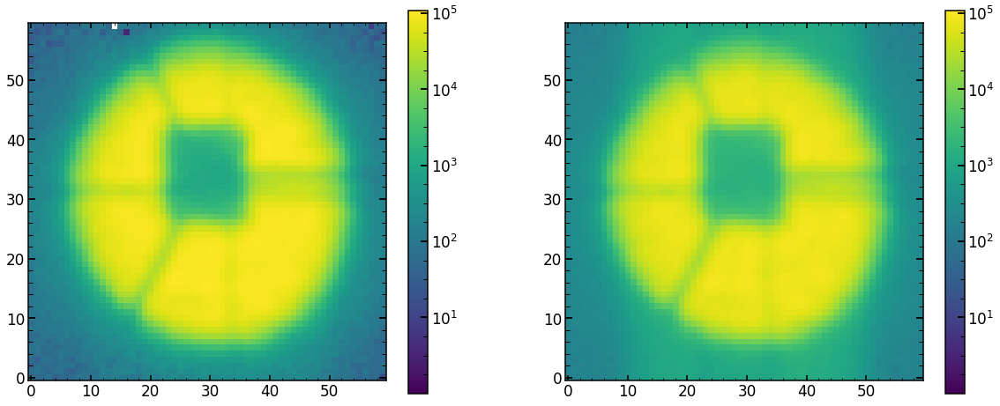

In [36]:
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(122)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [37]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (252, 20, 42)
minimal likelihood is: 226051.65663382504
minimal chi2 reduced is: 125.57868470970415


In [38]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
    
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)


(42,)
          z4        z5        z6        z7        z8        z9       z10  \
0  30.807583 -0.846584 -1.830664  0.074943 -0.112644 -0.172438 -0.370067   

        z11  
0 -0.184907  
        z12       z13       z14       z15       z16      z17       z18  \
0  0.042334  0.073043  0.056612  0.047236  0.011504  0.03272  0.010283   

        z19       z20       z21  
0  0.000984 -0.051034  0.031003  
        z22   hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.056513  0.662689   0.085071 -0.038019  0.145088  0.058087     0.024873   

   radiometricEffect  radiometricExponent    x_ilum    ...     frd_sigma  \
0           0.000008             0.000008  0.973406    ...      0.042007   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.922987  1.067026              0.1614     39056.5043   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0           2.56747              0.004134      0.378546  1.870906

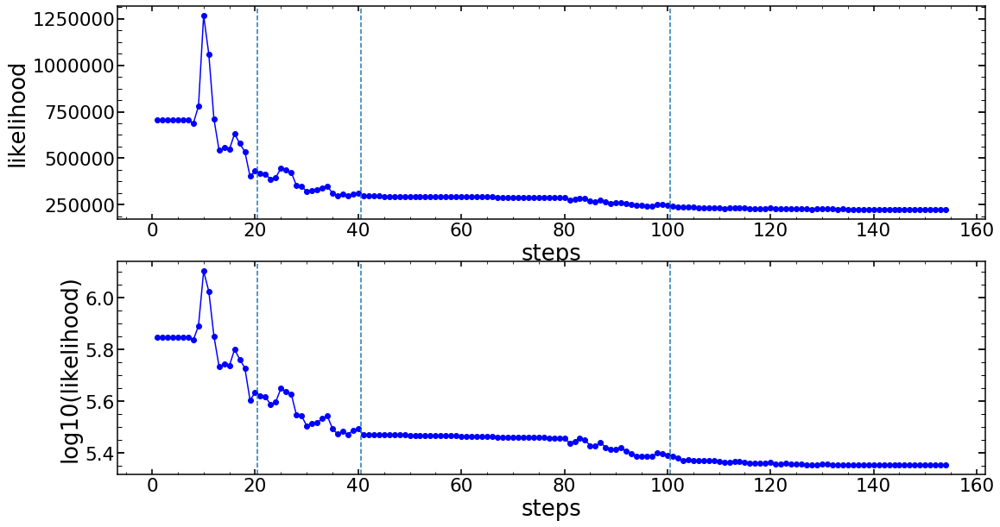

In [39]:
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')

In [40]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   
       
model(minchain)

extraZernike: None
zmax: 22
42


-226051.65663382478

In [41]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
r_ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'r_ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')

wf=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf.npy') 
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
u_manual=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u_manual.npy')
wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')   
expwf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'expwf_grid.npy')      

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')
res_init=np.load(TESTING_FINAL_IMAGES_FOLDER+'res_init.npy')
res=np.load(TESTING_FINAL_IMAGES_FOLDER+'res.npy')


optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

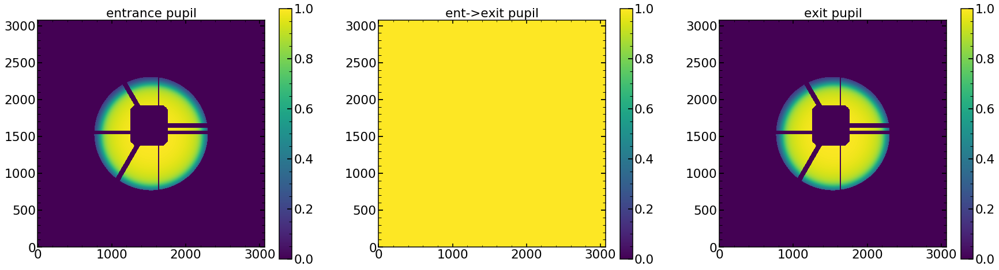

In [42]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

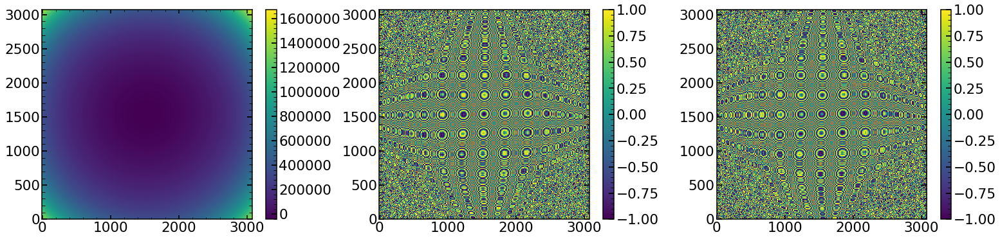

In [43]:
plt.figure(figsize=(36,6))
plt.subplot(141)
plt.imshow(wf_full)
plt.colorbar()

plt.subplot(142)
plt.imshow(np.real(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

plt.subplot(143)
plt.imshow(np.imag(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

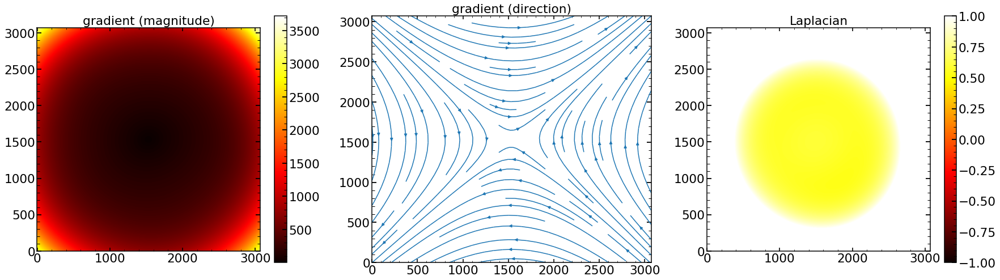

In [44]:
plt.figure(figsize=(30,8))
plt.subplot(131)
vgrad = np.gradient(wf_full)
fulgrad = np.sqrt(vgrad[0]**2 + vgrad[1]**2)
plt.title('gradient (magnitude)')
plt.imshow(fulgrad,cmap=plt.get_cmap('hot'), vmin = np.amin(fulgrad),vmax = np.amax(fulgrad))  
plt.colorbar()
plt.subplot(132)
x, y = range(0, len(wf_full)), range(0,len(wf_full))
xi, yi = np.meshgrid(x, y)
plt.title('gradient (direction)')
plt.streamplot(xi, yi, vgrad[0], vgrad[1])
plt.subplot(133)
laplace_of_wf = scipy.ndimage.filters.laplace(wf_full)
plt.title('Laplacian')
plt.imshow(laplace_of_wf,cmap=plt.get_cmap('hot'), vmin = -1,vmax = 1) 
plt.colorbar()

Text(0.5,1,'Residual')

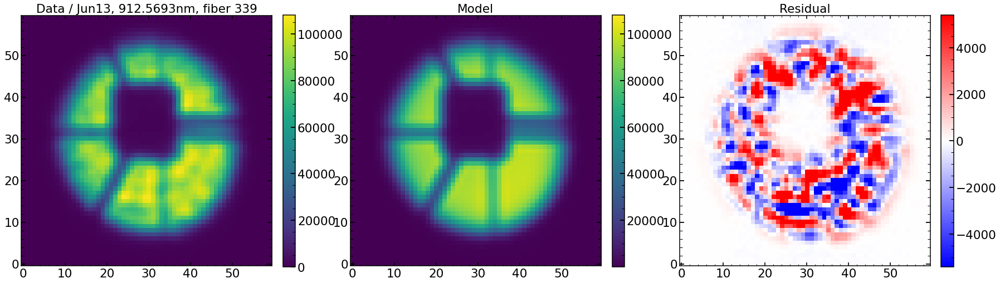

In [45]:
plt.figure(figsize=(30,12))
plt.subplot(1,3,1)
plt.imshow(sci_image,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(1,3,2)
plt.imshow(res_iapetus,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image-res_iapetus,vmin=-np.max(sci_image)/20,vmax=np.max(sci_image)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

chi**2 reduced is: 125.57868449275675
Abs of residual divided by total flux is: 0.050782532785287895
Abs of residual divided by largest value of a flux in the image is: 0.1687519750891299


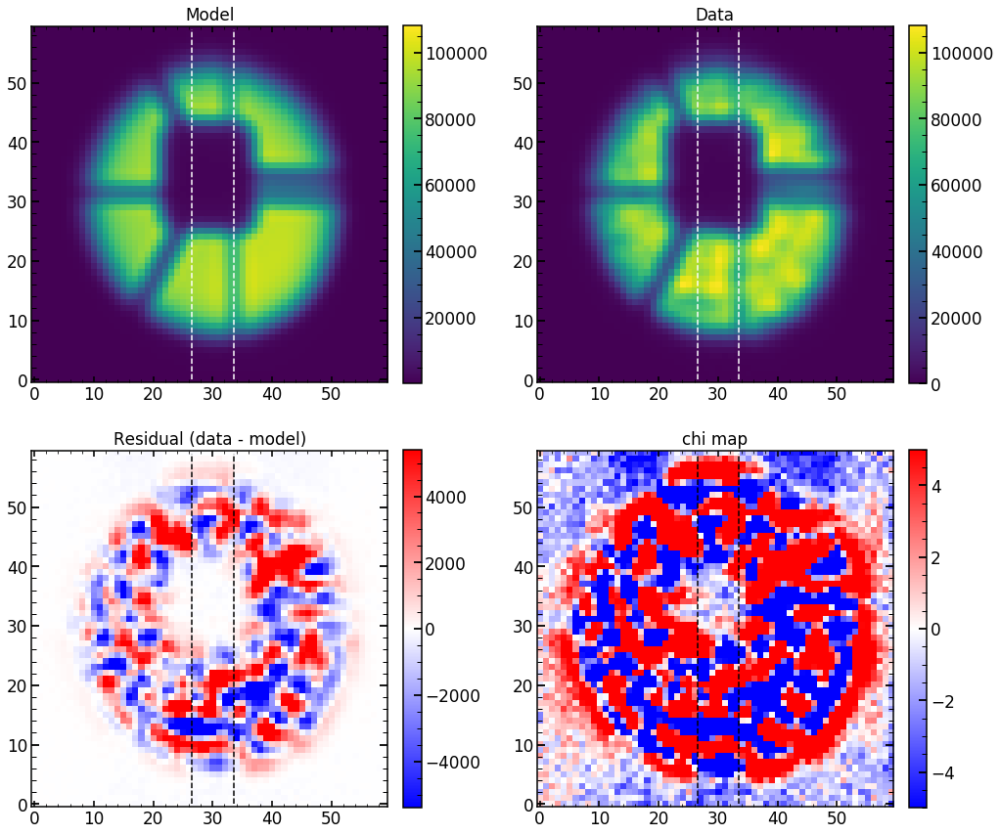

In [46]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

125.57868449275675
chi**2 reduced is: 125.57868449275675
Abs of residual divided by total flux is: 0.050782532785287895
Abs of residual divided by largest value of a flux in the image is: 0.1687519750891299


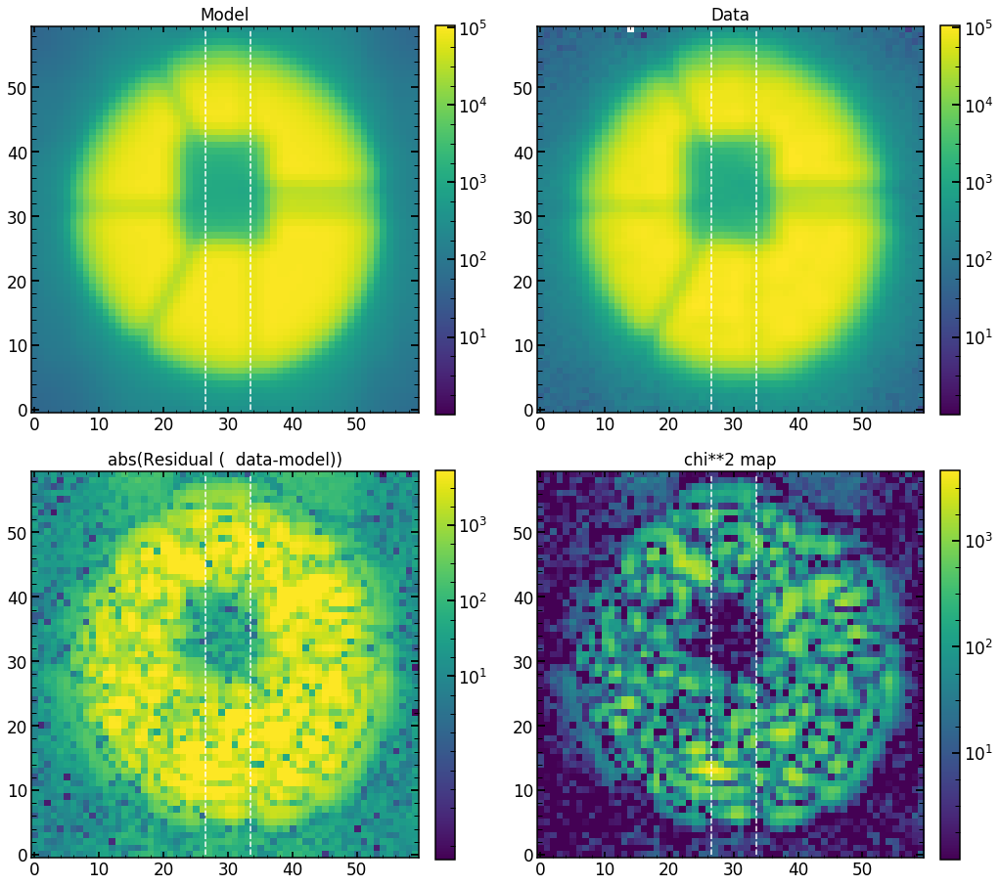

In [47]:
single_analysis.create_basic_comparison_plot_log()

125.57868449275675
chi**2 reduced is: 125.57868449275675
Abs of residual divided by total flux is: 0.050782532785287895
Abs of residual divided by largest value of a flux in the image is: 0.1687519750891299


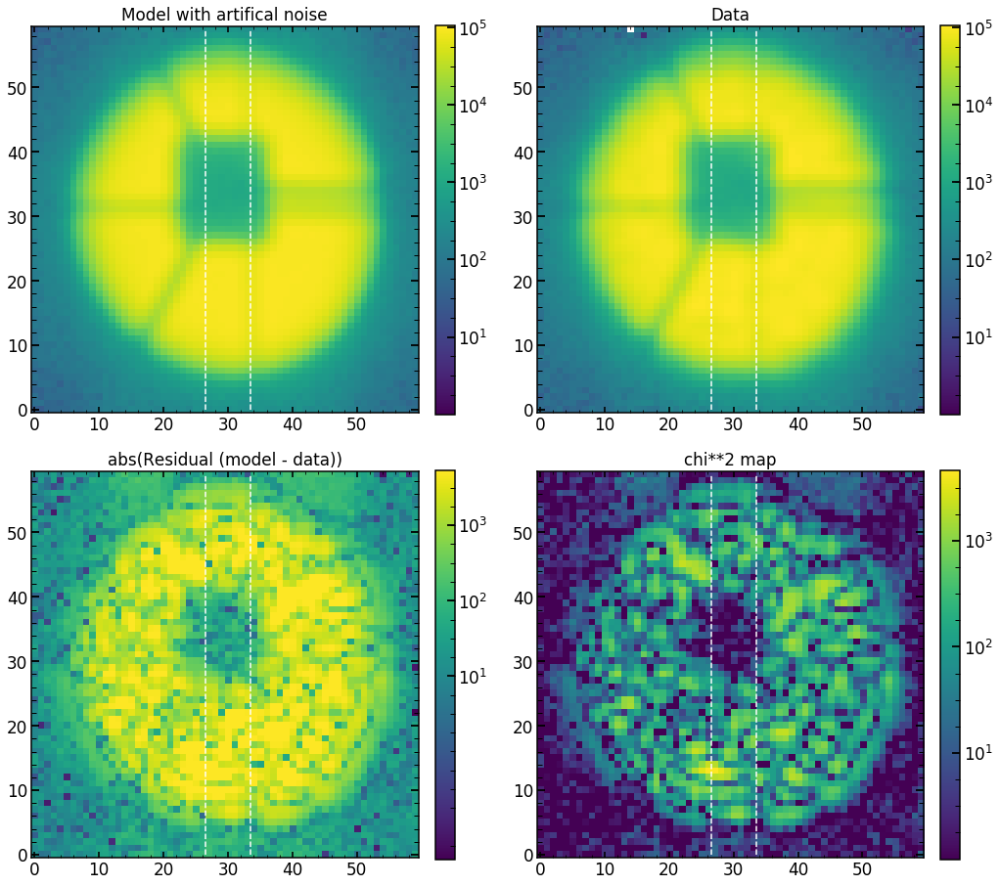

In [48]:
single_analysis.create_basic_comparison_plot_log_artifical()

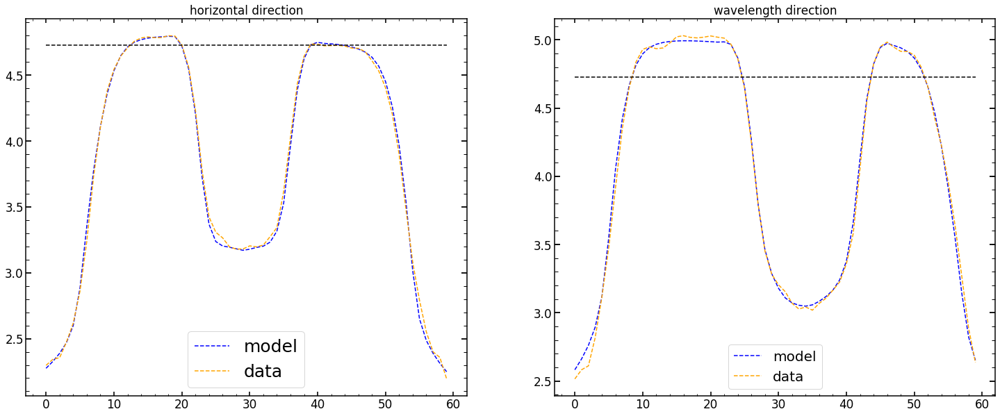

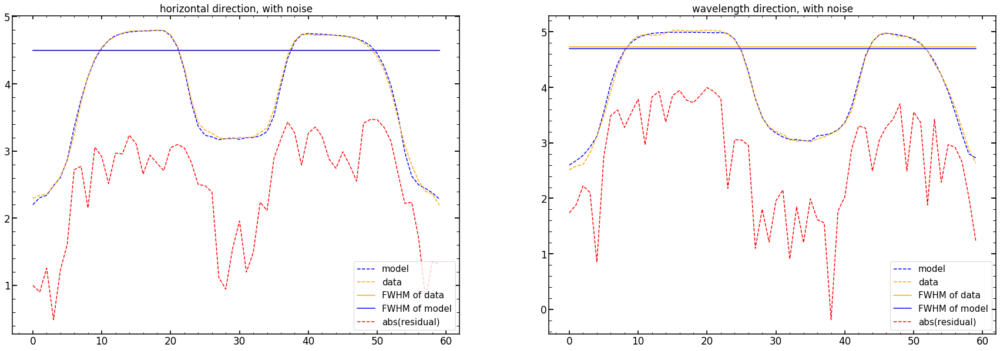

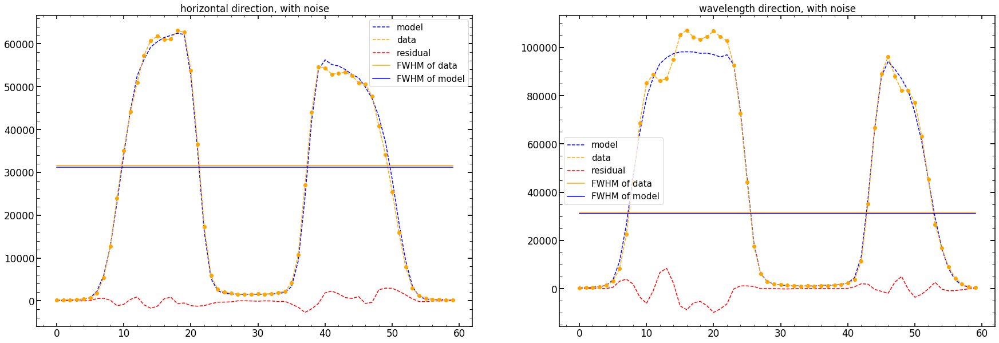

In [49]:
single_analysis.create_cut_plots()

## Creating  results everywhere

In [134]:
#single_number_for_single_pos_full=np.load("/Users/nevencaplar/Documents/PFS/2017-12-15/single_number_for_single_pos_full.npy") 

finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019
date='Jun13'


results_of_fit_many_single_defocus_HgAr=pd.DataFrame(np.zeros((len(finalHgAr),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalHgAr.index,columns=columns22_analysis)
err_results_of_fit_many_single_defocus_HgAr=pd.DataFrame(np.zeros((len(finalHgAr),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalHgAr.index,columns=columns22_analysis)

results_of_fit_many_single_defocus_HgAr_pd=pd.DataFrame(results_of_fit_many_single_defocus_HgAr)
err_results_of_fit_many_single_defocus_HgAr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_HgAr)

results_of_fit_many_HgAr = {'m4': results_of_fit_many_single_defocus_HgAr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_HgAr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']

for single_number in range(1,len(finalHgAr)):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single(date,single_number,'HgAr',22,'f28May2019')
    solution_at_0=solution_at_0_and_plots(date,single_number,'HgAr',results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,False,22)
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
        #print(single_number,i)
        if len(results_of_fit_single)<=4:
            pass
        else:
            if i<18:
                results_of_fit_many_HgAr[label[i]].at[single_number]=results_of_fit_single.iloc[i]    
            else:
                results_of_fit_many_HgAr[label[18]].at[single_number]=np.concatenate((solution_at_0,np.array([1,1]))) 
            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:        
    results_of_fit_many_HgAr[label[i]]=results_of_fit_many_HgAr[label[i]][np.abs(results_of_fit_many_HgAr[label[i]]['z4'])>0]


22
1 obs (Emcee3): 17023 is found!
radiometricExponent: failed!
radiometricExponent: failed!
1 17029 HgAr is NOT found or failed!
1 obs (Emcee3): 17035 is found!
x_ilum: failed!
x_ilum: failed!
1 17041 HgAr is NOT found or failed!
1 17047 HgAr is NOT found or failed!
1 obs (Emcee3): 17053 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
1 17059 HgAr is NOT found or failed!
1 obs (Emcee3): 17065 is found!
radiometricExponent: failed!
x_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
1 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
1 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
1 obs (Emcee3): 17077 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponen

[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.2612243  -0.07081902 -0.12884255 -0.30403251]
z4_arr_no0_err_up[0.22103595 0.06833414 0.10171781 0.26928594]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.25009755 -0.05207564 -0.11842105 -0.37470036]
z4_arr_no0_err_up[0.20129803 0.05031036 0.11842105 0.48572269]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.09279959 -0.05332868 -0.07504064 -0.18527573]
z4_arr_no0_err_up[0.16117823 0.05914635 0.05723439 0.14727045]
[1. 3.]
good_index[1 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.16212701 -0.07290323 -0.04435558 -0.27571319]
z4_arr_no0_err_up[0.11467521 0.06796064 0.06085998 0.20887363]
[2. 3.]
good_index[2 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.05809666 -0.10275854 -0.08647106 -0.22085829]
z4_arr_no0_err_up[0.08822086 0.10678829 0.09299718 0.20747294]
[0. 2.]
good_index[0 2]
index_arr_no0[-4.  -1.5  1

[0. 2.]
good_index[0 2]
index_arr_no0[-4.  -3.  -1.5  1.5]
z4_arr_no0_err_low[-0.0714604  -0.04380511 -0.07179942 -0.0479558 ]
z4_arr_no0_err_up[0.02382013 0.01684812 0.07935725 0.06091682]
[0. 2.]
good_index[0 2]
index_arr_no0[-4.  -3.  -1.5  1.5]
z4_arr_no0_err_low[-0.04103125 -0.07305876 -0.08876866 -0.02133932]
z4_arr_no0_err_up[0.08662154 0.03933933 0.11680087 0.03427224]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -3.  -1.5  1.5]
z4_arr_no0_err_low[-0.02093078 -0.07824415 -0.08470854 -0.0570071 ]
z4_arr_no0_err_up[0.03615316 0.01380779 0.06437849 0.06804073]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -3.  -1.5  1.5]
z4_arr_no0_err_low[-0.0646774  -0.03763541 -0.06127623 -0.04004411]
z4_arr_no0_err_up[0.07462777 0.03763541 0.04166783 0.04489794]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -3.  -1.5  1.5]
z4_arr_no0_err_low[-0.08414763 -0.01114738 -0.06382192 -0.04245982]
z4_arr_no0_err_up[0.18031635 0.06316849 0.05361041 0.03210377]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -3.  -1

[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.08525344 -0.01543694 -0.00700318 -0.00295995 -0.00723522]
z4_arr_no0_err_up[0.04038321 0.01543694 0.00700318 0.00295995 0.00723522]
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.08428112 -0.01112973 -0.00892056 -0.00187967 -0.00787069]
z4_arr_no0_err_up[0.11799357 0.01112973 0.00892056 0.00187967 0.00787069]
[0. 2. 3.]
good_index[0 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.09891026 -0.01138454 -0.00360178 -0.01061732 -0.01142055]
z4_arr_no0_err_up[0.0836933  0.01138454 0.00360178 0.00212346 0.01142055]
22
10 17023 HgAr is NOT found or failed!
10 17029 HgAr is NOT found or failed!
10 17035 HgAr is NOT found or failed!
10 17041 HgAr is NOT found or failed!
10 17047 HgAr is NOT found or failed!
10 17053 HgAr is NOT found or failed!
10 17059 HgAr is NOT found or failed!
10 17065 HgAr is NOT found or failed!
10 17071 HgAr is NOT fou

x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
13 obs (Emcee3): 17077 is found!
radiometricExponent: failed!
x_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
13 17083 HgAr is NOT found or failed!
13 obs (Emcee3): 17089 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
13 17095 HgAr is NOT found or failed!
13 17101 HgAr is NOT found or failed!
13 17107 HgAr is NOT found or failed!
13 17113 HgAr is NOT found or failed!
13 obs (Emcee3): 17119 is found!
radiometricExponent: failed!
y_ilum: failed!
radiometricExponent: failed!
y_ilum: failed!
13 obs (Emcee3): 17071 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
13 17071 HgAr is NOT found or failed!
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.47742036 -0.02192002 -0.0855757  -0.13411026 -0.24227536]
z4_arr_no0_err_up[0.37132694 0.02192002 0.04607922 0.10856545

[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.06864135 -0.05249066 -0.05103568 -0.03339199 -0.15198318]
z4_arr_no0_err_up[0.06631453 0.09384693 0.05703988 0.03862994 0.12592892]
[0. 1. 3.]
good_index[0 1 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.08629869 -0.15007577 -0.03445786 -0.0527373  -0.16756856]
z4_arr_no0_err_up[0.09892777 0.15777196 0.03305142 0.05452501 0.14945304]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.17066536 -0.0693467  -0.11542013 -0.04075086 -0.18551527]
z4_arr_no0_err_up[0.15909483 0.0693467  0.10636757 0.03798809 0.21110358]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.10001181 -0.18298545 -0.06450977 -0.04781789 -0.14618453]
z4_arr_no0_err_up[0.13112659 0.24572332 0.09283114 0.05531873 0.18126882]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0997221  -0.06852

[0. 2. 3.]
good_index[0 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.2205058  -0.11019201 -0.10572769 -0.0585339  -0.21581624]
z4_arr_no0_err_up[0.25578673 0.01001746 0.09114456 0.04326419 0.27747802]
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.16542598 -0.00812013 -0.05829297 -0.02169575 -0.11526844]
z4_arr_no0_err_up[0.07964954 0.00812013 0.06843088 0.05544469 0.18620286]
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.14975197 -0.0070462  -0.09411441 -0.01900059 -0.0464604 ]
z4_arr_no0_err_up[0.19582951 0.00234873 0.09411441 0.02065281 0.0585805 ]
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.10587264 -0.00268694 -0.04626156 -0.03271586 -0.06983838]
z4_arr_no0_err_up[0.11701712 0.01343472 0.03145786 0.02133643 0.06983838]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.10209313 -0.00720

x_ilum: failed!
y_ilum: failed!
23 17071 HgAr is NOT found or failed!
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.71294076 -0.37721209 -0.2101431  -0.12815723 -0.52019406]
z4_arr_no0_err_up[0.61346065 0.35682224 0.15315514 0.11048037 0.52019406]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.20435256 -0.19006342 -0.10291655 -0.16145042 -0.50650829]
z4_arr_no0_err_up[0.28989549 0.19006342 0.11456748 0.13782353 0.58443264]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.34671458 -0.46220473 -0.15674801 -0.1344853  -0.34524254]
z4_arr_no0_err_up[0.51584364 0.43850193 0.12475862 0.14643955 0.41667203]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.21424131 -0.07918724 -0.07978426 -0.10844271 -0.223336  ]
z4_arr_no0_err_up[0.32442256 0.09728718 0.0865744  0.07152604 0.17139739]
[0. 1. 4.]
good_index[0 1 4]
index_arr

[0. 1. 3.]
good_index[0 1 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.08588758 -0.12917985 -0.08213282 -0.0569676  -0.07970278]
z4_arr_no0_err_up[0.04068359 0.09227132 0.00432278 0.0569676  0.13283796]
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0393809  -0.04435899 -0.01575484 -0.00978162 -0.0279706 ]
z4_arr_no0_err_up[0.05650304 0.03071007 0.0367613  0.01323395 0.0279706 ]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.03932771 -0.0645994  -0.03265697 -0.0190453  -0.03102014]
z4_arr_no0_err_up[0.06554618 0.09331024 0.01959418 0.02783544 0.02538011]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04865723 -0.06938855 -0.03332014 -0.0292475  -0.03282353]
z4_arr_no0_err_up[0.07938811 0.06938855 0.02887746 0.02367655 0.05470588]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.07412975 -0.12612

[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0871495  -0.07744718 -0.00100442 -0.02852546 -0.0662604 ]
z4_arr_no0_err_up[0.08081135 0.04856857 0.00100442 0.02659153 0.05979597]
[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.05211281 -0.04917185 -0.00218539 -0.0280579  -0.06302647]
z4_arr_no0_err_up[0.05407934 0.06009892 0.00218539 0.02907818 0.07595498]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0454879  -0.10273755 -0.00263367 -0.0452241  -0.13341741]
z4_arr_no0_err_up[0.0454879  0.09399393 0.00263367 0.0452241  0.12579356]
[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04093388 -0.0914901  -0.00112382 -0.05721586 -0.07089588]
z4_arr_no0_err_up[0.04237015 0.06034454 0.00112382 0.05333682 0.07494708]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04145104 -0.04040

[0. 1. 3.]
good_index[0 1 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.06802493 -0.02558755 -0.00794406 -0.01890233 -0.02114095]
z4_arr_no0_err_up[0.09523491 0.0202007  0.02610191 0.01308623 0.05366548]
22
31 17023 HgAr is NOT found or failed!
31 17029 HgAr is NOT found or failed!
31 17035 HgAr is NOT found or failed!
31 17041 HgAr is NOT found or failed!
31 17047 HgAr is NOT found or failed!
31 17053 HgAr is NOT found or failed!
31 17059 HgAr is NOT found or failed!
31 17065 HgAr is NOT found or failed!
31 17071 HgAr is NOT found or failed!
31 17071 HgAr is NOT found or failed!
31 17077 HgAr is NOT found or failed!
31 17083 HgAr is NOT found or failed!
31 17089 HgAr is NOT found or failed!
31 17095 HgAr is NOT found or failed!
31 17101 HgAr is NOT found or failed!
31 17107 HgAr is NOT found or failed!
31 17113 HgAr is NOT found or failed!
31 17119 HgAr is NOT found or failed!
31 17071 HgAr is NOT found or failed!
22
32 17023 HgAr is NOT found or failed!
32 17029 Hg

y_ilum: failed!
37 17029 HgAr is NOT found or failed!
37 obs (Emcee3): 17035 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
37 17041 HgAr is NOT found or failed!
37 17047 HgAr is NOT found or failed!
37 obs (Emcee3): 17053 is found!
radiometricExponent: failed!
radiometricExponent: failed!
37 17059 HgAr is NOT found or failed!
37 obs (Emcee3): 17065 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
37 obs (Emcee3): 17071 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
37 obs (Emcee3): 17071 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
37 obs (Emcee3): 17077 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
37 17083 HgAr is NOT found or failed!
37 obs (Emcee3): 17089 is found!
radiometricExponent: failed!
y_ilum: failed!
radiometricExponent: failed!
y_ilum: failed!
37 17095 HgAr is NOT found or failed!

[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.31028495 -0.2129777  -0.04001734 -0.09635592 -0.43100764]
z4_arr_no0_err_up[0.2951491  0.18409937 0.03838398 0.09635592 0.37598539]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.29649952 -0.15972696 -0.10159125 -0.09106843 -0.36635035]
z4_arr_no0_err_up[0.30911652 0.1923243  0.08804575 0.10321089 0.49956866]
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.07954099 -0.05846422 -0.08072956 -0.09911366 -0.20914757]
z4_arr_no0_err_up[0.09433931 0.05405183 0.10840826 0.13599317 0.10670795]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.10517727 -0.07778623 -0.07226376 -0.12877325 -0.18517498]
z4_arr_no0_err_up[0.07565383 0.08537514 0.03408668 0.08075611 0.20906853]
[1. 2. 3.]
good_index[1 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04741597 -0.08881

[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.14387062 -0.06078657 -0.03937664 -0.08689965 -0.27148505]
z4_arr_no0_err_up[0.09033737 0.08174746 0.05023916 0.08090657 0.19104503]
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.08942454 -0.07355546 -0.03256229 -0.04230509 -0.09472545]
z4_arr_no0_err_up[0.07211656 0.04126282 0.02913468 0.0324667  0.08931256]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.10440496 -0.1360751  -0.03215594 -0.04298831 -0.0956747 ]
z4_arr_no0_err_up[0.05925687 0.10792163 0.02958347 0.03112946 0.0956747 ]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.05771192 -0.04702542 -0.01661237 -0.04224489 -0.04549821]
z4_arr_no0_err_up[0.05459235 0.06747125 0.02452303 0.03767788 0.0623494 ]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.08034187 -0.05993

[0. 1. 3.]
good_index[0 1 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.06379277 -0.00420348 -0.00191821 -0.05017733 -0.01298803]
z4_arr_no0_err_up[0.00911325 0.02942438 0.00575464 0.00885482 0.01298803]
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.01374805 -0.02337545 -0.00251838 -0.04017088 -0.03512825]
z4_arr_no0_err_up[0.00458268 0.04207581 0.00755515 0.02781061 0.03512825]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00679271 -0.00171722 -0.00196146 -0.01361486 -0.00497185]
z4_arr_no0_err_up[0.02037813 0.0085861  0.00196146 0.02269144 0.00497185]
[0. 2. 3.]
good_index[0 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00439208 -0.00254171 -0.00259278 -0.02220338 -0.00750894]
z4_arr_no0_err_up[0.0219604  0.00762512 0.00259278 0.01537157 0.00750894]
[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0046539  -0.04168

49 17029 HgAr is NOT found or failed!
49 obs (Emcee3): 17035 is found!
radiometricExponent: failed!
x_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
49 17041 HgAr is NOT found or failed!
49 17047 HgAr is NOT found or failed!
49 obs (Emcee3): 17053 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
49 17059 HgAr is NOT found or failed!
49 obs (Emcee3): 17065 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
49 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
49 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
49 obs (Emcee3): 17077 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometric

51 obs (Emcee3): 17119 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
51 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
51 17071 HgAr is NOT found or failed!
[0. 3.]
good_index[0 3]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.2362402  -0.13440609 -0.15914906 -0.46425212]
z4_arr_no0_err_up[0.19228854 0.12843248 0.16473324 0.38896799]
[0. 3.]
good_index[0 3]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.10910485 -0.06774045 -0.02947997 -0.13741035]
z4_arr_no0_err_up[0.08321557 0.06171908 0.02947997 0.1640059 ]
[0. 3.]
good_index[0 3]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.12317346 -0.04026065 -0.07320186 -0.50824422]
z4_arr_no0_err_up[0.12782151 0.03633278 0.07320186 0.39835358]
[1. 3.]
good_index[1 3]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.1

[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.09951556 -0.06705082 -0.02096995 -0.03271905 -0.11072071]
z4_arr_no0_err_up[0.09951556 0.06017381 0.02759203 0.03470202 0.14352685]
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.14660945 -0.11892498 -0.03178087 -0.03083672 -0.08375563]
z4_arr_no0_err_up[0.1593581  0.08056209 0.01398358 0.04682613 0.10406003]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.05718477 -0.04284463 -0.04905591 -0.04046581 -0.06610603]
z4_arr_no0_err_up[0.06027584 0.03737511 0.02057183 0.05874069 0.06949609]
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.01176653 -0.03471844 -0.05045528 -0.04483831 -0.08686142]
z4_arr_no0_err_up[0.02711417 0.04034846 0.03290562 0.04793061 0.09625185]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.02828363 -0.06402

[1. 2. 3.]
good_index[1 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04929536 -0.05268809 -0.03387199 -0.03607203 -0.01119606]
z4_arr_no0_err_up[0.00704219 0.09321739 0.01539636 0.06012005 0.01119606]
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.01951285 -0.0331338  -0.04433188 -0.02057297 -0.00593497]
z4_arr_no0_err_up[0.00278755 0.02429812 0.03751159 0.02331603 0.00593497]
[1. 2. 3.]
good_index[1 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00991887 -0.04686924 -0.00720738 -0.03019258 -0.00486813]
z4_arr_no0_err_up[0.00991887 0.0593677  0.01201229 0.02701441 0.00486813]
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.03207275 -0.02815468 -0.0086703  -0.01848901 -0.0051659 ]
z4_arr_no0_err_up[0.02624134 0.0347793  0.02254277 0.03271133 0.0051659 ]
[1. 2. 3.]
good_index[1 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00301065 -0.02085

[0. 1. 3.]
good_index[0 1 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0376668  -0.0510316  -0.02939203 -0.02184597 -0.05822842]
z4_arr_no0_err_up[0.03238023 0.03312578 0.04229585 0.02184597 0.05490108]
22
60 17023 HgAr is NOT found or failed!
60 17029 HgAr is NOT found or failed!
60 17035 HgAr is NOT found or failed!
60 17041 HgAr is NOT found or failed!
60 17047 HgAr is NOT found or failed!
60 17053 HgAr is NOT found or failed!
60 17059 HgAr is NOT found or failed!
60 17065 HgAr is NOT found or failed!
60 17071 HgAr is NOT found or failed!
60 17071 HgAr is NOT found or failed!
60 17077 HgAr is NOT found or failed!
60 17083 HgAr is NOT found or failed!
60 17089 HgAr is NOT found or failed!
60 17095 HgAr is NOT found or failed!
60 17101 HgAr is NOT found or failed!
60 17107 HgAr is NOT found or failed!
60 17113 HgAr is NOT found or failed!
60 17119 HgAr is NOT found or failed!
60 17071 HgAr is NOT found or failed!
22
61 obs (Emcee3): 17023 is found!
x_ilum: failed!


63 17059 HgAr is NOT found or failed!
63 obs (Emcee3): 17065 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
63 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
63 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
63 obs (Emcee3): 17077 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
63 17083 HgAr is NOT found or failed!
63 obs (Emcee3): 17089 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
63 17095 HgAr is NOT found or failed!
63 17101 HgAr is NOT found or failed!
63 17107 HgAr is NOT found or failed!
63 17113 HgAr is NOT found or faile

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
66 17095 HgAr is NOT found or failed!
66 17101 HgAr is NOT found or failed!
66 17107 HgAr is NOT found or failed!
66 17113 HgAr is NOT found or failed!
66 obs (Emcee3): 17119 is found!
radiometricExponent: failed!
radiometricExponent: failed!
66 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
66 17071 HgAr is NOT found or failed!
[1. 2. 3.]
good_index[1 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00975528 -0.08160914 -0.09368247 -0.15789882 -0.15697394]
z4_arr_no0_err_up[0.00975528 0.17228596 0.16271166 0.15789882 0.01744155]
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00423623 -0.2248062  -0.03887128 -0.11930254 -0.00803037]
z4_arr_no0_err_up[0.00423623 0.19835841 0.06591217 0.14822436 0.120455

[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -3.  -1.5  4. ]
z4_arr_no0_err_low[-0.06783332 -0.25386046 -0.012337   -0.52074189]
z4_arr_no0_err_up[0.01356666 0.25386046 0.0074022  0.52074189]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -3.  -1.5  4. ]
z4_arr_no0_err_low[-0.0081778  -0.1617452  -0.01747806 -0.00465586]
z4_arr_no0_err_up[0.07360019 0.14271635 0.01248433 0.00465586]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -3.  -1.5  4. ]
z4_arr_no0_err_low[-0.00949871 -0.10887962 -0.01392418 -0.00384753]
z4_arr_no0_err_up[0.00949871 0.07984506 0.02506352 0.00384753]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -3.  -1.5  4. ]
z4_arr_no0_err_low[-0.01726693 -0.11609948 -0.00873109 -0.00583678]
z4_arr_no0_err_up[0.00575564 0.02621601 0.01455182 0.00583678]
[0. 2.]
good_index[0 2]
index_arr_no0[-4.  -3.  -1.5  4. ]
z4_arr_no0_err_low[-0.02039632 -0.03708421 -0.00772329 -0.00574761]
z4_arr_no0_err_up[0.14277421 0.0203365  0.018021   0.00574761]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -3.  -1

[1. 3.]
good_index[1 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.06440512 -0.04522493 -0.0348335  -0.06426932]
z4_arr_no0_err_up[0.05972111 0.04215884 0.0348335  0.0915351 ]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0511674  -0.03027924 -0.03654217 -0.0868205 ]
z4_arr_no0_err_up[0.0511674  0.03027924 0.03269562 0.05617797]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04426703 -0.02082078 -0.0241432  -0.04422072]
z4_arr_no0_err_up[0.04426703 0.01870341 0.02332478 0.03293033]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.03035825 -0.04856299 -0.05808816 -0.1183199 ]
z4_arr_no0_err_up[0.02822785 0.04527058 0.05604998 0.08623315]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.05897428 -0.04875568 -0.02525772 -0.05080334]
z4_arr_no0_err_up[0.06104355 0.03883927 0.02921972 0.07235627]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1

75 17029 HgAr is NOT found or failed!
75 obs (Emcee3): 17035 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
75 17041 HgAr is NOT found or failed!
75 17047 HgAr is NOT found or failed!
75 obs (Emcee3): 17053 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
75 17059 HgAr is NOT found or failed!
75 obs (Emcee3): 17065 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
75 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
75 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
75 obs (Emcee3): 17077 is found!
radiometricExponent: failed!
x_ilum: fai

78 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
78 17071 HgAr is NOT found or failed!
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.23958449 -0.03588756 -0.14963805 -0.48436116]
z4_arr_no0_err_up[0.28125136 0.04893758 0.15929212 0.17187009]
[0. 1.]
good_index[0 1]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.15381237 -0.07989439 -0.11196537 -0.08233299]
z4_arr_no0_err_up[0.13880629 0.03126302 0.1418228  0.08233299]
[0. 2.]
good_index[0 2]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.14196929 -0.05875672 -0.09415784 -0.20874083]
z4_arr_no0_err_up[0.11413217 0.05184417 0.11605501 0.25192859]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.11008806 -0.06009536 -0.06073598 -0.08459044]
z4_arr_no0_err_up[0.1328649  0.02474515 0.05329892 0.079133  ]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5

[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00742457 -0.01264269 -0.00277927 -0.0597083  -0.13478904]
z4_arr_no0_err_up[0.00742457 0.01264269 0.00277927 0.04357092 0.13478904]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.01159509 -0.00551365 -0.00274447 -0.02857442 -0.05118972]
z4_arr_no0_err_up[0.01159509 0.00551365 0.00274447 0.03602862 0.11944269]
[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00245179 -0.00485454 -0.00266065 -0.02650392 -0.07413965]
z4_arr_no0_err_up[0.00245179 0.00485454 0.00266065 0.03239368 0.05072713]
[0. 3. 4.]
good_index[0 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00450599 -0.00362875 -0.00167596 -0.02108959 -0.07813798]
z4_arr_no0_err_up[0.00450599 0.00362875 0.00167596 0.01725512 0.07813798]
[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00289561 -0.00472

[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.12815899 -0.06882666 -0.079171   -0.12326095]
z4_arr_no0_err_up[0.12815899 0.08968322 0.06805928 0.09298633]
[0. 3.]
good_index[0 3]
index_arr_no0[-4.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04145988 -0.04662792 -0.057244   -0.09945822]
z4_arr_no0_err_up[0.04145988 0.03212145 0.057244   0.0953987 ]
22
84 17023 HgAr is NOT found or failed!
84 17029 HgAr is NOT found or failed!
84 17035 HgAr is NOT found or failed!
84 17041 HgAr is NOT found or failed!
84 17047 HgAr is NOT found or failed!
84 17053 HgAr is NOT found or failed!
84 17059 HgAr is NOT found or failed!
84 17065 HgAr is NOT found or failed!
84 17071 HgAr is NOT found or failed!
84 17071 HgAr is NOT found or failed!
84 17077 HgAr is NOT found or failed!
84 17083 HgAr is NOT found or failed!
84 17089 HgAr is NOT found or failed!
84 17095 HgAr is NOT found or failed!
84 17101 HgAr is NOT found or failed!
84 17107 HgAr is NOT found or failed!
84 17113 

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
90 17029 HgAr is NOT found or failed!
90 obs (Emcee3): 17035 is found!
x_ilum: failed!
x_ilum: failed!
90 17041 HgAr is NOT found or failed!
90 17047 HgAr is NOT found or failed!
90 obs (Emcee3): 17053 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
90 17059 HgAr is NOT found or failed!
90 obs (Emcee3): 17065 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
90 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
90 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
90 obs (Emcee3): 17077 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
90 17

93 17095 HgAr is NOT found or failed!
93 17101 HgAr is NOT found or failed!
93 17107 HgAr is NOT found or failed!
93 17113 HgAr is NOT found or failed!
93 obs (Emcee3): 17119 is found!
x_ilum: failed!
x_ilum: failed!
93 obs (Emcee3): 17071 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
93 17071 HgAr is NOT found or failed!
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.02573349 -0.04126218 -0.03748335 -0.04202741 -0.16572163]
z4_arr_no0_err_up[0.02573349 0.04126218 0.03748335 0.09246031 0.31302975]
[0. 3. 4.]
good_index[0 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04742148 -0.02402497 -0.00316274 -0.07683085 -0.19699485]
z4_arr_no0_err_up[0.04742148 0.02402497 0.00316274 0.04889236 0.17072887]
[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.02512855 -0.01446651 -0.00216025 -0.03673207 -0.36604124]
z4_arr_no0_err_up[0.02512855 0.01446651 0.00216025 0.

y_ilum: failed!
97 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
97 17071 HgAr is NOT found or failed!
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.42675323 -0.19434658 -0.13774956 -0.18924944 -0.47408416]
z4_arr_no0_err_up[0.35253528 0.25414553 0.11938295 0.16121249 0.35041003]
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.07517783 -0.05891838 -0.06213088 -0.12489933 -0.17546852]
z4_arr_no0_err_up[0.15719001 0.05455406 0.1094687  0.08423443 0.14150687]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.31485534 -0.23029928 -0.07655092 -0.08110035 -0.15474089]
z4_arr_no0_err_up[0.37482779 0.25223255 0.10356889 0.08110035 0.1828756 ]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.06582207 -0.06750667 -0.0388318

[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.21497202 -0.11535734 -0.08848454 -0.10610582 -0.22477784]
z4_arr_no0_err_up[0.17124889 0.09971567 0.09931938 0.08681385 0.31249602]
[0. 2. 3.]
good_index[0 2 3]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.2820155  -0.09546232 -0.05210397 -0.07774716 -0.05467436]
z4_arr_no0_err_up[0.22048485 0.09222631 0.06232043 0.09428911 0.07501831]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0345949  -0.05751724 -0.0353974  -0.05504234 -0.10677153]
z4_arr_no0_err_up[0.03107678 0.04944464 0.02845674 0.04903772 0.10288893]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.08566398 -0.06889712 -0.02792592 -0.07814237 -0.07792756]
z4_arr_no0_err_up[0.08566398 0.08295775 0.03149093 0.0667762  0.07528595]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-4.  -3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.04855273 -0.10222

[0. 3.]
good_index[0 3]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.01347789 -0.00207553 -0.03634463 -0.06105323]
z4_arr_no0_err_up[0.01347789 0.00207553 0.02841489 0.06557569]
[0. 3.]
good_index[0 3]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.0147816  -0.00127434 -0.02052805 -0.06710385]
z4_arr_no0_err_up[0.0147816  0.00127434 0.02576925 0.0621332 ]
[0. 3.]
good_index[0 3]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00271547 -0.00109244 -0.02668943 -0.08483837]
z4_arr_no0_err_up[0.01357735 0.00109244 0.02942681 0.08025252]
[0. 2.]
good_index[0 2]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00528362 -0.00095867 -0.02825021 -0.06535402]
z4_arr_no0_err_up[0.00880604 0.00095867 0.03955029 0.04427208]
[0. 2.]
good_index[0 2]
index_arr_no0[-3.  -1.5  1.5  4. ]
z4_arr_no0_err_low[-0.00871246 -0.00130001 -0.01679088 -0.05079981]
z4_arr_no0_err_up[0.00290415 0.00130001 0.01312742 0.06299177]
[0. 3.]
good_index[0 3]
index_arr_no0[-3.  -1.5  1

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
111 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
111 obs (Emcee3): 17077 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
111 17083 HgAr is NOT found or failed!
111 obs (Emcee3): 17089 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
111 17095 HgAr is NOT found or failed!
111 17101 HgAr is NOT found or failed!
111 17107 HgAr is NOT found or failed!
111 17113 HgAr is NOT found or failed!
111 obs (Emcee3): 17119 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
111 obs (Emcee3): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: fail

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
117obs (Emcee2): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
117 17077 HgAr is NOT found or failed!
117 17083 HgAr is NOT found or failed!
117 17089 HgAr is NOT found or failed!
117 17095 HgAr is NOT found or failed!
117 17101 HgAr is NOT found or failed!
117 17107 HgAr is NOT found or failed!
117 17113 HgAr is NOT found or failed!
117 17119 HgAr is NOT found or failed!
117obs (Emcee2): 17071 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
117 17071 HgAr is NOT found or failed!
22
118 17023 HgAr is NOT found or failed!
118 17029 HgAr is NOT found or failed!
118 17035 HgAr is NOT found or failed!
118 17041 HgAr is NOT found or failed!
118 17047 HgAr is NOT found or failed!
118 17053 HgAr is N

In [135]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalNe.index,columns=columns22_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalNe.index,columns=columns22_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)


results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

for single_number in range(len(finalNe)):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single(date,single_number,'Ne',22,'f28May2019')
    solution_at_0=solution_at_0_and_plots(date,single_number,'Ne',results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,True,22)
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
        #print(single_number,i)
        if len(results_of_fit_single)<=4:
            pass
        else:
            if i<18:
                results_of_fit_many_Ne[label[i]].at[single_number]=results_of_fit_single.iloc[i]    
            else:
                results_of_fit_many_Ne[label[18]].at[single_number]=np.concatenate((solution_at_0,np.array([1,1]))) 
            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]


22
0 16244 Ne is NOT found or failed!
0 16250 Ne is NOT found or failed!
0 16256 Ne is NOT found or failed!
0 16262 Ne is NOT found or failed!
0 16268 Ne is NOT found or failed!
0 16274 Ne is NOT found or failed!
0 16280 Ne is NOT found or failed!
0 16286 Ne is NOT found or failed!
0 16292 Ne is NOT found or failed!
0 16292 Ne is NOT found or failed!
0 16298 Ne is NOT found or failed!
0 16304 Ne is NOT found or failed!
0 16310 Ne is NOT found or failed!
0 16316 Ne is NOT found or failed!
0 16322 Ne is NOT found or failed!
0 16328 Ne is NOT found or failed!
0 16334 Ne is NOT found or failed!
0 16340 Ne is NOT found or failed!
0 16292 Ne is NOT found or failed!
22
1 16244 Ne is NOT found or failed!
1 16250 Ne is NOT found or failed!
1 16256 Ne is NOT found or failed!
1 16262 Ne is NOT found or failed!
1 16268 Ne is NOT found or failed!
1 16274 Ne is NOT found or failed!
1 16280 Ne is NOT found or failed!
1 16286 Ne is NOT found or failed!
1 16292 Ne is NOT found or failed!
1 16292 Ne is 

[1. 2. 4. 5.]
good_index[1 2 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.06569672 -0.01429557 -0.03109838 -0.06031844 -0.07270531 -0.07672441]
z4_arr_no0_err_up[0.02815574 0.01429557 0.04091893 0.05763762 0.04039184 0.06769801]
[0. 1. 3. 5.]
good_index[0 1 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.03482641 -0.01108533 -0.02899597 -0.06525706 -0.04183005 -0.05272529]
z4_arr_no0_err_up[0.09452882 0.01108533 0.03363532 0.06152808 0.04183005 0.0738154 ]
[0. 2. 3. 4.]
good_index[0 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.09163264 -0.01010882 -0.04301606 -0.0663645  -0.05139838 -0.06575315]
z4_arr_no0_err_up[0.12495361 0.01010882 0.03564188 0.04784417 0.0349509  0.08453977]
[0. 1. 3. 5.]
good_index[0 1 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.07814058 -0.01091078 -0.0311022  -0.05301244 -0.02424678 -0.07349164]
z4_arr_no0_err_up[0.0420757  0.01091078 0.02043859 0.05301244

14 obs (Emcee3): 16292 is found!
radiometricExponent: failed!
radiometricExponent: failed!
14 obs (Emcee3): 16292 is found!
radiometricExponent: failed!
radiometricExponent: failed!
14 16298 Ne is NOT found or failed!
14 16304 Ne is NOT found or failed!
14 16310 Ne is NOT found or failed!
14 16316 Ne is NOT found or failed!
14 16322 Ne is NOT found or failed!
14 16328 Ne is NOT found or failed!
14 obs (Emcee3): 16334 is found!
z7: failed!
pixel_effect: failed!
z7: failed!
pixel_effect: failed!
14 obs (Emcee3): 16340 is found!
14 obs (Emcee3): 16292 is found!
radiometricExponent: failed!
radiometricExponent: failed!
14 16292 Ne is NOT found or failed!
[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-3.5 -2.  -1.   3.5  4. ]
z4_arr_no0_err_low[-0.06237764 -0.02510141 -0.07756415 -0.0324986  -0.05920862]
z4_arr_no0_err_up[0.06237764 0.02510141 0.07756415 0.0324986  0.05920862]
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-3.5 -2.  -1.   3.5  4. ]
z4_arr_no0_err_low[-0.02024736 -0.01396523 -0.042

[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-3.5 -2.  -1.   1.   4. ]
z4_arr_no0_err_low[-0.03827063 -0.00367368 -0.02642293 -0.03969558 -0.08549774]
z4_arr_no0_err_up[0.04492639 0.03306308 0.02273601 0.04347611 0.08549774]
[0. 1. 4.]
good_index[0 1 4]
index_arr_no0[-3.5 -2.  -1.   1.   4. ]
z4_arr_no0_err_low[-0.03698391 -0.02013393 -0.0280925  -0.02334857 -0.07086578]
z4_arr_no0_err_up[0.0543881  0.00134226 0.02969779 0.02334857 0.08661373]
[0. 1. 3.]
good_index[0 1 3]
index_arr_no0[-3.5 -2.  -1.   1.   4. ]
z4_arr_no0_err_low[-0.05883994 -0.00130751 -0.01634541 -0.02896297 -0.0445083 ]
z4_arr_no0_err_up[0.07004754 0.00130751 0.01718364 0.03903704 0.06069313]
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-3.5 -2.  -1.   1.   4. ]
z4_arr_no0_err_low[-0.07878594 -0.00698146 -0.01886564 -0.01363512 -0.0327112 ]
z4_arr_no0_err_up[0.10129621 0.00139629 0.01738598 0.03181527 0.04724952]
[0. 2. 3.]
good_index[0 2 3]
index_arr_no0[-3.5 -2.  -1.   1.   4. ]
z4_arr_no0_err_low[-0.02074083 -0.00337

[0. 1. 3. 4.]
good_index[0 1 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01190214 -0.023872   -0.0394845  -0.02227082 -0.0323976  -0.02006465]
z4_arr_no0_err_up[0.01190214 0.023872   0.00438717 0.05196525 0.0323976  0.02006465]
[1. 2. 3. 4.]
good_index[1 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00692123 -0.01932249 -0.00254488 -0.02380481 -0.0111152  -0.01007058]
z4_arr_no0_err_up[0.00692123 0.01380178 0.01781414 0.01966485 0.0111152  0.01007058]
[1. 2. 3. 5.]
good_index[1 2 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01173249 -0.0036727  -0.01418493 -0.01689548 -0.00444175 -0.00730274]
z4_arr_no0_err_up[0.01173249 0.01836352 0.03309817 0.01075167 0.00444175 0.00730274]
[0. 1. 3. 4.]
good_index[0 1 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00986304 -0.00881256 -0.00663905 -0.00889955 -0.0172759  -0.00870311]
z4_arr_no0_err_up[0.00986304 0.00293752 0.00221302 0.01907046

[0. 1. 3.]
good_index[0 1 3]
index_arr_no0[-3.5 -2.  -1.   3.5  4. ]
z4_arr_no0_err_low[-0.01202334 -0.00652657 -0.00202563 -0.01169547 -0.00970177]
z4_arr_no0_err_up[0.01202334 0.00652657 0.00202563 0.01169547 0.00970177]
[2. 3. 4.]
good_index[2 3 4]
index_arr_no0[-3.5 -2.  -1.   3.5  4. ]
z4_arr_no0_err_low[-0.00895292 -0.00383613 -0.00209267 -0.01174571 -0.01143511]
z4_arr_no0_err_up[0.00895292 0.00383613 0.00209267 0.01174571 0.01143511]
[0. 1. 3.]
good_index[0 1 3]
index_arr_no0[-3.5 -2.  -1.   3.5  4. ]
z4_arr_no0_err_low[-0.00703638 -0.00251168 -0.00164512 -0.01224156 -0.00797642]
z4_arr_no0_err_up[0.00703638 0.00251168 0.00164512 0.01224156 0.00797642]
[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-3.5 -2.  -1.   3.5  4. ]
z4_arr_no0_err_low[-0.01429336 -0.00426401 -0.00152935 -0.00815238 -0.00995974]
z4_arr_no0_err_up[0.01429336 0.00426401 0.00152935 0.00815238 0.00995974]
[1. 3. 4.]
good_index[1 3 4]
index_arr_no0[-3.5 -2.  -1.   3.5  4. ]
z4_arr_no0_err_low[-0.01338389 -0.00485

22
25 16244 Ne is NOT found or failed!
25 16250 Ne is NOT found or failed!
25 16256 Ne is NOT found or failed!
25 16262 Ne is NOT found or failed!
25 16268 Ne is NOT found or failed!
25 16274 Ne is NOT found or failed!
25 16280 Ne is NOT found or failed!
25 16286 Ne is NOT found or failed!
25 16292 Ne is NOT found or failed!
25 16292 Ne is NOT found or failed!
25 16298 Ne is NOT found or failed!
25 16304 Ne is NOT found or failed!
25 16310 Ne is NOT found or failed!
25 16316 Ne is NOT found or failed!
25 16322 Ne is NOT found or failed!
25 16328 Ne is NOT found or failed!
25 16334 Ne is NOT found or failed!
25 16340 Ne is NOT found or failed!
25 16292 Ne is NOT found or failed!
22
26 16244 Ne is NOT found or failed!
26 16250 Ne is NOT found or failed!
26 16256 Ne is NOT found or failed!
26 16262 Ne is NOT found or failed!
26 16268 Ne is NOT found or failed!
26 16274 Ne is NOT found or failed!
26 16280 Ne is NOT found or failed!
26 16286 Ne is NOT found or failed!
26 16292 Ne is NOT fou

[0. 1. 2. 4.]
good_index[0 1 2 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01868912 -0.0031067  -0.00338759 -0.00147375 -0.02243764 -0.01288267]
z4_arr_no0_err_up[0.01868912 0.0031067  0.00880773 0.01031627 0.02243764 0.01288267]
[0. 1. 3. 5.]
good_index[0 1 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00615782 -0.00493252 -0.00467223 -0.00162167 -0.0133686  -0.0186801 ]
z4_arr_no0_err_up[0.00615782 0.00493252 0.00654112 0.01783841 0.0133686  0.0186801 ]
[1. 2. 4. 5.]
good_index[1 2 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01210801 -0.00404867 -0.00917198 -0.00621641 -0.02129207 -0.01077637]
z4_arr_no0_err_up[0.01210801 0.00404867 0.03363061 0.01367611 0.02129207 0.01077637]
22
30 16244 Ne is NOT found or failed!
30 16250 Ne is NOT found or failed!
30 16256 Ne is NOT found or failed!
30 16262 Ne is NOT found or failed!
30 16268 Ne is NOT found or failed!
30 16274 Ne is NOT found or failed!
30 16280 Ne i

[1. 2. 3. 4.]
good_index[1 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.0025573  -0.02962285 -0.0125186  -0.0193892  -0.02518769 -0.01028557]
z4_arr_no0_err_up[0.01278652 0.01916773 0.0125186  0.01233858 0.04197948 0.01028557]
[0. 2. 3. 4.]
good_index[0 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00430437 -0.01410669 -0.01090328 -0.01798534 -0.02468068 -0.00951619]
z4_arr_no0_err_up[0.02152186 0.00470223 0.01391108 0.0107912  0.03986879 0.00951619]
[1. 2. 3. 4.]
good_index[1 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00438234 -0.02162161 -0.01756207 -0.0249349  -0.0642577  -0.00884224]
z4_arr_no0_err_up[0.02191168 0.01907789 0.02240678 0.04546951 0.03855462 0.00884224]
[0. 1. 3. 4.]
good_index[0 1 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00392372 -0.0190322  -0.0212918  -0.0147745  -0.07297912 -0.00658957]
z4_arr_no0_err_up[0.04316093 0.00271889 0.02266547 0.01899578

[0. 1. 2.]
good_index[0 1 2]
index_arr_no0[-3.5 -2.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00818195 -0.01519138 -0.02274709 -0.00357987 -0.00599764]
z4_arr_no0_err_up[0.00818195 0.00168793 0.01408153 0.00357987 0.00599764]
[1. 2. 3.]
good_index[1 2 3]
index_arr_no0[-3.5 -2.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00382582 -0.01809826 -0.02311541 -0.00674187 -0.00519999]
z4_arr_no0_err_up[0.00382582 0.01005459 0.02311541 0.00674187 0.00519999]
[2. 3. 4.]
good_index[2 3 4]
index_arr_no0[-3.5 -2.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00409653 -0.02819374 -0.01767154 -0.00531926 -0.00427002]
z4_arr_no0_err_up[0.00409653 0.00650625 0.02474016 0.00531926 0.00427002]
[1. 2. 4.]
good_index[1 2 4]
index_arr_no0[-3.5 -2.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00486739 -0.01695292 -0.01867381 -0.00549574 -0.00604104]
z4_arr_no0_err_up[0.00486739 0.01210923 0.01208305 0.00549574 0.00604104]
[1. 2. 3.]
good_index[1 2 3]
index_arr_no0[-3.5 -2.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00220769 -0.02163

[1. 2. 3. 5.]
good_index[1 2 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00489243 -0.0218409  -0.01467574 -0.01831939 -0.00368848 -0.00252835]
z4_arr_no0_err_up[0.00489243 0.02643899 0.01372892 0.01122801 0.05532718 0.01769843]
[1. 2. 3. 4.]
good_index[1 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00670099 -0.04006844 -0.04490184 -0.03084445 -0.01513396 -0.00564642]
z4_arr_no0_err_up[0.00670099 0.0296158  0.03870848 0.03084445 0.06558051 0.00564642]
[0. 1. 4. 5.]
good_index[0 1 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00421081 -0.03430176 -0.02998932 -0.02680089 -0.10262489 -0.11748306]
z4_arr_no0_err_up[0.00421081 0.03103493 0.02271918 0.03004948 0.0439821  0.11748306]
[1. 2. 3. 5.]
good_index[1 2 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00680785 -0.03860978 -0.04120837 -0.01735477 -0.03178543 -0.00612762]
z4_arr_no0_err_up[0.00680785 0.03493265 0.02641562 0.02763908

[1. 2. 4. 5.]
good_index[1 2 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.02211068 -0.05301931 -0.03148948 -0.00911083 -0.01090585 -0.01593878]
z4_arr_no0_err_up[0.02211068 0.03069539 0.03448848 0.00182217 0.01090585 0.01593878]
[1. 2. 4. 5.]
good_index[1 2 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00805677 -0.01706932 -0.02518917 -0.01091399 -0.01249771 -0.01449973]
z4_arr_no0_err_up[0.00805677 0.05120796 0.03434887 0.00121267 0.01249771 0.01449973]
[1. 2. 3. 4.]
good_index[1 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01061858 -0.0350625  -0.05991252 -0.00441141 -0.00737412 -0.01455873]
z4_arr_no0_err_up[0.01061858 0.0350625  0.02304328 0.05734834 0.00737412 0.01455873]
[0. 1. 4. 5.]
good_index[0 1 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00705447 -0.02091866 -0.01309916 -0.00341422 -0.00514967 -0.00602482]
z4_arr_no0_err_up[0.00705447 0.02091866 0.00620486 0.00068284

[0. 2. 3. 4.]
good_index[0 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00444275 -0.00363264 -0.01334758 -0.01280971 -0.01283572 -0.00600234]
z4_arr_no0_err_up[0.00444275 0.00121088 0.00572039 0.00182996 0.01283572 0.00600234]
[1. 2. 4. 5.]
good_index[1 2 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00454855 -0.00545391 -0.02252689 -0.0016366  -0.00864376 -0.00592465]
z4_arr_no0_err_up[0.00454855 0.00109078 0.00173284 0.0016366  0.00864376 0.00592465]
[0. 1. 4. 5.]
good_index[0 1 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00409747 -0.01470287 -0.00218119 -0.01828698 -0.00964328 -0.01286969]
z4_arr_no0_err_up[0.00409747 0.00294057 0.01090593 0.00203189 0.00964328 0.01286969]
[1. 2. 4. 5.]
good_index[1 2 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.0063792  -0.00178419 -0.01009285 -0.00137904 -0.01859544 -0.02024342]
z4_arr_no0_err_up[0.0063792  0.01962605 0.01009285 0.00137904

[2. 3. 4. 5.]
good_index[2 3 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00214564 -0.01382556 -0.05555834 -0.01613594 -0.03744603 -0.0226715 ]
z4_arr_no0_err_up[0.02360199 0.01807957 0.04074278 0.01405388 0.02592418 0.03274772]
[0. 1. 3. 4.]
good_index[0 1 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00176085 -0.02349565 -0.01735207 -0.01444741 -0.05021136 -0.00547354]
z4_arr_no0_err_up[0.02993443 0.01723014 0.00678994 0.01046191 0.05021136 0.04926186]
[0. 1. 4. 5.]
good_index[0 1 4 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01086042 -0.03074253 -0.01687423 -0.02353378 -0.06853649 -0.01309348]
z4_arr_no0_err_up[0.00155149 0.03341579 0.01237444 0.01629261 0.02822091 0.02182247]
[0. 1. 2. 3.]
good_index[0 1 2 3]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01335564 -0.03320173 -0.02613868 -0.01215001 -0.01141523 -0.01334761]
z4_arr_no0_err_up[0.00190795 0.0216533  0.034393   0.01312201

[0. 2. 3. 5.]
good_index[0 2 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00609653 -0.00320436 -0.01991586 -0.0121161  -0.00517593 -0.0056181 ]
z4_arr_no0_err_up[0.00609653 0.00320436 0.01232887 0.01480857 0.00517593 0.0056181 ]
[0. 2. 3. 4.]
good_index[0 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00737617 -0.00297857 -0.01099956 -0.01259137 -0.01085063 -0.00608157]
z4_arr_no0_err_up[0.00737617 0.00297857 0.02985596 0.01717005 0.01085063 0.00608157]
[0. 2. 3. 5.]
good_index[0 2 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01069239 -0.00262148 -0.0099469  -0.01442209 -0.00568497 -0.00453794]
z4_arr_no0_err_up[0.01069239 0.00262148 0.01175543 0.00480736 0.00568497 0.00453794]
[0. 2. 3. 4.]
good_index[0 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00595667 -0.0019738  -0.02017805 -0.01320529 -0.00361455 -0.00470195]
z4_arr_no0_err_up[0.00595667 0.0019738  0.00672602 0.00440176

[0. 2. 3. 5.]
good_index[0 2 3 5]
index_arr_no0[-4.  -3.5 -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.06918485 -0.0104548  -0.01710256 -0.01911877 -0.01004672 -0.01007654]
z4_arr_no0_err_up[0.06918485 0.0104548  0.01447139 0.01745627 0.01004672 0.01007654]
[0. 2. 3. 4.]
good_index[0 2 3 4]
index_arr_no0[-4.  -3.5 -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.05678148 -0.00774379 -0.01005667 -0.01209781 -0.0075645  -0.00499701]
z4_arr_no0_err_up[0.05678148 0.00774379 0.01188515 0.01440215 0.0075645  0.00499701]
[0. 1. 2. 3.]
good_index[0 1 2 3]
index_arr_no0[-4.  -3.5 -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.04700206 -0.00676571 -0.02286027 -0.00950474 -0.00563302 -0.00558772]
z4_arr_no0_err_up[0.04700206 0.00676571 0.01197443 0.01150574 0.00563302 0.00558772]
[0. 2. 3. 5.]
good_index[0 2 3 5]
index_arr_no0[-4.  -3.5 -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.0300218  -0.00651782 -0.00976946 -0.02170459 -0.00365322 -0.0027514 ]
z4_arr_no0_err_up[0.0300218  0.00651782 0.02372584 0.01302275

[0. 1. 2. 5.]
good_index[0 1 2 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00504895 -0.04129434 -0.0291785  -0.01462299 -0.00435416 -0.02201895]
z4_arr_no0_err_up[0.00504895 0.04488515 0.03171576 0.01146126 0.00435416 0.02201895]
22
61 16244 Ne is NOT found or failed!
61 16250 Ne is NOT found or failed!
61 16256 Ne is NOT found or failed!
61 16262 Ne is NOT found or failed!
61 16268 Ne is NOT found or failed!
61 16274 Ne is NOT found or failed!
61 16280 Ne is NOT found or failed!
61 16286 Ne is NOT found or failed!
61 16292 Ne is NOT found or failed!
61 16292 Ne is NOT found or failed!
61 16298 Ne is NOT found or failed!
61 obs (Emcee3): 16304 is found!
z7: failed!
x_ilum: failed!
y_ilum: failed!
z7: failed!
x_ilum: failed!
y_ilum: failed!
61 16310 Ne is NOT found or failed!
61 16316 Ne is NOT found or failed!
61 16322 Ne is NOT found or failed!
61 16328 Ne is NOT found or failed!
61 16334 Ne is NOT found or failed!
61 16340 Ne is NOT found or failed!
61 16292

[0. 1. 2. 3.]
good_index[0 1 2 3]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.0031319  -0.01007703 -0.05743839 -0.03990445 -0.02104466 -0.01380667]
z4_arr_no0_err_up[0.0031319  0.07053919 0.05139225 0.04247893 0.02104466 0.01380667]
[1. 2. 3. 4.]
good_index[1 2 3 4]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01025863 -0.02359711 -0.0302025  -0.05130947 -0.01815123 -0.01541291]
z4_arr_no0_err_up[0.01025863 0.04981613 0.02572805 0.05424144 0.01815123 0.01541291]
[1. 2. 3. 5.]
good_index[1 2 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.01382141 -0.00752338 -0.0332771  -0.03364052 -0.01737753 -0.01212997]
z4_arr_no0_err_up[0.01382141 0.06269485 0.03961559 0.03364052 0.01737753 0.01212997]
[1. 2. 3. 5.]
good_index[1 2 3 5]
index_arr_no0[-3.5 -2.  -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.00474201 -0.01889623 -0.03805066 -0.03022528 -0.00565262 -0.00744747]
z4_arr_no0_err_up[0.00474201 0.02729455 0.05022687 0.02632525

y_ilum: failed!
74 obs (Emcee3): 16292 is found!
y_ilum: failed!
y_ilum: failed!
74 16298 Ne is NOT found or failed!
74 obs (Emcee3): 16304 is found!
z13: failed!
z22: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
frd_sigma: failed!
slitHolder_frac_dx: failed!
z13: failed!
z22: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
frd_sigma: failed!
slitHolder_frac_dx: failed!
74 16310 Ne is NOT found or failed!
74 16316 Ne is NOT found or failed!
74 16322 Ne is NOT found or failed!
74 16328 Ne is NOT found or failed!
74 obs (Emcee3): 16334 is found!
z7: failed!
dxFocal: failed!
radiometricExponent: failed!
x_ilum: failed!
z7: failed!
dxFocal: failed!
radiometricExponent: failed!
x_ilum: failed!
74 obs (Emcee3): 16340 is found!
dxFocal: failed!
grating_lines: failed!
dxFocal: failed!
grating_lines: failed!
74 obs (Emcee3): 16292 is found!
y_ilum: failed!
y_ilum: failed!
74 16292 Ne is NOT found or failed!
[0. 1. 4. 5.]
good_index[0 1 4 5]
index_arr

z22: failed!
hscFrac: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
77 16298 Ne is NOT found or failed!
77 obs (Emcee3): 16304 is found!
radiometricExponent: failed!
y_ilum: failed!
radiometricExponent: failed!
y_ilum: failed!
77 16310 Ne is NOT found or failed!
77 16316 Ne is NOT found or failed!
77 16322 Ne is NOT found or failed!
77 16328 Ne is NOT found or failed!
77 obs (Emcee3): 16334 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
77 obs (Emcee3): 16340 is found!
z7: failed!
frd_sigma: failed!
z7: failed!
frd_sigma: failed!
77 obs (Emcee3): 16292 is found!
z5: failed!
z22: failed!
hscFrac: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
z5: failed!
z22: failed!
hscFrac: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
77 16292 Ne is NOT found or failed!
[0. 2. 4.]
good_index[0 2 4]
index_arr_no0[-3.5 -1.   1.   3.5  4. ]
z4_arr_no0_err_low[-0.0316667  -0.00493219 -0.07250432 -0.03777732 -0.

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
83 16292 Ne is NOT found or failed!
83 16292 Ne is NOT found or failed!
83 16298 Ne is NOT found or failed!
83 16304 Ne is NOT found or failed!
83 16310 Ne is NOT found or failed!
83 16316 Ne is NOT found or failed!
83 16322 Ne is NOT found or failed!
83 16328 Ne is NOT found or failed!
83 16334 Ne is NOT found or failed!
83 16340 Ne is NOT found or failed!
83 16292 Ne is NOT found or failed!
22
84 16244 Ne is NOT found or failed!
84 16250 Ne is NOT found or failed!
84 16256 Ne is NOT found or failed!
84 16262 Ne is NOT found or failed!
84 16268 Ne is NOT found or failed!
84 16274 Ne is NOT found or failed!
84 16280 Ne is NOT found or failed!
84 16286 Ne is NOT found or failed!
84 16292 Ne is NOT found or failed!
84 16292 Ne is NOT found or failed!
84 16298 Ne is NOT found or failed!
84 16304 Ne is NOT found or failed!
84 16310 Ne is NOT found or failed!
84 16316 Ne is NOT found or failed!
84 16322 Ne is NOT found or failed!


22
87 16244 Ne is NOT found or failed!
87 obs (Emcee3): 16250 is found!
radiometricExponent: failed!
radiometricExponent: failed!
87 16256 Ne is NOT found or failed!
87 16262 Ne is NOT found or failed!
87 obs (Emcee3): 16268 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
87 16274 Ne is NOT found or failed!
87 obs (Emcee3): 16280 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
87 obs (Emcee3): 16286 is found!
radiometricExponent: failed!
y_ilum: failed!
radiometricExponent: failed!
y_ilum: failed!
87 obs (Emcee3): 16292 is found!
radiometricExponent: failed!
y_ilum: failed!
radiometricExponent: failed!
y_ilum: failed!
87 obs (Emcee3): 16292 is found!
radiometricExponent: failed!
y_ilum: failed!
radiometricExponent: failed!
y_ilum: failed!
87 16298 Ne is NOT found or failed!
87 obs (Emcee3): 16304 is found!
radiometricExponent: failed!
x_ilum: failed!
radiometricExponent: failed

In [136]:
labels_with_data_HgAr=[]
for i in range(len(label[:-1])):
    if len(results_of_fit_many_HgAr[label[i]])>5:
        labels_with_data_HgAr.append(i)
        
labels_with_data_Ne=[]
for i in range(len(label[:-1])):
    if len(results_of_fit_many_Ne[label[i]])>5:
        labels_with_data_Ne.append(i)
        
labels_with_data=np.unique(labels_with_data_HgAr+labels_with_data_Ne)

In [137]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jun130119/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_Jun13.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_HgAr,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jun13.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)

In [145]:
results_of_fit_many_HgAr['p4']

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
1,-28.510362,1.578756,-0.013905,0.436467,0.724811,0.180683,-0.178259,-0.145819,-0.086164,-0.053943,...,1.000812,0.705159,38578.563538,2.457017,0.001012,0.387002,1.974232,0.995876,38.388206,6969.564453
3,-28.885258,0.981101,0.030301,0.479827,-0.024516,0.116245,-0.442319,-0.206883,-0.127715,-0.089319,...,0.981228,-0.280788,93905.107635,2.765113,0.011951,0.519425,1.830685,0.998179,17.420245,1754.260986
9,-29.396798,0.471072,0.776666,-0.368019,0.416705,-0.324436,-0.455575,0.061477,-0.074591,0.172051,...,1.003883,-0.621320,49548.584942,2.714513,0.007146,0.494365,1.809634,1.001248,324.609606,31865.640625
11,-29.519634,0.538423,0.274687,-0.490461,0.330941,-0.330160,-0.483612,0.247675,0.031557,0.241739,...,1.064295,0.612074,21779.343737,2.927728,0.012170,0.473274,1.851866,0.986396,17.417683,1671.623901
13,-29.480344,1.182830,-0.118934,0.514005,0.633751,0.093269,-0.211784,-0.011360,-0.047016,-0.125040,...,1.021722,0.464963,114579.955628,2.237443,0.000967,0.460237,1.920516,0.990379,60.713592,7534.612793
15,-29.292103,1.115742,0.029190,0.314013,0.330574,0.140635,-0.223542,-0.036028,-0.035084,-0.056361,...,1.009400,0.516924,89018.993999,2.492584,0.004403,0.476572,1.798615,0.994482,15.722650,1884.609741
18,-31.196403,0.586302,0.335897,0.242380,0.443054,0.001780,-0.243621,-0.755322,-0.141111,0.003915,...,1.024756,0.485065,59481.328444,2.974686,0.005501,0.367049,1.807048,0.995633,42.210525,6443.192383
23,-31.571828,0.566034,0.292254,-0.698929,0.288211,-0.236898,-0.474401,0.301989,0.101661,0.165591,...,1.075299,0.467776,51734.519666,2.838013,0.017788,0.442454,1.808969,0.997961,14.579064,2108.970215
25,-31.978441,0.984191,-0.067831,0.798321,0.165870,0.003880,-0.295235,-0.519662,-0.113693,-0.245643,...,1.015117,0.312301,62671.822511,2.728951,0.001359,0.567847,1.782684,0.996732,62.230866,7812.705566
27,-30.050785,0.946416,-0.182285,0.509669,0.221458,0.017009,-0.189812,-0.278948,-0.017535,-0.099824,...,1.040043,0.398867,83423.616777,2.810485,0.007691,0.388942,1.880282,0.986843,12.521154,1966.894043


In [138]:
# plot the results of the first fit

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Jun13'
zMax=22
descriptions=results_of_fit_many_HgAr[label[0]].columns
# j runs throught the amount of defocus that we have analyzed
for j in tqdm(np.concatenate((np.array(labels_with_data),np.array([18])))):
    print("Plotting "+str(label[j])+' now')
    # i runs through all the parameters
    for i in range(0,len(descriptions)):
        # take values for HgAr
        
        x_HgAr=finalHgAr.loc[results_of_fit_many_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_HgAr=finalHgAr.loc[results_of_fit_many_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_HgAr=np.array(results_of_fit_many_HgAr[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_Ne[label[j]][descriptions[i]])

        # this was when I had only HgAr
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_HgAr,x_Ne))
        y=np.concatenate((y_HgAr,y_Ne))    
        colors= np.concatenate((values_HgAr,values_Ne))
        

        
        
        # size of point
        # this was when I had only HgAr
        #area = np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2).ravel()  # 0 to 15 point radii
        area = np.concatenate((np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2),np.full((1,len(values_Ne)),np.pi * (10 * 1)**2)),axis=1).ravel()  # 0 to 15 point radii
        

        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z22
            if np.in1d([i],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1        
        
        
        
        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

  0%|          | 0/15 [00:00<?, ?it/s]

Plotting m4 now


  7%|▋         | 1/15 [00:27<06:29, 27.80s/it]

Plotting m35 now


 13%|█▎        | 2/15 [00:52<05:42, 26.36s/it]

Plotting m3 now


 20%|██        | 3/15 [01:30<06:02, 30.19s/it]

Plotting m2 now


 27%|██▋       | 4/15 [01:54<05:14, 28.59s/it]

Plotting m15 now


 33%|███▎      | 5/15 [02:17<04:34, 27.47s/it]

Plotting m1 now


 40%|████      | 6/15 [02:40<04:00, 26.75s/it]

Plotting m05 now


 47%|████▋     | 7/15 [03:03<03:29, 26.23s/it]

Plotting 0 now


 53%|█████▎    | 8/15 [03:26<03:00, 25.85s/it]

Plotting 0d now


 60%|██████    | 9/15 [03:49<02:33, 25.53s/it]

Plotting p05 now


 67%|██████▋   | 10/15 [04:12<02:06, 25.29s/it]

Plotting p1 now


 73%|███████▎  | 11/15 [04:35<01:40, 25.07s/it]

Plotting p15 now


 80%|████████  | 12/15 [04:59<01:14, 24.93s/it]

Plotting p35 now


 87%|████████▋ | 13/15 [05:22<00:49, 24.79s/it]

Plotting p4 now


 93%|█████████▎| 14/15 [05:45<00:24, 24.67s/it]

Plotting 0p now


100%|██████████| 15/15 [06:08<00:00, 24.58s/it]


<Figure size 864x720 with 0 Axes>

# Jun 25 - Focus 1 for F/2.8 (dataset==2)

## creating scripts

In [143]:
list_of_HgAr_to_analyze=results_of_fit_many_HgAr['0p'].index.values
list_of_Ne_to_analyze=results_of_fit_many_Ne['0p'].index.values
print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ne_to_analyze))

41
21


In [144]:
list_of_HgAr_to_analyze_10=np.array_split(list_of_HgAr_to_analyze,8)

list_of_Ne_to_analyze_10=np.array_split(list_of_Ne_to_analyze,8)

In [148]:
#MPI
for i in range(len(list_of_HgAr_to_analyze_10)):
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T03'+str(i)+'Jun_focus.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for single_spot in list_of_HgAr_to_analyze_10[i]:
        for obs in [17071]:
            file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI01_focus.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger03_focus'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(len(list_of_HgAr_to_analyze_10)):
    file.write('sbatch /home/ncaplar/Scripts/T03'+str(i)+'Jun_focus.sh \n')

file.close()

In [149]:
#MPI
for i in range(len(list_of_Ne_to_analyze_10)):
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T04'+str(i)+'Jun_focus.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for single_spot in list_of_Ne_to_analyze_10[i]:
        for obs in [16292]:
            file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI01_focus.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger04_focus'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(len(list_of_Ne_to_analyze_10)):
    file.write('sbatch /home/ncaplar/Scripts/T04'+str(i)+'Jun_focus.sh \n')

file.close()

## Looking at the single image

### which images are avaliable

In [253]:
import glob
Emcee3_Ne=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Jun24/chainJun24_Single_P_*5NeEmcee3.npy', recursive=True)
Emcee3_HgAr=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Jun24/chainJun24_Single_P_*5HgArEmcee3.npy', recursive=True)

analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][90:len(Emcee3_Ne[i])-13]
    analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:])])
    
analyzed_Neon_images=np.array(analyzed_Neon_images)

analyzed_HgAr_images=[]
for i in range(len(Emcee3_HgAr)):
    single_string=Emcee3_HgAr[i][90:len(Emcee3_HgAr[i])-15]
    analyzed_HgAr_images.append([int(single_string[:5]),int(single_string[5:])])
    
analyzed_HgAr_images=np.array(analyzed_HgAr_images)


arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]

arranged_by_defocus_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,0].argsort()]
arranged_by_spot_number_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,1].argsort()]


In [254]:
arranged_by_defocus_Ne

array([[16292,    74],
       [16292,    14],
       [16292,    77],
       [16292,     6],
       [16292,    59],
       [16292,    29],
       [16292,    69],
       [16292,    47],
       [16292,    38],
       [16292,    56],
       [16292,    20],
       [16292,    60],
       [16292,    42],
       [16292,    50],
       [16292,    33],
       [16292,    51],
       [16292,    15]])

In [252]:
arranged_by_spot_number_HgAr

array([[17071,     1],
       [17071,     3],
       [17071,     6],
       [17071,     9],
       [17071,    11],
       [17071,    13],
       [17071,    15],
       [17071,    18],
       [17071,    23],
       [17071,    25],
       [17071,    27],
       [17071,    30],
       [17071,    33],
       [17071,    37],
       [17071,    39],
       [17071,    42],
       [17071,    45],
       [17071,    47],
       [17071,    49],
       [17071,    57],
       [17071,    59],
       [17071,    61],
       [17071,    63],
       [17071,    66],
       [17071,    69],
       [17071,    71],
       [17071,    73],
       [17071,    75],
       [17071,    78],
       [17071,    81],
       [17071,    83],
       [17071,    85],
       [17071,    90],
       [17071,    93],
       [17071,    97],
       [17071,    99],
       [17071,   102],
       [17071,   111],
       [17071,   119]])

### continue

In [ ]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalHgAr_Feb2019.pkl', 'rb') as f:
    finalHgAr_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalNe_Feb2019.pkl', 'rb') as f:
    finalNe_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
    
date='Jun24'
obs=17071+6*8
single_number='37'
arc='HgAr'

#obs=11748
#single_number='191'
#arc='HgAr'

image_index=int(single_number)
eps=5

STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
"""

if arc=="HgAr":
    single_number_focus=11748
elif arc=="Ne":
    single_number_focus=11748+607    
else:
    print("Not recognized arc-line")
"""
if arc=="HgAr":
    single_number_focus=17017+54
elif arc=="Ne":
    single_number_focus=16292  
else:
    print("Not recognized arc-line")

"""
if arc=='HgAr':
    obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
elif arc=='Ne':
    obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
"""

if arc=='HgAr':
    obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
elif arc=='Ne':
    # different sequence than for HgAr
    obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54]) 
    
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

"""
if arc=="HgAr":
    finalArc=finalHgAr_Feb2019
elif arc=="Ne":
    finalArc=finalNe_Feb2019    
else:
    print("Not recognized arc-line")    
"""    

if arc=="HgAr":
    finalArc=finalHgAr_May2019
elif arc=="Ne":
    finalArc=finalNe_May2019    
else:
    print("Not recognized arc-line")   

finalArc.loc[int(single_number)]

In [ ]:
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(122)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [300]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (252, 40, 42)
minimal likelihood is: 980.1501198173091
minimal chi2 reduced is: 4.862618732324338


In [301]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
    
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)


(42,)
         z4        z5       z6        z7        z8       z9      z10      z11
0 -0.303227  0.112104 -0.42718  0.616374  0.180706 -0.03852 -0.27024 -0.24938
        z12       z13       z14       z15       z16       z17       z18  \
0 -0.015657 -0.075614  0.021303  0.015261  0.007744 -0.025863 -0.020693   

        z19       z20       z21  
0 -0.012467 -0.021547  0.013088  
        z22  hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0 -0.100048  0.64942   0.083301 -0.012959 -0.049557  0.060182     0.038468   

   radiometricEffect  radiometricExponent    x_ilum    ...     frd_sigma  \
0           0.000023             0.000023  0.973801    ...      0.044049   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0             0.65022  1.045759             0.32473   63842.370681   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0          2.198695              0.001259      0.387356  1.792986  0.999692  

[1 rows x 2

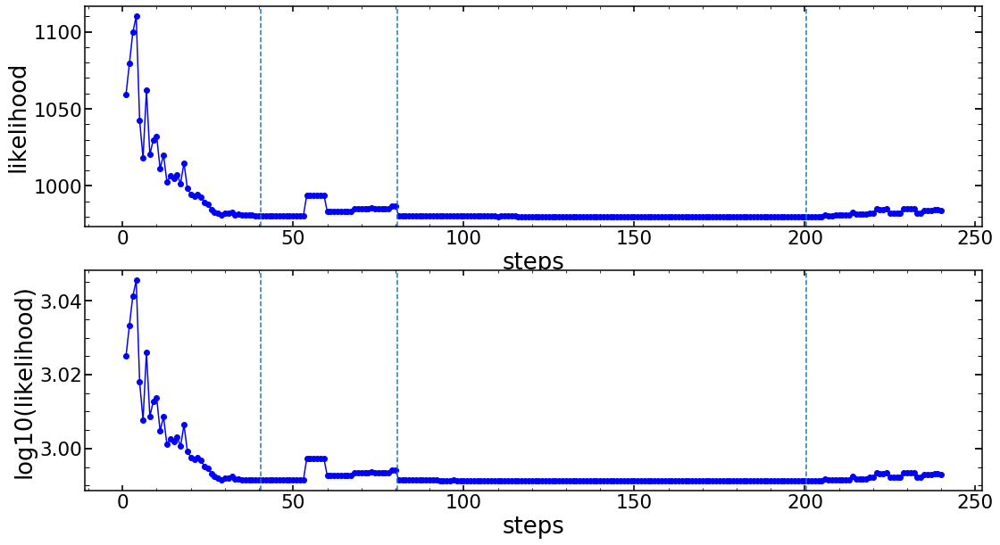

In [302]:
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')

In [303]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   
       
model(minchain)

extraZernike: None
zmax: 22
42


-980.1501198174086

In [304]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
r_ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'r_ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')

wf=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf.npy') 
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
u_manual=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u_manual.npy')
wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')   
expwf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'expwf_grid.npy')      

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')
res_init=np.load(TESTING_FINAL_IMAGES_FOLDER+'res_init.npy')
res=np.load(TESTING_FINAL_IMAGES_FOLDER+'res.npy')


optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

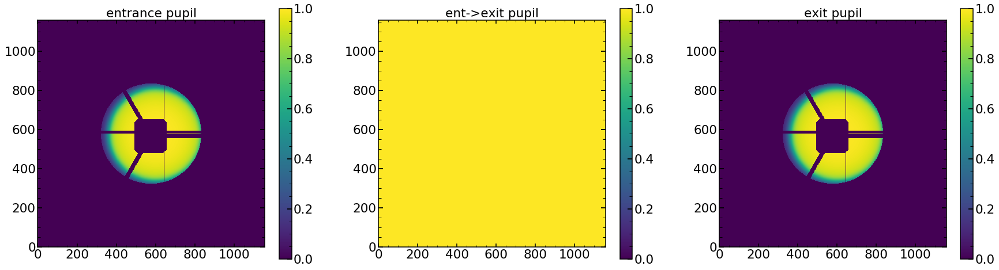

In [305]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

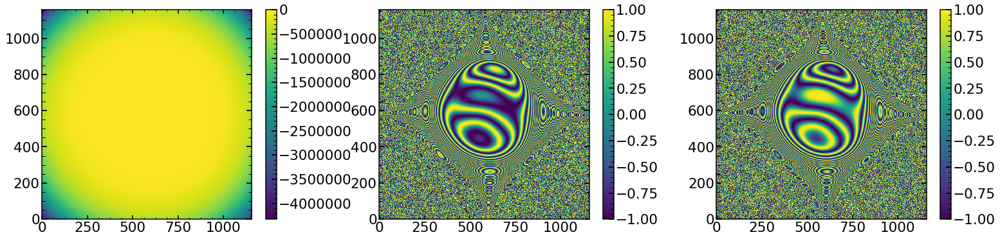

In [306]:
plt.figure(figsize=(36,6))
plt.subplot(141)
plt.imshow(wf_full)
plt.colorbar()

plt.subplot(142)
plt.imshow(np.real(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

plt.subplot(143)
plt.imshow(np.imag(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

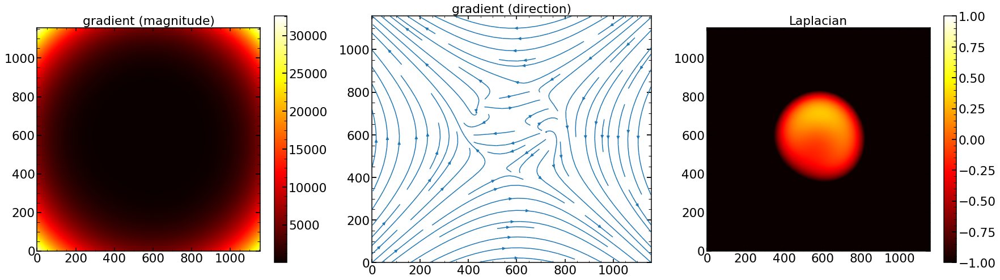

In [307]:
plt.figure(figsize=(30,8))
plt.subplot(131)
vgrad = np.gradient(wf_full)
fulgrad = np.sqrt(vgrad[0]**2 + vgrad[1]**2)
plt.title('gradient (magnitude)')
plt.imshow(fulgrad,cmap=plt.get_cmap('hot'), vmin = np.amin(fulgrad),vmax = np.amax(fulgrad))  
plt.colorbar()
plt.subplot(132)
x, y = range(0, len(wf_full)), range(0,len(wf_full))
xi, yi = np.meshgrid(x, y)
plt.title('gradient (direction)')
plt.streamplot(xi, yi, vgrad[0], vgrad[1])
plt.subplot(133)
laplace_of_wf = scipy.ndimage.filters.laplace(wf_full)
plt.title('Laplacian')
plt.imshow(laplace_of_wf,cmap=plt.get_cmap('hot'), vmin = -1,vmax = 1) 
plt.colorbar()

Text(0.5,1,'Residual')

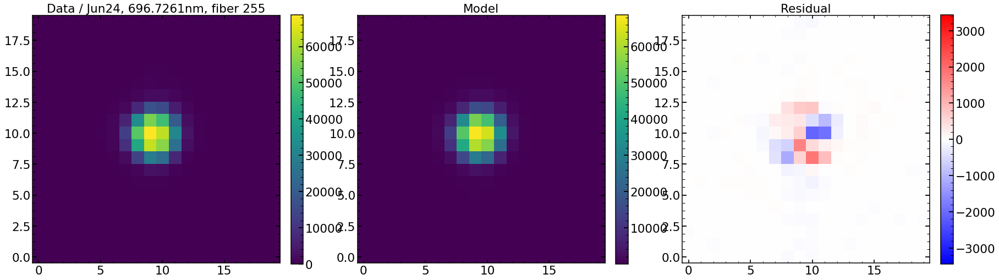

In [308]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(sci_image,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(1,3,2)
plt.imshow(res_iapetus,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image-res_iapetus,vmin=-np.max(sci_image)/20,vmax=np.max(sci_image)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

chi**2 reduced is: 4.862618716418512
Abs of residual divided by total flux is: 0.03320681739292211
Abs of residual divided by largest value of a flux in the image is: 0.030684506337317955


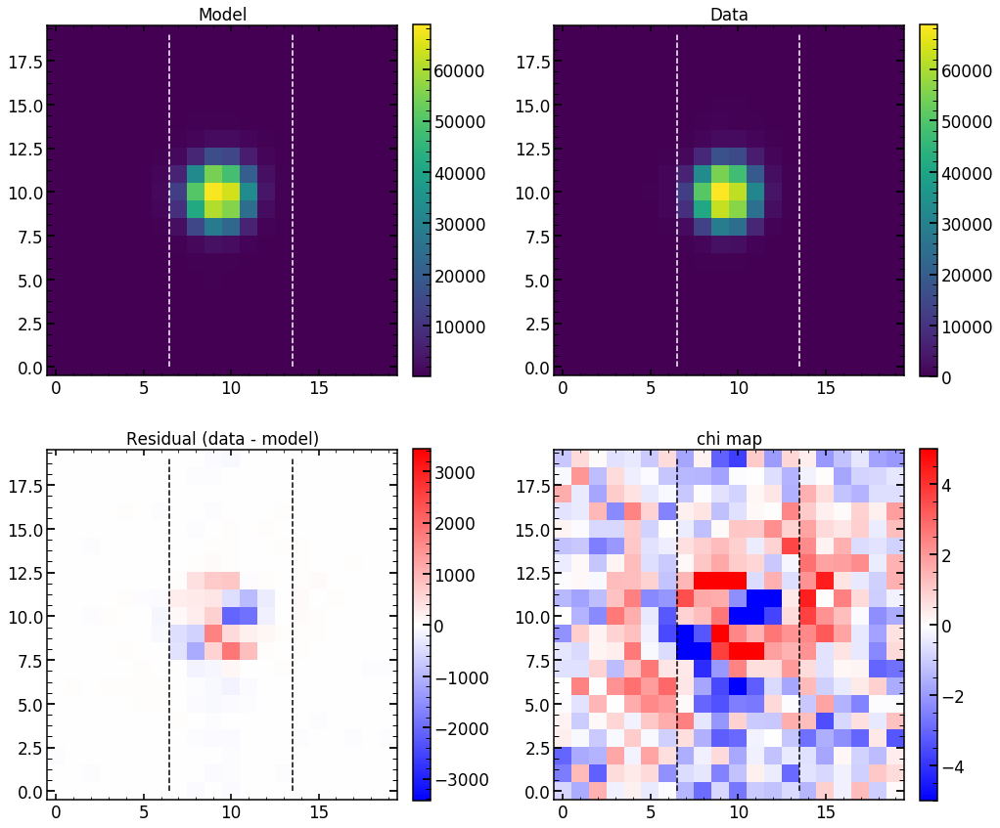

In [309]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

4.862618716418512
chi**2 reduced is: 4.862618716418512
Abs of residual divided by total flux is: 0.03320681739292211
Abs of residual divided by largest value of a flux in the image is: 0.030684506337317955


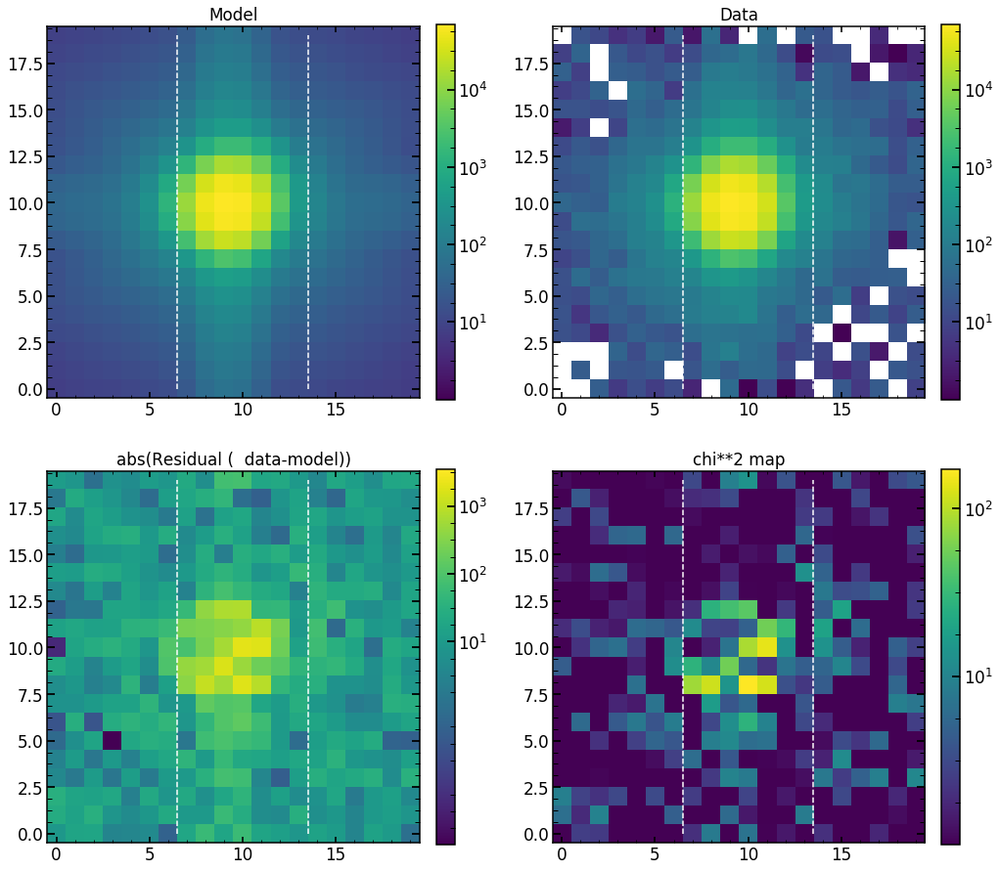

In [310]:
single_analysis.create_basic_comparison_plot_log()

4.862618716418512
chi**2 reduced is: 4.862618716418512
Abs of residual divided by total flux is: 0.03320681739292211
Abs of residual divided by largest value of a flux in the image is: 0.030684506337317955


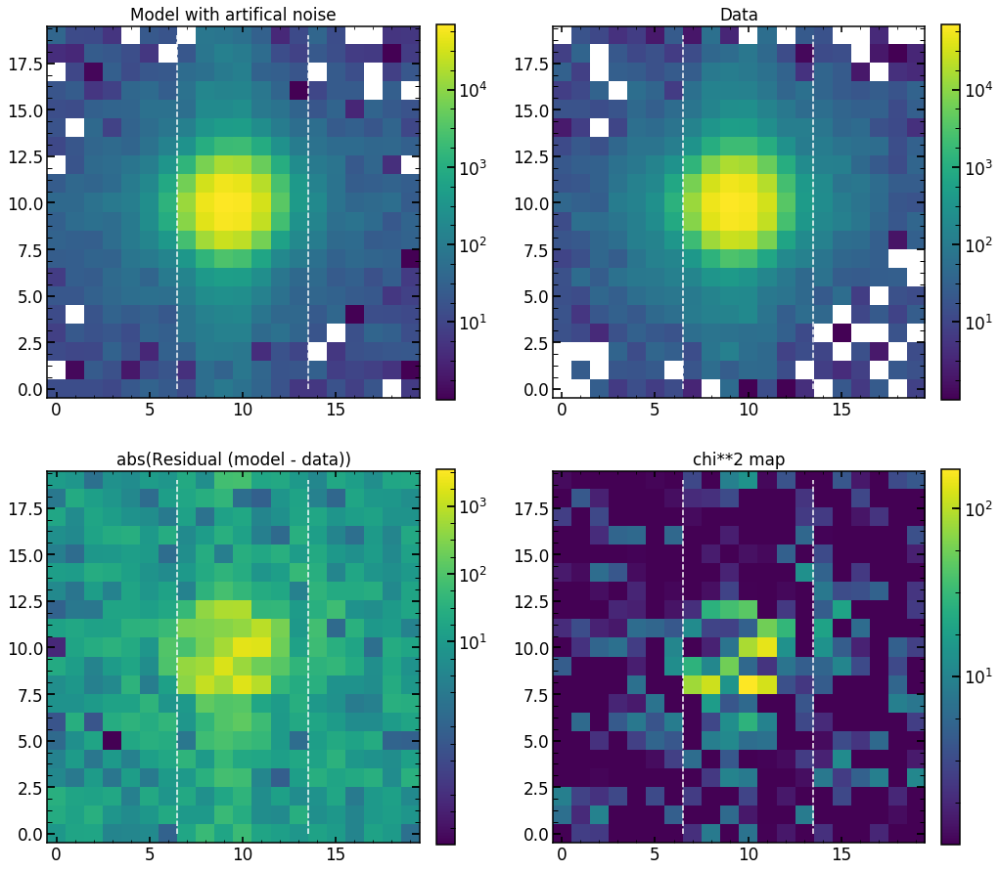

In [311]:
single_analysis.create_basic_comparison_plot_log_artifical()

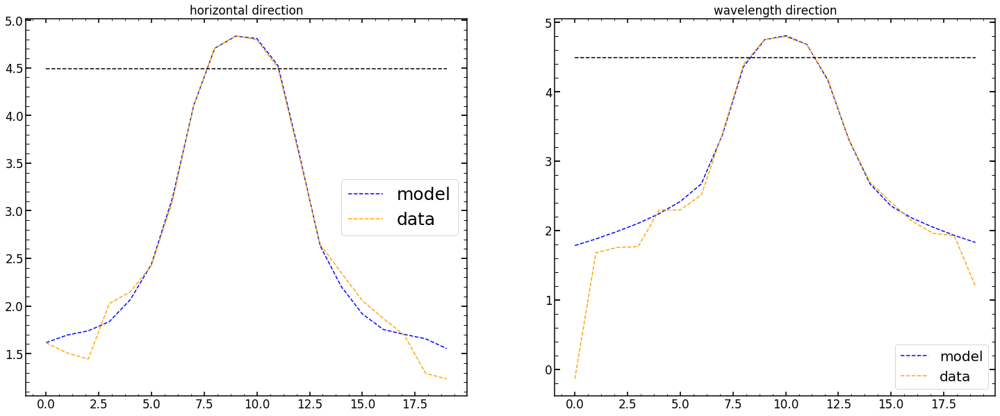

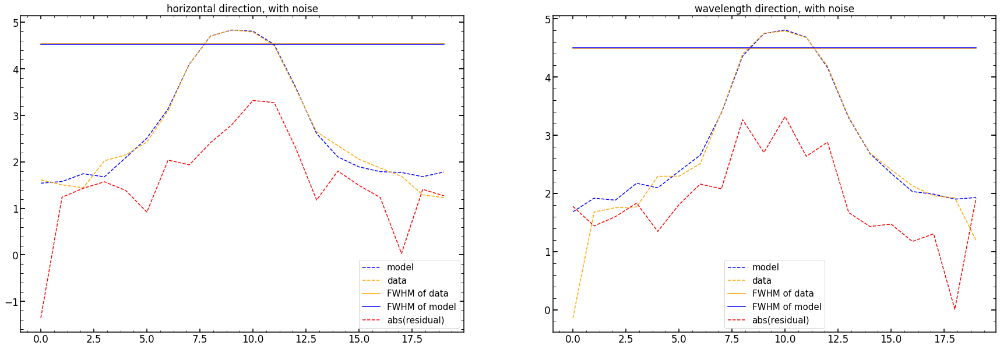

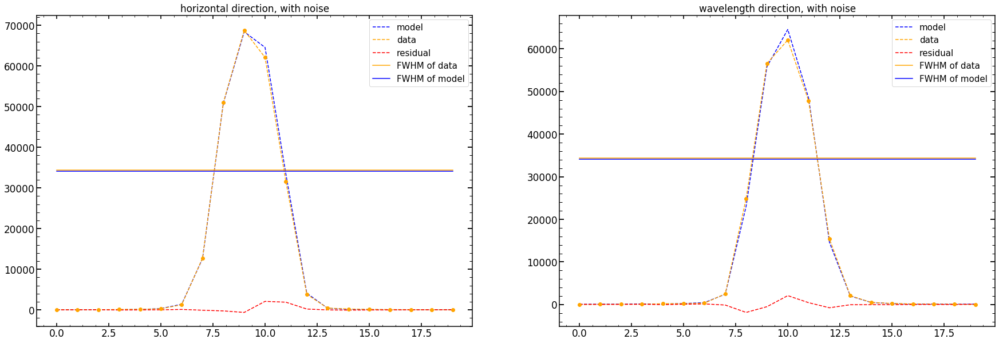

In [312]:
single_analysis.create_cut_plots()

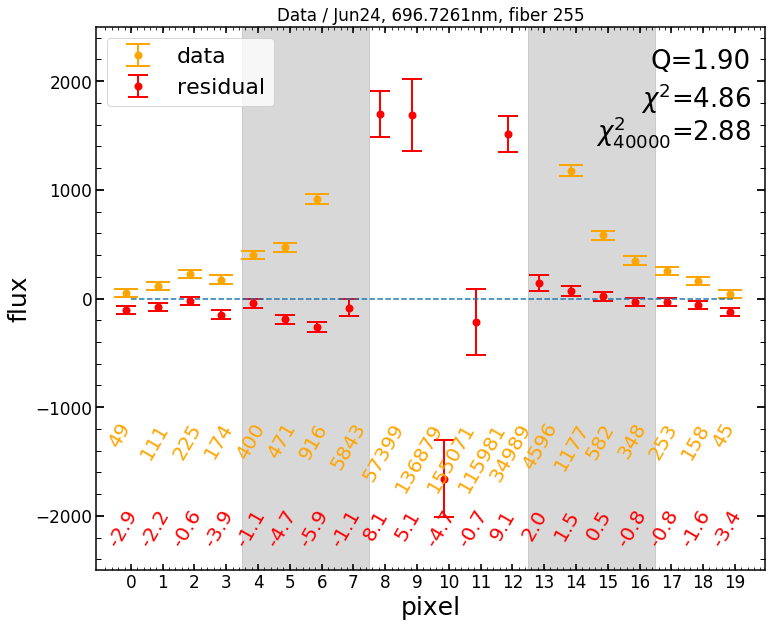

In [313]:
init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image,var_image,res_iapetus)


plt.errorbar(np.array(range(len(init_lamda)))-0.15,init_lamda,yerr=std_init_lamda,fmt='o',elinewidth=2,capsize=12,markeredgewidth=2,label='data',color='orange')
plt.errorbar(np.array(range(len(init_removal_lamda)))-0.15,init_removal_lamda,yerr=std_init_removal_lamda,color='red',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='residual')
plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.legend(loc=2, fontsize=22)
plt.plot(np.zeros(20),'--')
plt.ylim(-2500,2500)
plt.ylabel('flux',size=25)
plt.xlabel('pixel',size=25)
plt.xticks(range(20))




for i in range(20):
    plt.text(-0.8+i, -1250, str("{:1.0f}".format(init_lamda[i])), fontsize=20,rotation=60.,color='orange')
    
for i in range(20):
    plt.text(-0.8+i, -2050, str("{:1.1f}".format(init_removal_lamda[i]/std_init_removal_lamda[i])), fontsize=20,rotation=60.,color='red')

sci_image_40000,var_image_40000,res_iapetus_40000=add_artificial_noise(sci_image,var_image,res_iapetus)
init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image_40000,var_image_40000,res_iapetus_40000)

position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
difference_from_max=range(20)-position_of_max_flux
pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
Q=np.mean(np.abs(init_removal_lamda[pixels_to_test]/std_init_removal_lamda[pixels_to_test]))

plt.text(19.5,2300, 'Q='+str("{:1.2f}".format(Q)),
        horizontalalignment='right',
        verticalalignment='top',fontsize=26)

chi2=np.mean((res_iapetus-sci_image)**2/var_image)

plt.text(19.5,2000, '$\chi^{2}$='+str("{:1.2f}".format(chi2)),
        horizontalalignment='right',
        verticalalignment='top',fontsize=26)

chi2_40000=np.mean((res_iapetus_40000-sci_image_40000)**2/var_image_40000)

plt.text(19.5,1700, '$\chi^{2}_{40000}$='+str("{:1.2f}".format(chi2_40000)),
        horizontalalignment='right',
        verticalalignment='top',fontsize=26)


plt.axvspan(pixels_to_test[0]-0.5, pixels_to_test[3]+0.5, alpha=0.3, color='grey')
plt.axvspan(pixels_to_test[4]-0.5, pixels_to_test[7]+0.5, alpha=0.3, color='grey')

## Creating  results everywhere

In [262]:
finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019
date='Jun24'

results_of_fit_many_single_focus_HgAr=pd.DataFrame(np.zeros((len(finalHgAr),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalHgAr.index,columns=columns22_analysis)
err_results_of_fit_many_single_focus_HgAr=pd.DataFrame(np.zeros((len(finalHgAr),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalHgAr.index,columns=columns22_analysis)

results_of_fit_many_single_focus_HgAr_pd=pd.DataFrame(results_of_fit_many_single_focus_HgAr)
err_results_of_fit_many_single_focus_HgAr_pd=pd.DataFrame(err_results_of_fit_many_single_focus_HgAr)


results_of_fit_many_single_focus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalNe.index,columns=columns22_analysis)
err_results_of_fit_many_single_focus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalNe.index,columns=columns22_analysis)

results_of_fit_many_single_focus_Ne_pd=pd.DataFrame(results_of_fit_many_single_focus_Ne)
err_results_of_fit_many_single_focus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_focus_Ne)

In [263]:
columns_analysis=columns22_analysis

for single_number in range(len(finalHgAr)):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single_focus(date,single_number,'HgAr',22,2)
    results_of_fit_many_single_focus_HgAr_pd.loc[single_number]=results_of_fit_single.values  

results_of_fit_many_single_focus_HgAr_pd=results_of_fit_many_single_focus_HgAr_pd[np.abs(results_of_fit_many_single_focus_HgAr_pd['z4'])>0]


for single_number in range(len(finalNe)):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single_focus(date,single_number,'Ne',22,2)
    results_of_fit_many_single_focus_Ne_pd.loc[single_number]=results_of_fit_single.values  

results_of_fit_many_single_focus_Ne_pd=results_of_fit_many_single_focus_Ne_pd[np.abs(results_of_fit_many_single_focus_Ne_pd['z4'])>0]

22
0 17071 HgAr is NOT found or failed!
22
1 obs (Emcee3): 17071 is found!
z5: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
z12: failed!
z13: failed!
z15: failed!
z17: failed!
z19: failed!
z21: failed!
z22: failed!
hscFrac: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
z12: failed!
z13: failed!
z15: failed!
z17: failed!
z19: failed!
z21: failed!
z22: failed!
hscFrac: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
22
2 17071 HgAr is NOT found or failed!
22
3 obs (Emcee3): 17071 is found!
z5: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
z12:

z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
z12: failed!
z13: failed!
z14: failed!
z15: failed!
z16: failed!
z17: failed!
z19: failed!
z20: failed!
z21: failed!
z22: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
slitFrac: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
22
34 17071 HgAr is NOT found or failed!
22
35 17071 HgAr is NOT found or failed!
22
36 17071 HgAr is NOT found or failed!
22
37 obs (Emcee3): 17071 is found!
z5: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z12: failed!
z13: failed!
z14: failed!
z15: failed!
z17: failed!
z19: failed!
z21: failed!
z22: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: fail

z7: failed!
z8: failed!
z10: failed!
z12: failed!
z13: failed!
z14: failed!
z17: failed!
z18: failed!
hscFrac: failed!
y_ilum: failed!
y_fiber: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
22
64 17071 HgAr is NOT found or failed!
22
65 17071 HgAr is NOT found or failed!
22
66 obs (Emcee3): 17071 is found!
z5: failed!
z6: failed!
z7: failed!
z12: failed!
z13: failed!
z15: failed!
z17: failed!
z18: failed!
z19: failed!
z20: failed!
z21: failed!
z22: failed!
hscFrac: failed!
slitFrac_dy: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z12: failed!
z13: failed!
z15: failed!
z17: failed!
z18: failed!
z19: failed!
z20: failed!
z21: failed!
z22: failed!
hscFrac: failed!
slitFrac_dy: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: f

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
22
94 17071 HgAr is NOT found or failed!
22
95 17071 HgAr is NOT found or failed!
22
96 17071 HgAr is NOT found or failed!
22
97 obs (Emcee3): 17071 is found!
z5: failed!
z6: failed!
z8: failed!
z12: failed!
z17: failed!
z19: failed!
z20: failed!
z21: failed!
z22: failed!
hscFrac: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
y_ilum: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
z5: failed!
z6: failed!
z8: failed!
z12: failed!
z17: failed!
z19: failed!
z20: failed!
z21: failed!
z22: failed!
hscFrac: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
y_ilum: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
22
98 17071 HgAr is NOT found or failed!
22
99 obs (Emcee3): 17071 is found!
z5: failed!
z

dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
y_fiber: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
22
30 16292 Ne is NOT found or failed!
22
31 16292 Ne is NOT found or failed!
22
32 16292 Ne is NOT found or failed!
22
33 obs (Emcee3): 16292 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z10: failed!
z11: failed!
z13: failed!
z14: failed!
z15: failed!
z16: failed!
z17: failed!
z20: failed!
hscFrac: failed!
strutFrac: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_lorentz_factor: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z10: failed!
z11: failed!
z13: failed!
z14: failed!
z15: failed!
z16: failed!
z17: failed!
z20: failed!
hscFrac: failed!
strutFrac: faile

z10: failed!
z11: failed!
z12: failed!
z13: failed!
z14: failed!
z17: failed!
z18: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
z12: failed!
z13: failed!
z14: failed!
z17: failed!
z18: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
22
61 16292 Ne is NOT found or failed!
22
62 16292 Ne is NOT found or failed!
22
63 16292 Ne is NOT found or failed!
22
64 16292 Ne is NOT found or failed

In [265]:
pd.set_option("display.max_rows",10)
results_of_fit_many_single_focus_HgAr_pd

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
1,0.276849,0.317131,-0.133825,0.453348,0.607778,0.236219,-0.382401,-0.096090,-0.217395,-0.141980,...,1.015362,0.660211,46009.610623,2.350377,1.654316e-03,0.382308,1.798118,0.998853,6.775642,1739.032227
3,0.445542,-0.132774,-0.194414,0.469693,0.597936,0.202743,-0.268488,-0.087920,-0.157309,-0.130033,...,0.997866,0.373998,40442.156744,1.608236,2.803244e-04,0.350000,1.780066,0.996946,2.428868,477.556244
6,0.445045,-0.012880,1.200255,0.214884,-0.815236,0.057731,-0.182017,0.073155,-0.420882,-0.084291,...,0.949049,0.380443,119999.786460,2.139954,5.377345e-10,0.350000,1.780076,0.980000,248.976021,1472.755371
9,0.750928,-1.115271,-0.473269,-0.172181,0.479351,-0.315663,-0.299677,0.118514,-0.092452,0.186839,...,1.028120,0.016917,56585.599752,2.683291,5.250023e-03,0.407783,1.806596,0.994413,45.467016,7397.613770
11,0.814332,-1.114543,-0.823993,-0.272723,0.447007,-0.329742,-0.426028,0.400098,0.076084,0.232471,...,1.043205,0.481963,28739.528608,2.235841,3.258531e-03,0.502850,1.807940,0.994995,2.714229,383.400940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,0.946169,-0.620813,-0.080518,0.371938,-0.780915,0.045604,-0.138331,-0.140686,-0.077298,0.102273,...,0.995016,-0.496881,119999.999997,2.479358,3.129066e-03,0.383720,1.805126,0.998003,3.381758,1314.241455
99,0.551591,-0.676413,-0.083686,0.349458,-1.061974,0.014478,-0.252936,-0.614880,-0.105804,0.118374,...,0.983570,-0.441223,52592.116058,2.553774,7.831107e-12,0.350000,1.780093,0.984266,5.356591,360.760834
102,0.510480,-0.228042,0.139670,0.151342,-0.751269,-0.087066,-0.296414,-0.113409,-0.128087,0.026941,...,1.008452,-0.465986,64380.285271,2.113924,9.875458e-04,0.421849,1.811637,0.997101,4.184785,1120.776001
111,0.689112,-0.497426,-0.051149,0.396829,-1.041815,0.071843,-0.105554,0.045380,-0.085428,0.045166,...,1.011212,-0.086412,93792.273335,2.980840,1.096462e-02,0.409893,1.901687,0.993801,1.886640,296.779419


In [266]:
pd.set_option("display.max_rows",10)
results_of_fit_many_single_focus_Ne_pd

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
6,3.126885,0.501362,0.118236,0.556432,0.942792,0.191975,-0.307768,0.074514,-0.175195,-0.118777,...,0.991035,0.615659,25318.346680,1.500000,0.000127,0.350000,1.874882,0.991439,22.010443,2579.286865
14,2.426455,0.528181,-0.140997,0.628921,0.591817,0.077101,-0.338004,-0.136873,-0.099785,-0.128600,...,1.003066,0.539868,40595.904885,2.279293,0.001536,0.350000,1.805161,0.998185,25.950306,13358.384766
15,2.334380,0.251030,-0.056259,0.476671,0.556131,0.094414,-0.401423,-0.232594,-0.227712,-0.078198,...,1.001564,0.514698,48770.322822,2.199022,0.001652,0.365444,1.791114,0.998668,4.449120,2768.038086
20,1.522680,0.346347,-0.453786,0.866979,0.466468,0.012266,-0.427261,-0.042476,-0.042086,-0.125496,...,1.022063,0.453869,48750.665770,2.050299,0.000873,0.429787,1.825102,0.996389,31.272158,8236.346680
29,1.025596,0.390600,-0.720899,0.790431,0.105718,-0.055544,-0.414478,-0.313044,0.014558,-0.103607,...,1.029494,0.153959,49501.319028,2.229287,0.001640,0.350000,1.780040,0.997919,23.838487,9835.326172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,-0.827769,-0.433425,-0.691097,0.497083,-0.405158,-0.084016,-0.159146,-0.368543,0.034891,0.033769,...,1.022961,-0.146731,49959.910003,2.400072,0.002471,0.350539,1.805141,0.997919,27.773007,12111.052734
60,-1.043483,-0.446666,-0.574409,0.397914,-0.321377,-0.118061,-0.257729,-0.462242,-0.005558,0.035199,...,1.002217,-0.112726,38987.071525,1.916150,0.000805,0.370939,1.793520,0.998359,4.664181,2459.839355
69,-1.398730,-0.552719,-0.549112,0.396513,-0.497550,-0.061935,-0.261020,-0.410765,-0.020472,0.084043,...,1.008891,-0.291639,38367.706946,1.967091,0.000830,0.372985,1.796623,0.998039,4.109869,2467.502197
74,-1.945288,-0.690826,-0.487491,0.640864,-0.917362,0.081654,-0.067032,-0.059210,-0.042611,0.163426,...,0.999377,-0.529223,70241.333066,2.311056,0.002284,0.350000,1.780056,0.998255,11.367988,5655.341309


In [267]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Jun24_Focus/' + 'results_of_fit_many_direct_HgAr_from_Jun24.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_single_focus_HgAr_pd,f, protocol=pickle.HIGHEST_PROTOCOL)
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Jun24_Focus/' + 'results_of_fit_many_direct_Ne_from_Jun24.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_single_focus_Ne_pd,f, protocol=pickle.HIGHEST_PROTOCOL)

## verification

In [268]:
# plot the results of the first fit

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Jun24'
zMax=22
descriptions=results_of_fit_many_HgAr[label[0]].columns

finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019

# i runs through all the parameters
for i in range(0,len(descriptions)):
    # take values for HgAr

    x_HgAr=finalHgAr.loc[results_of_fit_many_single_focus_HgAr_pd[descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
    y_HgAr=finalHgAr.loc[results_of_fit_many_single_focus_HgAr_pd[descriptions[i]].index.astype(int).ravel()]['yc'].values
    values_HgAr=np.array(results_of_fit_many_single_focus_HgAr_pd[descriptions[i]])

    # take values for Neon        
    x_Ne=finalNe.loc[results_of_fit_many_single_focus_Ne_pd[descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
    y_Ne=finalNe.loc[results_of_fit_many_single_focus_Ne_pd[descriptions[i]].index.astype(int).ravel()]['yc'].values
    values_Ne=np.array(results_of_fit_many_single_focus_Ne_pd[descriptions[i]])

    # this was when I had only HgAr
    #x=x_HgAr
    #y=y_HgAr  
    #colors=values_HgAr

    # join these values
    x=np.concatenate((x_HgAr,x_Ne))
    y=np.concatenate((y_HgAr,y_Ne))    
    colors= np.concatenate((values_HgAr,values_Ne))




    # size of point
    # this was when I had only HgAr
    #area = np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2).ravel()  # 0 to 15 point radii
    area = np.concatenate((np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2),np.full((1,len(values_Ne)),np.pi * (10 * 1)**2)),axis=1).ravel()  # 0 to 15 point radii


    if zMax==11:

        # limits of color for z5-z11
        if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=-1 

        # limits for all other parameters    
        if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+(min_dif+max_dif)/2
            min_colors=median_color-(min_dif+max_dif)/2

        #'chi2, chi2max'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=10
            min_colors=1

    else:
        # limits of color for z5-z11
        if np.in1d([i],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=-1 

        # limits for all other parameters    
        if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+(min_dif+max_dif)/2
            min_colors=median_color-(min_dif+max_dif)/2

        #'chi2, chi2max'
        if np.in1d([i],[41,42])[0] == True:   
            max_colors=10
            min_colors=1        



    plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
    plt.ylim(0,4176)
    plt.xlim(0,4096)
    plt.xlabel('x position on chip')
    plt.ylabel('y position on chip')
    plt.title(str(date)+' / '+" "+str(descriptions[i]))

    plt.colorbar()
    #plt.show()

    IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
    IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
    if not os.path.exists(IMAGES_FOLDER1):
        os.makedirs(IMAGES_FOLDER1)
        print('Images are in folder: '+str(IMAGES_FOLDER1))

    if not os.path.exists(IMAGES_FOLDER2):
        os.makedirs(IMAGES_FOLDER2)
        print('Images are in folder: '+str(IMAGES_FOLDER2))

    plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
    plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
    plt.clf()

<Figure size 864x720 with 0 Axes>

## Quality control 

In [314]:
assert date=='Jun24'

DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/'+str(date)+'_Focus/'

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_'+str(date)+'.pkl', 'rb') as f:
    results_of_fit_many_single_focus_HgAr_pd=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+str(date)+'.pkl', 'rb') as f:
    results_of_fit_many_single_focus_Ne_pd=pickle.load(f)

### just plotting 1D

In [315]:

for image_index in results_of_fit_many_single_focus_HgAr_pd.index.values:
    obs=17071
    eps=5
    arc='HgAr'

    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')

    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   

    minchain=results_of_fit_many_single_focus_HgAr_pd.loc[image_index][:42].values

    model(minchain)

    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_iapetus=optPsf_cut_fiber_convolved_downsampled
    np.save('/Users/nevencaplar/Documents/PFS/Fit_Results/'+str(date)+'_Focus/'+str(obs)+str(image_index)+str(arc)+'.npy',res_iapetus)    

    
    init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image,var_image,res_iapetus)


    plt.errorbar(np.array(range(len(init_lamda)))-0.15,init_lamda,yerr=std_init_lamda,fmt='o',elinewidth=2,capsize=12,markeredgewidth=2,label='data',color='orange')
    plt.errorbar(np.array(range(len(init_removal_lamda)))-0.15,init_removal_lamda,yerr=std_init_removal_lamda,color='red',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='residual')
    plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
    plt.legend(loc=2, fontsize=22)
    plt.plot(np.zeros(20),'--')
    plt.ylim(-2500,2500)
    plt.ylabel('flux',size=25)
    plt.xlabel('pixel',size=25)
    plt.xticks(range(20))




    for i in range(20):
        plt.text(-0.8+i, -1250, str("{:1.0f}".format(init_lamda[i])), fontsize=20,rotation=60.,color='orange')

    for i in range(20):
        plt.text(-0.8+i, -2050, str("{:1.1f}".format(init_removal_lamda[i]/std_init_removal_lamda[i])), fontsize=20,rotation=60.,color='red')

    sci_image_40000,var_image_40000,res_iapetus_40000=add_artificial_noise(sci_image,var_image,res_iapetus)
    init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image_40000,var_image_40000,res_iapetus_40000)

    position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
    difference_from_max=range(20)-position_of_max_flux
    pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
    Q=np.mean(np.abs(init_removal_lamda[pixels_to_test]/std_init_removal_lamda[pixels_to_test]))

    plt.text(19.5,2300, 'Q='+str("{:1.2f}".format(Q)),
            horizontalalignment='right',
            verticalalignment='top',fontsize=26)

    chi2=np.mean((res_iapetus-sci_image)**2/var_image)

    plt.text(19.5,2000, '$\chi^{2}$='+str("{:1.2f}".format(chi2)),
            horizontalalignment='right',
            verticalalignment='top',fontsize=26)

    chi2_40000=np.mean((res_iapetus_40000-sci_image_40000)**2/var_image_40000)

    plt.text(19.5,1700, '$\chi^{2}_{40000}$='+str("{:1.2f}".format(chi2_40000)),
            horizontalalignment='right',
            verticalalignment='top',fontsize=26)
    
    plt.axvspan(pixels_to_test[0]-0.5, pixels_to_test[3]+0.5, alpha=0.3, color='grey')
    plt.axvspan(pixels_to_test[4]-0.5, pixels_to_test[7]+0.5, alpha=0.3, color='grey')
    
    
    plt.savefig('/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/1D/'+str(obs)+str(image_index)+str(arc))
    plt.clf()
    
    
for image_index in results_of_fit_many_single_focus_Ne_pd.index.values:
    obs=16292
    eps=5
    arc='Ne'

    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')

    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   

    minchain=results_of_fit_many_single_focus_Ne_pd.loc[image_index][:42].values

    model(minchain)

    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_iapetus=optPsf_cut_fiber_convolved_downsampled
    np.save('/Users/nevencaplar/Documents/PFS/Fit_Results/'+str(date)+'_Focus/'+str(obs)+str(image_index)+str(arc)+'.npy',res_iapetus)
    init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image,var_image,res_iapetus)


    plt.errorbar(np.array(range(len(init_lamda)))-0.15,init_lamda,yerr=std_init_lamda,fmt='o',elinewidth=2,capsize=12,markeredgewidth=2,label='data',color='orange')
    plt.errorbar(np.array(range(len(init_removal_lamda)))-0.15,init_removal_lamda,yerr=std_init_removal_lamda,color='red',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='residual')
    plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
    plt.legend(loc=2, fontsize=22)
    plt.plot(np.zeros(20),'--')
    plt.ylim(-2500,2500)
    plt.ylabel('flux',size=25)
    plt.xlabel('pixel',size=25)
    plt.xticks(range(20))




    for i in range(20):
        plt.text(-0.8+i, -1250, str("{:1.0f}".format(init_lamda[i])), fontsize=20,rotation=60.,color='orange')

    for i in range(20):
        plt.text(-0.8+i, -2050, str("{:1.1f}".format(init_removal_lamda[i]/std_init_removal_lamda[i])), fontsize=20,rotation=60.,color='red')

    sci_image_40000,var_image_40000,res_iapetus_40000=add_artificial_noise(sci_image,var_image,res_iapetus)
    init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image_40000,var_image_40000,res_iapetus_40000)

    position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
    difference_from_max=range(20)-position_of_max_flux
    pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
    Q=np.mean(np.abs(init_removal_lamda[pixels_to_test]/std_init_removal_lamda[pixels_to_test]))

    plt.text(19.5,2300, 'Q='+str("{:1.2f}".format(Q)),
            horizontalalignment='right',
            verticalalignment='top',fontsize=26)

    chi2=np.mean((res_iapetus-sci_image)**2/var_image)

    plt.text(19.5,2000, '$\chi^{2}$='+str("{:1.2f}".format(chi2)),
            horizontalalignment='right',
            verticalalignment='top',fontsize=26)

    chi2_40000=np.mean((res_iapetus_40000-sci_image_40000)**2/var_image_40000)

    plt.text(19.5,1700, '$\chi^{2}_{40000}$='+str("{:1.2f}".format(chi2_40000)),
            horizontalalignment='right',
            verticalalignment='top',fontsize=26)
    
    plt.axvspan(pixels_to_test[0]-0.5, pixels_to_test[3]+0.5, alpha=0.3, color='grey')
    plt.axvspan(pixels_to_test[4]-0.5, pixels_to_test[7]+0.5, alpha=0.3, color='grey')
    
    plt.savefig('/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/1D/'+str(obs)+str(image_index)+str(arc))
    plt.clf()    

extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZer

<Figure size 864x720 with 0 Axes>

### calculating and global plot

In [274]:
res_HgAr=[]
res_HgAr_chi=[]

for image_index in results_of_fit_many_single_focus_HgAr_pd.index.values:
    obs=17071
    eps=5
    arc='HgAr'

    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')

    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   
    minchain=results_of_fit_many_single_focus_HgAr_pd.loc[image_index][:42].values
    model(minchain)

    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_iapetus=optPsf_cut_fiber_convolved_downsampled
        
    sci_image_40000,var_image_40000,res_iapetus_40000=add_artificial_noise(sci_image,var_image,res_iapetus)
    init_lamda_40000,std_init_lamda_40000,init_removal_lamda_40000,std_init_removal_lamda_40000=residual_1D(sci_image_40000,var_image_40000,res_iapetus_40000)

    position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
    difference_from_max=range(20)-position_of_max_flux
    pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
    Q=np.mean(np.abs(init_removal_lamda[pixels_to_test]/std_init_removal_lamda[pixels_to_test]))
    Q_40000=np.mean(np.abs(init_removal_lamda_40000[pixels_to_test]/std_init_removal_lamda_40000[pixels_to_test]))
    
    res_HgAr.append(Q_40000)
    
    chi2_40000=np.mean((res_iapetus_40000-sci_image_40000)**2/var_image_40000)
    res_HgAr_chi.append(chi2_40000)
  
res_Ne=[]
res_Ne_chi=[]
    
for image_index in results_of_fit_many_single_focus_Ne_pd.index.values:
    obs=16292
    eps=5
    arc='Ne'

    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')

    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   
    minchain=results_of_fit_many_single_focus_Ne_pd.loc[image_index][:42].values
    model(minchain)

    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_iapetus=optPsf_cut_fiber_convolved_downsampled
    
    sci_image_40000,var_image_40000,res_iapetus_40000=add_artificial_noise(sci_image,var_image,res_iapetus)
    init_lamda_40000,std_init_lamda_40000,init_removal_lamda_40000,std_init_removal_lamda_40000=residual_1D(sci_image_40000,var_image_40000,res_iapetus_40000)
    
    position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
    difference_from_max=range(20)-position_of_max_flux
    pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
    Q=np.mean(np.abs(init_removal_lamda[pixels_to_test]/std_init_removal_lamda[pixels_to_test]))
    Q_40000=np.mean(np.abs(init_removal_lamda_40000[pixels_to_test]/std_init_removal_lamda_40000[pixels_to_test]))
    
    res_Ne.append(Q_40000)
    
    chi2_40000=np.mean((res_iapetus_40000-sci_image_40000)**2/var_image_40000)
    
    res_Ne_chi.append(chi2_40000)

extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZer

In [275]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10

zMax=22
descriptions='Q'


# i runs through all the parameters
for i in range(0,1):
    # take values for HgAr

    x_HgAr=finalHgAr.loc[results_of_fit_many_single_focus_HgAr_pd.index.values]['xc_effective'].values
    y_HgAr=finalHgAr.loc[results_of_fit_many_single_focus_HgAr_pd.index.values]['yc'].values
    values_HgAr=res_HgAr

    # take values for Neon        
    x_Ne=finalNe.loc[results_of_fit_many_single_focus_Ne_pd.index.values]['xc_effective'].values
    y_Ne=finalNe.loc[results_of_fit_many_single_focus_Ne_pd.index.values]['yc'].values
    values_Ne=res_Ne

    # this was when I had only HgAr
    #x=x_HgAr
    #y=y_HgAr  
    #colors=values_HgAr

    # join these values
    x=np.concatenate((x_HgAr,x_Ne))
    y=np.concatenate((y_HgAr,y_Ne))    
    colors= np.concatenate((values_HgAr,values_Ne))




    # size of point
    # this was when I had only HgAr
    #area = np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2).ravel()  # 0 to 15 point radii
    area = np.concatenate((np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2),np.full((1,len(values_Ne)),np.pi * (10 * 1)**2)),axis=1).ravel()  # 0 to 15 point radii

    max_colors=10
    min_colors=1         



    plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=1, vmax=max_colors,edgecolor='black')
    plt.ylim(0,4176)
    plt.xlim(0,4096)
    plt.xlabel('x position on chip')
    plt.ylabel('y position on chip')
    plt.title(str(date)+' / '+" "+'Q_40000'+' value')

    plt.colorbar()
    #plt.show()

    IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+'Q'+'/'
    IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+'Q'+'/'
    if not os.path.exists(IMAGES_FOLDER1):
        os.makedirs(IMAGES_FOLDER1)
        print('Images are in folder: '+str(IMAGES_FOLDER1))

    if not os.path.exists(IMAGES_FOLDER2):
        os.makedirs(IMAGES_FOLDER2)
        print('Images are in folder: '+str(IMAGES_FOLDER2))

    plt.savefig(IMAGES_FOLDER1+'Q_40000'+" "+str(descriptions[i]))
    plt.savefig(IMAGES_FOLDER2+'Q_40000'+" "+str(descriptions[i]))
    plt.clf()

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun24/Plane/Q/


<Figure size 864x720 with 0 Axes>

In [276]:

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10

zMax=22
descriptions='$\chi^{2}$'


# i runs through all the parameters
for i in range(0,1):
    # take values for HgAr

    x_HgAr=finalHgAr.loc[results_of_fit_many_single_focus_HgAr_pd.index.values]['xc_effective'].values
    y_HgAr=finalHgAr.loc[results_of_fit_many_single_focus_HgAr_pd.index.values]['yc'].values
    values_HgAr=res_HgAr_chi

    # take values for Neon        
    x_Ne=finalNe.loc[results_of_fit_many_single_focus_Ne_pd.index.values]['xc_effective'].values
    y_Ne=finalNe.loc[results_of_fit_many_single_focus_Ne_pd.index.values]['yc'].values
    values_Ne=res_Ne_chi

    # this was when I had only HgAr
    #x=x_HgAr
    #y=y_HgAr  
    #colors=values_HgAr

    # join these values
    x=np.concatenate((x_HgAr,x_Ne))
    y=np.concatenate((y_HgAr,y_Ne))    
    colors= np.concatenate((values_HgAr,values_Ne))




    # size of point
    # this was when I had only HgAr
    #area = np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2).ravel()  # 0 to 15 point radii
    area = np.concatenate((np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2),np.full((1,len(values_Ne)),np.pi * (10 * 1)**2)),axis=1).ravel()  # 0 to 15 point radii

    max_colors=10
    min_colors=1           



    plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=1, vmax=20,edgecolor='black')
    plt.ylim(0,4176)
    plt.xlim(0,4096)
    plt.xlabel('x position on chip')
    plt.ylabel('y position on chip')
    plt.title(str(date)+' / '+" "+'res_chi'+' value')

    plt.colorbar()
    #plt.show()

    IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+'res_chi'+'/'
    IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+'res_chi'+'/'
    if not os.path.exists(IMAGES_FOLDER1):
        os.makedirs(IMAGES_FOLDER1)
        print('Images are in folder: '+str(IMAGES_FOLDER1))

    if not os.path.exists(IMAGES_FOLDER2):
        os.makedirs(IMAGES_FOLDER2)
        print('Images are in folder: '+str(IMAGES_FOLDER2))

    plt.savefig(IMAGES_FOLDER1+'chi_res'+" "+str(descriptions[i]))
    plt.savefig(IMAGES_FOLDER2+'chi_res'+" "+str(descriptions[i]))
    plt.clf()

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun24/Plane/res_chi/


<Figure size 864x720 with 0 Axes>

## comparison between quality for HgAr and Neon

In [279]:
selection_HgAr_index=finalHgAr[((finalHgAr['fiber'].values.astype(int))>0)&((finalHgAr['fiber'].values.astype(int))<650)
                                       &((finalHgAr['wavelength'].values.astype(float))<950)&((finalHgAr['close'].values.astype(int))==1)].index.values

selection_Ne_index=finalNe[((finalNe['fiber'].values.astype(int))>0)&((finalNe['fiber'].values.astype(int))<650)
                                       &((finalNe['wavelength'].values.astype(float))<800)&((finalNe['close'].values.astype(int))==1)].index.values

In [280]:
selection_HgAr_index_intersect=np.intersect1d(results_of_fit_many_single_focus_HgAr_pd.index.values,selection_HgAr_index)
selection_Ne_index_intersect=np.intersect1d(results_of_fit_many_single_focus_Ne_pd.index.values,selection_Ne_index)

print(len(selection_HgAr_index_intersect))
print(len(selection_Ne_index_intersect))

31
17


In [281]:
res_HgAr=[]
res_HgAr_chi=[]

for image_index in selection_HgAr_index_intersect:
    obs=17071
    eps=5
    arc='HgAr'

    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')

    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   
    minchain=results_of_fit_many_single_focus_HgAr_pd.loc[image_index][:42].values
    model(minchain)

    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_iapetus=optPsf_cut_fiber_convolved_downsampled
        
    sci_image_40000,var_image_40000,res_iapetus_40000=add_artificial_noise(sci_image,var_image,res_iapetus)
    init_lamda_40000,std_init_lamda_40000,init_removal_lamda_40000,std_init_removal_lamda_40000=residual_1D(sci_image_40000,var_image_40000,res_iapetus_40000)

    position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
    difference_from_max=range(20)-position_of_max_flux
    pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
    Q=np.mean(np.abs(init_removal_lamda[pixels_to_test]/std_init_removal_lamda[pixels_to_test]))
    Q_40000=np.mean(np.abs(init_removal_lamda_40000[pixels_to_test]/std_init_removal_lamda_40000[pixels_to_test]))
    
    res_HgAr.append(Q_40000)
    
    chi2_40000=np.mean((res_iapetus_40000-sci_image_40000)**2/var_image_40000)
    res_HgAr_chi.append(chi2_40000)
  
res_Ne=[]
res_Ne_chi=[]
    
for image_index in selection_Ne_index_intersect:
    obs=16292
    eps=5
    arc='Ne'

    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(image_index)+str(arc)+'_Stacked.npy')

    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   
    minchain=results_of_fit_many_single_focus_Ne_pd.loc[image_index][:42].values
    model(minchain)

    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_iapetus=optPsf_cut_fiber_convolved_downsampled
    
    sci_image_40000,var_image_40000,res_iapetus_40000=add_artificial_noise(sci_image,var_image,res_iapetus)
    init_lamda_40000,std_init_lamda_40000,init_removal_lamda_40000,std_init_removal_lamda_40000=residual_1D(sci_image_40000,var_image_40000,res_iapetus_40000)
    
    position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
    difference_from_max=range(20)-position_of_max_flux
    pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
    Q=np.mean(np.abs(init_removal_lamda[pixels_to_test]/std_init_removal_lamda[pixels_to_test]))
    Q_40000=np.mean(np.abs(init_removal_lamda_40000[pixels_to_test]/std_init_removal_lamda_40000[pixels_to_test]))
    
    res_Ne.append(Q_40000)
    
    chi2_40000=np.mean((res_iapetus_40000-sci_image_40000)**2/var_image_40000)
    
    res_Ne_chi.append(chi2_40000)

extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZernike: None
zmax: 22
42
extraZer

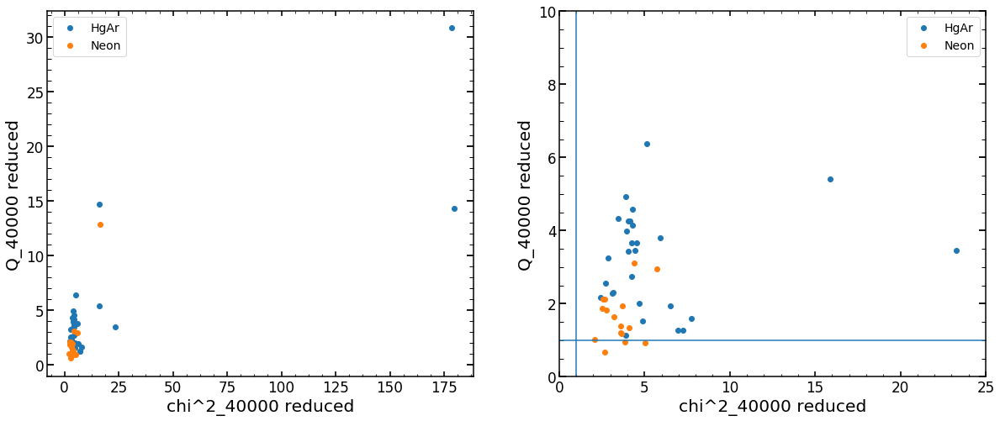

In [284]:
plt.figure(figsize=(20,8))

plt.subplot(121)
plt.scatter(res_HgAr_chi,res_HgAr,label='HgAr')
plt.scatter(res_Ne_chi,res_Ne,label='Neon')
plt.xlabel('chi^2_40000 reduced')
plt.ylabel('Q_40000 reduced')
plt.legend()

plt.subplot(122)
plt.scatter(res_HgAr_chi,res_HgAr,label='HgAr')
plt.scatter(res_Ne_chi,res_Ne,label='Neon')
plt.xlabel('chi^2_40000 reduced')
plt.ylabel('Q_40000 reduced')
plt.axhline(1)
plt.axvline(1)
plt.xlim(0,25)
plt.ylim(0,10)
plt.legend()

In [297]:
# best Neon examples
print('Neon chi: '+str(selection_Ne_index_intersect[np.array(res_Ne_chi)<3]))
print('Neon Q: '+str(selection_Ne_index_intersect[np.array(res_Ne)<1.5]))

# best HgAr examples
print('HgAr chi: '+str(selection_HgAr_index_intersect[np.array(res_HgAr_chi)<3.5]))
print('HgAr Q: '+str(selection_HgAr_index_intersect[np.array(res_HgAr)<2]))

Neon chi: [15 33 38 42 60 69]
Neon Q: [29 38 42 47 50 51 59 74]
HgAr chi: [25 37 49 85 90 97]
HgAr Q: [ 9 33 45 57 81 93]


In [296]:
# worst Neon examples
print('Neon chi: '+str(selection_Ne_index_intersect[np.array(res_Ne_chi)>10]))
print('Neon Q: '+str(selection_Ne_index_intersect[np.array(res_Ne)>10]))

# worst HgAr examples
print('HgAr chi: '+str(selection_HgAr_index_intersect[np.array(res_HgAr_chi)>10]))
print('HgAr Q: '+str(selection_HgAr_index_intersect[np.array(res_HgAr)>10]))

Neon chi: [6]
Neon Q: [6]
HgAr chi: [ 6 13 69 75 99]
HgAr Q: [ 6 75 99]


# Jun 26 - Defocus 1 for F/2.5 (dataset=3)

## Scripts

In [181]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)  

In [182]:
list_of_Ne_to_analyze=finalNe_May2019.index[(finalNe_May2019['fiber'].values.astype(int)<=464)&(finalNe_May2019['fiber'].values.astype(int)>=255)
                                        &(finalNe_May2019['close'].values.astype(int)==1)]
print(len(list_of_Ne_to_analyze))

list_of_HgAr_to_analyze=finalHgAr_May2019.index[(finalHgAr_May2019['fiber'].values.astype(int)<=464)&(finalHgAr_May2019['fiber'].values.astype(int)>=255)
                                        &(finalHgAr_May2019['close'].values.astype(int)==1)]
print(len(list_of_HgAr_to_analyze))


16
20


### First run

In [183]:
#MPI
for single_spot in list_of_HgAr_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T03S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [19238+6,19238+6+108,19238+6+48,19238+6+12,19238+6+102,19238+6+42,19238+6+54,19238+6+12,19238+6+96,19238+6+30,19238+6+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI02.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr 3\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger03'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T03S'+str(single_spot)+'Jun.sh \n')

file.close()

In [184]:
#MPI
for single_spot in list_of_Ne_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T04S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [19472,19472+108,19472+48,19472+12,19472+102,19472+42,19472+54,19472+12,19472+96,19472+30,19472+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI02.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne 3\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger04'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T04S'+str(single_spot)+'Jun.sh \n')

file.close()

### Second run

In [256]:
list_of_Ne_to_analyze=finalNe_May2019.index[(finalNe_May2019['fiber'].values.astype(int)<255)&(finalNe_May2019['fiber'].values.astype(int)>=0)
                                        &(finalNe_May2019['close'].values.astype(int)==1)]
print(len(list_of_Ne_to_analyze))

list_of_HgAr_to_analyze=finalHgAr_May2019.index[(finalHgAr_May2019['fiber'].values.astype(int)<255)&(finalHgAr_May2019['fiber'].values.astype(int)>=0)
                                        &(finalHgAr_May2019['close'].values.astype(int)==1)]
print(len(list_of_HgAr_to_analyze))


12
15


In [257]:
#MPI
for single_spot in list_of_HgAr_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T05S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [19238+6,19238+6+108,19238+6+48,19238+6+12,19238+6+102,19238+6+42,19238+6+54,19238+6+12,19238+6+96,19238+6+30,19238+6+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI02.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr 3\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger05'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T05S'+str(single_spot)+'Jun.sh \n')

file.close()

In [258]:
#MPI
for single_spot in list_of_Ne_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T06S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [19472,19472+108,19472+48,19472+12,19472+102,19472+42,19472+54,19472+12,19472+96,19472+30,19472+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI02.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne 3\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger06'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T06S'+str(single_spot)+'Jun.sh \n')

file.close()

### Third run

In [259]:
list_of_Ne_to_analyze=finalNe_May2019.index[(finalNe_May2019['fiber'].values.astype(int)<=np.inf)&(finalNe_May2019['fiber'].values.astype(int)>464)
                                        &(finalNe_May2019['close'].values.astype(int)==1)]
print(len(list_of_Ne_to_analyze))

list_of_HgAr_to_analyze=finalHgAr_May2019.index[(finalHgAr_May2019['fiber'].values.astype(int)<=np.inf)&(finalHgAr_May2019['fiber'].values.astype(int)>464)
                                        &(finalHgAr_May2019['close'].values.astype(int)==1)]
print(len(list_of_HgAr_to_analyze))


12
15


In [260]:
#MPI
for single_spot in list_of_HgAr_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T07S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [19238+6,19238+6+108,19238+6+48,19238+6+12,19238+6+102,19238+6+42,19238+6+54,19238+6+12,19238+6+96,19238+6+30,19238+6+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI02.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr 3\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger07'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T07S'+str(single_spot)+'Jun.sh \n')

file.close()

In [261]:
#MPI
for single_spot in list_of_Ne_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T08S'+str(single_spot)+'Jun.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, p4, 0, m35, p35, m05, p05,m3,p3,m15,p15
    for obs in [19472,19472+108,19472+48,19472+12,19472+102,19472+42,19472+54,19472+12,19472+96,19472+30,19472+66]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI02.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne 3\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger08'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T08S'+str(single_spot)+'Jun.sh \n')

file.close()

## which images are avaliable

In [16]:
import glob
date='Jun26'
Emcee3_Ne=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5NeEmcee3.npy', recursive=True)
Emcee3_HgAr=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5HgArEmcee3.npy', recursive=True)

In [17]:
analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][90:len(Emcee3_Ne[0])-13]
    analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:])])
    
analyzed_Neon_images=np.array(analyzed_Neon_images)

analyzed_HgAr_images=[]
for i in range(len(Emcee3_HgAr)):
    single_string=Emcee3_HgAr[i][90:len(Emcee3_HgAr[0])-15]
    analyzed_HgAr_images.append([int(single_string[:5]),int(single_string[5:])])
    
analyzed_HgAr_images=np.array(analyzed_HgAr_images)

In [18]:
arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]

arranged_by_defocus_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,0].argsort()]
arranged_by_spot_number_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,1].argsort()]

In [19]:
arranged_by_spot_number_HgAr

array([[19310,    10],
       [19310,    10],
       [19256,    10],
       [19292,    10],
       [19286,    10],
       [19274,    10],
       [19298,    10],
       [19286,    10],
       [19292,    10],
       [19256,    10],
       [19298,    10],
       [19298,    10],
       [19310,    10],
       [19310,    10],
       [19244,    10],
       [19244,    10],
       [19292,    10],
       [19244,    10],
       [19256,    10],
       [19286,    10],
       [19244,    10],
       [19286,    10],
       [19274,    10],
       [19256,    10],
       [19292,    10],
       [19274,    10],
       [19298,    10],
       [19292,    11],
       [19274,    11],
       [19286,    11],
       [19274,    11],
       [19244,    11],
       [19310,    11],
       [19274,    11],
       [19274,    11],
       [19292,    11],
       [19244,    11],
       [19310,    11],
       [19292,    11],
       [19298,    11],
       [19292,    11],
       [19274,    11],
       [19286,    11],
       [192

In [20]:
arranged_by_defocus_HgAr

array([[19244,    15],
       [19244,    57],
       [19244,    97],
       [19244,    83],
       [19244,    47],
       [19244,    87],
       [19244,    59],
       [19244,    63],
       [19244,    11],
       [19244,    39],
       [19244,    23],
       [19244,    27],
       [19244,    81],
       [19244,    15],
       [19244,    95],
       [19244,    78],
       [19244,    65],
       [19244,    13],
       [19244,    51],
       [19244,    10],
       [19244,    10],
       [19244,    18],
       [19244,    42],
       [19244,    73],
       [19244,    10],
       [19244,    30],
       [19244,    71],
       [19244,    99],
       [19244,    10],
       [19244,    11],
       [19244,    66],
       [19244,    45],
       [19244,    25],
       [19244,    21],
       [19244,    95],
       [19244,    11],
       [19244,    90],
       [19244,    85],
       [19244,    35],
       [19244,    93],
       [19256,    63],
       [19256,    10],
       [19256,    33],
       [192

## Analysis of a single

In [77]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalHgAr_Feb2019.pkl', 'rb') as f:
    finalHgAr_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalNe_Feb2019.pkl', 'rb') as f:
    finalNe_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  


    
date='Jun26'
obs=19286
single_number='55'
image_index=int(single_number)
eps=5
arc='HgAr'
dataset=3

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    else:
        print("Not recognized arc-line")
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
        
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    elif arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])    
if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+54,19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+102,19238+54])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
        
        
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")    
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
        
        
        
finalArc.loc[int(single_number)]

m05


fiber                         339
xc                           1610
yc                           2334
wavelength               826.6699
close                         0.5
lamp                         HgAr
xc_effective                 1610
old_index_approx               79
superold_index_approx        42.0
Name: 55, dtype: object

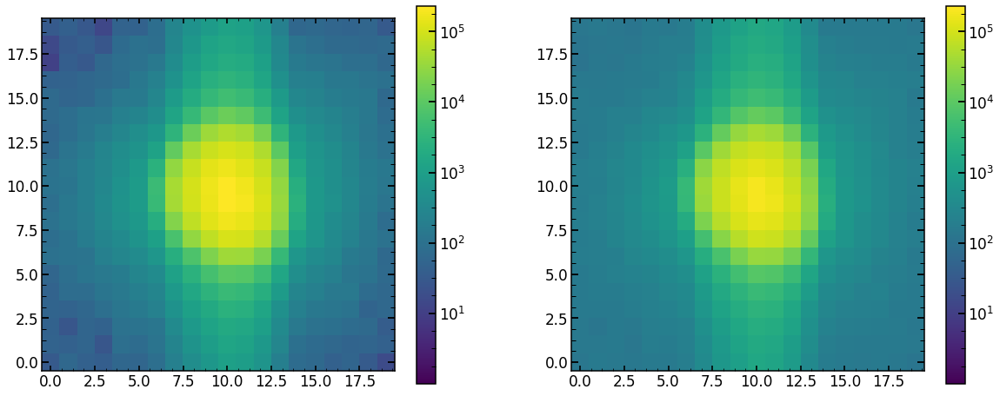

In [78]:
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(122)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [79]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Jun26/chainJun26_Single_P_19286555HgArEmcee3.npy'

In [69]:
19238+102

19340

In [59]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
    
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)


(42,)
          z4        z5       z6        z7        z8        z9       z10  \
0  30.422102 -1.684094 -1.26036 -0.094073 -0.109114 -0.153992 -0.479803   

        z11  
0 -0.007713  
       z12       z13       z14       z15       z16       z17       z18  \
0 -0.04653  0.030145  0.030633  0.063314  0.023448  0.079965  0.027719   

        z19       z20       z21  
0 -0.025752 -0.041546  0.042114  
        z22   hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.039753  0.671843   0.090892 -0.030853  0.125056  0.060847    -0.005872   

   radiometricEffect  radiometricExponent    x_ilum    ...     frd_sigma  \
0           0.000008             0.000008  0.973787    ...      0.037747   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.173979  1.091111            0.324654   33071.289374   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0          2.838372              0.013958      0.391984  1.817979  

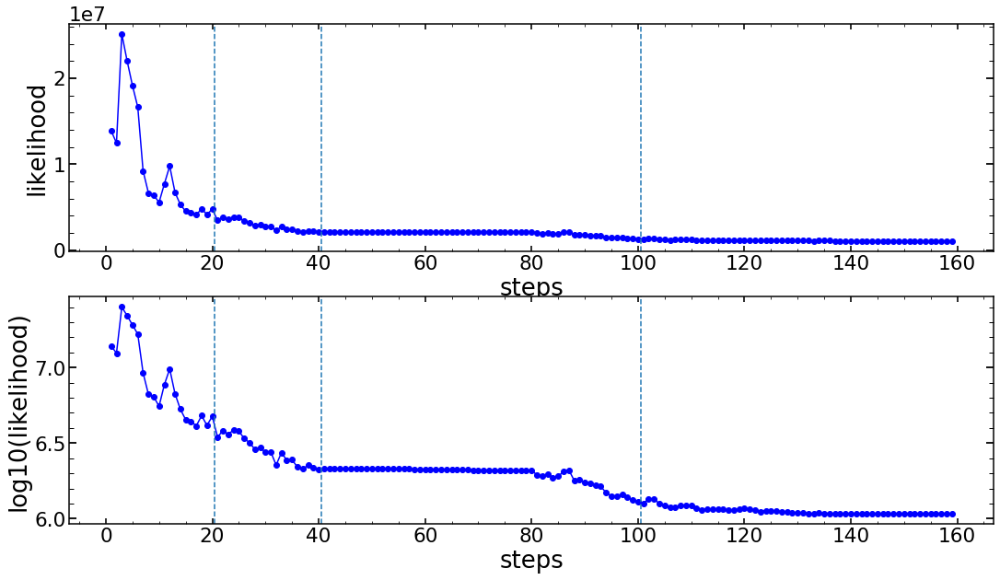

In [25]:
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')

In [26]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   
       
model(minchain)

extraZernike: None
zmax: 22
42


-1078864.2574093188

In [27]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
r_ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'r_ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')

wf=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf.npy') 
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
u_manual=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u_manual.npy')
wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')   
expwf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'expwf_grid.npy')      

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')
res_init=np.load(TESTING_FINAL_IMAGES_FOLDER+'res_init.npy')
res=np.load(TESTING_FINAL_IMAGES_FOLDER+'res.npy')


optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

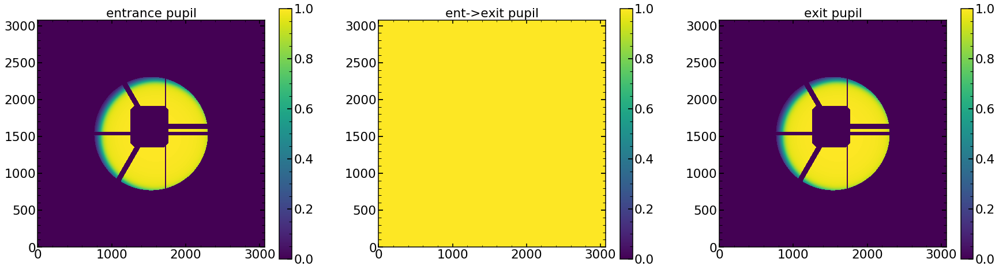

In [28]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

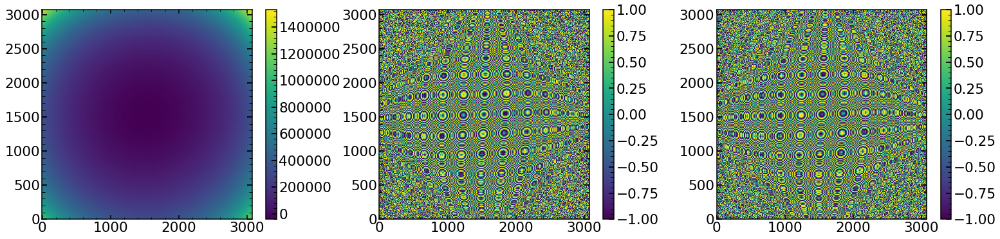

In [29]:
plt.figure(figsize=(36,6))
plt.subplot(141)
plt.imshow(wf_full)
plt.colorbar()

plt.subplot(142)
plt.imshow(np.real(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

plt.subplot(143)
plt.imshow(np.imag(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

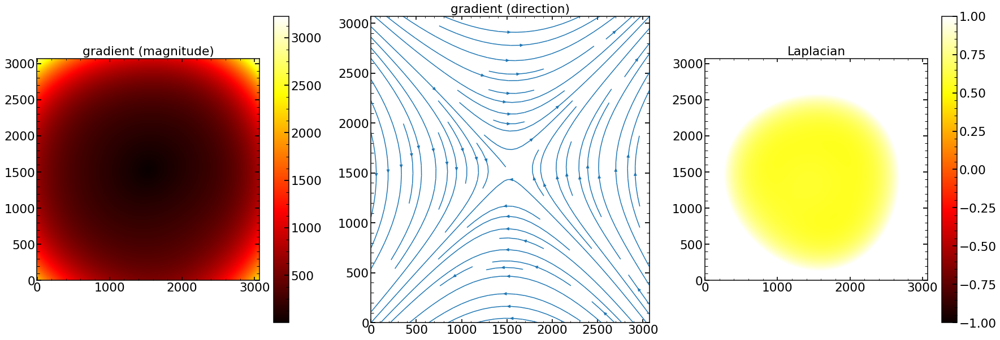

In [30]:
plt.figure(figsize=(30,10))
plt.subplot(131)
vgrad = np.gradient(wf_full)
fulgrad = np.sqrt(vgrad[0]**2 + vgrad[1]**2)
plt.title('gradient (magnitude)')
plt.imshow(fulgrad,cmap=plt.get_cmap('hot'), vmin = np.amin(fulgrad),vmax = np.amax(fulgrad))  
plt.colorbar()
plt.subplot(132)
x, y = range(0, len(wf_full)), range(0,len(wf_full))
xi, yi = np.meshgrid(x, y)
plt.title('gradient (direction)')
plt.streamplot(xi, yi, vgrad[0], vgrad[1])
plt.subplot(133)
laplace_of_wf = scipy.ndimage.filters.laplace(wf_full)
plt.title('Laplacian')
plt.imshow(laplace_of_wf,cmap=plt.get_cmap('hot'), vmin = -1,vmax = 1) 
plt.colorbar()

Text(0.5,1,'Residual')

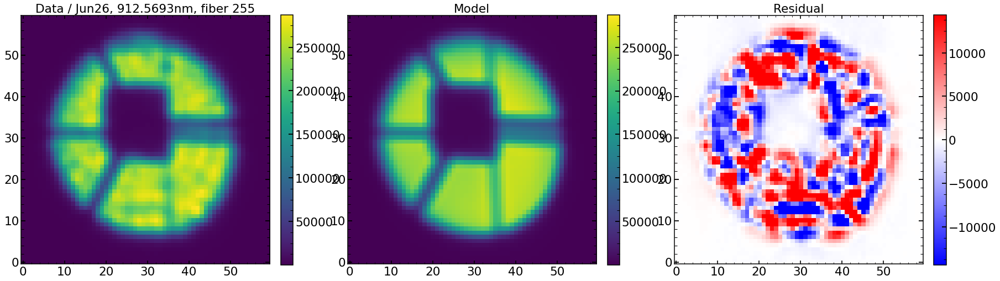

In [31]:
plt.figure(figsize=(30,12))
plt.subplot(1,3,1)
plt.imshow(sci_image,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(1,3,2)
plt.imshow(res_iapetus,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image-res_iapetus,vmin=-np.max(sci_image)/20,vmax=np.max(sci_image)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

chi**2 reduced is: 599.3631663972063
Abs of residual divided by total flux is: 0.05788900346700667
Abs of residual divided by largest value of a flux in the image is: 0.17659969301824743


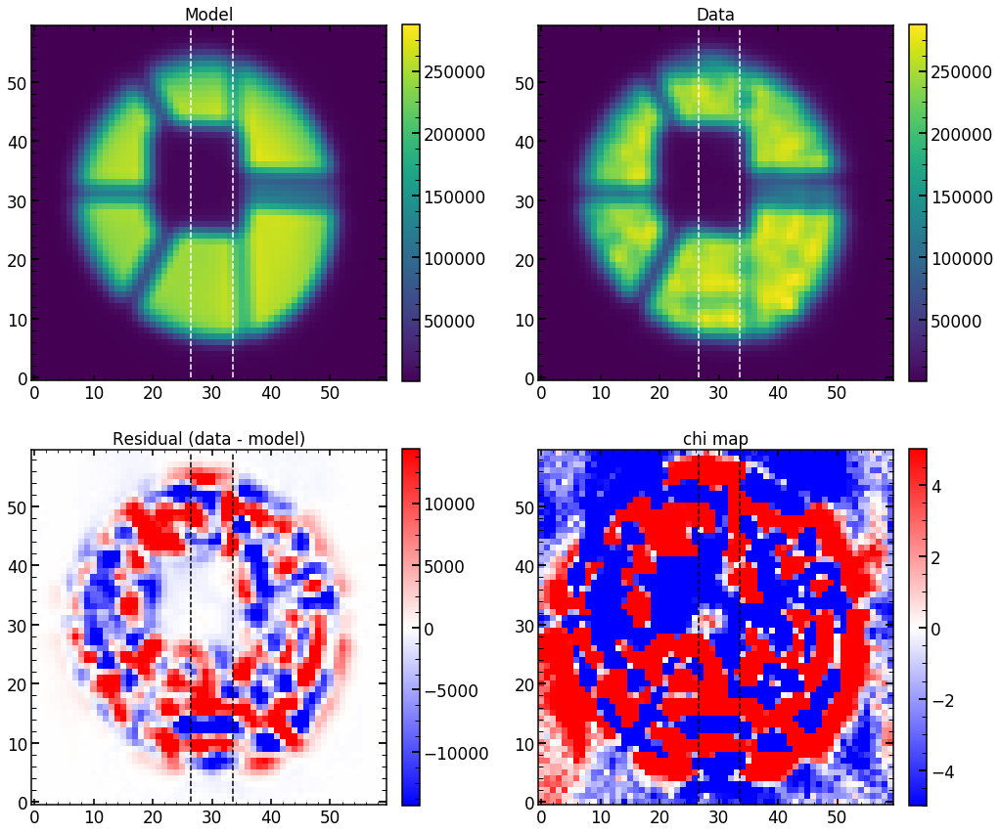

In [32]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

599.3631663972063
chi**2 reduced is: 599.3631663972063
Abs of residual divided by total flux is: 0.05788900346700667
Abs of residual divided by largest value of a flux in the image is: 0.17659969301824743


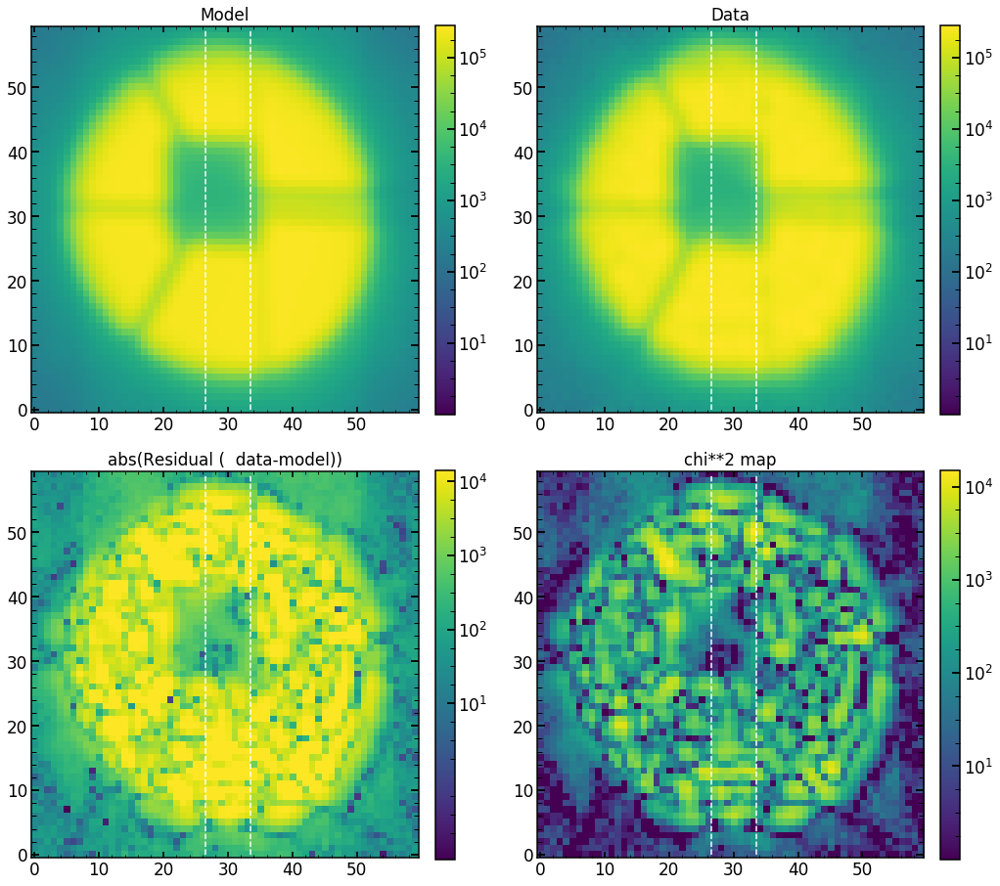

In [33]:
single_analysis.create_basic_comparison_plot_log()

599.3631663972063
chi**2 reduced is: 599.3631663972063
Abs of residual divided by total flux is: 0.05788900346700667
Abs of residual divided by largest value of a flux in the image is: 0.17659969301824743


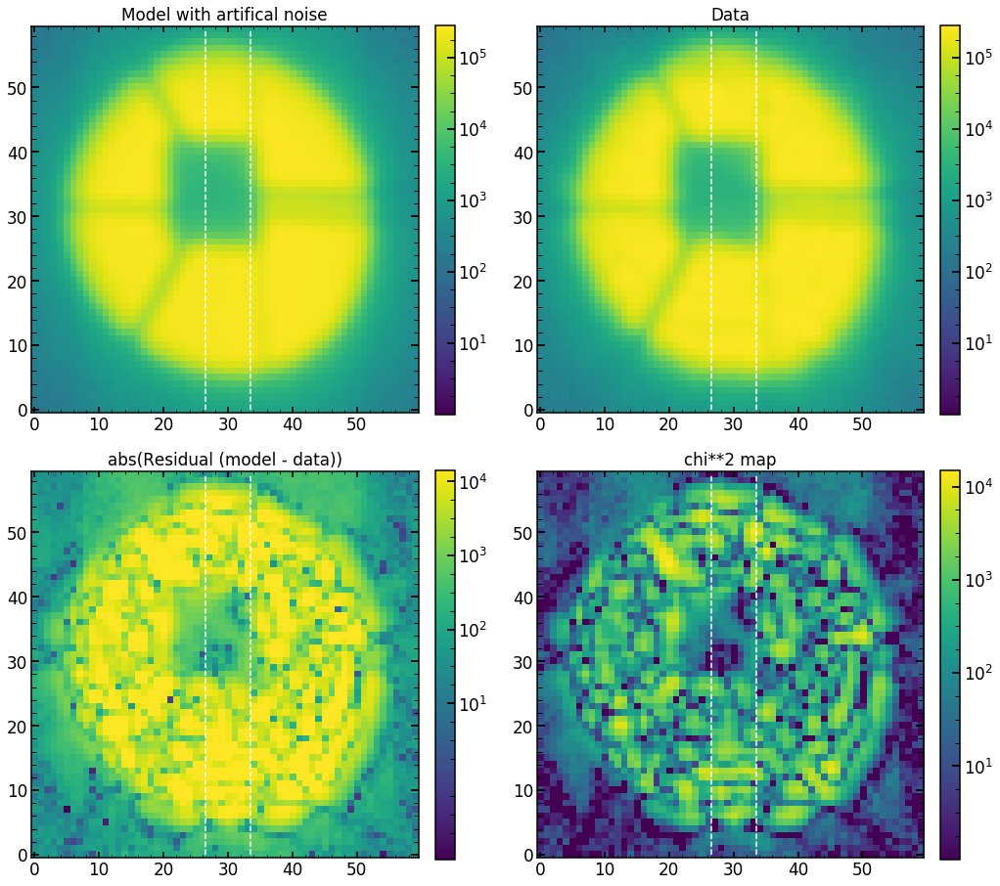

In [34]:
single_analysis.create_basic_comparison_plot_log_artifical()

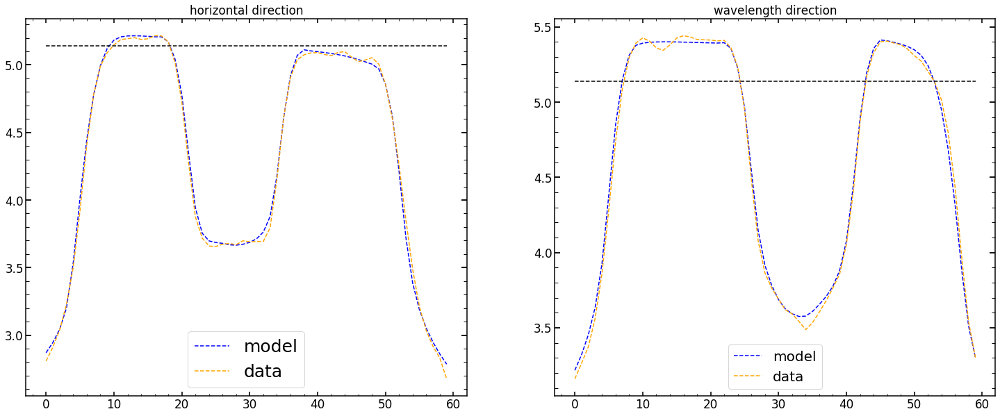

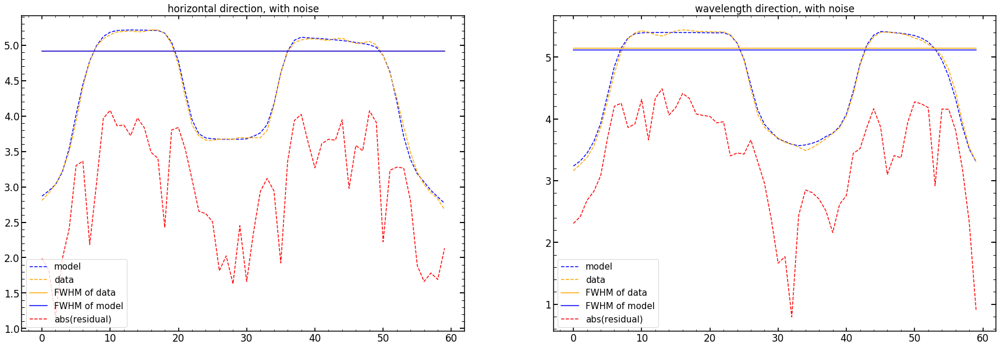

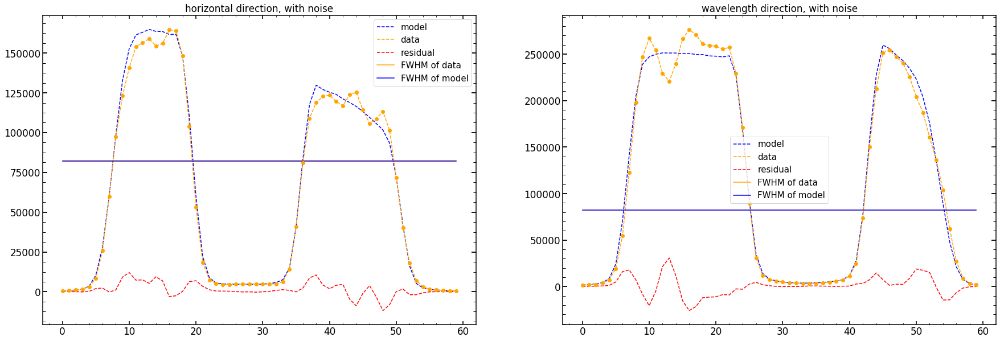

In [35]:
single_analysis.create_cut_plots()

## Creating  results everywhere

In [65]:
#single_number_for_single_pos_full=np.load("/Users/nevencaplar/Documents/PFS/2017-12-15/single_number_for_single_pos_full.npy") 

finalHgAr=finalHgAr_May2019
finalNe=finalNe_May2019
date='Jun26'

results_of_fit_many_single_defocus_HgAr=pd.DataFrame(np.zeros((len(finalHgAr),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalHgAr.index,columns=columns22_analysis)
err_results_of_fit_many_single_defocus_HgAr=pd.DataFrame(np.zeros((len(finalHgAr),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalHgAr.index,columns=columns22_analysis)

results_of_fit_many_single_defocus_HgAr_pd=pd.DataFrame(results_of_fit_many_single_defocus_HgAr)
err_results_of_fit_many_single_defocus_HgAr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_HgAr)

results_of_fit_many_HgAr = {'m4': results_of_fit_many_single_defocus_HgAr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_HgAr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']

for single_number in range(1,len(finalHgAr)):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single(date,single_number,'HgAr',22,3)
    solution_at_0=solution_at_0_and_plots(date,single_number,'HgAr',results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,False,22)
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
        #print(single_number,i)
        if len(results_of_fit_single)<=4:
            pass
        else:
            if i<18:
                results_of_fit_many_HgAr[label[i]].at[single_number]=results_of_fit_single.iloc[i]    
            else:
                results_of_fit_many_HgAr[label[18]].at[single_number]=np.concatenate((solution_at_0,np.array([1,1]))) 
            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:        
    results_of_fit_many_HgAr[label[i]]=results_of_fit_many_HgAr[label[i]][np.abs(results_of_fit_many_HgAr[label[i]]['z4'])>0]


22
1 obs (Emcee3): 19244 is found!
z6: failed!
radiometricExponent: failed!
x_ilum: failed!
z6: failed!
radiometricExponent: failed!
x_ilum: failed!
1 19250 HgAr is NOT found or failed!
1 obs (Emcee3): 19256 is found!
z8: failed!
radiometricExponent: failed!
z8: failed!
radiometricExponent: failed!
1 19262 HgAr is NOT found or failed!
1 19268 HgAr is NOT found or failed!
1 obs (Emcee3): 19274 is found!
radiometricExponent: failed!
x_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
1 19280 HgAr is NOT found or failed!
1 obs (Emcee3): 19286 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
1 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
1 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
1 obs

det_vert: failed!
grating_lines: failed!
flux: failed!
9 19250 HgAr is NOT found or failed!
9 obs (Emcee3): 19256 is found!
dyFocal: failed!
dyFocal: failed!
9 19262 HgAr is NOT found or failed!
9 19268 HgAr is NOT found or failed!
9 obs (Emcee3): 19274 is found!
frd_sigma: failed!
grating_lines: failed!
frd_sigma: failed!
grating_lines: failed!
9 19280 HgAr is NOT found or failed!
9 obs (Emcee3): 19286 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
9 obs (Emcee3): 19292 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
9 obs (Emcee3): 19292 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
9 obs (Emcee3): 19298 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
9 19304 HgAr is NOT found or failed!
9 obs (Emcee3): 19310 is found!
x_ilum: failed!
x_ilum: failed!
9 19316 HgAr is NOT found or failed!
9 19322 HgAr is NOT found or failed

22
16 19244 HgAr is NOT found or failed!
16 19250 HgAr is NOT found or failed!
16 19256 HgAr is NOT found or failed!
16 19262 HgAr is NOT found or failed!
16 19268 HgAr is NOT found or failed!
16 19274 HgAr is NOT found or failed!
16 19280 HgAr is NOT found or failed!
16 19286 HgAr is NOT found or failed!
16 19292 HgAr is NOT found or failed!
16 19292 HgAr is NOT found or failed!
16 19298 HgAr is NOT found or failed!
16 19304 HgAr is NOT found or failed!
16 19310 HgAr is NOT found or failed!
16 19316 HgAr is NOT found or failed!
16 19322 HgAr is NOT found or failed!
16 19328 HgAr is NOT found or failed!
16 19334 HgAr is NOT found or failed!
16 19340 HgAr is NOT found or failed!
16 19292 HgAr is NOT found or failed!
22
17 19244 HgAr is NOT found or failed!
17 19250 HgAr is NOT found or failed!
17 19256 HgAr is NOT found or failed!
17 19262 HgAr is NOT found or failed!
17 19268 HgAr is NOT found or failed!
17 19274 HgAr is NOT found or failed!
17 19280 HgAr is NOT found or failed!
17 192

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
23 19292 HgAr is NOT found or failed!
22
24 19244 HgAr is NOT found or failed!
24 19250 HgAr is NOT found or failed!
24 19256 HgAr is NOT found or failed!
24 19262 HgAr is NOT found or failed!
24 19268 HgAr is NOT found or failed!
24 19274 HgAr is NOT found or failed!
24 19280 HgAr is NOT found or failed!
24 19286 HgAr is NOT found or failed!
24 19292 HgAr is NOT found or failed!
24 19292 HgAr is NOT found or failed!
24 19298 HgAr is NOT found or failed!
24 19304 HgAr is NOT found or failed!
24 19310 HgAr is NOT found or failed!
24 19316 HgAr is NOT found or failed!
24 19322 HgAr is NOT found or failed!
24 19328 HgAr is NOT found or failed!
24 19334 HgAr is NOT found or failed!
24 19340 HgAr is NOT found or failed!
24 19292 HgAr is NOT found or failed!
22
25 obs (Emcee3): 19244 is found!
z7: failed!
radiometricExponent: failed!
x_ilum: failed!
z7: failed!
radiometri

33 19262 HgAr is NOT found or failed!
33 19268 HgAr is NOT found or failed!
33 obs (Emcee3): 19274 is found!
z13: failed!
y_ilum: failed!
z13: failed!
y_ilum: failed!
33 19280 HgAr is NOT found or failed!
33 obs (Emcee3): 19286 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
slitHolder_frac_dx: failed!
scattering_amplitude: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
slitHolder_frac_dx: failed!
scattering_amplitude: failed!
33 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
33 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
33 obs (Emcee3): 19298 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
33 19304 HgAr is NOT found or failed!
33 obs (Emcee3): 1931

x_ilum: failed!
y_ilum: failed!
39 19292 HgAr is NOT found or failed!
22
40 19244 HgAr is NOT found or failed!
40 19250 HgAr is NOT found or failed!
40 19256 HgAr is NOT found or failed!
40 19262 HgAr is NOT found or failed!
40 19268 HgAr is NOT found or failed!
40 19274 HgAr is NOT found or failed!
40 19280 HgAr is NOT found or failed!
40 19286 HgAr is NOT found or failed!
40 19292 HgAr is NOT found or failed!
40 19292 HgAr is NOT found or failed!
40 19298 HgAr is NOT found or failed!
40 19304 HgAr is NOT found or failed!
40 19310 HgAr is NOT found or failed!
40 19316 HgAr is NOT found or failed!
40 19322 HgAr is NOT found or failed!
40 19328 HgAr is NOT found or failed!
40 19334 HgAr is NOT found or failed!
40 19340 HgAr is NOT found or failed!
40 19292 HgAr is NOT found or failed!
22
41 19244 HgAr is NOT found or failed!
41 19250 HgAr is NOT found or failed!
41 19256 HgAr is NOT found or failed!
41 19262 HgAr is NOT found or failed!
41 19268 HgAr is NOT found or failed!
41 19274 HgA

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
47 19316 HgAr is NOT found or failed!
47 19322 HgAr is NOT found or failed!
47 19328 HgAr is NOT found or failed!
47 19334 HgAr is NOT found or failed!
47 19340 HgAr is NOT found or failed!
47 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
47 19292 HgAr is NOT found or failed!
22
48 19244 HgAr is NOT found or failed!
48 19250 HgAr is NOT found or failed!
48 19256 HgAr is NOT found or failed!
48 19262 HgAr is NOT found or failed!
48 19268 HgAr is NOT found or failed!
48 19274 HgAr is NOT found or failed!
48 19280 HgAr is NOT found or failed!
48 19286 HgAr is NOT found or failed!
48 19292 HgAr is NOT found or failed!
48 19292 HgAr is NOT found or failed!
48 19298 HgAr is NOT found or failed!
48 19304 HgAr is NOT found or failed!
48 19310 HgAr is NOT found or failed!
48 19316 HgAr is NOT found or failed!
48 19322 HgAr is NOT 

x_ilum: failed!
frd_lorentz_factor: failed!
57 19250 HgAr is NOT found or failed!
57 obs (Emcee3): 19256 is found!
hscFrac: failed!
dyFocal: failed!
radiometricExponent: failed!
y_ilum: failed!
hscFrac: failed!
dyFocal: failed!
radiometricExponent: failed!
y_ilum: failed!
57 19262 HgAr is NOT found or failed!
57 19268 HgAr is NOT found or failed!
57 obs (Emcee3): 19274 is found!
radiometricExponent: failed!
x_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
57 19280 HgAr is NOT found or failed!
57 obs (Emcee3): 19286 is found!
z14: failed!
radiometricExponent: failed!
y_ilum: failed!
frd_sigma: failed!
fiber_r: failed!
z14: failed!
radiometricExponent: failed!
y_ilum: failed!
frd_sigma: failed!
fiber_r: failed!
57 obs (Emcee3): 19292 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
57 obs (Emcee3): 19292 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
57 obs (Emcee3): 19298 is found!
z7: failed!
z9: failed!
z16: failed!
dyFoc

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
63 19304 HgAr is NOT found or failed!
63 19310 HgAr is NOT found or failed!
63 19316 HgAr is NOT found or failed!
63 19322 HgAr is NOT found or failed!
63 19328 HgAr is NOT found or failed!
63 19334 HgAr is NOT found or failed!
63 19340 HgAr is NOT found or failed!
63 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
63 19292 HgAr is NOT found or failed!
22
64 19244 HgAr is NOT found or failed!
64 19250 HgAr is NOT found or failed!
64 19256 HgAr is NOT found or failed!
64 19262 HgAr is NOT found or failed!
64 19268 HgAr is NOT found or failed!
64 19274 HgAr is NOT found or failed!
64 19280 HgAr is NOT found or failed!
64 19286 HgAr is NOT found or failed!
64 19292 HgAr is NOT found or failed!
64 19292 HgAr is NOT found or failed!
64 19298 HgAr is NOT found or failed

y_ilum: failed!
71 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
71 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
71 19298 HgAr is NOT found or failed!
71 19304 HgAr is NOT found or failed!
71 obs (Emcee3): 19310 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
71 19316 HgAr is NOT found or failed!
71 19322 HgAr is NOT found or failed!
71 19328 HgAr is NOT found or failed!
71 19334 HgAr is NOT found or failed!
71 19340 HgAr is NOT found or failed!
71 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
71 19292 HgAr is NOT found or failed!
22
72 19244 HgAr is NOT found or failed!
72 19250 HgAr is NO

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
78 19304 HgAr is NOT found or failed!
78 obs (Emcee3): 19310 is found!
radiometricExponent: failed!
y_ilum: failed!
radiometricExponent: failed!
y_ilum: failed!
78 19316 HgAr is NOT found or failed!
78 19322 HgAr is NOT found or failed!
78 19328 HgAr is NOT found or failed!
78 19334 HgAr is NOT found or failed!
78 19340 HgAr is NOT found or failed!
78 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
78 19292 HgAr is NOT found or failed!
22
79 19244 HgAr is NOT found or failed!
79 19250 HgAr is NOT found or failed!
79 19256 HgAr is NOT found or failed!
79 19262 HgAr is NOT found or failed!
79 19268 HgAr is NOT found or failed!
79 19274 HgAr is NOT found or failed!
79 19280 HgAr is NOT found or failed!
79 19286 HgAr is NOT found or failed!
79 19292 HgAr is NOT found or failed!
79 19292 HgAr is NOT found or failed!
79 19298 HgA

85 19292 HgAr is NOT found or failed!
22
86 19244 HgAr is NOT found or failed!
86 19250 HgAr is NOT found or failed!
86 19256 HgAr is NOT found or failed!
86 19262 HgAr is NOT found or failed!
86 19268 HgAr is NOT found or failed!
86 19274 HgAr is NOT found or failed!
86 19280 HgAr is NOT found or failed!
86 19286 HgAr is NOT found or failed!
86 19292 HgAr is NOT found or failed!
86 19292 HgAr is NOT found or failed!
86 19298 HgAr is NOT found or failed!
86 19304 HgAr is NOT found or failed!
86 19310 HgAr is NOT found or failed!
86 19316 HgAr is NOT found or failed!
86 19322 HgAr is NOT found or failed!
86 19328 HgAr is NOT found or failed!
86 19334 HgAr is NOT found or failed!
86 19340 HgAr is NOT found or failed!
86 19292 HgAr is NOT found or failed!
22
87 obs (Emcee3): 19244 is found!
radiometricExponent: failed!
radiometricExponent: failed!
87 19250 HgAr is NOT found or failed!
87 obs (Emcee3): 19256 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
87 19262

93 19316 HgAr is NOT found or failed!
93 19322 HgAr is NOT found or failed!
93 19328 HgAr is NOT found or failed!
93 19334 HgAr is NOT found or failed!
93 19340 HgAr is NOT found or failed!
93 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
93 19292 HgAr is NOT found or failed!
22
94 19244 HgAr is NOT found or failed!
94 19250 HgAr is NOT found or failed!
94 19256 HgAr is NOT found or failed!
94 19262 HgAr is NOT found or failed!
94 19268 HgAr is NOT found or failed!
94 19274 HgAr is NOT found or failed!
94 19280 HgAr is NOT found or failed!
94 19286 HgAr is NOT found or failed!
94 19292 HgAr is NOT found or failed!
94 19292 HgAr is NOT found or failed!
94 19298 HgAr is NOT found or failed!
94 19304 HgAr is NOT found or failed!
94 19310 HgAr is NOT found or failed!
94 19316 HgAr is NOT found or failed!
94 19322 HgAr is NOT found or failed!
94 19328 HgAr is NOT found or failed!
94 193

radiometricExponent: failed!
x_ilum: failed!
102 19250 HgAr is NOT found or failed!
102 obs (Emcee3): 19256 is found!
z4: failed!
dxFocal: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
effective_radius_illumination: failed!
grating_lines: failed!
z4: failed!
dxFocal: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
effective_radius_illumination: failed!
grating_lines: failed!
102 19262 HgAr is NOT found or failed!
102 19268 HgAr is NOT found or failed!
102 obs (Emcee3): 19274 is found!
slitFrac_dy: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
102 19280 HgAr is NOT found or failed!
102 obs (Emcee3): 19286 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
102 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: fa

slitFrac: failed!
x_ilum: failed!
slitFrac: failed!
x_ilum: failed!
109 19262 HgAr is NOT found or failed!
109 19268 HgAr is NOT found or failed!
109 obs (Emcee3): 19274 is found!
radiometricExponent: failed!
x_ilum: failed!
frd_lorentz_factor: failed!
radiometricExponent: failed!
x_ilum: failed!
frd_lorentz_factor: failed!
109 19280 HgAr is NOT found or failed!
109 obs (Emcee3): 19286 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
109 obs (Emcee3): 19292 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
109 obs (Emcee3): 19292 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
109 obs (Emcee3): 19298 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
109 19304 HgAr is NOT found or failed!
109 obs (Emcee3): 19310 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum

117 19250 HgAr is NOT found or failed!
117 obs (Emcee3): 19256 is found!
dyFocal: failed!
radiometricExponent: failed!
dyFocal: failed!
radiometricExponent: failed!
117 19262 HgAr is NOT found or failed!
117 19268 HgAr is NOT found or failed!
117 obs (Emcee3): 19274 is found!
slitFrac_dy: failed!
radiometricExponent: failed!
y_ilum: failed!
y_fiber: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
y_ilum: failed!
y_fiber: failed!
117 19280 HgAr is NOT found or failed!
117 obs (Emcee3): 19286 is found!
dxFocal: failed!
x_ilum: failed!
y_ilum: failed!
dxFocal: failed!
x_ilum: failed!
y_ilum: failed!
117 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
117 obs (Emcee3): 19292 is found!
radiometricExponent: failed!
x_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
117 obs (Emcee3): 19298 is found!
117 19304 HgAr is NOT found or failed!
117 obs (Emcee3): 19310 is found!
z6: failed!
x_ilum: failed!
y_i

In [37]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalNe.index,columns=columns22_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns22_analysis))).reshape(-1,len(columns22_analysis)),index=finalNe.index,columns=columns22_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)


results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

for single_number in range(len(finalNe)):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single(date,single_number,'Ne',22,3)
    solution_at_0=solution_at_0_and_plots(date,single_number,'Ne',results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,True,22)
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
        #print(single_number,i)
        if len(results_of_fit_single)<=4:
            pass
        else:
            if i<18:
                results_of_fit_many_Ne[label[i]].at[single_number]=results_of_fit_single.iloc[i]    
            else:
                results_of_fit_many_Ne[label[18]].at[single_number]=np.concatenate((solution_at_0,np.array([1,1]))) 
            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]


22
0 19478 Ne is NOT found or failed!
0 19484 Ne is NOT found or failed!
0 19490 Ne is NOT found or failed!
0 19496 Ne is NOT found or failed!
0 19502 Ne is NOT found or failed!
0 19508 Ne is NOT found or failed!
0 19514 Ne is NOT found or failed!
0 19520 Ne is NOT found or failed!
0 19526 Ne is NOT found or failed!
0 19526 Ne is NOT found or failed!
0 19532 Ne is NOT found or failed!
0 19538 Ne is NOT found or failed!
0 19544 Ne is NOT found or failed!
0 19550 Ne is NOT found or failed!
0 19556 Ne is NOT found or failed!
0 19562 Ne is NOT found or failed!
0 19568 Ne is NOT found or failed!
0 19574 Ne is NOT found or failed!
0 19526 Ne is NOT found or failed!
22
1 19478 Ne is NOT found or failed!
1 19484 Ne is NOT found or failed!
1 19490 Ne is NOT found or failed!
1 19496 Ne is NOT found or failed!
1 19502 Ne is NOT found or failed!
1 19508 Ne is NOT found or failed!
1 19514 Ne is NOT found or failed!
1 19520 Ne is NOT found or failed!
1 19526 Ne is NOT found or failed!
1 19526 Ne is 

frd_sigma: failed!
11 19490 Ne is NOT found or failed!
11 19496 Ne is NOT found or failed!
11 19502 Ne is NOT found or failed!
11 19508 Ne is NOT found or failed!
11 obs (Emcee3): 19514 is found!
slitFrac_dy: failed!
radiometricExponent: failed!
y_fiber: failed!
pixel_effect: failed!
slitFrac_dy: failed!
radiometricExponent: failed!
y_fiber: failed!
pixel_effect: failed!
11 obs (Emcee3): 19520 is found!
y_ilum: failed!
y_ilum: failed!
11 obs (Emcee3): 19526 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
11 obs (Emcee3): 19526 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
11 19532 Ne is NOT found or failed!
11 obs (Emcee3): 19538 is found!
11 19544 Ne is NOT found or failed!
11 19550 Ne is NOT found or failed!
11 19556 Ne is NOT found or failed!
11 19562 Ne is NOT found or failed!
11 obs (Emcee3): 19568 is found!
z14: 

radiometricExponent: failed!
x_ilum: failed!
20 19490 Ne is NOT found or failed!
20 19496 Ne is NOT found or failed!
20 19502 Ne is NOT found or failed!
20 19508 Ne is NOT found or failed!
20 19514 Ne is NOT found or failed!
20 obs (Emcee3): 19520 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
20 19526 Ne is NOT found or failed!
20 19526 Ne is NOT found or failed!
20 19532 Ne is NOT found or failed!
20 19538 Ne is NOT found or failed!
20 19544 Ne is NOT found or failed!
20 19550 Ne is NOT found or failed!
20 19556 Ne is NOT found or failed!
20 19562 Ne is NOT found or failed!
20 19568 Ne is NOT found or failed!
20obs (Emcee2): 19574 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
20 19526 Ne is NOT found or failed!
22
21 19478 Ne is NOT found or failed!
21 19484 Ne is NOT found or failed!
21 19490 Ne is NOT found or failed!
21 19496 Ne is NOT found or failed!
21 19502 Ne is NO

29 19532 Ne is NOT found or failed!
29 obs (Emcee3): 19538 is found!
z16: failed!
z22: failed!
radiometricExponent: failed!
x_ilum: failed!
scattering_amplitude: failed!
z16: failed!
z22: failed!
radiometricExponent: failed!
x_ilum: failed!
scattering_amplitude: failed!
29 19544 Ne is NOT found or failed!
29 19550 Ne is NOT found or failed!
29 19556 Ne is NOT found or failed!
29 19562 Ne is NOT found or failed!
29 obs (Emcee3): 19568 is found!
radiometricExponent: failed!
x_ilum: failed!
frd_lorentz_factor: failed!
radiometricExponent: failed!
x_ilum: failed!
frd_lorentz_factor: failed!
29 obs (Emcee3): 19574 is found!
y_ilum: failed!
y_ilum: failed!
29 obs (Emcee3): 19526 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
29 19526 Ne is NOT found or failed!
22
30 19478 Ne is NOT found or failed!
30 19484 Ne is NOT found or failed!
30 19490 Ne is NOT found or failed!
30 19496 Ne is NOT found or failed!
30 

38 obs (Emcee3): 19574 is found!
38 obs (Emcee3): 19526 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
38 19526 Ne is NOT found or failed!
22
39 19478 Ne is NOT found or failed!
39 19484 Ne is NOT found or failed!
39 19490 Ne is NOT found or failed!
39 19496 Ne is NOT found or failed!
39 19502 Ne is NOT found or failed!
39 19508 Ne is NOT found or failed!
39 19514 Ne is NOT found or failed!
39 19520 Ne is NOT found or failed!
39 19526 Ne is NOT found or failed!
39 19526 Ne is NOT found or failed!
39 19532 Ne is NOT found or failed!
39 19538 Ne is NOT found or failed!
39 19544 Ne is NOT found or failed!
39 19550 Ne is NOT found or failed!
39 19556 Ne is NOT found or failed!
39 19562 Ne is NOT found or failed!
39 19568 Ne is NOT found or failed!
39 19574 Ne is NOT found or failed!
39 19526 Ne is NOT found or failed!
22
40 19478 Ne is NOT found or failed!
40 19484 Ne is NOT found or failed!
40 19490 Ne is NOT found or failed!
40 19496 Ne is NOT found or failed!


47 obs (Emcee3): 19568 is found!
scattering_slope: failed!
scattering_slope: failed!
47 obs (Emcee3): 19574 is found!
47 obs (Emcee3): 19526 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
47 19526 Ne is NOT found or failed!
22
48 19478 Ne is NOT found or failed!
48 19484 Ne is NOT found or failed!
48 19490 Ne is NOT found or failed!
48 19496 Ne is NOT found or failed!
48 19502 Ne is NOT found or failed!
48 19508 Ne is NOT found or failed!
48 19514 Ne is NOT found or failed!
48 19520 Ne is NOT found or failed!
48 19526 Ne is NOT found or failed!
48 19526 Ne is NOT found or failed!
48 19532 Ne is NOT found or failed!
48 19538 Ne is NOT found or failed!
48 19544 Ne is NOT found or failed!
48 19550 Ne is NOT found or failed!
48 19556 Ne is NOT found or failed!
48 19562 Ne is NOT found or failed!
48 19568 Ne is NOT found or failed!
48 19574 Ne is NOT found or failed!
48 19526 Ne is NOT found or failed!
22
4

56 19526 Ne is NOT found or failed!
22
57 19478 Ne is NOT found or failed!
57 19484 Ne is NOT found or failed!
57 19490 Ne is NOT found or failed!
57 19496 Ne is NOT found or failed!
57 19502 Ne is NOT found or failed!
57 19508 Ne is NOT found or failed!
57 19514 Ne is NOT found or failed!
57 19520 Ne is NOT found or failed!
57 19526 Ne is NOT found or failed!
57 19526 Ne is NOT found or failed!
57 19532 Ne is NOT found or failed!
57 19538 Ne is NOT found or failed!
57 19544 Ne is NOT found or failed!
57 19550 Ne is NOT found or failed!
57 19556 Ne is NOT found or failed!
57 19562 Ne is NOT found or failed!
57 19568 Ne is NOT found or failed!
57 19574 Ne is NOT found or failed!
57 19526 Ne is NOT found or failed!
22
58 19478 Ne is NOT found or failed!
58 19484 Ne is NOT found or failed!
58 19490 Ne is NOT found or failed!
58 19496 Ne is NOT found or failed!
58 19502 Ne is NOT found or failed!
58 19508 Ne is NOT found or failed!
58 19514 Ne is NOT found or failed!
58 19520 Ne is NOT fou

radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
65 19526 Ne is NOT found or failed!
22
66 19478 Ne is NOT found or failed!
66 19484 Ne is NOT found or failed!
66 19490 Ne is NOT found or failed!
66 19496 Ne is NOT found or failed!
66 19502 Ne is NOT found or failed!
66 19508 Ne is NOT found or failed!
66 19514 Ne is NOT found or failed!
66 19520 Ne is NOT found or failed!
66 19526 Ne is NOT found or failed!
66 19526 Ne is NOT found or failed!
66 19532 Ne is NOT found or failed!
66 19538 Ne is NOT found or failed!
66 19544 Ne is NOT found or failed!
66 19550 Ne is NOT found or failed!
66 19556 Ne is NOT found or failed!
66 19562 Ne is NOT found or failed!
66 19568 Ne is NOT found or failed!
66 19574 Ne is NOT found or failed!
66 19526 Ne is NOT found or failed!
22
67 19478 Ne is NOT found or failed!
67 19484 Ne is NOT found or failed!
67 19490 Ne is NOT found or failed!
67 19496 Ne is NOT found or failed!
67 19502 Ne is NOT found or failed!
67 19508 Ne is NOT found or faile

x_ilum: failed!
y_ilum: failed!
scattering_amplitude: failed!
z15: failed!
z17: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
scattering_amplitude: failed!
74 19544 Ne is NOT found or failed!
74 19550 Ne is NOT found or failed!
74 19556 Ne is NOT found or failed!
74 19562 Ne is NOT found or failed!
74 obs (Emcee3): 19568 is found!
radiometricExponent: failed!
radiometricExponent: failed!
74 obs (Emcee3): 19574 is found!
radiometricExponent: failed!
y_ilum: failed!
scattering_slope: failed!
radiometricExponent: failed!
y_ilum: failed!
scattering_slope: failed!
74 obs (Emcee3): 19526 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
74 19526 Ne is NOT found or failed!
22
75 19478 Ne is NOT found or failed!
75 19484 Ne is NOT found or failed!
75 19490 Ne is NOT found or failed!
75 19496 Ne is NOT found or failed!
75 19502 Ne is NOT found or failed!
75 19508 Ne is NOT found or failed!
7

83 obs (Emcee3): 19520 is found!
z7: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
grating_lines: failed!
scattering_slope: failed!
z7: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
grating_lines: failed!
scattering_slope: failed!
83 obs (Emcee3): 19526 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
83 obs (Emcee3): 19526 is found!
x_ilum: failed!
y_ilum: failed!
x_ilum: failed!
y_ilum: failed!
83 19532 Ne is NOT found or failed!
83 obs (Emcee3): 19538 is found!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
83 19544 Ne is NOT found or failed!
83 19550 Ne is NOT found or failed!
83 19556 Ne is NOT found or failed!
83 19562 Ne is NOT found or failed!
83 obs (Emcee3): 19568 is found!
dxFocal: failed!
x_ilum: failed!
dxFocal: failed!
x_ilum: failed!
83 obs (Emcee3): 19574 is found!
radiometricExponent: failed!
radiometricExponent: failed!
83 o

In [70]:
labels_with_data_HgAr=[]
for i in range(len(label[:-1])):
    if len(results_of_fit_many_HgAr[label[i]])>5:
        labels_with_data_HgAr.append(i)
        
labels_with_data_Ne=[]
for i in range(len(label[:-1])):
    if len(results_of_fit_many_Ne[label[i]])>5:
        labels_with_data_Ne.append(i)
        
labels_with_data=np.unique(labels_with_data_HgAr+labels_with_data_Ne)

In [71]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jun260119/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_Jun26.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_HgAr,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jun26.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)

In [76]:
results_of_fit_many_HgAr['0p']

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
1,1.079702,0.153748,0.248469,0.753082,-1.253488,0.189114,-0.288838,0.008181,-0.369180,-0.242722,...,1.028247,0.498709,84696.830331,2.383188,0.002101,0.379970,1.831841,0.999671,1.0,1.0
3,3.133922,-0.008048,0.605862,0.787580,0.406627,0.011312,-0.491540,-0.168798,-0.424552,0.200981,...,0.989383,-0.155451,53967.174718,2.291142,0.001458,0.361042,1.825553,0.998925,1.0,1.0
6,-0.234604,-0.227444,-0.019073,0.095430,0.692454,0.054874,-0.392354,-0.142871,-0.187253,0.007888,...,1.016192,-0.066933,85304.534204,2.768115,0.003997,0.409411,1.819013,0.998673,1.0,1.0
9,0.267014,-1.541215,0.673598,-0.308773,1.583877,-0.328897,-0.045239,0.804170,-0.046723,0.372635,...,1.029847,0.562435,62065.586009,2.757144,0.005932,0.401449,1.859576,0.999642,1.0,1.0
13,1.760683,0.441554,-0.101693,0.547959,-0.145209,0.117513,-0.606661,-0.516633,-0.261611,-0.222996,...,1.016276,0.408288,100785.788557,2.400296,0.002248,0.357526,1.820986,0.999479,1.0,1.0
15,5.779763,0.216071,-0.819715,1.517798,1.794377,0.121678,-0.173640,0.224500,-0.062639,-0.187529,...,0.992335,0.338654,90939.860508,2.536530,0.003144,0.377425,1.815696,0.997078,1.0,1.0
18,3.825862,0.032603,0.219716,0.180049,0.762267,-0.091490,-0.262752,-0.437065,-0.139308,-0.011083,...,0.989359,0.528299,91172.983515,2.583510,0.002881,0.354455,1.849460,0.999601,1.0,1.0
21,-0.492872,-1.078011,-1.457636,-0.323517,0.445906,-0.254609,-1.079561,0.665123,-0.047428,0.047693,...,1.042494,0.436244,58707.517549,2.511975,0.002931,0.442368,1.891344,0.999211,1.0,1.0
23,0.535332,-0.150798,-0.609165,-0.308403,-0.160070,-0.221444,-0.820269,-0.001704,0.026963,0.061575,...,1.065887,0.487132,24125.859530,2.486696,0.004281,0.404619,1.827820,0.996412,1.0,1.0
27,0.162279,0.196571,-0.413972,1.049154,0.942314,0.355855,0.134028,-0.518530,-0.030377,-0.181292,...,1.006439,0.394375,96140.975853,2.643133,0.004930,0.425176,1.830808,0.998228,1.0,1.0


In [73]:
# plot the results of the first fit

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Jun26'
zMax=22
descriptions=results_of_fit_many_HgAr[label[0]].columns
# j runs throught the amount of defocus that we have analyzed
for j in tqdm(np.concatenate((np.array(labels_with_data),np.array([18])))):
    print("Plotting "+str(label[j])+' now')
    # i runs through all the parameters
    for i in range(0,len(descriptions)):
        # take values for HgAr
        
        x_HgAr=finalHgAr.loc[results_of_fit_many_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_HgAr=finalHgAr.loc[results_of_fit_many_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_HgAr=np.array(results_of_fit_many_HgAr[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_Ne[label[j]][descriptions[i]])

        # this was when I had only HgAr
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_HgAr,x_Ne))
        y=np.concatenate((y_HgAr,y_Ne))    
        colors= np.concatenate((values_HgAr,values_Ne))
        

        
        
        # size of point
        # this was when I had only HgAr
        #area = np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2).ravel()  # 0 to 15 point radii
        area = np.concatenate((np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2),np.full((1,len(values_Ne)),np.pi * (10 * 1)**2)),axis=1).ravel()  # 0 to 15 point radii
        

        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z22
            if np.in1d([i],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1        
        
        
        
        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

  0%|          | 0/15 [00:00<?, ?it/s]

Plotting m4 now
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun26/Plane/m4/


  7%|▋         | 1/15 [00:23<05:22, 23.02s/it]

Plotting m35 now


 13%|█▎        | 2/15 [00:46<05:03, 23.37s/it]

Plotting m3 now
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun26/Plane/m3/


 20%|██        | 3/15 [01:13<04:52, 24.38s/it]

Plotting m2 now


 27%|██▋       | 4/15 [01:50<05:02, 27.52s/it]

Plotting m15 now
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun26/Plane/m15/


 33%|███▎      | 5/15 [02:16<04:32, 27.22s/it]

Plotting m1 now


 40%|████      | 6/15 [02:41<04:01, 26.88s/it]

Plotting m05 now


 47%|████▋     | 7/15 [03:06<03:33, 26.71s/it]

Plotting 0 now


 53%|█████▎    | 8/15 [03:32<03:06, 26.60s/it]

Plotting 0d now


 60%|██████    | 9/15 [03:58<02:39, 26.51s/it]

Plotting p05 now


 67%|██████▋   | 10/15 [04:24<02:12, 26.43s/it]

Plotting p1 now


 73%|███████▎  | 11/15 [04:49<01:45, 26.33s/it]

Plotting p15 now
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Jun26/Plane/p15/


 80%|████████  | 12/15 [05:15<01:18, 26.33s/it]

Plotting p35 now


 87%|████████▋ | 13/15 [05:42<00:52, 26.33s/it]

Plotting p4 now


 93%|█████████▎| 14/15 [06:08<00:26, 26.30s/it]

Plotting 0p now


100%|██████████| 15/15 [06:35<00:00, 26.34s/it]


<Figure size 864x720 with 0 Axes>

# Jun 47 - Focus 1 for F/2.5

## Preparation of scripts

In [47]:
list_of_HgAr_to_analyze=results_of_fit_many_HgAr['0p'].index.values
list_of_Ne_to_analyze=results_of_fit_many_Ne['0p'].index.values
print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ne_to_analyze))

34
15


In [48]:
list_of_HgAr_to_analyze_10=np.array_split(list_of_HgAr_to_analyze,8)

list_of_Ne_to_analyze_10=np.array_split(list_of_Ne_to_analyze,8)

In [52]:
list_of_HgAr_to_analyze_10[0]

array([ 1,  3,  6,  9, 13])

In [82]:
#MPI
for i in range(len(list_of_HgAr_to_analyze_10)):
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T05'+str(i)+'Jun_focus.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for single_spot in list_of_HgAr_to_analyze_10[i]:
        for obs in [19292]:
            file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI02_focus.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr 3\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger05_focus'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(len(list_of_HgAr_to_analyze_10)):
    file.write('sbatch /home/ncaplar/Scripts/T05'+str(i)+'Jun_focus.sh \n')

file.close()

In [83]:
#MPI
for i in range(len(list_of_Ne_to_analyze_10)):
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T06'+str(i)+'Jun_focus.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for single_spot in list_of_Ne_to_analyze_10[i]:
        for obs in [19526]:
            file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Jun_MPI02_focus.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne 3\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/JunScriptToSubmitScriptsTiger06_focus'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(len(list_of_Ne_to_analyze_10)):
    file.write('sbatch /home/ncaplar/Scripts/T06'+str(i)+'Jun_focus.sh \n')

file.close()

## which images are avaliable

## Analysis of a single

## Creating  results everywhere

# Comparing results from dataset=1, dataset=2, dataset=3

## which ones are avaliable in all 

In [561]:
def which_ones_are_avaliable_in_all(date,local=None):
    if local==None:
        Emcee3_Ne=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5NeEmcee3.npy', recursive=True)
        Emcee3_HgAr=glob.glob('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5HgArEmcee3.npy', recursive=True)
        
        analyzed_Neon_images=[]
        for i in range(len(Emcee3_Ne)):
            single_string=Emcee3_Ne[i][90:len(Emcee3_Ne[i])-13]
            analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:])])

        analyzed_Neon_images=np.array(analyzed_Neon_images)

        analyzed_HgAr_images=[]
        for i in range(len(Emcee3_HgAr)):
            single_string=Emcee3_HgAr[i][90:len(Emcee3_HgAr[i])-15]
            analyzed_HgAr_images.append([int(single_string[:5]),int(single_string[5:])])

        analyzed_HgAr_images=np.array(analyzed_HgAr_images)
        
    if local==1: 
        Emcee3_Ne=glob.glob('/Volumes/My Passport for Mac/Old_Files/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5NeEmcee3.npy', recursive=True)
        Emcee3_HgAr=glob.glob('/Volumes/My Passport for Mac/Old_Files/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_*5HgArEmcee3.npy', recursive=True)       

        analyzed_Neon_images=[]
        for i in range(len(Emcee3_Ne)):
            single_string=Emcee3_Ne[i][100:len(Emcee3_Ne[i])-13]
            analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:])])

        analyzed_Neon_images=np.array(analyzed_Neon_images)

        analyzed_HgAr_images=[]
        for i in range(len(Emcee3_HgAr)):
            single_string=Emcee3_HgAr[i][100:len(Emcee3_HgAr[i])-15]
            analyzed_HgAr_images.append([int(single_string[:5]),int(single_string[5:])])

        analyzed_HgAr_images=np.array(analyzed_HgAr_images)
    
    
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]

    arranged_by_defocus_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,0].argsort()]
    arranged_by_spot_number_HgAr=analyzed_HgAr_images[analyzed_HgAr_images[:,1].argsort()]
    
    return(arranged_by_defocus_HgAr,arranged_by_spot_number_HgAr,arranged_by_defocus_Ne,arranged_by_spot_number_Ne)

In [564]:
arranged_by_defocus_HgAr_dataset_1,arranged_by_spot_number_HgAr_dataset_1,arranged_by_defocus_Ne_dataset_1,arranged_by_spot_number_Ne_dataset_1=which_ones_are_avaliable_in_all('Apr16',1)
arranged_by_defocus_HgAr_dataset_2,arranged_by_spot_number_HgAr_dataset_2,arranged_by_defocus_Ne_dataset_2,arranged_by_spot_number_Ne_dataset_2=which_ones_are_avaliable_in_all('Jun13')
arranged_by_defocus_HgAr_dataset_3,arranged_by_spot_number_HgAr_dataset_3,arranged_by_defocus_Ne_dataset_3,arranged_by_spot_number_Ne_dataset_3=which_ones_are_avaliable_in_all('Jun26')

In [565]:
if dataset==3:
    if arc=='HgAr':
        obs_possibilites=np.array([19238,19238+6,19238+12,19238+18,19238+24,19238+30,19238+36,19238+42,19238+48,19238+48,19238+54,19238+60,19238+66,19238+72,19238+78,19238+84,19238+90,19238+96,19238+48])

In [595]:
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
################
dataset=1
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])

arranged_by_defocus_HgAr_dataset_1_defocus_label=[]
for i in range(len(arranged_by_defocus_HgAr_dataset_1[:,0])):
    obs_int=arranged_by_defocus_HgAr_dataset_1[:,0][i]
    labelInput=label[list(obs_possibilites).index(obs_int)]
    arranged_by_defocus_HgAr_dataset_1_defocus_label.append(labelInput)
################
dataset=2
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])

arranged_by_defocus_HgAr_dataset_2_defocus_label=[]
for i in range(len(arranged_by_defocus_HgAr_dataset_2[:,0])):
    obs_int=arranged_by_defocus_HgAr_dataset_2[:,0][i]
    labelInput=label[list(obs_possibilites).index(obs_int)]
    arranged_by_defocus_HgAr_dataset_2_defocus_label.append(labelInput)  
################    
dataset=3
if dataset==3:
    if arc=='HgAr':
        obs_possibilites=np.array([19238+6,19238+6+6,19238+12+6,19238+18+6,19238+24+6,19238+30+6,19238+36+6,19238+42+6,19238+48+6,19238+48+6,19238+54+6,19238+60+6,19238+66+6,19238+72+6,19238+78+6,19238+84+6,19238+90+6,19238+96+6,19238+48+6])

arranged_by_defocus_HgAr_dataset_3_defocus_label=[]
for i in range(len(arranged_by_defocus_HgAr_dataset_3[:,0])):
    obs_int=arranged_by_defocus_HgAr_dataset_3[:,0][i]
    labelInput=label[list(obs_possibilites).index(obs_int)]
    arranged_by_defocus_HgAr_dataset_3_defocus_label.append(labelInput)

In [596]:
dataset_1_new_values=[]
dataset_1_old_values=[]
for i in [63,192,255,339,401,464,525,587]:
    dataset_1_new_values.append(finalHgAr_May2019[finalHgAr_May2019['fiber']==i].index.values)
    dataset_1_old_values.append(finalHgAr_May2019[finalHgAr_May2019['fiber']==i]['old_index_approx'].values)
    
dataset_1_new_values=np.array(dataset_1_new_values).ravel()
dataset_1_old_values=np.array(dataset_1_old_values).ravel()

list_of_spots_for_1_in_new=[]
for i in arranged_by_defocus_HgAr_dataset_1_expanded[:,1].astype(int):
    try:
        list_of_spots_for_1_in_new.append(dataset_1_new_values[list(dataset_1_old_values).index(i)])
    except ValueError:
        list_of_spots_for_1_in_new.append(-99)
        
        
arranged_by_defocus_HgAr_dataset_1_expanded=np.zeros((arranged_by_defocus_HgAr_dataset_1.shape[0],3))
#arranged_by_defocus_HgAr_dataset_2_expanded=np.zeros((arranged_by_defocus_HgAr_dataset_2.shape[0],3))
#arranged_by_defocus_HgAr_dataset_3_expanded=np.zeros((arranged_by_defocus_HgAr_dataset_3.shape[0],3))
arranged_by_defocus_HgAr_dataset_1_expanded[:,0]=arranged_by_defocus_HgAr_dataset_1[:,0]
arranged_by_defocus_HgAr_dataset_1_expanded[:,1]=arranged_by_defocus_HgAr_dataset_1[:,1]
arranged_by_defocus_HgAr_dataset_1_expanded[:,2]=list_of_spots_for_1_in_new

In [597]:
print(len(arranged_by_defocus_HgAr_dataset_1_defocus_label))
print(len(arranged_by_defocus_HgAr_dataset_2_defocus_label))
print(len(arranged_by_defocus_HgAr_dataset_3_defocus_label))

532
323
218


In [598]:
pos_of_single_defocus_in_dataset1=[x for x in range(len(arranged_by_defocus_HgAr_dataset_1_defocus_label)) if arranged_by_defocus_HgAr_dataset_1_defocus_label[x]=='m4']
pos_of_single_defocus_in_dataset2=[x for x in range(len(arranged_by_defocus_HgAr_dataset_2_defocus_label)) if arranged_by_defocus_HgAr_dataset_2_defocus_label[x]=='m4']
pos_of_single_defocus_in_dataset3=[x for x in range(len(arranged_by_defocus_HgAr_dataset_3_defocus_label)) if arranged_by_defocus_HgAr_dataset_3_defocus_label[x]=='m4']

In [599]:
arranged_by_defocus_HgAr_dataset_1_expanded_single_defocus=arranged_by_defocus_HgAr_dataset_1_expanded[pos_of_single_defocus_in_dataset1]
arranged_by_defocus_HgAr_dataset_2_single_defocus=arranged_by_defocus_HgAr_dataset_2[pos_of_single_defocus_in_dataset2]
arranged_by_defocus_HgAr_dataset_3_single_defocus=arranged_by_defocus_HgAr_dataset_3[pos_of_single_defocus_in_dataset3]

In [600]:
intersect_datasets_2_3=np.intersect1d(arranged_by_defocus_HgAr_dataset_2_single_defocus[:,1],arranged_by_defocus_HgAr_dataset_3_single_defocus[:,1])
intersect_datasets_1_2_3=np.intersect1d(arranged_by_defocus_HgAr_dataset_1_expanded_single_defocus[:,2],intersect_datasets_2_3)

intersect_datasets_1_2_3

array([13., 21., 23., 42., 45., 57., 59., 66., 78., 81., 83.])

In [601]:
intersect_datasets_1_2_3_in_dataset1=[]
for j in intersect_datasets_1_2_3:
    intersect_datasets_1_2_3_in_dataset1.append(arranged_by_defocus_HgAr_dataset_1_expanded_single_defocus[arranged_by_defocus_HgAr_dataset_1_expanded_single_defocus[:,2]==j][0][1])
    
intersect_datasets_1_2_3_in_dataset1=np.array(intersect_datasets_1_2_3_in_dataset1).astype(int)
intersect_datasets_1_2_3=intersect_datasets_1_2_3.astype(int)

In [689]:
intersect_datasets_1_2_3

array([13, 21, 23, 42, 45, 57, 59, 66, 78, 81, 83])

In [701]:
print(intersect_datasets_1_2_3[7])
print(intersect_datasets_1_2_3_in_dataset1[7])

66
90


In [703]:
single_number_2_3=66
single_number_1=90

## load from dataset 1

In [730]:
single_number=single_number_1
date='Apr16'
dataset=1
obs=11796
arc='HgAr'

if dataset==1:   
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/"
if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    else:
        print("Not recognized arc-line")
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
        
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    elif arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])    
if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238+6,19238+6+6,19238+12+6,19238+18+6,19238+24+6,19238+30+6,19238+36+6,19238+42+6,19238+48+6,19238+48+6,19238+54+6,19238+60+6,19238+66+6,19238+72+6,19238+78+6,19238+84+6,19238+90+6,19238+96+6,19238+48+6])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
        
        
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")    
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")  

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   

model(minchain)
minchain_1=minchain
   
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus_1=optPsf_cut_fiber_convolved_downsampled
sci_image_1=sci_image
var_image_1=var_image

m4
(number of walkers, number of steps, number of parameters): (252, 20, 42)
minimal likelihood is: 79354.58555479125
minimal chi2 reduced is: 44.080602742060144
extraZernike: None
zmax: 22
42


Text(0.5,1,'Residual')

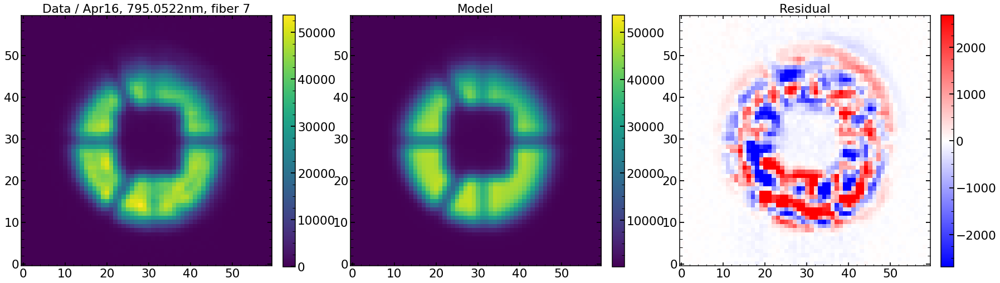

In [731]:
plt.figure(figsize=(30,12))
plt.subplot(1,3,1)
plt.imshow(sci_image_1,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(1,3,2)
plt.imshow(res_iapetus_1,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image_1-res_iapetus_1,vmin=-np.max(sci_image)/20,vmax=np.max(sci_image)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

## load from dataset 2 

In [732]:
single_number=single_number_2_3
date='Jun13'
dataset=2
obs=17023

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    else:
        print("Not recognized arc-line")
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
        
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    elif arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])    
if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238+6,19238+6+6,19238+12+6,19238+18+6,19238+24+6,19238+30+6,19238+36+6,19238+42+6,19238+48+6,19238+48+6,19238+54+6,19238+60+6,19238+66+6,19238+72+6,19238+78+6,19238+84+6,19238+90+6,19238+96+6,19238+48+6])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
        
        
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")    
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")  

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   

model(minchain)
minchain_2=minchain

optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus_2=optPsf_cut_fiber_convolved_downsampled
sci_image_2=sci_image
var_image_2=var_image

m4
(number of walkers, number of steps, number of parameters): (252, 20, 42)
minimal likelihood is: 28031.492774047274
minimal chi2 reduced is: 15.567956300459628
extraZernike: None
zmax: 22
42


Text(0.5,1,'Residual')

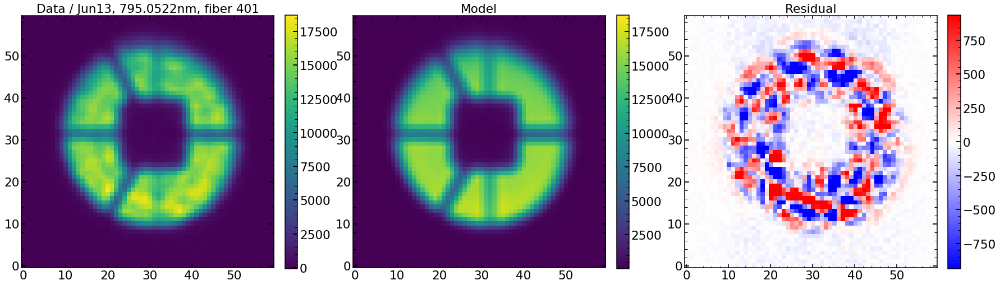

In [733]:
plt.figure(figsize=(30,12))
plt.subplot(1,3,1)
plt.imshow(sci_image_2,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(1,3,2)
plt.imshow(res_iapetus_2,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image_2-res_iapetus_2,vmin=-np.max(sci_image)/20,vmax=np.max(sci_image)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

## load from dataset 3

In [724]:
single_number=single_number_2_3
date='Jun26'
dataset=3
obs=19238+6

if dataset==2:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"
if dataset==3:
    STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/"
    

if dataset==1:
    if arc=="HgAr":
        single_number_focus=11748
    elif arc=="Ne":
        single_number_focus=11748+607    
    else:
        print("Not recognized arc-line")
if dataset==2:
    if arc=="HgAr":
        single_number_focus=17017+54
    elif arc=="Ne":
        single_number_focus=16292  
    else:
        print("Not recognized arc-line")
if dataset==3:
    if arc=="HgAr":
        single_number_focus=19238+54
    elif arc=="Ne":
        single_number_focus=19472  
    else:
        print("Not recognized arc-line")
        
if dataset==1:
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
if dataset==2:
    if arc=='HgAr':
        obs_possibilites=np.array([17023,17023+6,17023+12,17023+18,17023+24,17023+30,17023+36,17023+42,17023+48,17023+48,17023+54,17023+60,17023+66,17023+72,17023+78,17023+84,17023+90,17023+96,17023+48])
    elif arc=='Ne':
        # different sequence than for HgAr
        obs_possibilites=np.array([16238+6,16238+12,16238+18,16238+24,16238+30,16238+36,16238+42,16238+48,16238+54,16238+54,16238+60,16238+66,16238+72,16238+78,16238+84,16238+90,16238+96,16238+102,16238+54])    
if dataset==3:    
    if arc=='HgAr':
        obs_possibilites=np.array([19238+6,19238+6+6,19238+12+6,19238+18+6,19238+24+6,19238+30+6,19238+36+6,19238+42+6,19238+48+6,19238+48+6,19238+54+6,19238+60+6,19238+66+6,19238+72+6,19238+78+6,19238+84+6,19238+90+6,19238+96+6,19238+48+6])
    elif arc=='Ne':
    # different sequence than for HgAr
        obs_possibilites=np.array([19472+6,19472+12,19472+18,19472+24,19472+30,19472+36,19472+42,19472+48,19472+54,19472+54,19472+60,19472+66,19472+72,19472+78,19472+84,19472+90,19472+96,19472+102,19472+54]) 
        
        
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if dataset==1:
    if arc=="HgAr":
        finalArc=finalHgAr_Feb2019
    elif arc=="Ne":
        finalArc=finalNe_Feb2019    
    else:
        print("Not recognized arc-line")    
if dataset==2:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")   
if dataset==3:   
    if arc=="HgAr":
        finalArc=finalHgAr_May2019
    elif arc=="Ne":
        finalArc=finalNe_May2019    
    else:
        print("Not recognized arc-line")  
 
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc,dataset)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=22)   

model(minchain)
minchain_3=minchain

optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus_3=optPsf_cut_fiber_convolved_downsampled
sci_image_3=sci_image
var_image_3=var_image

m4
(number of walkers, number of steps, number of parameters): (252, 20, 42)
minimal likelihood is: 64853.139086805655
minimal chi2 reduced is: 36.02422223716692
extraZernike: None
zmax: 22
42


Text(0.5,1,'Residual')

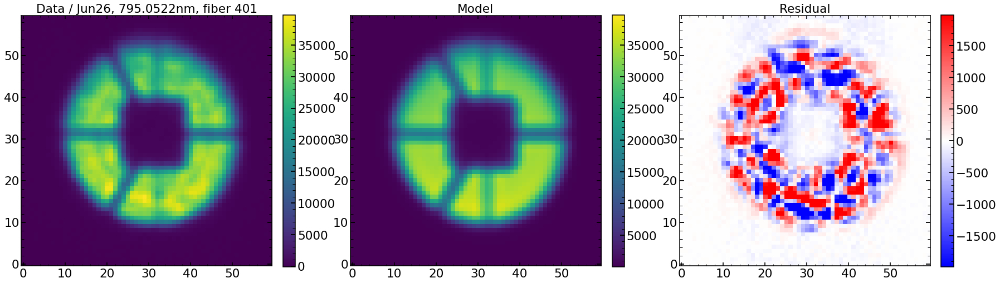

In [725]:
plt.figure(figsize=(30,12))
plt.subplot(1,3,1)
plt.imshow(sci_image_3,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(1,3,2)
plt.imshow(res_iapetus_3,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image_3-res_iapetus_3,vmin=-np.max(sci_image)/20,vmax=np.max(sci_image)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

## Figures together

Text(0.5,1,'Residual')

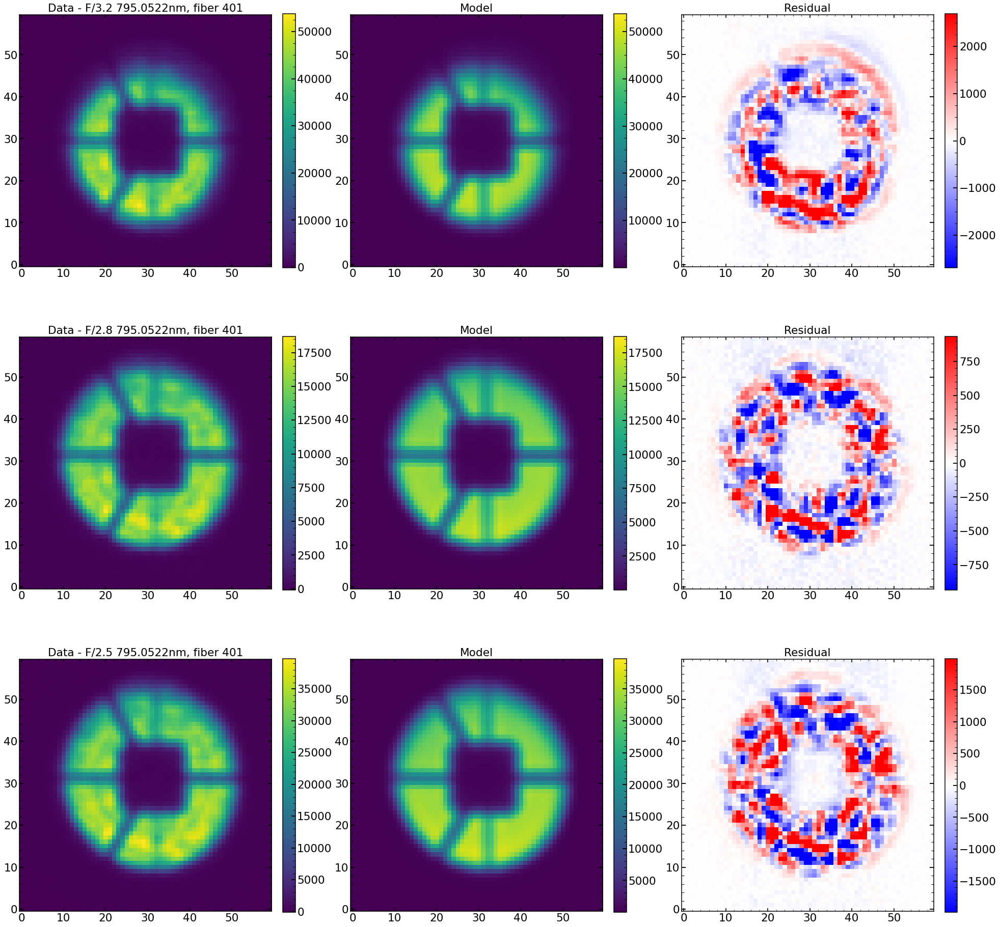

In [714]:
plt.figure(figsize=(33,33))
plt.subplot(3,3,1)
plt.imshow(sci_image_1,vmax=np.max(sci_image_1))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data - F/3.2 '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(3,3,2)
plt.imshow(res_iapetus_1,vmax=np.max(sci_image_1))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(3,3,3)
plt.imshow(sci_image_1-res_iapetus_1,vmin=-np.max(sci_image_1)/20,vmax=np.max(sci_image_1)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

plt.subplot(3,3,4)
plt.imshow(sci_image_2,vmax=np.max(sci_image_2))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data - F/2.8 '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(3,3,5)
plt.imshow(res_iapetus_2,vmax=np.max(sci_image_2))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(3,3,6)
plt.imshow(sci_image_2-res_iapetus_2,vmin=-np.max(sci_image_2)/20,vmax=np.max(sci_image_2)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

plt.subplot(3,3,7)
plt.imshow(sci_image_3,vmax=np.max(sci_image_3))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data - F/2.5 '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(3,3,8)
plt.imshow(res_iapetus_3,vmax=np.max(sci_image_3))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(3,3,9)
plt.imshow(sci_image_3-res_iapetus_3,vmin=-np.max(sci_image_3)/20,vmax=np.max(sci_image_3)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')


In [778]:
print(minchain_1[29:34])
print(minchain_2[29:34])
print(minchain_3[29:34])


[-0.04332539 -0.07515384  0.80155356  0.05408019  0.9998427 ]
[-0.04757794 -0.12629034  0.91089057  0.04567359  0.67175816]
[-0.07120215 -0.01208038  0.87185118  0.06678653  0.5513621 ]


## dataset 1 as dataset 2 or 3

In [788]:
minchain_2_modified=np.copy(minchain_2)

minchain_2_modified[29]=-0.0433
minchain_2_modified[30]=-0.14515

minchain_2_modified[31]=0.76
minchain_2_modified[32]=0.054
minchain_2_modified[33]=0.9998

In [789]:
model = LN_PFS_single(sci_image_1,var_image_1,dithering=1,save=1,zmax=22)   

model(minchain_2_modified)
   
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus_1_with_2=optPsf_cut_fiber_convolved_downsampled


extraZernike: None
zmax: 22
42


Text(0.5,1,'Residual')

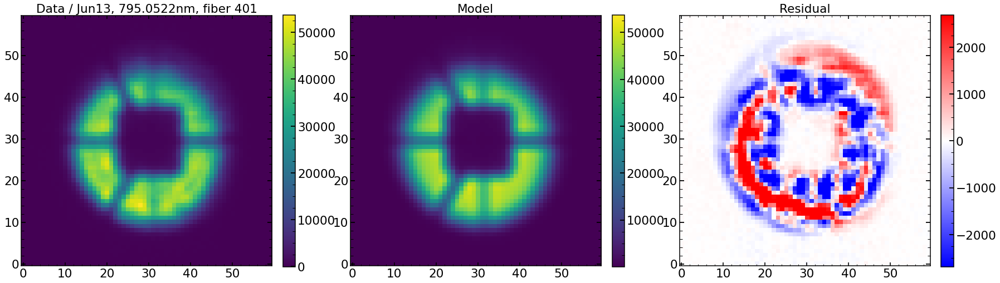

In [790]:
plt.figure(figsize=(30,12))
plt.subplot(1,3,1)
plt.imshow(sci_image_1,vmax=np.max(sci_image_1))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / '+str(date)+', '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(1,3,2)
plt.imshow(res_iapetus_1_with_2,vmax=np.max(sci_image_1))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image_1-res_iapetus_1_with_2,vmin=-np.max(sci_image_1)/20,vmax=np.max(sci_image_1)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

# Answering query by Graham (PIPE2D-437) - DONE

In [152]:
new_data_No_f=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/LAM/raw/2019-04-09/PFLA01576412.fits')[0].data
new_data_f_28=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/LAM/raw/2019-04-10/PFLA01581212.fits')[0].data

In [192]:
test_spot_No_f_fiber1=new_data_No_f[1697-20:1697+20,85-20:85+20]
test_spot_f_28_fiber1=new_data_f_28[1697-20:1697+20,85-20:85+20]

test_spot_No_f_fiber2=new_data_No_f[1678-20:1678+20,473-20:473+20]
test_spot_f_28_fiber2=new_data_f_28[1678-20:1678+20,473-20:473+20]

test_spot_No_f_fiber3=new_data_No_f[1670-20:1670+20,736-20:736+20]
test_spot_f_28_fiber3=new_data_f_28[1670-20:1670+20,736-20:736+20]

test_spot_No_f_fiber4=new_data_No_f[1665-20:1665+20,1314-20:1314+20]
test_spot_f_28_fiber4=new_data_f_28[1665-20:1665+20,1314-20:1314+20]

test_spot_No_f_fiber5=new_data_No_f[1665-20:1665+20,1718-20:1718+20]
test_spot_f_28_fiber5=new_data_f_28[1665-20:1665+20,1718-20:1718+20]

test_spot_No_f_fiber6=new_data_No_f[1657-20:1657+20,2099-20:2099+20]
test_spot_f_28_fiber6=new_data_f_28[1657-20:1657+20,2099-20:2099+20]

test_spot_No_f_fiber7=new_data_No_f[1657-20:1657+20,2608-20:2608+20]
test_spot_f_28_fiber7=new_data_f_28[1657-20:1657+20,2608-20:2608+20]

test_spot_No_f_fiber8=new_data_No_f[1659-20:1659+20,3012-20:3012+20]
test_spot_f_28_fiber8=new_data_f_28[1659-20:1659+20,3012-20:3012+20]

test_spot_No_f_fiber9=new_data_No_f[1697-20:1697+20,3967-20:3967+20]
test_spot_f_28_fiber9=new_data_f_28[1697-20:1697+20,3967-20:3967+20]

test_spot_No_f_fiber10=new_data_No_f[1682-20:1682+20,4345-20:4345+20]
test_spot_f_28_fiber10=new_data_f_28[1682-20:1682+20,4345-20:4345+20]

test_spot_No_f_fibers_all=[test_spot_No_f_fiber1,test_spot_No_f_fiber2,test_spot_No_f_fiber3,test_spot_No_f_fiber4,test_spot_No_f_fiber5,test_spot_No_f_fiber6,
                          test_spot_No_f_fiber7,test_spot_No_f_fiber8,test_spot_No_f_fiber9,test_spot_No_f_fiber10]

test_spot_f_28_fiber_all=[test_spot_f_28_fiber1,test_spot_f_28_fiber2,test_spot_f_28_fiber3,test_spot_f_28_fiber4,test_spot_f_28_fiber5,test_spot_f_28_fiber6,
                          test_spot_f_28_fiber7,test_spot_f_28_fiber8,test_spot_f_28_fiber9,test_spot_f_28_fiber10]


test_spot_No_f_spot1=new_data_No_f[889-20:889+20,2099-20:2099+20]
test_spot_f_28_spot1=new_data_f_28[889-20:889+20,2099-20:2099+20]

test_spot_No_f_spot2=new_data_No_f[1369-20:1369+20,2099-20:2099+20]
test_spot_f_28_spot2=new_data_f_28[1369-20:1369+20,2099-20:2099+20]

test_spot_No_f_spot3=new_data_No_f[1659-20:1659+20,2099-20:2099+20]
test_spot_f_28_spot3=new_data_f_28[1659-20:1659+20,2099-20:2099+20]

test_spot_No_f_spot4=new_data_No_f[1757-20:1757+20,2099-20:2099+20]
test_spot_f_28_spot4=new_data_f_28[1757-20:1757+20,2099-20:2099+20]

test_spot_No_f_spot5=new_data_No_f[2375-20:2375+20,2099-20:2099+20]
test_spot_f_28_spot5=new_data_f_28[2375-20:2375+20,2099-20:2099+20]

test_spot_No_f_spot6=new_data_No_f[2853-20:2853+20,2099-20:2099+20]
test_spot_f_28_spot6=new_data_f_28[2853-20:2853+20,2099-20:2099+20]

test_spot_No_f_spot7=new_data_No_f[3393-20:3393+20,2608-20:2608+20]
test_spot_f_28_spot7=new_data_f_28[3393-20:3393+20,2608-20:2608+20]

test_spot_No_f_spot8=new_data_No_f[4023-20:4023+20,3012-20:3012+20]
test_spot_f_28_spot8=new_data_f_28[4023-20:4023+20,3012-20:3012+20]



test_spot_No_f_many_spots_in_single_fiber=[test_spot_No_f_spot1,test_spot_No_f_spot2,test_spot_No_f_spot3,test_spot_No_f_spot4,test_spot_No_f_spot5,test_spot_No_f_spot6,
                          test_spot_No_f_spot7,test_spot_No_f_spot8]

test_spot_f_28_many_spots_in_single_fiber=[test_spot_f_28_spot1,test_spot_f_28_spot2,test_spot_f_28_spot3,test_spot_f_28_spot4,test_spot_f_28_spot5,test_spot_f_28_spot6,
                          test_spot_f_28_spot7,test_spot_f_28_spot8]

In [181]:
for i in range(10):
    print((np.max(test_spot_No_f_fibers_all[i])-1000)/(np.max(test_spot_f_28_fiber_all[i])-1000))

2.854750175932442
2.9906542056074765
3.083655770513676
3.08462888665998
2.404638815146011
3.0742871755529984
2.9633333333333334
3.0752093301435406
2.577679958570689
3.0508507347254445


In [196]:
y_detector=[889,1369,1659,1757,2375,2853,3393,4023]
for i in range(8):
    print([y_detector[i],(np.max(test_spot_No_f_many_spots_in_single_fiber[i])-1000)/(np.max(test_spot_f_28_many_spots_in_single_fiber[i])-1000)])

[889, 2.8549480343425215]
[1369, 2.4712837837837838]
[1659, 3.0742871755529984]
[1757, 2.8724511027881814]
[2375, 2.88925583443417]
[2853, 2.163265306122449]
[3393, 3.6179827267119062]
[4023, 3.2071005917159763]


1507


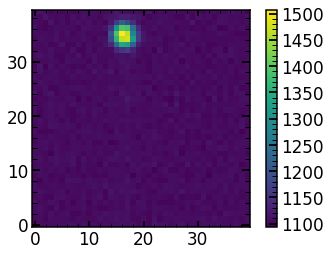

In [193]:
plt.imshow(test_spot_f_28_many_spots_in_single_fiber[7])
print(np.max(test_spot_f_28_many_spots_in_single_fiber[7]))
plt.colorbar()

2626


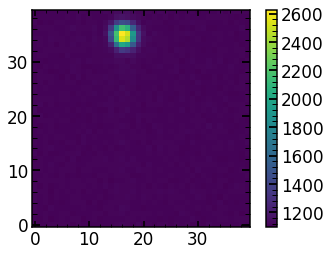

In [194]:
plt.imshow(test_spot_No_f_many_spots_in_single_fiber[7])
print(np.max(test_spot_No_f_many_spots_in_single_fiber[7]))
plt.colorbar()

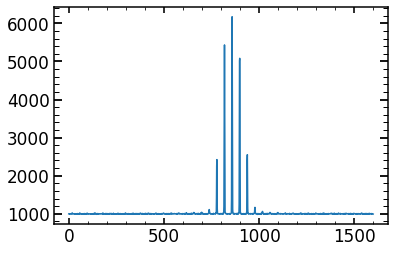

In [176]:
plt.plot(test_spot_f_28_fiber10.ravel())

In [177]:
np.max(test_spot_f_28_fiber10)

6172

In [178]:
np.max(test_spot_No_f_fiber10)

16779

# Grating effect  (PIPE2D-284)

## Code 

In [184]:
def create_res_data_faint(FFTTest_fiber_and_pixel_convolved_downsampled_40,mask=None,custom_cent=None):
    if custom_cent is None:
        xs0=0
        ys0=0
    else:
        xs0=(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40)[0]-20)*7.5
        ys0=(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40)[1]-20)*7.5
    pointsx = np.linspace(-(300-7.5)/2,(300-7.5)/2,num=40)
    pointsy = np.linspace(-(300-7.5)/2,(300-7.5)/2,num=40)
    xs, ys = np.meshgrid(pointsx, pointsy)
    r0 = np.sqrt((xs-xs0)** 2 + (ys-ys0)** 2)
    
    if mask is None:
        mask=np.ones((FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[0],FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[1]))
    
    distances=range(180)

    res_test_data=[]
    r=100
    pixels_upper_limit=(mask*FFTTest_fiber_and_pixel_convolved_downsampled_40)[r0<(r+40)]
    pixels_lower_limit=(mask*FFTTest_fiber_and_pixel_convolved_downsampled_40)[r0<(r)]

    mask_upper_limit=mask[r0<(r+40)]
    mask_lower_limit=mask[r0<(r)]

    number_of_valid_pixels=np.sum(mask_upper_limit)-np.sum(mask_lower_limit)

    if number_of_valid_pixels==0:
        res_test_data.append(0)
    else:                  
        average_flux=(np.sum(pixels_upper_limit)-np.sum(pixels_lower_limit))/number_of_valid_pixels
        res_test_data.append(average_flux)        

    return res_test_data   


def create_mask(FFTTest_fiber_and_pixel_convolved_downsampled_40,semi=None):
    
    size_mask=1
    
    central_position=np.array(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40))
    central_position_int=np.round(central_position)
    central_position_int_x=int(central_position_int[0])
    central_position_int_y=int(central_position_int[1])

    center_square=np.zeros((40,40))
    center_square[central_position_int_y-2*size_mask:+central_position_int_y+2*size_mask,central_position_int_x-2*size_mask:central_position_int_x+2*size_mask]=np.ones((4*size_mask,size_mask*4))
   
    horizontal_cross=np.zeros((40,40))
    horizontal_cross[central_position_int_y-2*size_mask:central_position_int_y+2*size_mask,0:40,]=np.ones((4*size_mask,40))
    horizontal_cross_full=horizontal_cross
    horizontal_cross=horizontal_cross-center_square

    vertical_cross=np.zeros((40,40))
    if semi is None:
        vertical_cross[0:40,central_position_int_x-2*size_mask:central_position_int_x+2*size_mask]=np.ones((40,4*size_mask))
        vertical_cross=vertical_cross-center_square
    if semi=='+':
        vertical_cross[central_position_int_y+2*size_mask:40,central_position_int_x-2*size_mask:central_position_int_x+2*size_mask]=np.ones((40-central_position_int_y-2*size_mask,4*size_mask))
    if semi=='-':
        vertical_cross[0:central_position_int_y-2*size_mask,central_position_int_x-2*size_mask:central_position_int_x+2*size_mask]=np.ones((central_position_int_y-2*size_mask,4*size_mask))
    vertical_cross_full=vertical_cross


    diagonal_cross=np.zeros((40,40))
    if semi is None:
        diagonal_cross[0:central_position_int_y-4,0:central_position_int_x-4]=np.ones((central_position_int_y-4,central_position_int_x-4))
        diagonal_cross[(central_position_int_y+4):40,0:(central_position_int_x-4)]=np.ones((40-(central_position_int_y+4),(central_position_int_x-4)))
        diagonal_cross[0:(central_position_int_y-4),(central_position_int_x+4):40]=np.ones(((central_position_int_y-4),40-(central_position_int_x+4)))
        diagonal_cross[(central_position_int_y+4):40,(central_position_int_x+4):40]=np.ones((40-(central_position_int_y+4),40-(central_position_int_x+4)))
    if semi=='+':
        diagonal_cross[(central_position_int_y+4):40,0:(central_position_int_x-4)]=np.ones((40-(central_position_int_y+4),(central_position_int_x-4)))
        diagonal_cross[(central_position_int_y+4):40,(central_position_int_x+4):40]=np.ones((40-(central_position_int_y+4),40-(central_position_int_x+4)))
    if semi=='-':
        diagonal_cross[0:central_position_int_y-4,0:central_position_int_x-4]=np.ones((central_position_int_y-4,central_position_int_x-4))
        diagonal_cross[0:(central_position_int_y-4),(central_position_int_x+4):40]=np.ones(((central_position_int_y-4),40-(central_position_int_x+4)))
    if semi=='r':
        diagonal_cross[(central_position_int_y+4):40,(central_position_int_x+4):40]=np.ones((40-(central_position_int_y+4),40-(central_position_int_x+4)))
        diagonal_cross[0:(central_position_int_y-4),(central_position_int_x+4):40]=np.ones(((central_position_int_y-4),40-(central_position_int_x+4)))
    if semi=='l':
        diagonal_cross[0:central_position_int_y-4,0:central_position_int_x-4]=np.ones((central_position_int_y-4,central_position_int_x-4))
        diagonal_cross[(central_position_int_y+4):40,0:(central_position_int_x-4)]=np.ones((40-(central_position_int_y+4),(central_position_int_x-4)))

    total_mask=np.zeros((40,40))
    if semi is None:
        total_mask=np.ones((40,40))
    if semi=='+':
        total_mask[(central_position_int_y):40,0:40]=np.ones((40-(central_position_int_y),40))
    if semi=='-':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))
    if semi=='r':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))  
    if semi=='l':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))   
        
    return [center_square,horizontal_cross,vertical_cross,diagonal_cross,total_mask]

def create_res_data(FFTTest_fiber_and_pixel_convolved_downsampled_40,mask=None,custom_cent=None,size_pixel=None):
    
    if size_pixel is None:
        size_pixel=7.5
    
    image_shape=np.array(FFTTest_fiber_and_pixel_convolved_downsampled_40.shape)
    if custom_cent is None:
        xs0=0
        ys0=0
    else:

        xs0=(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40)[0]-int(image_shape[0]/2))*size_pixel
        ys0=(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40)[1]-int(image_shape[0]/2))*size_pixel
    pointsx = np.linspace(-(int(image_shape[0]*size_pixel)-size_pixel)/2,(int(image_shape[0]*size_pixel)-size_pixel)/2,num=int(image_shape[0]))
    pointsy = np.linspace(-(int(image_shape[0]*size_pixel)-size_pixel)/2,(int(image_shape[0]*size_pixel)-size_pixel)/2,num=int(image_shape[0]))
    xs, ys = np.meshgrid(pointsx, pointsy)
    r0 = np.sqrt((xs-xs0)** 2 + (ys-ys0)** 2)
    
    if mask is None:
        mask=np.ones((FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[0],FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[1]))
    
    distances=range(int(image_shape[0]/2*size_pixel*12))

    res_test_data=[]
    for r in distances:
        pixels_upper_limit=(mask*FFTTest_fiber_and_pixel_convolved_downsampled_40)[r0<(r+size_pixel)]
        pixels_lower_limit=(mask*FFTTest_fiber_and_pixel_convolved_downsampled_40)[r0<(r)]
        
        mask_upper_limit=mask[r0<(r+size_pixel)]
        mask_lower_limit=mask[r0<(r)]
        
        number_of_valid_pixels=np.sum(mask_upper_limit)-np.sum(mask_lower_limit)
        
        if number_of_valid_pixels==0:
            res_test_data.append(0)
        else:                  
            average_flux=(np.sum(pixels_upper_limit)-np.sum(pixels_lower_limit))/number_of_valid_pixels
            res_test_data.append(average_flux)        

    return res_test_data   

## HgAr and neon from default images - May data (F/2.8)

In [447]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  

In [448]:
sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

### Looking at which objects to cut 

In [449]:
np.unique(finalHgAr_May2019['fiber'])

array([  2,  63, 192, 255, 339, 401, 464, 525, 587, 650])

In [450]:
finalHgAr_May2019[(finalHgAr_May2019['fiber']==401)]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
60,401,1992,771,690.9346,0,HgAr,1992,84,nan
61,401,1992,836,696.7261,1,HgAr,1992,85,93.0
62,401,1992,952,706.8989,0,HgAr,1992,86,nan
63,401,1992,1187,727.47876,1,HgAr,1992,87,nan
64,401,1992,1314,738.6248,0,HgAr,1992,88,83.0
65,401,1992,1603,763.74286,0.5,HgAr,1992,89,73.0
66,401,1992,1965,795.0522,1,HgAr,1992,90,53.0
67,401,1992,2332,826.6699,0.5,HgAr,1992,91,43.0
68,401,1992,2631,852.4029,0.5,HgAr,1992,92,33.0
69,401,1992,3340,912.5693,1,HgAr,1992,93,23.0


In [451]:
index_HgAr=finalHgAr_May2019[(finalHgAr_May2019['fiber']==401)].index.values

In [649]:
wavelength_HgAr=finalHgAr_May2019[(finalHgAr_May2019['fiber']==401)]['wavelength'].values.astype(float)
y_HgAr=finalHgAr_May2019[(finalHgAr_May2019['fiber']==401)]['yc'].values.astype(int)

In [650]:
y_HgAr

array([ 771,  836,  952, 1187, 1314, 1603, 1965, 2332, 2631, 3340, 3460,
       3977])

In [453]:
finalNe_May2019[(finalNe_May2019['fiber']==339)]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
36,339,1612,315,650.84186,0,Ne,1612,54,nan
37,339,1612,345,653.4774,0,Ne,1612,55,nan
38,339,1612,420,660.0668,1,Ne,1612,56,nan
39,339,1613,511,668.01764,0,Ne,1613,57,nan
40,339,1613,555,671.9268,0,Ne,1613,58,nan
41,339,1613,797,693.13116,1,Ne,1613,59,nan
42,339,1613,1077,717.59015,1,Ne,1613,60,nan
43,339,1613,1159,724.72437,1,Ne,1613,61,nan
44,339,1613,1381,744.1276,0,Ne,1613,62,nan


In [230]:
index_Ne=finalNe_May2019[(finalNe_May2019['fiber']==401)].index.values

In [231]:
wavelength_Ne=finalNe_May2019[(finalNe_May2019['fiber']==401)]['wavelength'].values.astype(float)

In [712]:
single_number_list_HgAr=index_HgAr
single_number_list_Ne=index_Ne
obs=17071
arc='HgAr'
STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Stamps_cleaned/"

list_of_sci_image_HgAr=[]
list_of_sci_image_HgAr_40=[]
list_of_var_image_HgAr_40=[]
list_of_sci_image_HgAr_large=[]
for single_number in single_number_list_HgAr:
    sci_image=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    sci_image_large=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked_Large.npy')
    var_image_large=np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked_Large.npy')
    sci_image_40=sci_image_large[95:135,60:100]
    var_image_40=var_image_large[95:135,60:100]

    list_of_sci_image_HgAr.append(sci_image)
    list_of_sci_image_HgAr_40.append(sci_image_40)
    list_of_var_image_HgAr_40.append(var_image_40)
    list_of_sci_image_HgAr_large.append(sci_image_large)    
    
    
list_of_sci_image_Ne=[]
list_of_sci_image_Ne_40=[]
list_of_sci_image_Ne_large=[]
obs=16238+54
arc='Ne'    
for single_number in single_number_list_Ne:
    sci_image=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    sci_image_large=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked_Large.npy')
    sci_image_40=sci_image_large[95:135,60:100]
    list_of_sci_image_Ne.append(sci_image)
    list_of_sci_image_Ne_40.append(sci_image_40)
    list_of_sci_image_Ne_large.append(sci_image_large)        
    
var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked_Large.npy')

### Looking at the images

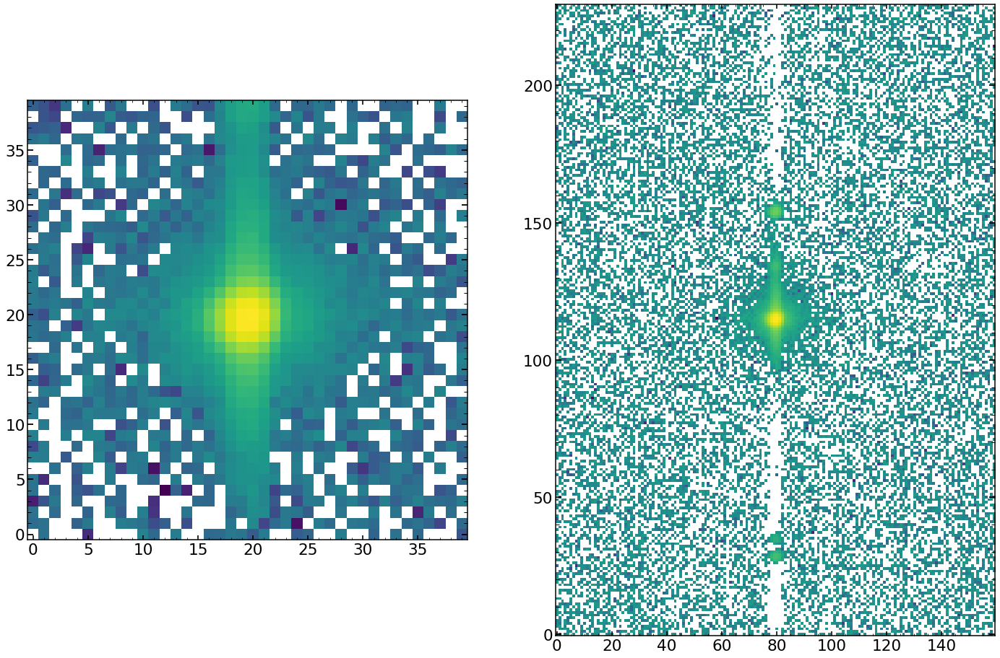

In [713]:
plt.figure(figsize=(24,20))

plt.subplot(121)
plt.imshow(list_of_sci_image_HgAr_40[7],norm=LogNorm(),origin='lower')

plt.subplot(122)
plt.imshow(list_of_sci_image_HgAr_large[7],norm=LogNorm(),origin='lower')

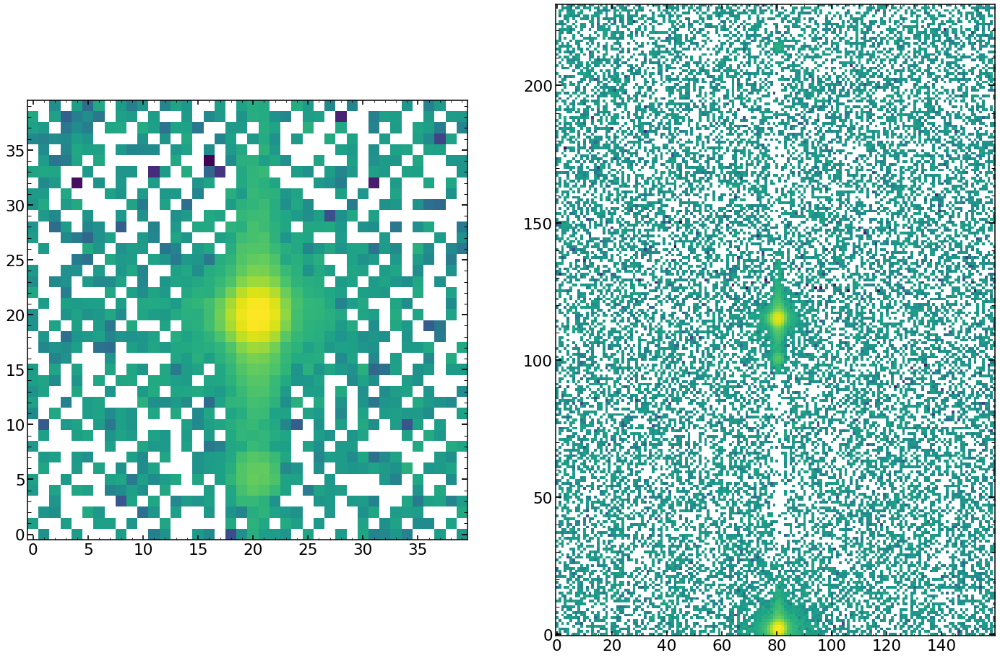

In [536]:
plt.figure(figsize=(24,20))

plt.subplot(121)
plt.imshow(list_of_sci_image_HgAr_40[8],norm=LogNorm(),origin='lower')

plt.subplot(122)
plt.imshow(list_of_sci_image_HgAr_large[8],norm=LogNorm(),origin='lower')

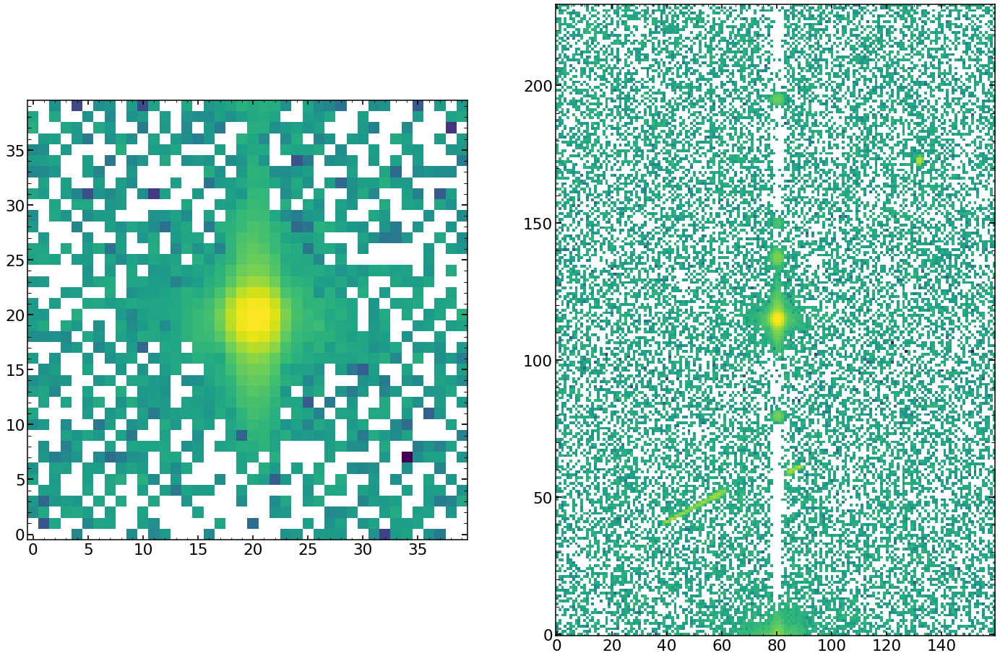

In [537]:
plt.figure(figsize=(24,20))

plt.subplot(121)
plt.imshow(list_of_sci_image_HgAr_40[10],norm=LogNorm(),origin='lower')

plt.subplot(122)
plt.imshow(list_of_sci_image_HgAr_large[10],norm=LogNorm(),origin='lower')

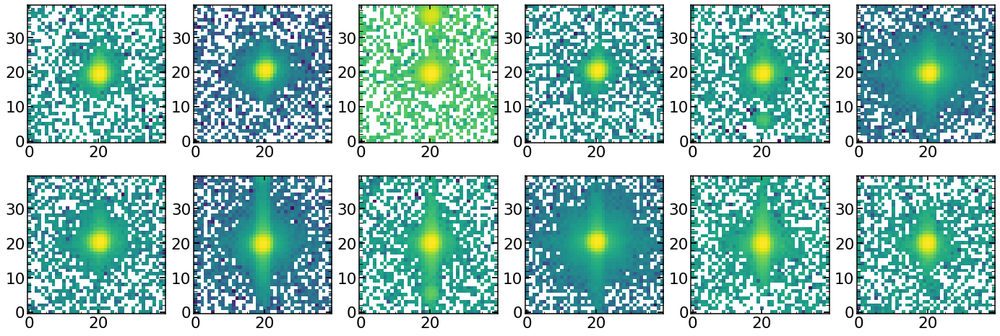

In [473]:
plt.figure(figsize=(24,8))

plt.subplot(261)
plt.imshow(list_of_sci_image_HgAr_40[0],origin='lower',norm=LogNorm())

plt.subplot(262)
plt.imshow(list_of_sci_image_HgAr_40[1],origin='lower',norm=LogNorm())

plt.subplot(263)
plt.imshow(list_of_sci_image_HgAr_40[2],origin='lower',norm=LogNorm())

plt.subplot(264)
plt.imshow(list_of_sci_image_HgAr_40[3],origin='lower',norm=LogNorm())

plt.subplot(265)
plt.imshow(list_of_sci_image_HgAr_40[4],origin='lower',norm=LogNorm())

plt.subplot(266)
plt.imshow(list_of_sci_image_HgAr_40[5],origin='lower',norm=LogNorm())

plt.subplot(267)
plt.imshow(list_of_sci_image_HgAr_40[6],origin='lower',norm=LogNorm())

plt.subplot(268)
plt.imshow(list_of_sci_image_HgAr_40[7],origin='lower',norm=LogNorm())

plt.subplot(269)
plt.imshow(list_of_sci_image_HgAr_40[8],origin='lower',norm=LogNorm())

plt.subplot(2,6,10)
plt.imshow(list_of_sci_image_HgAr_40[9],origin='lower',norm=LogNorm())

plt.subplot(2,6,11)
plt.imshow(list_of_sci_image_HgAr_40[10],origin='lower',norm=LogNorm())

plt.subplot(2,6,12)
plt.imshow(list_of_sci_image_HgAr_40[11],origin='lower',norm=LogNorm())

In [638]:
array_of_scidata_single_fiber.shape

(19, 4176)

(0, 1000)

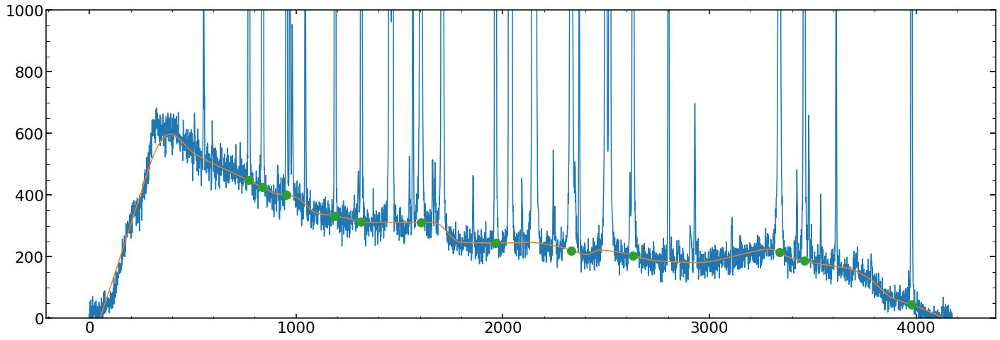

In [652]:
plt.figure(figsize=(24,8))
array_of_scidata_single_fiber=np.load('/Users/nevencaplar/Documents/PFS/Testing/Fibers/array_of_scidata_single_fiber_'+str(4)+'.npy')
array_of_fit_defocus=np.load('/Users/nevencaplar/Documents/PFS/Testing/Fibers/array_of_fit_defocus_'+str(4)+'.npy')
plt.plot(array_of_scidata_single_fiber[10])
plt.plot(array_of_fit_defocus[10])
plt.plot(y_HgAr,array_of_fit_defocus[10][y_HgAr],marker='o',ls='',markersize=12)
plt.ylim(0,1000)

(0, 1000)

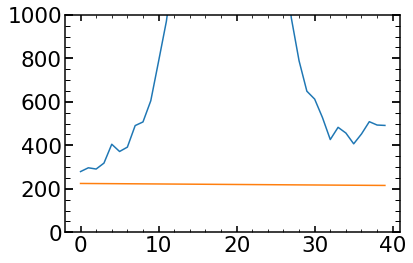

In [744]:
plt.plot(array_of_scidata_single_fiber[10][y_HgAr[7]-20:y_HgAr[7]+20])
plt.plot(array_of_fit_defocus[10][y_HgAr[7]-20:y_HgAr[7]+20])
plt.ylim(0,1000)

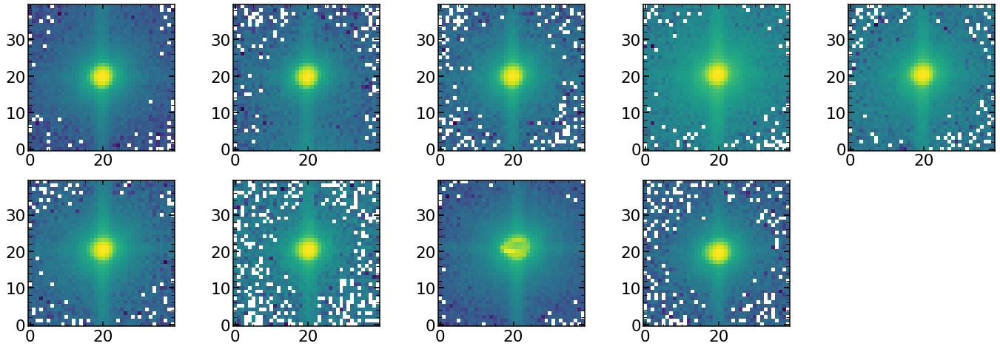

In [475]:
plt.figure(figsize=(24,8))

plt.subplot(251)
plt.imshow(list_of_sci_image_Ne_40[0],origin='lower',norm=LogNorm())

plt.subplot(252)
plt.imshow(list_of_sci_image_Ne_40[1],origin='lower',norm=LogNorm())

plt.subplot(253)
plt.imshow(list_of_sci_image_Ne_40[2],origin='lower',norm=LogNorm())

plt.subplot(254)
plt.imshow(list_of_sci_image_Ne_40[3],origin='lower',norm=LogNorm())

plt.subplot(255)
plt.imshow(list_of_sci_image_Ne_40[4],origin='lower',norm=LogNorm())

plt.subplot(256)
plt.imshow(list_of_sci_image_Ne_40[5],origin='lower',norm=LogNorm())

plt.subplot(257)
plt.imshow(list_of_sci_image_Ne_40[6],origin='lower',norm=LogNorm())

plt.subplot(258)
plt.imshow(list_of_sci_image_Ne_40[7],origin='lower',norm=LogNorm())

plt.subplot(259)
plt.imshow(list_of_sci_image_Ne_40[8],origin='lower',norm=LogNorm())


In [476]:
sci_image_40=list_of_sci_image_Ne_40[0]

list_of_masks=create_mask(sci_image_40,None)
horizontal_cross=list_of_masks[1]
vertical_cross=list_of_masks[2]
diagonal_cross=list_of_masks[3]
center_square=list_of_masks[0]

res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

Text(0.5,1,'diagonal cross')

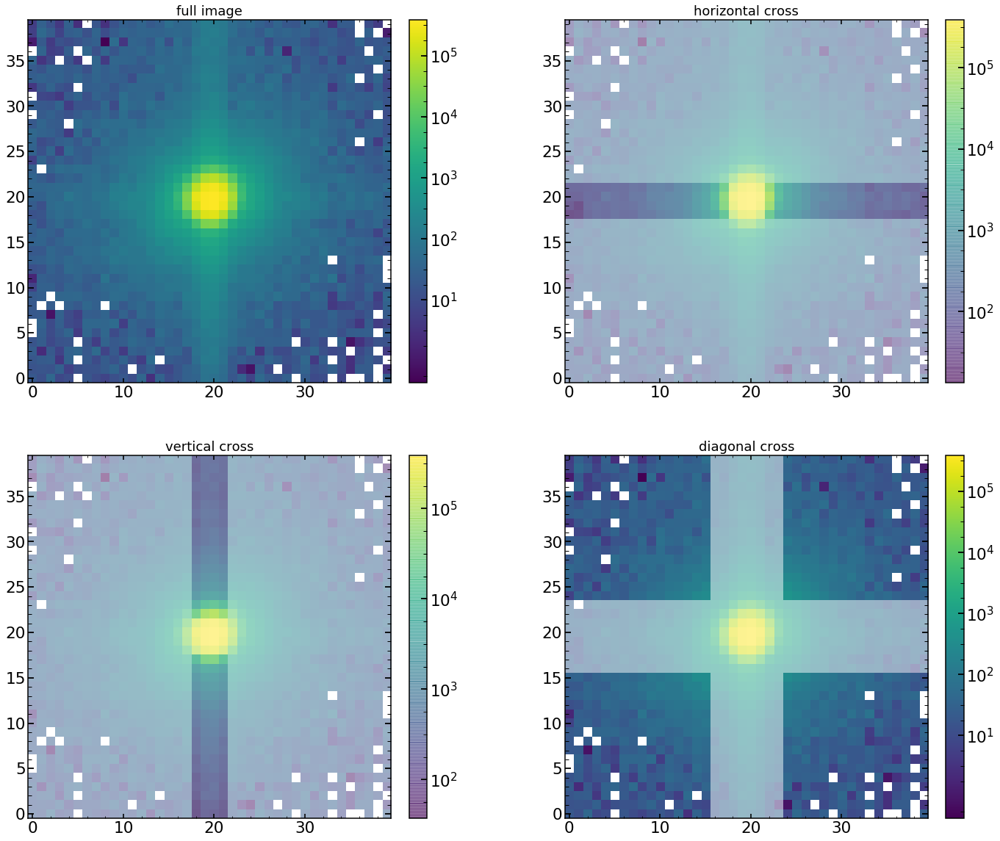

In [460]:
plt.figure(figsize=(24,20))
plt.subplot(221)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('full image', fontsize=18)

plt.subplot(222)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*horizontal_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=0.5)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('horizontal cross', fontsize=18)

plt.subplot(223)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*vertical_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=0.5)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('vertical cross', fontsize=18)

plt.subplot(224)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*diagonal_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('diagonal cross', fontsize=18)



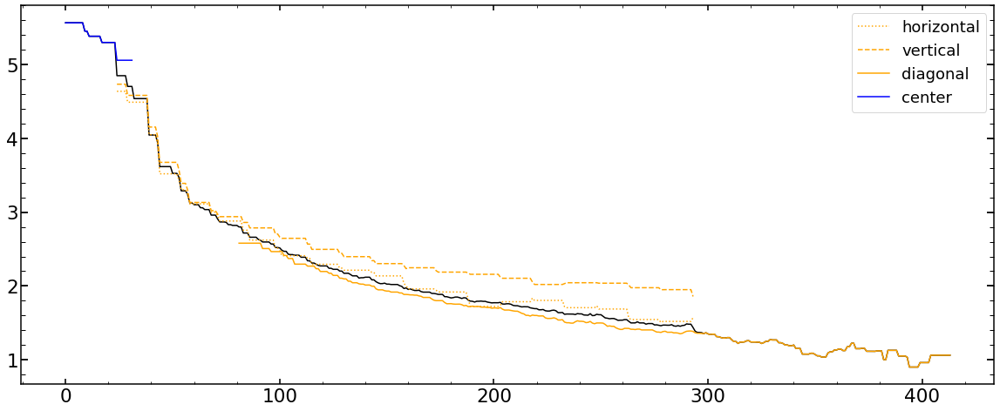

In [461]:
plt.figure(figsize=(20,8))
plt.plot(np.log10(res_55),color='black')
plt.plot(np.log10(res_55_horizontal_cross),color='orange',ls=':',label='horizontal')
plt.plot(np.log10(res_55_vertical_cross),color='orange',ls='--',label='vertical')
plt.plot(np.log10(res_55_diagonal_cross),color='orange',ls='-',label='diagonal')
plt.plot(np.log10(res_55_center_square),color='blue',label='center')
plt.legend()

### create result

In [477]:
list_of_pm_HgAr=[None,None,'-',None,'+',None,None,'-','+',None,'-','+']
result_for_HgAr=[]
for i in range(len(list_of_sci_image_HgAr_40)):

    sci_image_40=list_of_sci_image_HgAr_40[i]
    list_of_masks=create_mask(sci_image_40)
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]

    res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
    res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
    res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
    res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
    res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

    result_for_HgAr.append([np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150])),
                            np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])),
                           np.median(np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150]))])
    
result_for_Ne=[]
for i in range(len(list_of_sci_image_Ne_40)):

    sci_image_40=list_of_sci_image_Ne_40[i]
    list_of_masks=create_mask(sci_image_40)
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]

    res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
    res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
    res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
    res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
    res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

    result_for_Ne.append([np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150])),
                            np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])),
                         np.median(np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150]))])
   

result_for_HgAr=np.array(result_for_HgAr)
result_for_Ne=np.array(result_for_Ne)

In [481]:
print(result_for_HgAr)

result_for_Ne

[[ 0.21314099  0.25744009  0.01121651]
 [ 0.25440485  0.15209918  0.14605648]
 [-0.35817148 -0.11229852 -0.03373808]
 [ 0.80262898  0.22450241  0.48214871]
 [ 0.42722497  0.32980578  0.1084784 ]
 [ 0.35068397  0.18245993  0.16686728]
 [ 0.45452545  0.25789473  0.19771686]
 [ 0.99360833  0.87198096  0.13522803]
 [ 0.9068242   0.76882624  0.21209746]
 [ 0.49999198  0.30184377  0.19366461]
 [ 0.97670205  0.60580587  0.37059293]
 [ 0.64175404  0.30402615  0.33699569]]


array([[0.32352269, 0.19279803, 0.11472216],
       [0.33497559, 0.18652289, 0.13418594],
       [0.42989945, 0.33110935, 0.10349836],
       [0.47422163, 0.35776395, 0.08460071],
       [0.44982772, 0.3527139 , 0.08655111],
       [0.46107232, 0.36026364, 0.07897323],
       [0.47435777, 0.41191487, 0.08108319],
       [0.18003282, 0.04302733, 0.13247989],
       [0.29495137, 0.13283119, 0.11901035]])

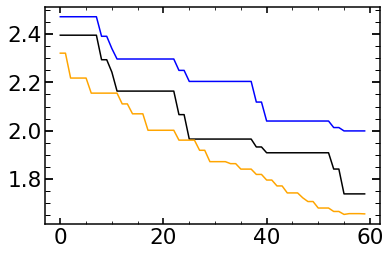

In [482]:
plt.plot(np.log10(res_55_vertical_cross[90:150]),color='blue')
plt.plot(np.log10(res_55_horizontal_cross[90:150]),color='black')
plt.plot(np.log10(res_55_diagonal_cross[90:150]),color='orange')


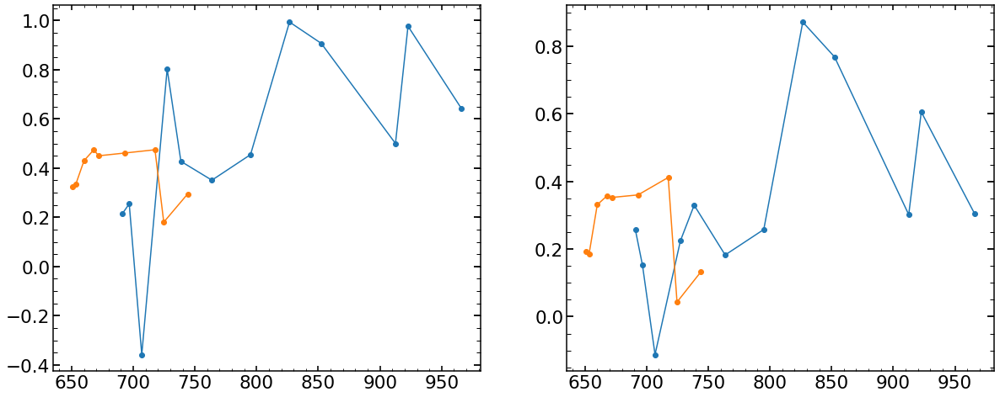

In [483]:
plt.figure(figsize=(20,8))

plt.subplot(121)
plt.plot(wavelength_HgAr,result_for_HgAr[:,0],marker='o')
plt.plot(wavelength_Ne,result_for_Ne[:,0],marker='o')

plt.subplot(122)
plt.plot(wavelength_HgAr,result_for_HgAr[:,1],marker='o')
plt.plot(wavelength_Ne,result_for_Ne[:,1],marker='o')

## HgAr and neon from default images - Feb data (F/3.2)

In [848]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalHgAr_Feb2019.pkl', 'rb') as f:
    finalHgAr_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalNe_Feb2019.pkl', 'rb') as f:
    finalNe_Feb2019=pickle.load(f)  

In [448]:
sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

### Looking at which objects to cut 

In [931]:
finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']=='4')]
index_HgAr=finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']=='4')].index.values
wavelength_HgAr=finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']=='4')]['wavelength'].values.astype(float)
y_HgAr=finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']=='4')]['yc'].values.astype(int)

finalNe_Feb2019[(finalNe_Feb2019['fiber']=='4')]
index_Ne=finalNe_Feb2019[(finalNe_Feb2019['fiber']=='4')].index.values
wavelength_Ne=finalNe_Feb2019[(finalNe_Feb2019['fiber']=='4')]['wavelength'].values.astype(float)
y_Ne=finalNe_Feb2019[(finalNe_Feb2019['fiber']=='4')]['yc'].values.astype(int)

In [932]:
finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']=='4')].values[7][1:3]


array([1241, 2326], dtype=object)

In [971]:
custom_HgAr_position=finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']=='4')].values[7][1:3]
custom_HgAr_position

array([1241, 2326], dtype=object)

In [933]:
single_number_list_HgAr=index_HgAr
single_number_list_Ne=index_Ne
obs=11694+54
arc='HgAr'
STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/"

list_of_sci_image_HgAr=[]
list_of_sci_image_HgAr_40=[]
list_of_var_image_HgAr_40=[]
list_of_sci_image_HgAr_large=[]
for single_number in single_number_list_HgAr:
    sci_image=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    sci_image_large=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked_Large.npy')
    var_image_large=np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked_Large.npy')
    sci_image_40=sci_image_large[95:135,60:100]
    var_image_40=var_image_large[95:135,60:100]

    list_of_sci_image_HgAr.append(sci_image)
    list_of_sci_image_HgAr_40.append(sci_image_40)
    list_of_var_image_HgAr_40.append(var_image_40)
    list_of_sci_image_HgAr_large.append(sci_image_large)    
    
    
list_of_sci_image_Ne=[]
list_of_sci_image_Ne_40=[]
list_of_sci_image_Ne_large=[]
obs=12301+54
arc='Ne'    
for single_number in single_number_list_Ne:
    sci_image=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    sci_image_large=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked_Large.npy')
    sci_image_40=sci_image_large[95:135,60:100]
    list_of_sci_image_Ne.append(sci_image)
    list_of_sci_image_Ne_40.append(sci_image_40)
    list_of_sci_image_Ne_large.append(sci_image_large)        
    
var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked_Large.npy')

### Looking at the images 

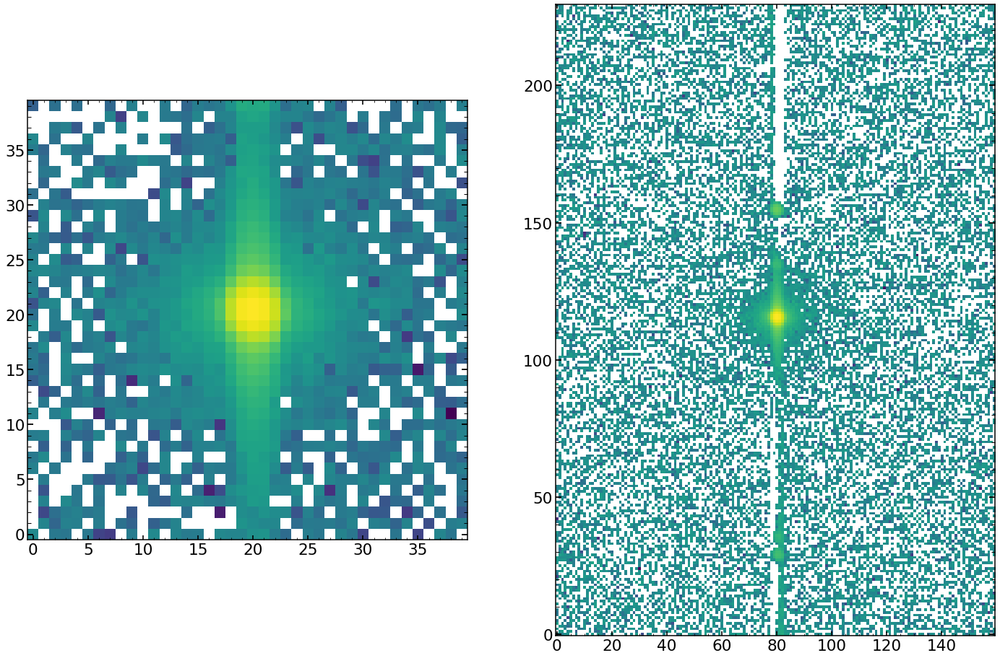

In [934]:
plt.figure(figsize=(24,20))

plt.subplot(121)
plt.imshow(list_of_sci_image_HgAr_40[7],norm=LogNorm(),origin='lower')

plt.subplot(122)
plt.imshow(list_of_sci_image_HgAr_large[7],norm=LogNorm(),origin='lower')

### Create result

In [935]:
list_of_pm_HgAr=[None,None,'-',None,'+',None,None,'-','+',None,'-','+']
result_for_HgAr=[]
for i in range(len(list_of_sci_image_HgAr_40)):

    sci_image_40=list_of_sci_image_HgAr_40[i]
    list_of_masks=create_mask(sci_image_40)
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]

    res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
    res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
    res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
    res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
    res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

    result_for_HgAr.append([np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150])),
                            np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])),
                           np.median(np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150]))])
    
result_for_Ne=[]
for i in range(len(list_of_sci_image_Ne_40)):

    sci_image_40=list_of_sci_image_Ne_40[i]
    list_of_masks=create_mask(sci_image_40)
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]

    res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
    res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
    res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
    res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
    res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

    result_for_Ne.append([np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150])),
                            np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])),
                         np.median(np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150]))])
   

result_for_HgAr=np.array(result_for_HgAr)
result_for_Ne=np.array(result_for_Ne)

In [936]:
print(result_for_HgAr)

result_for_Ne

[[ 0.52415177  0.23931312  0.26451567]
 [ 0.37506378  0.162368    0.15861492]
 [-0.31308842 -0.80905145  0.24723154]
 [ 0.92722909  0.36762977  0.61640692]
 [ 0.63761134  0.46937846  0.2011974 ]
 [ 0.41312982  0.24388557  0.18126297]
 [ 0.60832508  0.33664846  0.25081641]
 [ 0.96241049  0.87854184  0.0868808 ]
 [ 0.97290851  0.87804364  0.00379979]
 [ 0.55971405  0.3612212   0.19231801]
 [ 1.03796185  0.78273251  0.21765524]
 [ 0.50456202  0.28980382  0.22854653]]


array([[0.34491642, 0.22190683, 0.15450647],
       [0.36878395, 0.29593655, 0.08225234],
       [0.49505255, 0.29320136, 0.19332752],
       [0.47814484, 0.30010689, 0.16535608],
       [0.37585406, 0.24235777, 0.14350767],
       [0.43199985, 0.23057047, 0.18701731],
       [0.45872089, 0.28231111, 0.15777772],
       [0.31116288, 0.1312343 , 0.15384348],
       [0.24558148, 0.03706372, 0.18797153]])

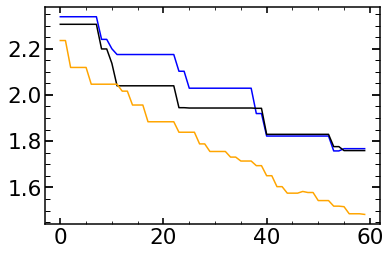

In [937]:
plt.plot(np.log10(res_55_vertical_cross[90:150]),color='blue')
plt.plot(np.log10(res_55_horizontal_cross[90:150]),color='black')
plt.plot(np.log10(res_55_diagonal_cross[90:150]),color='orange')


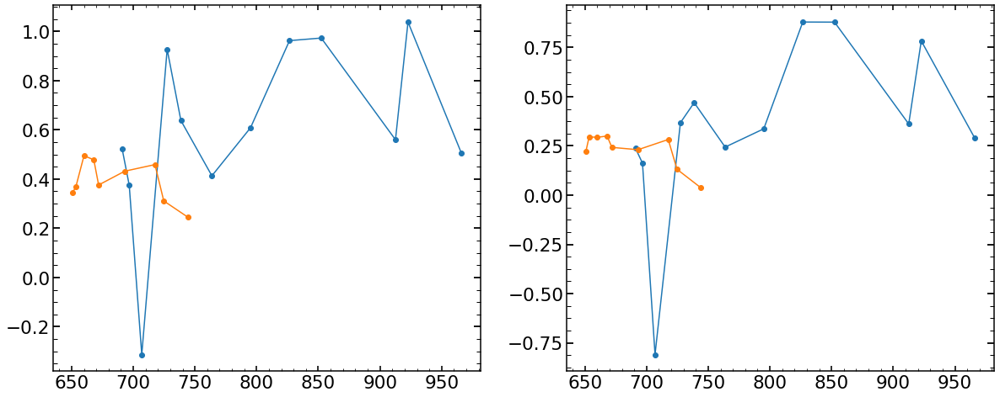

In [938]:
plt.figure(figsize=(20,8))

plt.subplot(121)
plt.plot(wavelength_HgAr,result_for_HgAr[:,0],marker='o')
plt.plot(wavelength_Ne,result_for_Ne[:,0],marker='o')

plt.subplot(122)
plt.plot(wavelength_HgAr,result_for_HgAr[:,1],marker='o')
plt.plot(wavelength_Ne,result_for_Ne[:,1],marker='o')

## Stacking many Neons

### 30 normal

In [895]:
from astropy.io import fits
stacked_Neon_image=np.zeros((4176,4096))
stacked_Neon_var_image=np.zeros((4176,4096))
for i in range(30):
    single_Neon_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-02-27/v00'+str(12922+i)+'/calExp-LA0'+str(12922+i)+'r1.fits')[1].data
    single_Neon_var_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-02-27/v00'+str(12922+i)+'/calExp-LA0'+str(12922+i)+'r1.fits')[3].data

    stacked_Neon_image+=single_Neon_image
    stacked_Neon_var_image+=single_Neon_var_image

In [896]:
list_of_pm=[None,None,'+',None,'+',None,None,'-','-',None]

In [897]:
custom_Neon_positions=[[1231,1387],[1231,2382],[1231,2722],[1230,2854],[1230,3044],[1230,3107],[1229,3378],[1229,3442],[1228,3709],[1229,3998]]

list_of_single_custom_Neon_images=[]
list_of_single_custom_Neon_var_images=[]
for i in range(len(custom_Neon_positions)):
    single_custom_stacked_Neon_image=stacked_Neon_image[custom_Neon_positions[i][1]-20:custom_Neon_positions[i][1]+20,custom_Neon_positions[i][0]-20:custom_Neon_positions[i][0]+20]
    single_custom_stacked_Neon_var_image=stacked_Neon_var_image[custom_Neon_positions[i][1]-20:custom_Neon_positions[i][1]+20,custom_Neon_positions[i][0]-20:custom_Neon_positions[i][0]+20]

    print(find_centroid_of_flux(single_custom_stacked_Neon_image))
    list_of_single_custom_Neon_images.append(single_custom_stacked_Neon_image)
    list_of_single_custom_Neon_var_images.append(single_custom_stacked_Neon_var_image)

list_of_single_custom_Neon_images_30=list_of_single_custom_Neon_images

(19.35111899878302, 19.876917498202122)
(19.407417319526772, 19.429595937587617)
(19.0708581910681, 18.509732646172406)
(19.846765343582092, 18.841762318956288)
(19.524568201333857, 10.319857152102054)
(19.380176924339743, 19.485071170545222)
(19.728500241710332, 19.701944053864658)
(19.601848766743068, 21.048085895838568)
(20.57471029264204, 19.275334083121926)
(17.806128810452844, 18.77656197233726)


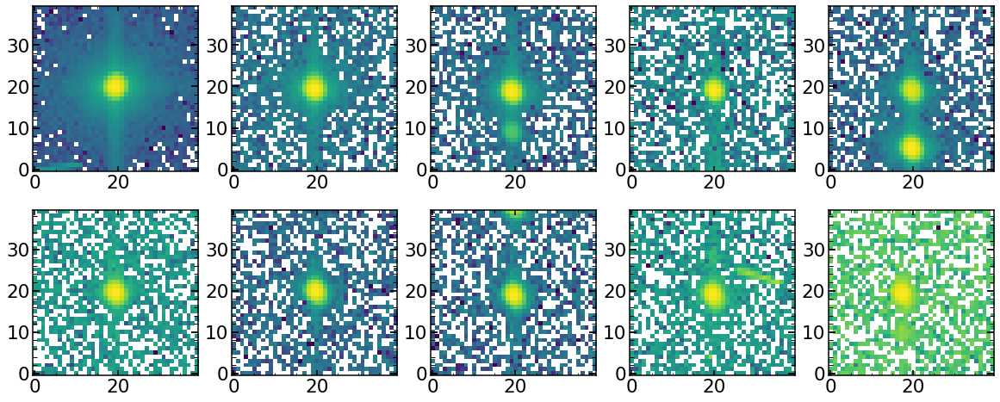

In [898]:
plt.figure(figsize=(20,8))

plt.subplot(251)
plt.imshow(list_of_single_custom_Neon_images[0],origin='lower',norm=LogNorm())

plt.subplot(252)
plt.imshow(list_of_single_custom_Neon_images[1],origin='lower',norm=LogNorm())

plt.subplot(253)
plt.imshow(list_of_single_custom_Neon_images[2],origin='lower',norm=LogNorm())

plt.subplot(254)
plt.imshow(list_of_single_custom_Neon_images[3],origin='lower',norm=LogNorm())

plt.subplot(255)
plt.imshow(list_of_single_custom_Neon_images[4],origin='lower',norm=LogNorm())

plt.subplot(256)
plt.imshow(list_of_single_custom_Neon_images[5],origin='lower',norm=LogNorm())

plt.subplot(257)
plt.imshow(list_of_single_custom_Neon_images[6],origin='lower',norm=LogNorm())

plt.subplot(258)
plt.imshow(list_of_single_custom_Neon_images[7],origin='lower',norm=LogNorm())

plt.subplot(259)
plt.imshow(list_of_single_custom_Neon_images[8],origin='lower',norm=LogNorm())

plt.subplot(2,5,10)
plt.imshow(list_of_single_custom_Neon_images[9],origin='lower',norm=LogNorm())



In [815]:
result_for_Ne_stacked_high_wavelength=[]
for i in range(len(list_of_single_custom_Neon_images)):

    sci_image_40=list_of_single_custom_Neon_images[i]
    list_of_masks=create_mask(sci_image_40,list_of_pm[i])
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]

    res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
    res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
    res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
    res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
    res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

    result_for_Ne_stacked_high_wavelength.append([np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150])),
                            np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])),
                         np.median(np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150]))])
   
result_for_Ne_stacked_high_wavelength_30_stacked=np.array(result_for_Ne_stacked_high_wavelength)

In [816]:
result_for_Ne_stacked_high_wavelength

[[0.3230773796889064, 0.15748844283122576, 0.17291289896903717],
 [0.45552677676938647, 0.36392642370500106, 0.10165829334134435],
 [0.5981006127041996, 0.3531629696102354, 0.25240913074120463],
 [0.5951730295680042, 0.2815798796998312, 0.2600441355844202],
 [0.5409306601733084, -0.06041251941334291, 0.4448029770816673],
 [0.3856607708840042, 0.4069499573133488, -0.06829134949266535],
 [0.530122627493463, 0.6194804765381074, -0.09034288040144611],
 [0.5663858502801509, 1.4895502808916108, -1.1172733085231235],
 [0.23599893373846403, -0.10293342955926632, 0.3500159028156765],
 [0.8113766513555659, 0.5648119025466432, 0.4619614984971283]]

In [831]:
i=7

sci_image_40=list_of_single_custom_Neon_images[i]

list_of_masks=create_mask(sci_image_40,list_of_pm[i])
horizontal_cross=list_of_masks[1]
vertical_cross=list_of_masks[2]
diagonal_cross=list_of_masks[3]
center_square=list_of_masks[0]

res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

Text(0.5,1,'diagonal cross')

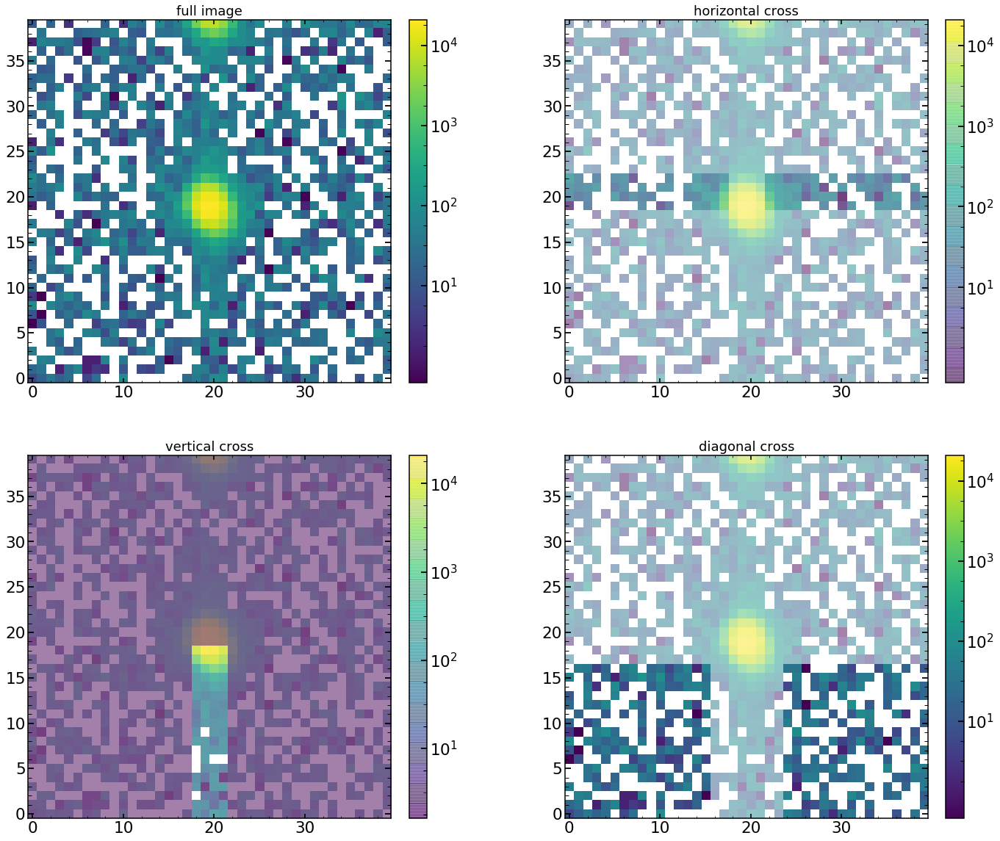

In [832]:
plt.figure(figsize=(24,20))
plt.subplot(221)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('full image', fontsize=18)

plt.subplot(222)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*horizontal_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=0.5)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('horizontal cross', fontsize=18)

plt.subplot(223)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*vertical_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=0.5)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('vertical cross', fontsize=18)

plt.subplot(224)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*diagonal_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('diagonal cross', fontsize=18)



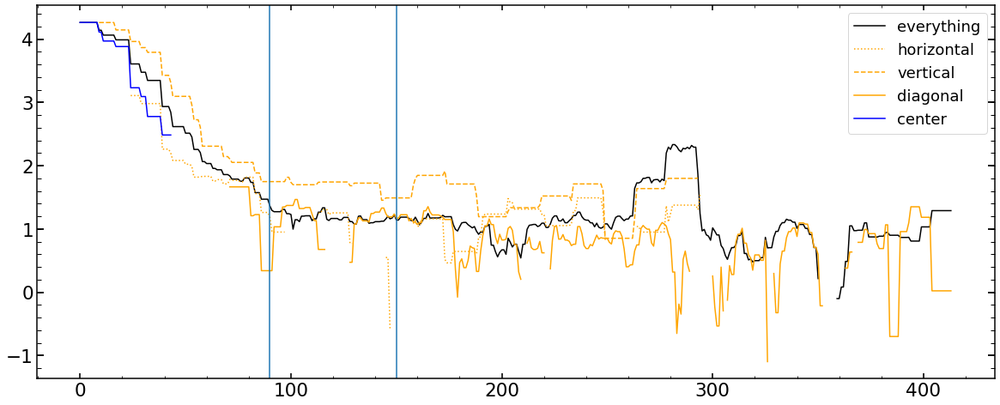

In [833]:
plt.figure(figsize=(20,8))
plt.plot(np.log10(res_55),color='black',label='everything')
plt.plot(np.log10(res_55_horizontal_cross),color='orange',ls=':',label='horizontal')
plt.plot(np.log10(res_55_vertical_cross),color='orange',ls='--',label='vertical')
plt.plot(np.log10(res_55_diagonal_cross),color='orange',ls='-',label='diagonal')
plt.plot(np.log10(res_55_center_square),color='blue',label='center')
plt.axvline(90)
plt.axvline(150)
plt.legend()

### 3 overexposed Neon images

#### without cleaning

In [874]:
from astropy.io import fits
stacked_Neon_image=np.zeros((4176,4096))
for i in range(3):
    single_Neon_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-02-27/v00'+str(12952+i)+'/calExp-LA0'+str(12952+i)+'r1.fits')[1].data
    stacked_Neon_image+=single_Neon_image

In [875]:
list_of_pm=[None,None,'+',None,'+',None,None,'-','-','+']

In [876]:
custom_Neon_positions=np.array([[1231,1387],[1231,2382],[1231,2722],[1230,2854],[1230,3044],[1230,3107],[1229,3378],[1229,3442],[1229,3709],[1229,3998]])

list_of_single_custom_Neon_images=[]
for i in range(len(custom_Neon_positions)):
    single_custom_stacked_Neon_image=stacked_Neon_image[custom_Neon_positions[i][1]-20:custom_Neon_positions[i][1]+20,custom_Neon_positions[i][0]-20:custom_Neon_positions[i][0]+20]
    print(find_centroid_of_flux(single_custom_stacked_Neon_image))
    list_of_single_custom_Neon_images.append(single_custom_stacked_Neon_image)
    
list_of_single_custom_Neon_images_30=list_of_single_custom_Neon_images

(20.122732491272828, 20.205942453307657)
(20.02809195073623, 19.41022820341497)
(19.55268953612084, 18.45258916862975)
(19.871296961391305, 18.64661417705959)
(19.92437653533371, 10.688423484521097)
(19.408995672356337, 19.466629365049915)
(19.73875749813766, 19.731459635161396)
(19.581742012491947, 21.080120430039265)
(18.649384358838592, 19.00199835804975)
(17.622847649080864, 18.527704369348726)


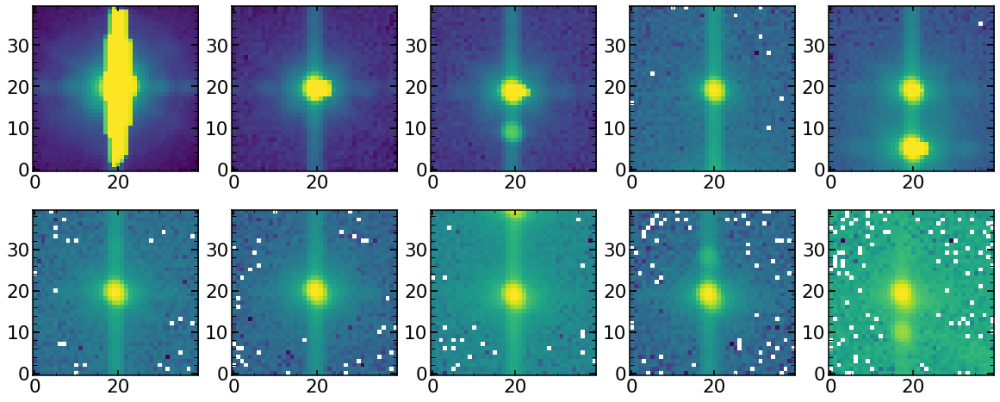

In [877]:
plt.figure(figsize=(20,8))

plt.subplot(251)
plt.imshow(list_of_single_custom_Neon_images[0],origin='lower',norm=LogNorm())

plt.subplot(252)
plt.imshow(list_of_single_custom_Neon_images[1],origin='lower',norm=LogNorm())

plt.subplot(253)
plt.imshow(list_of_single_custom_Neon_images[2],origin='lower',norm=LogNorm())

plt.subplot(254)
plt.imshow(list_of_single_custom_Neon_images[3],origin='lower',norm=LogNorm())

plt.subplot(255)
plt.imshow(list_of_single_custom_Neon_images[4],origin='lower',norm=LogNorm())

plt.subplot(256)
plt.imshow(list_of_single_custom_Neon_images[5],origin='lower',norm=LogNorm())

plt.subplot(257)
plt.imshow(list_of_single_custom_Neon_images[6],origin='lower',norm=LogNorm())

plt.subplot(258)
plt.imshow(list_of_single_custom_Neon_images[7],origin='lower',norm=LogNorm())

plt.subplot(259)
plt.imshow(list_of_single_custom_Neon_images[8],origin='lower',norm=LogNorm())

plt.subplot(2,5,10)
plt.imshow(list_of_single_custom_Neon_images[9],origin='lower',norm=LogNorm())



In [882]:
print(np.max(list_of_single_custom_Neon_images[1])/3)

64491.809895833336


In [883]:
result_for_Ne_stacked_high_wavelength=[]
for i in range(len(list_of_single_custom_Neon_images)):

    sci_image_40=list_of_single_custom_Neon_images[i]
    list_of_masks=create_mask(sci_image_40,list_of_pm[i])
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]

    res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
    res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
    res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
    res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
    res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

    result_for_Ne_stacked_high_wavelength.append([np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[120:180])-np.nan_to_num(np.log10(res_55_diagonal_cross)[120:180])),
                            np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[120:180])-np.nan_to_num(np.log10(res_55_horizontal_cross)[120:180])),
                         np.median(np.nan_to_num(np.log10(res_55_horizontal_cross)[120:180])-np.nan_to_num(np.log10(res_55_diagonal_cross)[120:180]))])
   
result_for_Ne_stacked_high_wavelength=np.array(result_for_Ne_stacked_high_wavelength)

In [884]:
result_for_Ne_stacked_high_wavelength

array([[2.35509962, 2.03592284, 0.28213828],
       [0.58639637, 0.35334023, 0.22471312],
       [0.67486222, 0.47459119, 0.20405117],
       [0.86052596, 0.78425704, 0.05069918],
       [0.60519715, 0.05444606, 0.56223131],
       [0.7482416 , 0.56809116, 0.11055262],
       [0.6645016 , 0.46616257, 0.18891435],
       [0.74862166, 0.66520667, 0.07625375],
       [0.62312496, 0.45407537, 0.17810303],
       [0.39506162, 0.16584774, 0.23188522]])

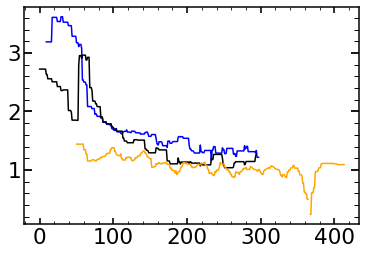

In [885]:
plt.plot(np.log10(res_55_vertical_cross),color='blue')
plt.plot(np.log10(res_55_horizontal_cross),color='black')
plt.plot(np.log10(res_55_diagonal_cross),color='orange')


In [886]:
custom_Neon_positions

array([[1231, 1387],
       [1231, 2382],
       [1231, 2722],
       [1230, 2854],
       [1230, 3044],
       [1230, 3107],
       [1229, 3378],
       [1229, 3442],
       [1229, 3709],
       [1229, 3998]])

In [887]:
# Working_with_pipeline_May.ipynb on Tiger
NeonWavelengths=np.array([ 743.77557373,  829.87640381,  863.33666992,  870.23724365,
        886.37786865,  891.79968262,  914.66595459,  919.95922852,
        942.28869629,  966.02984619])

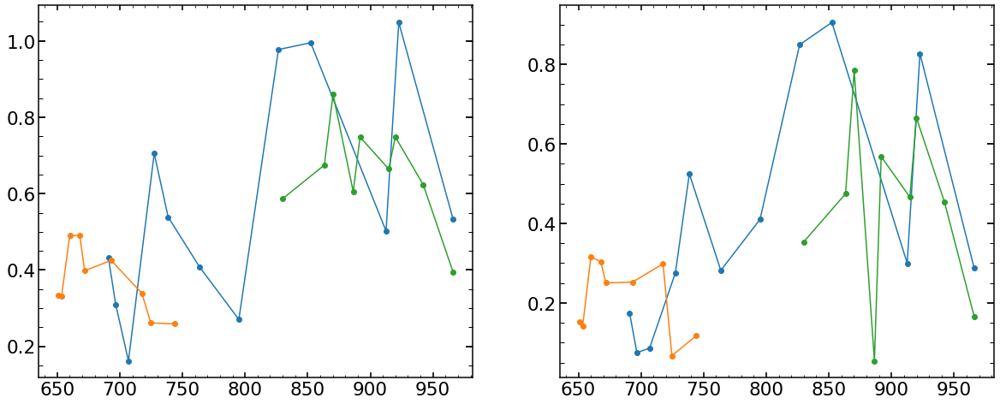

In [888]:
plt.figure(figsize=(20,8))

plt.subplot(121)
plt.plot(wavelength_HgAr,result_for_HgAr[:,0],marker='o')
plt.plot(wavelength_Ne,result_for_Ne[:,0],marker='o')
plt.plot(NeonWavelengths[1:],result_for_Ne_stacked_high_wavelength[:,0][1:],marker='o')


plt.subplot(122)
plt.plot(wavelength_HgAr,result_for_HgAr[:,1],marker='o')
plt.plot(wavelength_Ne,result_for_Ne[:,1],marker='o')
plt.plot(NeonWavelengths[1:],result_for_Ne_stacked_high_wavelength[:,1][1:],marker='o')

#### with cleaning

In [592]:
from astropy.io import fits
stacked_Neon_image=np.zeros((4176,4096))
for i in range(3):
    single_Neon_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-02-27/v0012952/calExp-LA012952r1.fits')[1].data
    stacked_Neon_image+=single_Neon_image

In [593]:
list_of_pm=[None,None,'+',None,'+',None,None,'-','-','+']

[1213   60   14 4021]
0


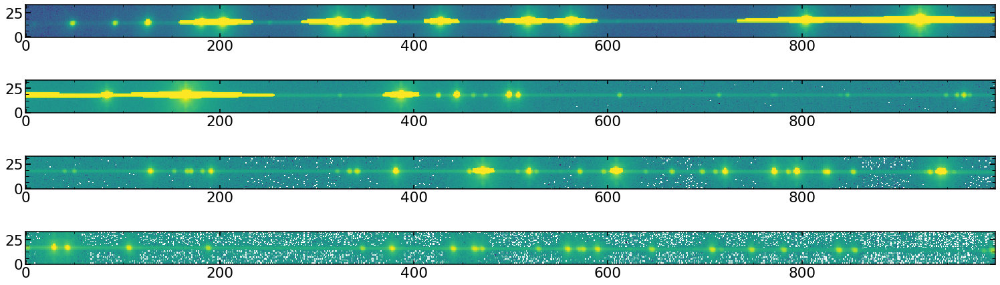

In [594]:
index_defocus=0
which_fiber_starting_at_0=3
single_fiber_offset=[0,0,10,10,0,0,0,0,0,0]
scidata=stacked_Neon_image
scidata_focus=scidata
extension_focus=10
extension=int(np.abs(index_defocus*6*1.2)/2)

single_fiber_extracted_dimensions=np.load('/Users/nevencaplar/Documents/PFS/ReducedData/TransferData/single_fiber_extracted_dimensions_fiber_'+str(which_fiber_starting_at_0)+'.npy')

print(single_fiber_extracted_dimensions)
print(index_defocus*6)

plt.figure(figsize=(26,8))
plt.subplot(411)
plt.imshow(np.transpose(scidata[0:0+1000,
                                single_fiber_extracted_dimensions[0]-extension_focus-extension+single_fiber_offset[which_fiber_starting_at_0]:single_fiber_extracted_dimensions[0]+single_fiber_extracted_dimensions[2]+extension_focus+extension+single_fiber_offset[which_fiber_starting_at_0]]),norm=LogNorm())
plt.subplot(412)
plt.imshow(np.transpose(scidata[0+1000:0+2000,
                                single_fiber_extracted_dimensions[0]-extension_focus-extension+single_fiber_offset[which_fiber_starting_at_0]:single_fiber_extracted_dimensions[0]+single_fiber_extracted_dimensions[2]+extension_focus+extension+single_fiber_offset[which_fiber_starting_at_0]]),norm=LogNorm())
plt.subplot(413)
plt.imshow(np.transpose(scidata[0+2000:0+3000,
                                single_fiber_extracted_dimensions[0]-extension_focus-extension+single_fiber_offset[which_fiber_starting_at_0]:single_fiber_extracted_dimensions[0]+single_fiber_extracted_dimensions[2]+extension_focus+extension+single_fiber_offset[which_fiber_starting_at_0]]),norm=LogNorm())
plt.subplot(414)
plt.imshow(np.transpose(scidata[0+3000:0+4000,
                                single_fiber_extracted_dimensions[0]-extension_focus-extension+single_fiber_offset[which_fiber_starting_at_0]:single_fiber_extracted_dimensions[0]+single_fiber_extracted_dimensions[2]+extension_focus+extension+single_fiber_offset[which_fiber_starting_at_0]]),norm=LogNorm())



In [820]:
scidata_single_fiber=np.sum(scidata[0:0+4176,
                                single_fiber_extracted_dimensions[0]-extension_focus-extension+single_fiber_offset[which_fiber_starting_at_0]:single_fiber_extracted_dimensions[0]+single_fiber_extracted_dimensions[2]+extension_focus+extension+single_fiber_offset[which_fiber_starting_at_0]],axis=1)
        

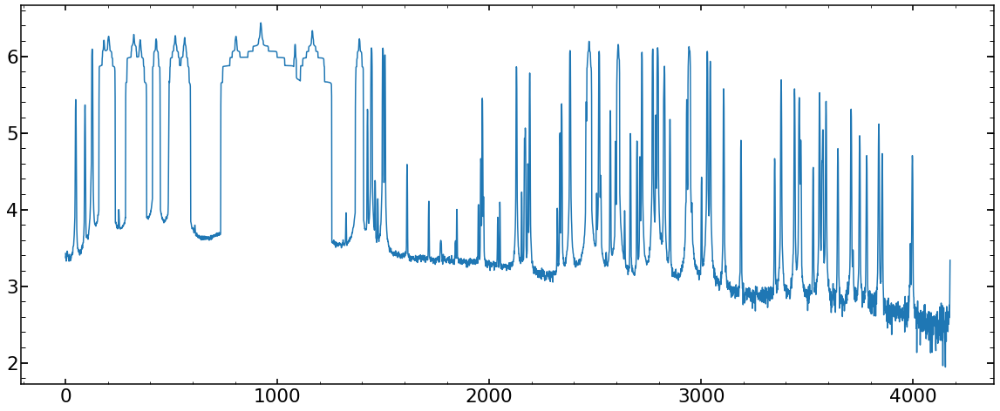

In [821]:
plt.figure(figsize=(20,8))
plt.plot(np.log10(scidata_single_fiber))

In [597]:
np.save("/Users/nevencaplar/Documents/PFS/ReducedData/TransferData/sci_for_continuum/scidata_single_fiber_Ne_overexposed",scidata_single_fiber)

In [598]:
Neon_custom_fit=np.load('/Users/nevencaplar/Documents/PFS/Testing/Fibers/Neon_custom_fit.npy')

In [621]:
custom_Neon_positions[:,1]

array([1387, 2382, 2722, 2854, 3044, 3107, 3378, 3442, 3709, 3998])

In [623]:
custom_Neon_positions[:,1]-1100

array([ 287, 1282, 1622, 1754, 1944, 2007, 2278, 2342, 2609, 2898])

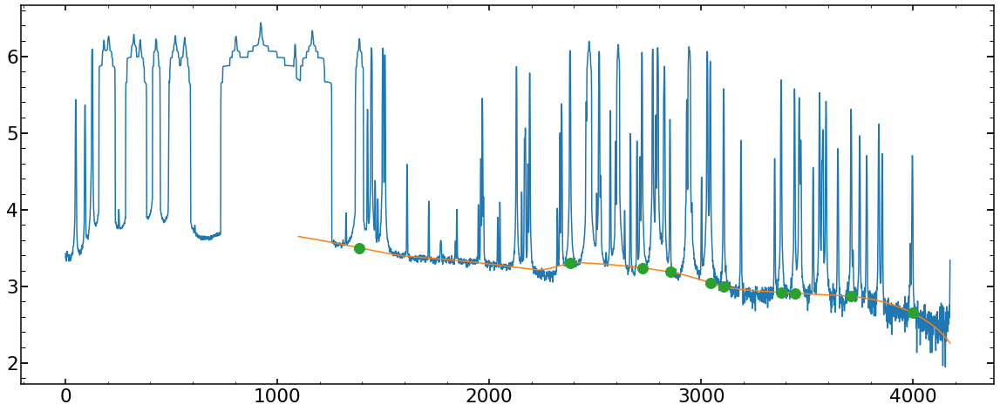

In [628]:
plt.figure(figsize=(20,8))
plt.plot(np.log10(scidata_single_fiber))
plt.plot(range(1100,4176),np.log10(Neon_custom_fit))
plt.plot(custom_Neon_positions[:,1],np.log10(Neon_custom_fit)[custom_Neon_positions[:,1]-1100],marker='o',ls='', markersize=12)

In [600]:
from astropy.io import fits
stacked_Neon_image=np.zeros((4176,4096))
for i in range(3):
    single_Neon_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-02-27/v0012952/calExp-LA012952r1.fits')[1].data
    stacked_Neon_image+=single_Neon_image

In [601]:
list_of_pm=[None,None,'+',None,'+',None,None,'-','-','+']

In [602]:
custom_Neon_positions=np.array([[1231,1387],[1231,2382],[1231,2722],[1230,2854],[1230,3044],[1230,3107],[1229,3378],[1229,3442],[1229,3709],[1229,3998]])

list_of_single_custom_Neon_images=[]
for i in range(len(custom_Neon_positions)):
    single_custom_stacked_Neon_image=stacked_Neon_image[custom_Neon_positions[i][1]-20:custom_Neon_positions[i][1]+20,custom_Neon_positions[i][0]-20:custom_Neon_positions[i][0]+20]
    print(find_centroid_of_flux(single_custom_stacked_Neon_image))
    profile=np.sum(single_custom_stacked_Neon_image[25:40],axis=0)
    #total_flux_in_line_sides=np.sum(np.concatenate((single_custom_stacked_Neon_image[:15],single_custom_stacked_Neon_image[25:40])))
    
    flux_over_40=fit[custom_Neon_positions[i][1]-20-1100:custom_Neon_positions[i][1]+20-1100]
    print(np.sum(scidata_single_fiber[custom_Neon_positions[i][1]-20:custom_Neon_positions[i][1]+20]))   
    print(np.sum(single_custom_stacked_Neon_image))
    print(np.sum(flux_over_40))
    
    subtraction_array=np.zeros((40,40))
    for j in range(40):
        subtraction_array[j]=profile*flux_over_40[j]/np.sum(profile)
    
    
    
    list_of_single_custom_Neon_images.append(single_custom_stacked_Neon_image-subtraction_array)

list_of_single_custom_Neon_images_3=list_of_single_custom_Neon_images

(20.127544498273085, 20.206592334174164)
39240417.50681877
39298536.692619324
126649.65266445099
(20.03560497411618, 19.409310298053423)
5314163.975036804
5325428.27174658
79790.23724987407
(19.559495768774692, 18.453579232905913)
4392854.126680434
4401279.751393855
69378.43636529375
(19.88637926428595, 18.652747744927737)
557520.7410180196
563111.3457756042
61212.36883592647
(19.931417580014784, 10.694766461911225)
7573213.551034927
7581049.523667008
44398.38699191978
(19.41847489789835, 19.473736429200308)
1341416.5946266036
1346005.479975449
39632.443464592805
(19.74882295543005, 19.731109618519582)
1749635.7909281552
1753283.1213771924
33155.490027704465
(19.591121452735862, 21.087748673383896)
1512316.9278884232
1516343.2011480108
32397.166896522875
(18.65727498564094, 19.00583118097576)
756788.3438449781
760084.2728704568
29390.392438509352
(17.62794131194887, 18.528699725317516)
216011.53787586093
218561.67504487932
17939.8775648764


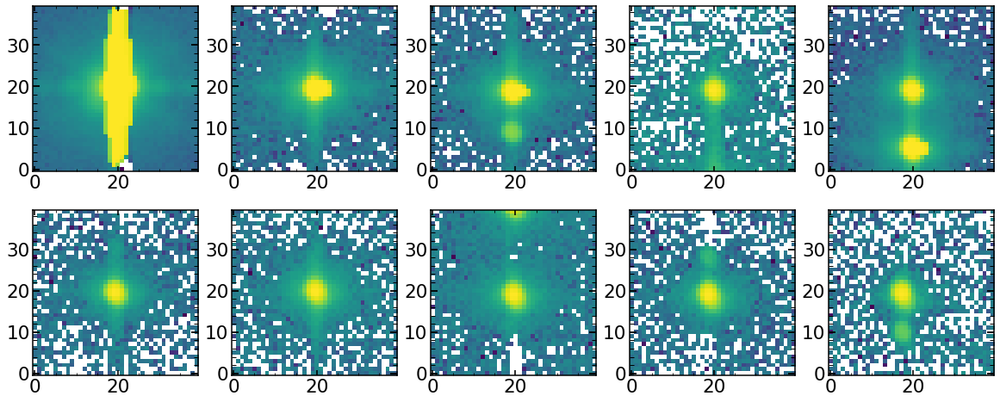

In [603]:
plt.figure(figsize=(20,8))

plt.subplot(251)
plt.imshow(list_of_single_custom_Neon_images[0],origin='lower',norm=LogNorm())

plt.subplot(252)
plt.imshow(list_of_single_custom_Neon_images[1],origin='lower',norm=LogNorm())

plt.subplot(253)
plt.imshow(list_of_single_custom_Neon_images[2],origin='lower',norm=LogNorm())

plt.subplot(254)
plt.imshow(list_of_single_custom_Neon_images[3],origin='lower',norm=LogNorm())

plt.subplot(255)
plt.imshow(list_of_single_custom_Neon_images[4],origin='lower',norm=LogNorm())

plt.subplot(256)
plt.imshow(list_of_single_custom_Neon_images[5],origin='lower',norm=LogNorm())

plt.subplot(257)
plt.imshow(list_of_single_custom_Neon_images[6],origin='lower',norm=LogNorm())

plt.subplot(258)
plt.imshow(list_of_single_custom_Neon_images[7],origin='lower',norm=LogNorm())

plt.subplot(259)
plt.imshow(list_of_single_custom_Neon_images[8],origin='lower',norm=LogNorm())

plt.subplot(2,5,10)
plt.imshow(list_of_single_custom_Neon_images[9],origin='lower',norm=LogNorm())


In [604]:
result_for_Ne_stacked_high_wavelength=[]
for i in range(len(list_of_single_custom_Neon_images)):

    sci_image_40=list_of_single_custom_Neon_images[i]
    list_of_masks=create_mask(sci_image_40,list_of_pm[i])
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]

    res_55=create_res_data(sci_image_40,None,custom_cent=None,size_pixel=15)
    res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=None,size_pixel=15)
    res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=None,size_pixel=15)
    res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=None,size_pixel=15)
    res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=None,size_pixel=15)

    result_for_Ne_stacked_high_wavelength.append([np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150])),
                            np.median(np.nan_to_num(np.log10(res_55_vertical_cross)[90:150])-np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])),
                         np.median(np.nan_to_num(np.log10(res_55_horizontal_cross)[90:150])-np.nan_to_num(np.log10(res_55_diagonal_cross)[90:150]))])
   
result_for_Ne_stacked_high_wavelength_3_stacked=np.array(result_for_Ne_stacked_high_wavelength)

In [605]:
sci_image_40=list_of_single_custom_Neon_images[1]

list_of_masks=create_mask(sci_image_40)
horizontal_cross=list_of_masks[1]
vertical_cross=list_of_masks[2]
diagonal_cross=list_of_masks[3]
center_square=list_of_masks[0]

res_55=create_res_data(sci_image_40,None,custom_cent=1,size_pixel=15)
res_55_horizontal_cross=create_res_data(sci_image_40,horizontal_cross,custom_cent=1,size_pixel=15)
res_55_vertical_cross=create_res_data(sci_image_40,vertical_cross,custom_cent=1,size_pixel=15)
res_55_diagonal_cross=create_res_data(sci_image_40,diagonal_cross,custom_cent=1,size_pixel=15)
res_55_center_square=create_res_data(sci_image_40,center_square,custom_cent=1,size_pixel=15)

Text(0.5,1,'diagonal cross')

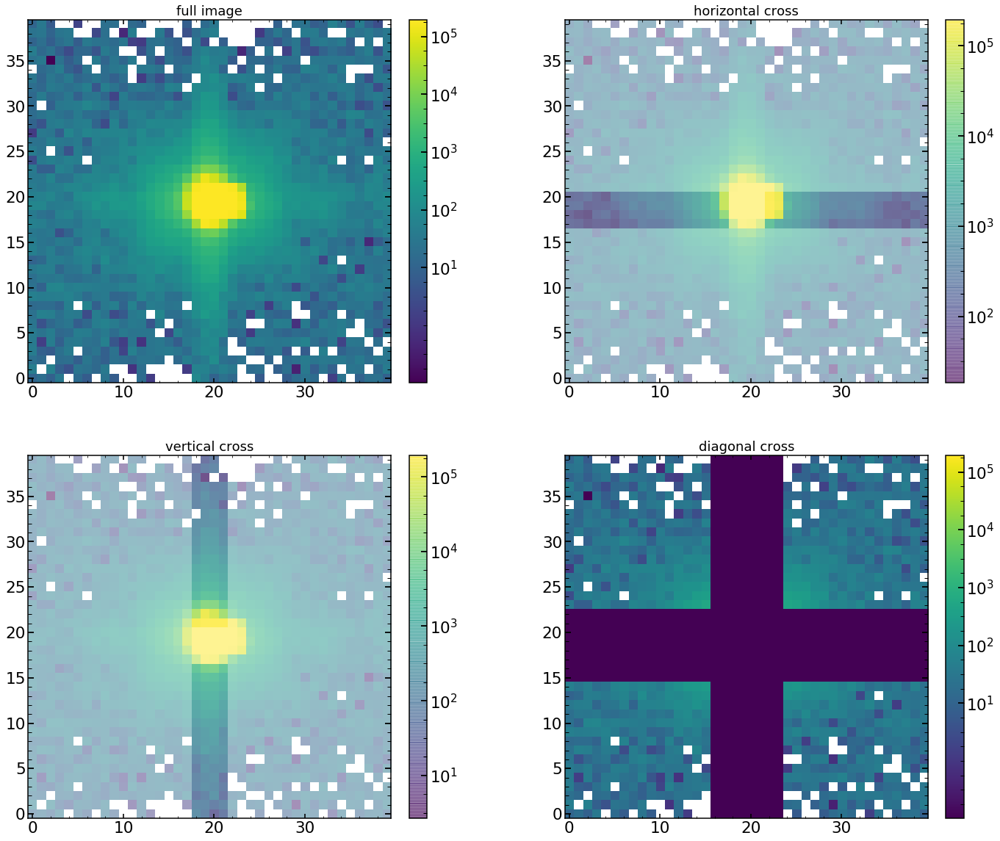

In [606]:
plt.figure(figsize=(24,20))
plt.subplot(221)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('full image', fontsize=18)

plt.subplot(222)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*horizontal_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=0.5)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('horizontal cross', fontsize=18)

plt.subplot(223)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*vertical_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=0.5)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('vertical cross', fontsize=18)

plt.subplot(224)
plt.imshow(sci_image_40,norm=LogNorm(),origin='lower',alpha=0.5)
plt.imshow(sci_image_40*diagonal_cross,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_40),alpha=1)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('diagonal cross', fontsize=18)



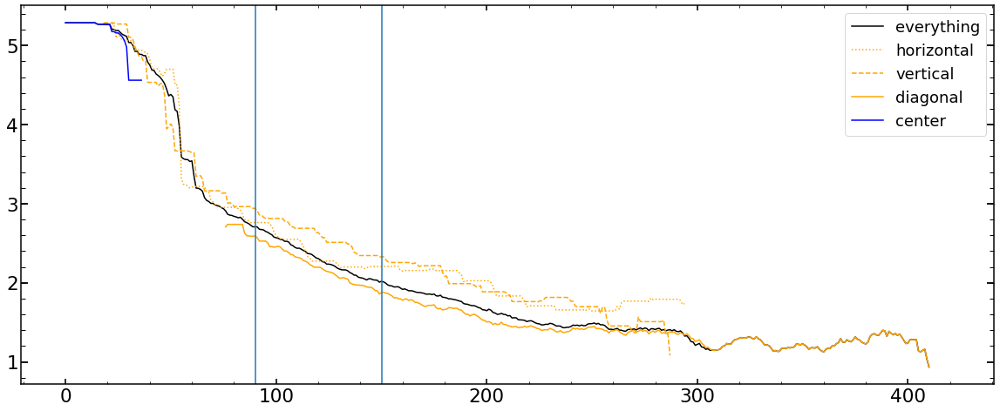

In [580]:
plt.figure(figsize=(20,8))
plt.plot(np.log10(res_55),color='black',label='everything')
plt.plot(np.log10(res_55_horizontal_cross),color='orange',ls=':',label='horizontal')
plt.plot(np.log10(res_55_vertical_cross),color='orange',ls='--',label='vertical')
plt.plot(np.log10(res_55_diagonal_cross),color='orange',ls='-',label='diagonal')
plt.plot(np.log10(res_55_center_square),color='blue',label='center')
plt.axvline(90)
plt.axvline(150)
plt.legend()

In [516]:
custom_Neon_positions

array([[1231, 1387],
       [1231, 2382],
       [1231, 2722],
       [1230, 2854],
       [1230, 3044],
       [1230, 3107],
       [1229, 3378],
       [1229, 3442],
       [1229, 3709],
       [1229, 3998]])

In [445]:
# Working_with_pipeline_May.ipynb on Tiger
NeonWavelengths=np.array([ 743.77557373,  829.87640381,  863.33666992,  870.23724365,
        886.37786865,  891.79968262,  914.66595459,  919.95922852,
        942.28869629,  966.02984619])

## combining - removed overexposed

Text(0,0.5,'log(vertical/horizontal)')

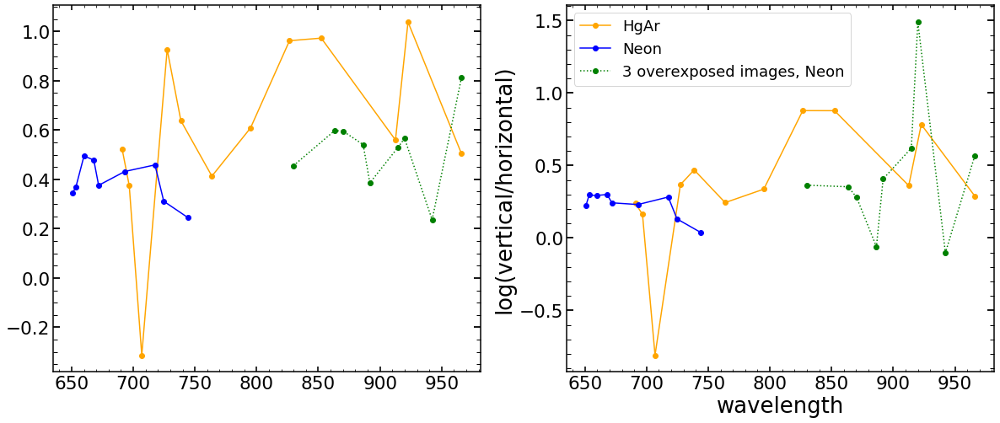

In [939]:
plt.figure(figsize=(20,8))

plt.subplot(121)
plt.plot(wavelength_HgAr,result_for_HgAr[:,0],marker='o',color='orange')
plt.plot(wavelength_Ne,result_for_Ne[:,0],marker='o',color='blue')
#plt.plot(NeonWavelengths[1:],result_for_Ne_stacked_high_wavelength_3_stacked[:,0][1:],marker='o',color='green')
plt.plot(NeonWavelengths[1:],result_for_Ne_stacked_high_wavelength_30_stacked[:,0][1:],marker='o',color='green',ls=':')

plt.subplot(122)
plt.plot(wavelength_HgAr,result_for_HgAr[:,1],marker='o',label='HgAr',color='orange')
plt.plot(wavelength_Ne,result_for_Ne[:,1],marker='o',label='Neon',color='blue')
#plt.plot(NeonWavelengths[1:],result_for_Ne_stacked_high_wavelength_3_stacked[:,1][1:],marker='o',color='green',label='30 images stack, Neon')
plt.plot(NeonWavelengths[1:],result_for_Ne_stacked_high_wavelength_30_stacked[:,1][1:],marker='o',color='green',ls=':',label='3 overexposed images, Neon')
plt.legend()
plt.xlabel('wavelength')
plt.ylabel('log(vertical/horizontal)')

(-0.2, 1)

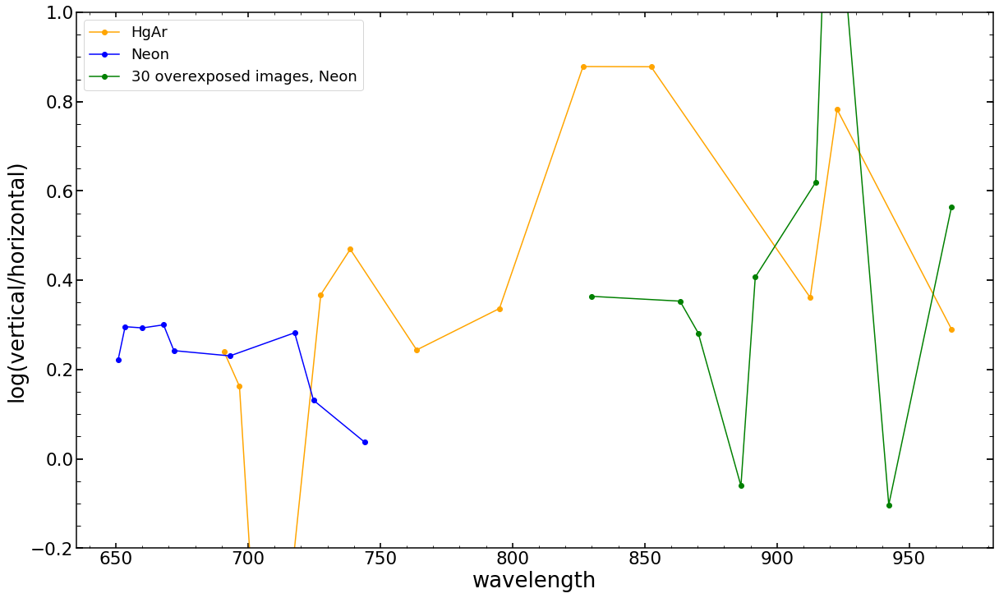

In [940]:
plt.figure(figsize=(20,12))
plt.plot(wavelength_HgAr,result_for_HgAr[:,1],marker='o',label='HgAr',color='orange')
plt.plot(wavelength_Ne,result_for_Ne[:,1],marker='o',label='Neon',color='blue')
#plt.plot(NeonWavelengths[1:],result_for_Ne_stacked_high_wavelength_3_stacked[:,1][1:],marker='o',color='green',ls=':',label='3 overexposed images stack, Neon')
plt.plot(NeonWavelengths[1:],result_for_Ne_stacked_high_wavelength_30_stacked[:,1][1:],marker='o',color='green',label='30 overexposed images, Neon')
plt.legend()
plt.xlabel('wavelength')
plt.ylabel('log(vertical/horizontal)')
plt.ylim(-0.2,1)

## Direct comparison of two spots

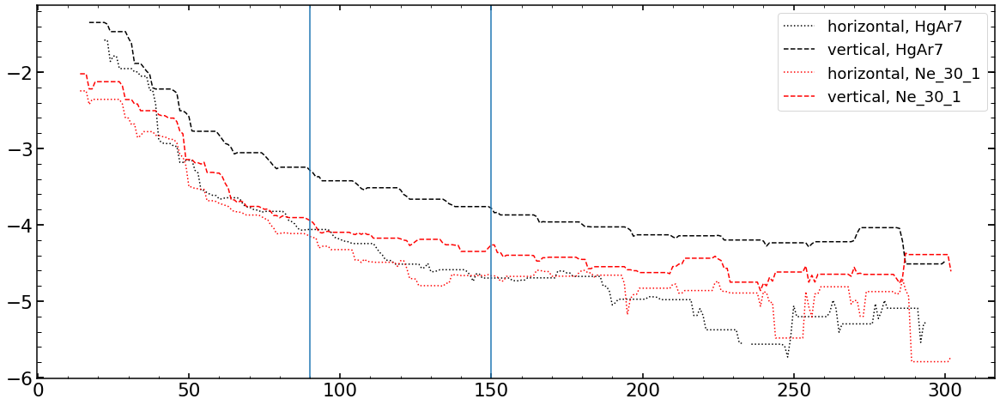

In [941]:
sci_image_40_HgAr7=list_of_sci_image_HgAr_40[7]
sci_image_40_HgAr8=list_of_sci_image_HgAr_40[8]

sci_image_40_Ne_30_1=list_of_single_custom_Neon_images_30[1]
sci_image_40_Ne_3_1=list_of_single_custom_Neon_images_3[1]

list_of_masks_40_HgAr7=create_mask(sci_image_40_HgAr7,'-')
horizontal_cross_40_HgAr7=list_of_masks_40_HgAr7[1]
vertical_cross_40_HgAr7=list_of_masks_40_HgAr7[2]

list_of_masks_40_HgAr8=create_mask(sci_image_40_HgAr8,'+')
horizontal_cross_40_HgAr8=list_of_masks_40_HgAr8[1]
vertical_cross_40_HgAr8=list_of_masks_40_HgAr8[2]

list_of_masks_40_Ne=create_mask(sci_image_40_Ne_30_1)
horizontal_cross_40_Ne=list_of_masks_40_Ne[1]
vertical_cross_40_Ne=list_of_masks_40_Ne[2]

res_55_HgAr7=create_res_data(sci_image_40_HgAr7,None,custom_cent=1,size_pixel=15)
res_55_horizontal_cross_HgAr7=create_res_data(sci_image_40_HgAr7,horizontal_cross,custom_cent=1,size_pixel=15)
res_55_vertical_cross_HgAr7=create_res_data(sci_image_40_HgAr7,vertical_cross,custom_cent=1,size_pixel=15)

res_55_HgAr8=create_res_data(sci_image_40_HgAr8,None,custom_cent=1,size_pixel=15)
res_55_horizontal_cross_HgAr8=create_res_data(sci_image_40_HgAr8,horizontal_cross,custom_cent=1,size_pixel=15)
res_55_vertical_cross_HgAr8=create_res_data(sci_image_40_HgAr8,vertical_cross,custom_cent=1,size_pixel=15)

res_55_Ne_30_1=create_res_data(sci_image_40_Ne_30_1,None,custom_cent=1,size_pixel=15)
res_55_horizontal_cross_Ne_30_1=create_res_data(sci_image_40_Ne_30_1,horizontal_cross,custom_cent=1,size_pixel=15)
res_55_vertical_cross_Ne_30_1=create_res_data(sci_image_40_Ne_30_1,vertical_cross,custom_cent=1,size_pixel=15)

res_55_Ne_3_1=create_res_data(sci_image_40_Ne_3_1,None,custom_cent=1,size_pixel=15)
res_55_horizontal_cross_Ne_3_1=create_res_data(sci_image_40_Ne_3_1,horizontal_cross,custom_cent=1,size_pixel=15)
res_55_vertical_cross_Ne_3_1=create_res_data(sci_image_40_Ne_3_1,vertical_cross,custom_cent=1,size_pixel=15)


plt.figure(figsize=(20,8))
#plt.plot(np.log10(res_55_HgAr7/np.sum(sci_image_40_HgAr7)),color='black',label='everything, HgAr7')
plt.plot(np.log10(res_55_horizontal_cross_HgAr7/np.sum(sci_image_40_HgAr7)),color='black',ls=':',label='horizontal, HgAr7')
plt.plot(np.log10(res_55_vertical_cross_HgAr7/np.sum(sci_image_40_HgAr7)),color='black',ls='--',label='vertical, HgAr7')

#plt.plot(np.log10(res_55_HgAr8/np.sum(sci_image_40_HgAr8)),color='black',label='everything, HgAr8')
#plt.plot(np.log10(res_55_horizontal_cross_HgAr8/np.sum(sci_image_40_HgAr8)),color='brown',ls=':',label='horizontal, HgAr8')
#plt.plot(np.log10(res_55_vertical_cross_HgAr8/np.sum(sci_image_40_HgAr8)),color='brown',ls='--',label='vertical, HgAr8')

#plt.plot(np.log10(res_55_Ne_30_1/np.sum(sci_image_40_Ne_30_1)),color='black',label='everything, Ne_30_1')
plt.plot(np.log10(res_55_horizontal_cross_Ne_30_1/np.sum(res_55_Ne_30_1)),color='red',ls=':',label='horizontal, Ne_30_1')
plt.plot(np.log10(res_55_vertical_cross_Ne_30_1/np.sum(res_55_Ne_30_1)),color='red',ls='--',label='vertical, Ne_30_1')

#plt.plot(np.log10(res_55_Ne_3_1/np.sum(sci_image_40_Ne_3_1)),color='black',label='everything, Ne_3_1')
#plt.plot(np.log10(res_55_horizontal_cross_Ne_3_1/np.sum(sci_image_40_Ne_3_1)),color='orange',ls=':',label='horizontal, Ne_3_1')
#plt.plot(np.log10(res_55_vertical_cross_Ne_3_1/np.sum(sci_image_40_Ne_3_1)),color='orange',ls='--',label='vertical, Ne_3_1')

plt.axvline(90)
plt.axvline(150)
plt.legend()

In [942]:
np.sum(sci_image_40_HgAr7)/np.sum(sci_image_40_Ne_30_1)

1.1169849602421094

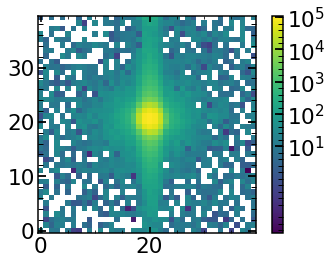

In [943]:
plt.imshow(list_of_sci_image_HgAr_40[7],origin='lower',norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

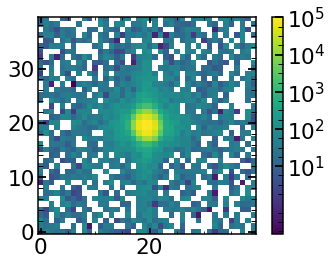

In [944]:
plt.imshow(list_of_single_custom_Neon_images[1],origin='lower',norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

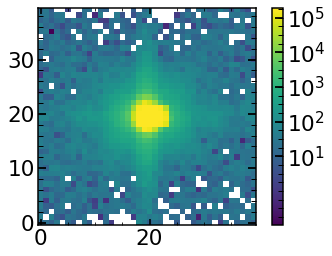

In [945]:
plt.imshow(list_of_single_custom_Neon_images_3[1],origin='lower',norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])


In [719]:
SN=(list_of_single_custom_Neon_images[1]/np.sqrt(list_of_single_custom_Neon_var_images[1])).ravel()
(SN[np.argsort(SN)])[-10:]

array([261.01910533, 278.30981868, 290.06289437, 292.58968234,
       299.08417844, 305.67751632, 349.90454958, 355.88902757,
       367.54159143, 373.39992478])

In [721]:
SN=list_of_sci_image_HgAr_40[7]/np.sqrt(list_of_var_image_HgAr_40[7])
SN =SN[~np.isnan(SN)]
(SN[np.argsort(SN)])[-10:]

array([251.64488, 252.11346, 257.93347, 276.89197, 286.81604, 299.1597 ,
       332.39053, 332.92987, 336.08713, 349.44647], dtype=float32)

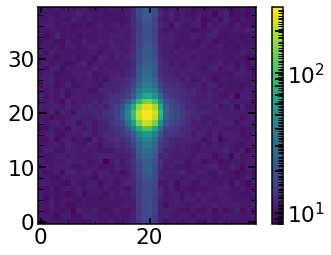

In [724]:
plt.imshow(np.sqrt(list_of_var_image_HgAr_40[7]),norm=LogNorm())
plt.colorbar()

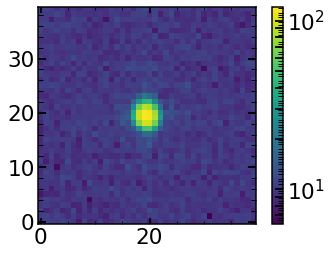

In [726]:
plt.imshow(np.sqrt(list_of_single_custom_Neon_var_images[1]/6),norm=LogNorm())
plt.colorbar()

In [730]:
    def create_artificial_noise(var_image):
        
        artifical_noise=np.zeros_like(var_image)
        artifical_noise=np.array(artifical_noise)
        for i in range(len(artifical_noise)):
            for j in range(len(artifical_noise)):
                artifical_noise[i,j]=np.random.randn()*np.sqrt(var_image[i,j])       
                
        return artifical_noise

In [735]:
res=[]
for i in range(6):
    res.append(list_of_sci_image_HgAr_40[7]/6+create_artificial_noise(list_of_single_custom_Neon_var_images[1]/6))

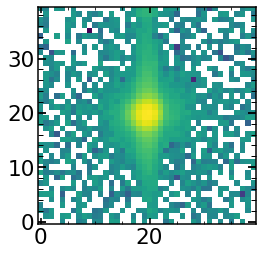

In [739]:
plt.imshow(res[0]+res[1]+res[2]+res[3]+res[4]+res[5],norm=LogNorm())

In [807]:
print(np.sum(list_of_sci_image_HgAr_40[7])/6)
print(np.sum(sci_image_40_Ne_30_1)/30)
print(np.sum(sci_image_40_Ne_3_1)/30)

209742.29166666666
41413.12472116947
174854.60114989014


Text(0.5,1,'Neon')

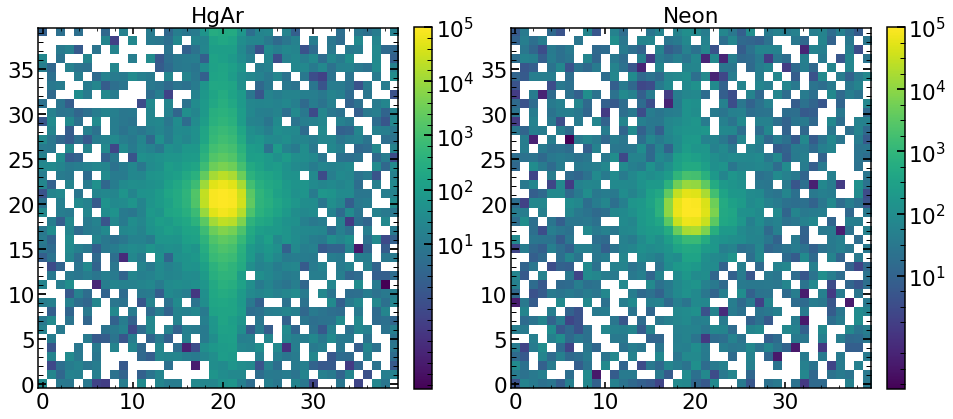

In [969]:
plt.figure(figsize=(24,8))

plt.subplot(131)
plt.imshow(list_of_sci_image_HgAr_40[7],norm=LogNorm(),vmax=10**5)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('HgAr')


plt.subplot(132)
plt.imshow(sci_image_40_Ne_30_1,norm=LogNorm(),vmax=10**5)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.title('Neon')
#plt.subplot(133)
#plt.imshow(sci_image_40_Ne_3_1,norm=LogNorm())



In [949]:
finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']=='4')].values[7][1:3]

array([1241, 2326], dtype=object)

In [952]:
custom_Neon_positions[1]

[1231, 2382]

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

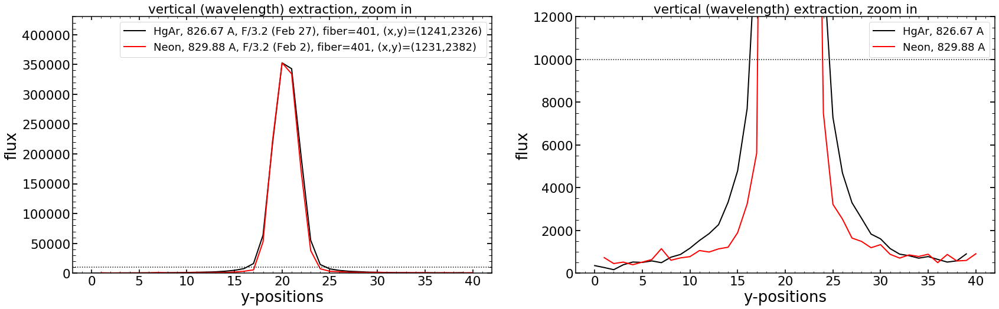

In [968]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(list_of_sci_image_HgAr_40[7],axis=1),label='HgAr, 826.67 A, F/3.2 (Feb 27), fiber=401, (x,y)=(1241,2326)',lw=2,color='black')
plt.plot(range(1,41),np.sum(sci_image_40_Ne_30_1*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=1))/np.max(np.sum(sci_image_40_Ne_30_1,axis=1)),axis=1),label='Neon, 829.88 A, F/3.2 (Feb 2), fiber=401, (x,y)=(1231,2382)',lw=2,color='red')



plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,430000)
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(list_of_sci_image_HgAr_40[7],axis=1),label='HgAr, 826.67 A',lw=2,color='black')
plt.plot(range(1,41),np.sum(sci_image_40_Ne_30_1*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=1))/np.max(np.sum(sci_image_40_Ne_30_1,axis=1)),axis=1),label='Neon, 829.88 A',lw=2,color='red')
plt.axhline(10000,color='black',ls=':')
plt.ylim(0,12000)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

Text(0.5,1,'horizontal extraction')

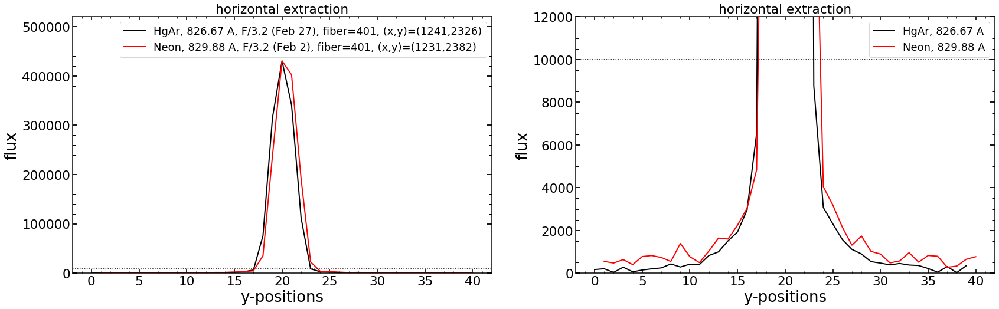

In [966]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(list_of_sci_image_HgAr_40[7],axis=0),label='HgAr, 826.67 A, F/3.2 (Feb 27), fiber=401, (x,y)=(1241,2326)',lw=2,color='black')
plt.plot(range(1,41),np.sum(sci_image_40_Ne_30_1*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=0))/np.max(np.sum(sci_image_40_Ne_30_1,axis=0)),axis=0),label='Neon, 829.88 A, F/3.2 (Feb 2), fiber=401, (x,y)=(1231,2382)',lw=2,color='red')



plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,520000)
plt.legend()
plt.title('horizontal extraction')

plt.subplot(122)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(list_of_sci_image_HgAr_40[7],axis=0),label='HgAr, 826.67 A',lw=2,color='black')
plt.plot(range(1,41),np.sum(sci_image_40_Ne_30_1*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=0))/np.max(np.sum(sci_image_40_Ne_30_1,axis=0)),axis=0),label='Neon, 829.88 A',lw=2,color='red')
plt.axhline(10000,color='black',ls=':')
plt.ylim(0,12000)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('horizontal extraction')


In [975]:
custom_HgAr_position

array([1241, 2326], dtype=object)

In [974]:
from astropy.io import fits
stacked_HgAr_image=np.zeros((4176,4096))
stacked_HgAr_var_image=np.zeros((4176,4096))
for i in range(6):
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-02-02/v00'+str(11748+i)+'/calExp-LA0'+str(11748+i)+'r1.fits')[1].data
    single_HgAr_var_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-02-02/v00'+str(11748+i)+'/calExp-LA0'+str(11748+i)+'r1.fits')[3].data

    stacked_HgAr_image+=single_HgAr_image
    stacked_HgAr_var_image+=single_HgAr_var_image

In [978]:
sci_image_40_HgAr=stacked_HgAr_image[2326-20:2326+20,1241-20:1241+20]

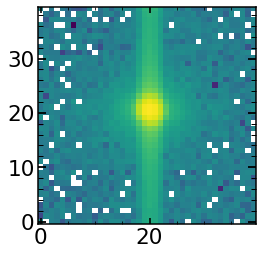

In [980]:
plt.imshow(sci_image_40_HgAr,norm=LogNorm(),origin='lower')

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

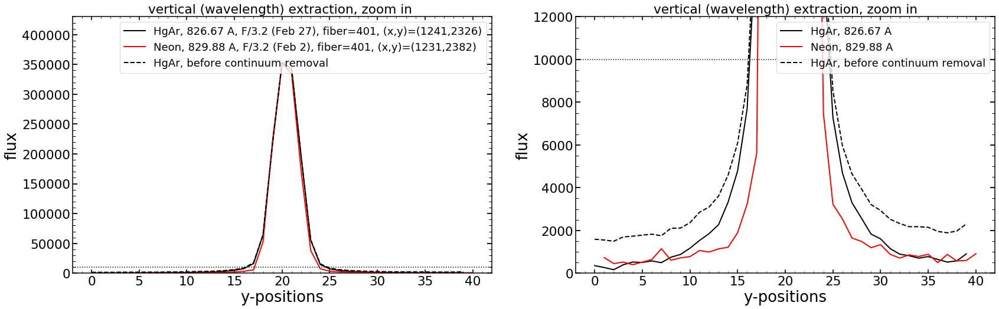

In [986]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(list_of_sci_image_HgAr_40[7],axis=1),label='HgAr, 826.67 A, F/3.2 (Feb 27), fiber=401, (x,y)=(1241,2326)',lw=2,color='black')
plt.plot(range(1,41),np.sum(sci_image_40_Ne_30_1*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=1))/np.max(np.sum(sci_image_40_Ne_30_1,axis=1)),axis=1),label='Neon, 829.88 A, F/3.2 (Feb 2), fiber=401, (x,y)=(1231,2382)',lw=2,color='red')
plt.plot(range(0,40),np.sum(sci_image_40_HgAr*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=1))/np.max(np.sum(sci_image_40_HgAr,axis=1)),axis=1),label='HgAr, before continuum removal',lw=2,color='black',ls='--')



plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,430000)
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(list_of_sci_image_HgAr_40[7],axis=1),label='HgAr, 826.67 A',lw=2,color='black')
plt.plot(range(1,41),np.sum(sci_image_40_Ne_30_1*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=1))/np.max(np.sum(sci_image_40_Ne_30_1,axis=1)),axis=1),label='Neon, 829.88 A',lw=2,color='red')
plt.plot(range(0,40),np.sum(sci_image_40_HgAr*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=1))/np.max(np.sum(sci_image_40_HgAr,axis=1)),axis=1),label='HgAr, before continuum removal',lw=2,color='black',ls='--')

plt.axhline(10000,color='black',ls=':')
plt.ylim(0,12000)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

Text(0.5,1,'horizontal extraction')

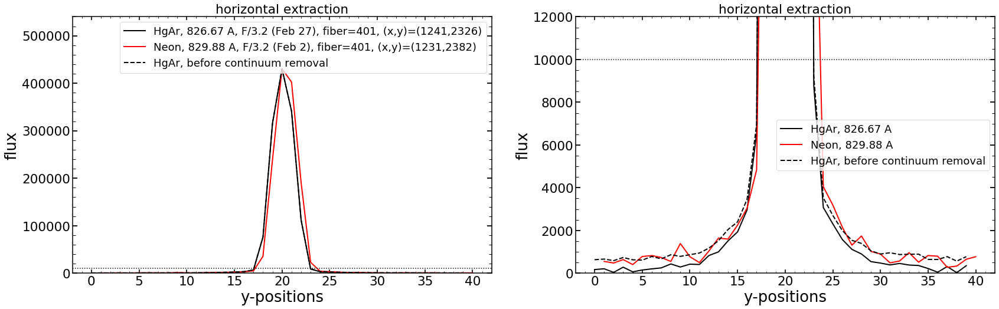

In [989]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(list_of_sci_image_HgAr_40[7],axis=0),label='HgAr, 826.67 A, F/3.2 (Feb 27), fiber=401, (x,y)=(1241,2326)',lw=2,color='black')
plt.plot(range(1,41),np.sum(sci_image_40_Ne_30_1*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=0))/np.max(np.sum(sci_image_40_Ne_30_1,axis=0)),axis=0),label='Neon, 829.88 A, F/3.2 (Feb 2), fiber=401, (x,y)=(1231,2382)',lw=2,color='red')
plt.plot(range(0,40),np.sum(sci_image_40_HgAr*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=0))/np.max(np.sum(sci_image_40_HgAr,axis=0)),axis=0),label='HgAr, before continuum removal',lw=2,color='black',ls='--')



plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,540000)
plt.legend()
plt.title('horizontal extraction')

plt.subplot(122)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(list_of_sci_image_HgAr_40[7],axis=0),label='HgAr, 826.67 A',lw=2,color='black')
plt.plot(range(1,41),np.sum(sci_image_40_Ne_30_1*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=0))/np.max(np.sum(sci_image_40_Ne_30_1,axis=0)),axis=0),label='Neon, 829.88 A',lw=2,color='red')
plt.plot(range(0,40),np.sum(sci_image_40_HgAr*np.max(np.sum(list_of_sci_image_HgAr_40[7],axis=0))/np.max(np.sum(sci_image_40_HgAr,axis=0)),axis=0),label='HgAr, before continuum removal',lw=2,color='black',ls='--')

plt.axhline(10000,color='black',ls=':')
plt.ylim(0,12000)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('horizontal extraction')

In [ ]:
# are the detectors in the same position? seems that they are

# 2019-02-27
# Neon starts at 12922
#HIERARCH W_XCU_MOTOR1_MICRONS = 95.5 / um at FPA                                
#HIERARCH W_XCU_MOTOR2_MICRONS = 197.89 / um at FPA                              
# HIERARCH W_XCU_MOTOR3_MICRONS = 170.12 / um at FPA      

# 2019-02-02
# HgAr is at 11694+54
# HIERARCH W_XCU_MOTOR1_MICRONS = 95.5 / um at FPA                                
# HIERARCH W_XCU_MOTOR2_MICRONS = 197.89 / um at FPA                              
# HIERARCH W_XCU_MOTOR3_MICRONS = 170.12 / um at FPA     

# W_XM1POS
# W_XM2POS
# W_XM3POS

# Neon and HgAr difference (PIPE2D - 439) - dataset 3

## recuting HgAr

In [171]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalHgAr_Feb2019.pkl', 'rb') as f:
    finalHgAr_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalNe_Feb2019.pkl', 'rb') as f:
    finalNe_Feb2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalHgAr_May2019.pkl', 'rb') as f:
    finalHgAr_May2019=pickle.load(f)
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_May_28/Dataframes/finalNe_May2019.pkl', 'rb') as f:
    finalNe_May2019=pickle.load(f)  

In [179]:
np.unique(finalHgAr_May2019['fiber'].values)

array([  2,  63, 192, 255, 339, 401, 464, 525, 587, 650])

In [181]:
finalHgAr_May2019[finalHgAr_May2019['fiber']==255]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
36,255,1222,777,690.9346,0,HgAr,1222,48,nan
37,255,1223,843,696.7261,1,HgAr,1223,49,92.0
38,255,1223,960,706.8989,0,HgAr,1223,50,nan
39,255,1223,1195,727.47876,1,HgAr,1223,51,nan
40,255,1223,1323,738.6248,0,HgAr,1223,52,82.0
41,255,1224,1612,763.74286,0.5,HgAr,1224,53,72.0
42,255,1224,1974,795.0522,1,HgAr,1224,54,52.0
43,255,1223,2340,826.6699,0.5,HgAr,1223,55,42.0
44,255,1223,2641,852.4029,0.5,HgAr,1223,56,32.0
45,255,1222,3350,912.5693,1,HgAr,1222,57,22.0


 ### single running without cleaning

In [53]:
from astropy.io import fits
stacked_HgAr_image=np.zeros((4176,4096))
stacked_HgAr_var_image=np.zeros((4176,4096))
for i in range(6):
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19292+i)+'/calExp-LA0'+str(19292+i)+'r1.fits')[1].data
    single_HgAr_var_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19292+i)+'/calExp-LA0'+str(19292+i)+'r1.fits')[3].data

    stacked_HgAr_image+=single_HgAr_image
    stacked_HgAr_var_image+=single_HgAr_var_image

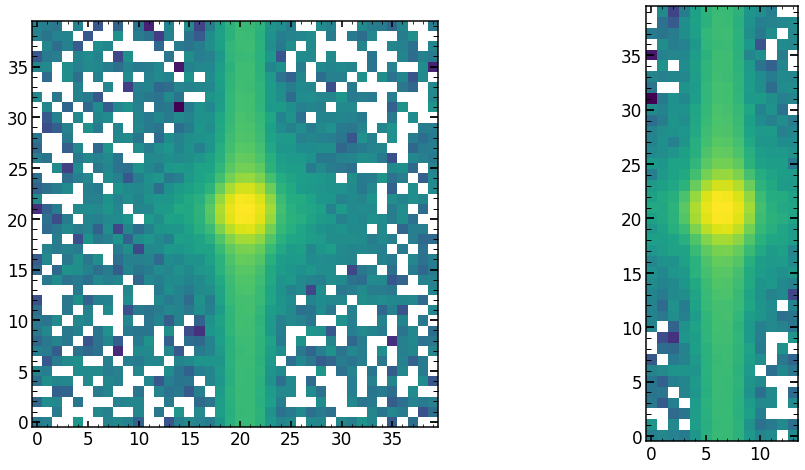

In [1049]:
plt.figure(figsize=(16,8))

plt.subplot(121)
sci_image_46_HgAr=stacked_HgAr_image[3465-20:3465+20,1220-20:1220+20]
plt.imshow(sci_image_46_HgAr,norm=LogNorm(),origin='lower')

plt.subplot(122)
sci_image_46_HgAr_12=sci_image_46_HgAr[:,14:28]
plt.imshow(sci_image_46_HgAr_12,norm=LogNorm(),origin='lower')

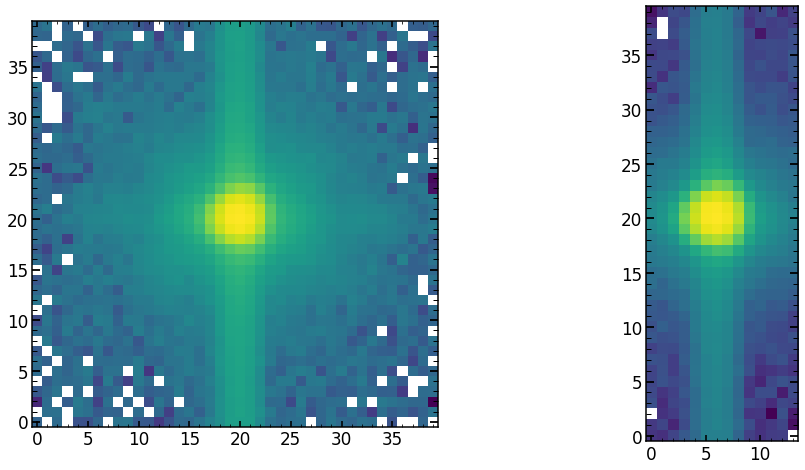

In [195]:
plt.figure(figsize=(16,8))

plt.subplot(121)
sci_image_44_HgAr=stacked_HgAr_image[3345-20:3345+20,1221-20:1221+20]
plt.imshow(sci_image_44_HgAr,norm=LogNorm(),origin='lower')

plt.subplot(122)
sci_image_44_HgAr_12=sci_image_44_HgAr[:,14:28]
plt.imshow(sci_image_44_HgAr_12,norm=LogNorm(),origin='lower')

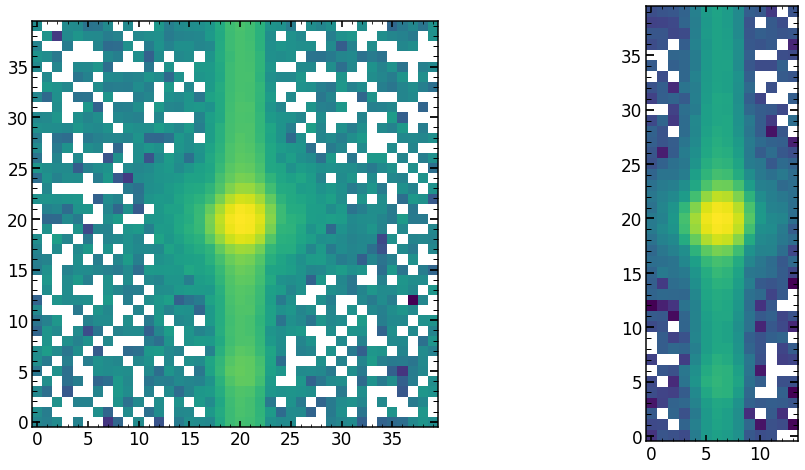

In [189]:
plt.figure(figsize=(16,8))

plt.subplot(121)
sci_image_43_HgAr=stacked_HgAr_image[2637-20:2637+20,1222-20:1222+20]
plt.imshow(sci_image_43_HgAr,norm=LogNorm(),origin='lower')

plt.subplot(122)
sci_image_43_HgAr_12=sci_image_43_HgAr[:,14:28]
plt.imshow(sci_image_43_HgAr_12,norm=LogNorm(),origin='lower')

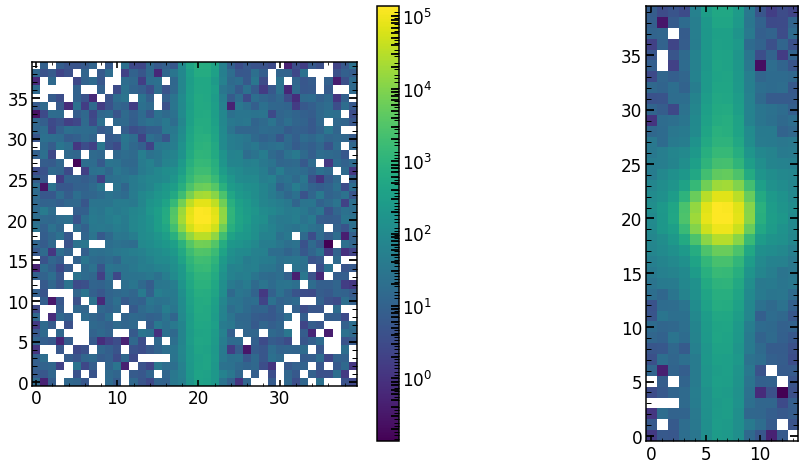

In [338]:
plt.figure(figsize=(16,8))

plt.subplot(121)
sci_image_42_HgAr=stacked_HgAr_image[2337-20:2337+20,1222-20:1222+20]
plt.imshow(sci_image_42_HgAr,norm=LogNorm(),origin='lower')
plt.colorbar()

plt.subplot(122)
sci_image_42_HgAr_12=sci_image_42_HgAr[:,14:28]
plt.imshow(sci_image_42_HgAr_12,norm=LogNorm(),origin='lower')

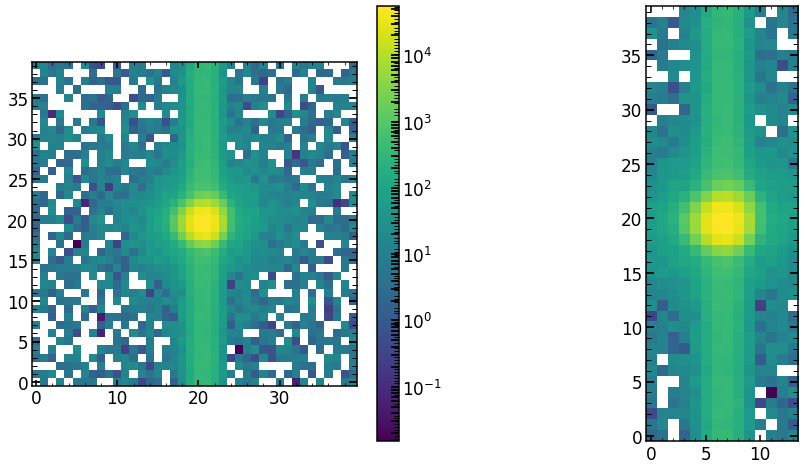

In [337]:
plt.figure(figsize=(16,8))

plt.subplot(121)
sci_image_41_HgAr_12=stacked_HgAr_image[1971-20:1971+20,1222-20:1222+20]
plt.imshow(sci_image_41_HgAr_12,norm=LogNorm(),origin='lower')
plt.colorbar()

plt.subplot(122)
sci_image_41_HgAr_12=sci_image_41_HgAr_12[:,14:28]
plt.imshow(sci_image_41_HgAr_12,norm=LogNorm(),origin='lower')

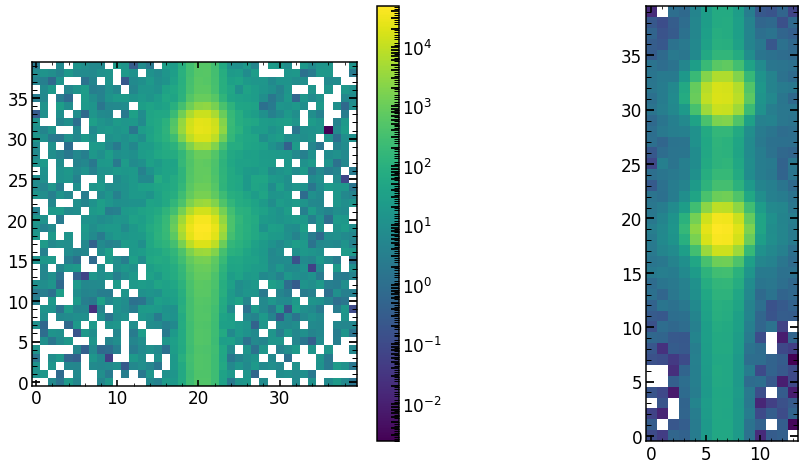

In [1064]:
plt.figure(figsize=(16,8))

plt.subplot(121)
sci_image_40_HgAr_12=stacked_HgAr_image[1460-20:1460+20,1222-20:1222+20]
plt.imshow(sci_image_40_HgAr_12,norm=LogNorm(),origin='lower')
plt.colorbar()

plt.subplot(122)
sci_image_40_HgAr_12=sci_image_40_HgAr_12[:,14:28]
plt.imshow(sci_image_40_HgAr_12,norm=LogNorm(),origin='lower')

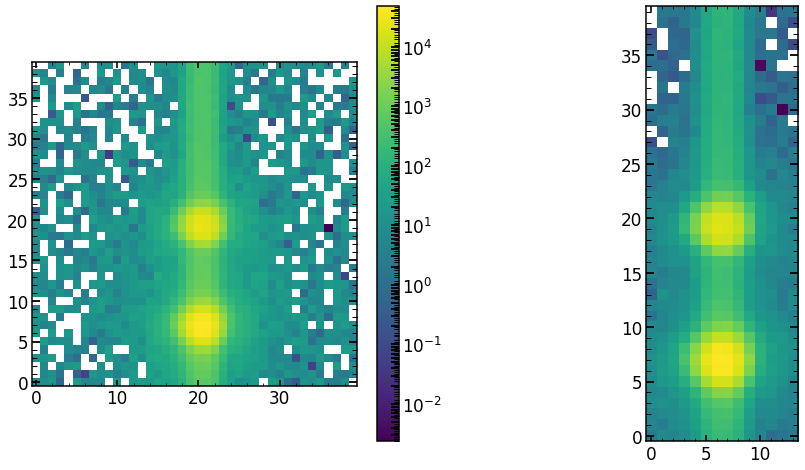

In [1067]:
plt.figure(figsize=(16,8))

plt.subplot(121)
sci_image_40b_HgAr_12=stacked_HgAr_image[1472-20:1472+20,1222-20:1222+20]
plt.imshow(sci_image_40b_HgAr_12,norm=LogNorm(),origin='lower')
plt.colorbar()

plt.subplot(122)
sci_image_40b_HgAr_12=sci_image_40b_HgAr_12[:,14:28]
plt.imshow(sci_image_40b_HgAr_12,norm=LogNorm(),origin='lower')

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

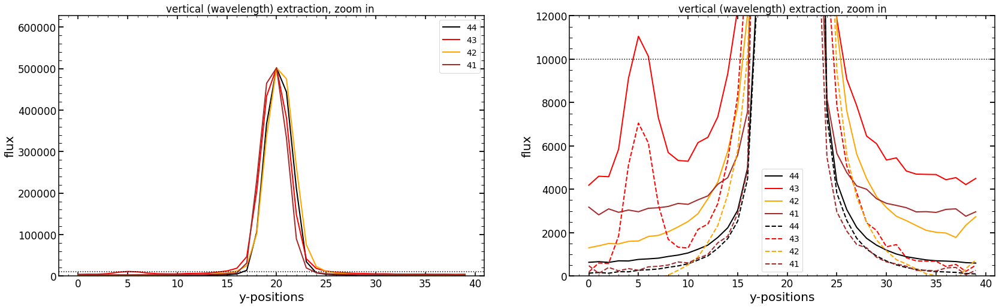

In [209]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(0,40),np.sum(sci_image_44_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_44_HgAr_12,axis=1)),axis=1),
         label='44',lw=2,color='black')
plt.plot(range(0,40),np.sum(sci_image_43_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_43_HgAr_12,axis=1)),axis=1),
         label='43',lw=2,color='red')
plt.plot(range(0,40),np.sum(sci_image_42_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_42_HgAr_12,axis=1)),axis=1),
         label='42',lw=2,color='orange')
plt.plot(range(0,40),np.sum(sci_image_41_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_41_HgAr_12,axis=1)),axis=1),
         label='41',lw=2,color='brown')


plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*np.sum(sci_image_40_HgAr_12,axis=1)))
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(0,40),np.sum(sci_image_44_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_44_HgAr_12,axis=1)),axis=1),
         label='44',lw=2,color='black')
plt.plot(range(0,40),np.sum(sci_image_43_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_43_HgAr_12,axis=1)),axis=1),
         label='43',lw=2,color='red')
plt.plot(range(0,40),np.sum(sci_image_42_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_42_HgAr_12,axis=1)),axis=1),
         label='42',lw=2,color='orange')
plt.plot(range(0,40),np.sum(sci_image_41_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_41_HgAr_12,axis=1)),axis=1),
         label='41',lw=2,color='brown')

plt.plot(range(0,40),np.sum(sci_image_44_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_44_HgAr_12,axis=1)),axis=1)-500,
         label='44',lw=2,color='black',ls='--')
plt.plot(range(0,40),np.sum(sci_image_43_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_43_HgAr_12,axis=1)),axis=1)-4000,
         label='43',lw=2,color='red',ls='--')
plt.plot(range(0,40),np.sum(sci_image_42_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_42_HgAr_12,axis=1)),axis=1)-2000,
         label='42',lw=2,color='orange',ls='--')
plt.plot(range(0,40),np.sum(sci_image_41_HgAr_12*np.max(np.sum(sci_image_42_HgAr_12,axis=1))/np.max(np.sum(sci_image_41_HgAr_12,axis=1)),axis=1)-2700,
         label='41',lw=2,color='brown',ls='--')



plt.axhline(10000,color='black',ls=':')
plt.ylim(0,12000)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

## same with dithering data 

In [583]:
from astropy.io import fits

stacked_HgAr_image_mm=np.zeros((4176,4096))
stacked_HgAr_var_image_mm=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19172+i)+'/calExp-LA0'+str(19172+i)+'r1.fits')
    hdr = hdul[0].header
    print(19172+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19172+i)+'/calExp-LA0'+str(19172+i)+'r1.fits')[1].data
    stacked_HgAr_image_mm+=single_HgAr_image
    
stacked_HgAr_image_m0=np.zeros((4176,4096))
stacked_HgAr_var_image_m0=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19184+i)+'/calExp-LA0'+str(19184+i)+'r1.fits')
    hdr = hdul[0].header
    print(19184+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19184+i)+'/calExp-LA0'+str(19184+i)+'r1.fits')[1].data
    stacked_HgAr_image_m0+=single_HgAr_image
    
stacked_HgAr_image_mp=np.zeros((4176,4096))
stacked_HgAr_var_image_mp=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19178+i)+'/calExp-LA0'+str(19178+i)+'r1.fits')
    hdr = hdul[0].header
    print(19184+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19178+i)+'/calExp-LA0'+str(19178+i)+'r1.fits')[1].data
    stacked_HgAr_image_mp+=single_HgAr_image
    
stacked_HgAr_image_0m=np.zeros((4176,4096))
stacked_HgAr_var_image_0m=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19208+i)+'/calExp-LA0'+str(19208+i)+'r1.fits')
    hdr = hdul[0].header
    print(19208+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19208+i)+'/calExp-LA0'+str(19208+i)+'r1.fits')[1].data
    stacked_HgAr_image_0m+=single_HgAr_image
        
    
stacked_HgAr_image_00=np.zeros((4176,4096))
stacked_HgAr_var_image_00=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19220+i)+'/calExp-LA0'+str(19220+i)+'r1.fits')
    hdr = hdul[0].header
    print(19220+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19220+i)+'/calExp-LA0'+str(19220+i)+'r1.fits')[1].data
    stacked_HgAr_image_00+=single_HgAr_image  
    

stacked_HgAr_image_0p=np.zeros((4176,4096))
stacked_HgAr_var_image_0p=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19214+i)+'/calExp-LA0'+str(19214+i)+'r1.fits')
    hdr = hdul[0].header
    print(19214+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19214+i)+'/calExp-LA0'+str(19214+i)+'r1.fits')[1].data
    stacked_HgAr_image_0p+=single_HgAr_image  
   
    

stacked_HgAr_image_pm=np.zeros((4176,4096))
stacked_HgAr_var_image_pm=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19190+i)+'/calExp-LA0'+str(19190+i)+'r1.fits')
    hdr = hdul[0].header
    print(19190+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19190+i)+'/calExp-LA0'+str(19190+i)+'r1.fits')[1].data
    stacked_HgAr_image_pm+=single_HgAr_image
    

stacked_HgAr_image_p0=np.zeros((4176,4096))
stacked_HgAr_var_image_p0=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19202+i)+'/calExp-LA0'+str(19202+i)+'r1.fits')
    hdr = hdul[0].header
    print(19202+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19202+i)+'/calExp-LA0'+str(19202+i)+'r1.fits')[1].data
    stacked_HgAr_image_p0+=single_HgAr_image  
    
    
stacked_HgAr_image_pp=np.zeros((4176,4096))
stacked_HgAr_var_image_pp=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19196+i)+'/calExp-LA0'+str(19196+i)+'r1.fits')
    hdr = hdul[0].header
    print(19196+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    single_HgAr_image=hdul[1].data
    single_HgAr_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-07/v00'+str(19196+i)+'/calExp-LA0'+str(19196+i)+'r1.fits')[1].data
    stacked_HgAr_image_pp+=single_HgAr_image
    
    


    
    



19172 -0.01701 -0.017
19173 -0.01701 -0.017
19174 -0.01701 -0.017
19175 -0.01701 -0.017
19176 -0.01701 -0.017
19177 -0.01701 -0.017
19184 -0.01701 1e-05
19185 -0.017 0.0
19186 -0.017 0.0
19187 -0.017 0.0
19188 -0.017 0.0
19189 -0.017 0.0
19184 -0.01701 0.017
19185 -0.01701 0.01701
19186 -0.01701 0.01701
19187 -0.01701 0.01701
19188 -0.01701 0.01701
19189 -0.01701 0.01701
19208 -1e-05 -0.01701
19209 -1e-05 -0.01701
19210 -1e-05 -0.01701
19211 -1e-05 -0.01701
19212 -1e-05 -0.01701
19213 -1e-05 -0.01701
19220 0.0 -0.0
19221 0.0 -0.0
19222 0.0 -0.0
19223 0.0 -0.0
19224 0.0 -0.0
19225 0.0 -0.0
19214 -1e-05 0.017
19215 -0.0 0.01701
19216 -0.0 0.01701
19217 -0.0 0.01701
19218 -0.0 0.01701
19219 -0.0 0.01701
19190 0.01702 -0.017
19191 0.01701 -0.017
19192 0.01701 -0.017
19193 0.01701 -0.017
19194 0.01701 -0.017
19195 0.01701 -0.017
19202 0.01701 0.0
19203 0.01701 0.0
19204 0.01701 0.0
19205 0.01701 0.0
19206 0.01701 0.0
19207 0.01701 0.0
19196 0.017 0.017
19197 0.01701 0.01701
19198 0.01701 0.

In [925]:
finalHgAr_May2019[finalHgAr_May2019['fiber']==401]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
60,401,1992,771,690.9346,0,HgAr,1992,84,nan
61,401,1992,836,696.7261,1,HgAr,1992,85,93.0
62,401,1992,952,706.8989,0,HgAr,1992,86,nan
63,401,1992,1187,727.47876,1,HgAr,1992,87,nan
64,401,1992,1314,738.6248,0,HgAr,1992,88,83.0
65,401,1992,1603,763.74286,0.5,HgAr,1992,89,73.0
66,401,1992,1965,795.0522,1,HgAr,1992,90,53.0
67,401,1992,2332,826.6699,0.5,HgAr,1992,91,43.0
68,401,1992,2631,852.4029,0.5,HgAr,1992,92,33.0
69,401,1992,3340,912.5693,1,HgAr,1992,93,23.0


In [1068]:
########
value_y=3465
value_x=1220

sci_image_46_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_46_stacked_HgAr_image_0m=sci_image_46_stacked_HgAr_image_0m/np.max(sci_image_46_stacked_HgAr_image_0m)

sci_image_46_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_46_stacked_HgAr_image_m0=sci_image_46_stacked_HgAr_image_m0/np.max(sci_image_46_stacked_HgAr_image_m0)

sci_image_46_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_46_stacked_HgAr_image_mm=sci_image_46_stacked_HgAr_image_mm/np.max(sci_image_46_stacked_HgAr_image_mm)

sci_image_46_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_46_stacked_HgAr_image_00=sci_image_46_stacked_HgAr_image_00/np.max(sci_image_46_stacked_HgAr_image_00)

########

value_y=3345

sci_image_45_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_00=sci_image_45_stacked_HgAr_image_00/np.max(sci_image_45_stacked_HgAr_image_00)

sci_image_45_stacked_HgAr_image_0p=stacked_HgAr_image_0p[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_0p=sci_image_45_stacked_HgAr_image_0p/np.max(sci_image_45_stacked_HgAr_image_0p)

sci_image_45_stacked_HgAr_image_p0=stacked_HgAr_image_p0[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_p0=sci_image_45_stacked_HgAr_image_p0/np.max(sci_image_45_stacked_HgAr_image_p0)

sci_image_45_stacked_HgAr_image_pp=stacked_HgAr_image_pp[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_pp=sci_image_45_stacked_HgAr_image_pp/np.max(sci_image_45_stacked_HgAr_image_pp)

sci_image_45_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_0m=sci_image_45_stacked_HgAr_image_0m/np.max(sci_image_45_stacked_HgAr_image_0m)

sci_image_45_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_m0=sci_image_45_stacked_HgAr_image_m0/np.max(sci_image_45_stacked_HgAr_image_m0)

sci_image_45_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_mm=sci_image_45_stacked_HgAr_image_mm/np.max(sci_image_45_stacked_HgAr_image_mm)

sci_image_45_stacked_HgAr_image_mp=stacked_HgAr_image_mp[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_mp=sci_image_45_stacked_HgAr_image_mp/np.max(sci_image_45_stacked_HgAr_image_mp)

sci_image_45_stacked_HgAr_image_pm=stacked_HgAr_image_pm[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_pm=sci_image_45_stacked_HgAr_image_pm/np.max(sci_image_45_stacked_HgAr_image_pm)
########
value_y=2636
value_x=1222

sci_image_44_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_HgAr_image_0m=sci_image_44_stacked_HgAr_image_0m/np.max(sci_image_44_stacked_HgAr_image_0m)

sci_image_44_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_HgAr_image_m0=sci_image_44_stacked_HgAr_image_m0/np.max(sci_image_44_stacked_HgAr_image_m0)

sci_image_44_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_HgAr_image_mm=sci_image_44_stacked_HgAr_image_mm/np.max(sci_image_44_stacked_HgAr_image_mm)

sci_image_44_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_HgAr_image_00=sci_image_44_stacked_HgAr_image_00/np.max(sci_image_44_stacked_HgAr_image_00)
########
value_y=2808
value_x=1222

sci_image_44b_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44b_stacked_HgAr_image_0m=sci_image_44b_stacked_HgAr_image_0m/np.max(sci_image_44b_stacked_HgAr_image_0m)

sci_image_44b_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44b_stacked_HgAr_image_m0=sci_image_44b_stacked_HgAr_image_m0/np.max(sci_image_44b_stacked_HgAr_image_m0)

sci_image_44b_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44b_stacked_HgAr_image_mm=sci_image_44b_stacked_HgAr_image_mm/np.max(sci_image_44b_stacked_HgAr_image_mm)

sci_image_44b_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44b_stacked_HgAr_image_00=sci_image_44b_stacked_HgAr_image_00/np.max(sci_image_44b_stacked_HgAr_image_00)

########
value_y=2524
value_x=1222

sci_image_43b_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43b_stacked_HgAr_image_0m=sci_image_43b_stacked_HgAr_image_0m/np.max(sci_image_43b_stacked_HgAr_image_0m)

sci_image_43b_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43b_stacked_HgAr_image_m0=sci_image_43b_stacked_HgAr_image_m0/np.max(sci_image_43b_stacked_HgAr_image_m0)

sci_image_43b_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43b_stacked_HgAr_image_mm=sci_image_43b_stacked_HgAr_image_mm/np.max(sci_image_43b_stacked_HgAr_image_mm)

sci_image_43b_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43b_stacked_HgAr_image_00=sci_image_43b_stacked_HgAr_image_00/np.max(sci_image_43b_stacked_HgAr_image_00)


########
value_y=2504
value_x=1222

sci_image_43a_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43a_stacked_HgAr_image_0m=sci_image_43a_stacked_HgAr_image_0m/np.max(sci_image_43a_stacked_HgAr_image_0m)

sci_image_43a_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43a_stacked_HgAr_image_m0=sci_image_43a_stacked_HgAr_image_m0/np.max(sci_image_43a_stacked_HgAr_image_m0)

sci_image_43a_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43a_stacked_HgAr_image_mm=sci_image_43a_stacked_HgAr_image_mm/np.max(sci_image_43a_stacked_HgAr_image_mm)

sci_image_43a_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43a_stacked_HgAr_image_00=sci_image_43a_stacked_HgAr_image_00/np.max(sci_image_43a_stacked_HgAr_image_00)

########
value_y=2337
value_x=1222

sci_image_43_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_HgAr_image_0m=sci_image_43_stacked_HgAr_image_0m/np.max(sci_image_43_stacked_HgAr_image_0m)

sci_image_43_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_HgAr_image_m0=sci_image_43_stacked_HgAr_image_m0/np.max(sci_image_43_stacked_HgAr_image_m0)

sci_image_43_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_HgAr_image_mm=sci_image_43_stacked_HgAr_image_mm/np.max(sci_image_43_stacked_HgAr_image_mm)

sci_image_43_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_HgAr_image_00=sci_image_43_stacked_HgAr_image_00/np.max(sci_image_43_stacked_HgAr_image_00)


########
value_y=1970
value_x=1222

sci_image_42_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_HgAr_image_0m=sci_image_42_stacked_HgAr_image_0m/np.max(sci_image_42_stacked_HgAr_image_0m)

sci_image_42_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_HgAr_image_m0=sci_image_42_stacked_HgAr_image_m0/np.max(sci_image_42_stacked_HgAr_image_m0)

sci_image_42_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_HgAr_image_mm=sci_image_42_stacked_HgAr_image_mm/np.max(sci_image_42_stacked_HgAr_image_mm)

sci_image_42_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_HgAr_image_00=sci_image_42_stacked_HgAr_image_00/np.max(sci_image_42_stacked_HgAr_image_00)

########
value_y=1460
value_x=1222

sci_image_40_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_40_stacked_HgAr_image_0m=sci_image_40_stacked_HgAr_image_0m/np.max(sci_image_40_stacked_HgAr_image_0m)

sci_image_40_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_40_stacked_HgAr_image_m0=sci_image_40_stacked_HgAr_image_m0/np.max(sci_image_40_stacked_HgAr_image_m0)

sci_image_40_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_40_stacked_HgAr_image_mm=sci_image_40_stacked_HgAr_image_mm/np.max(sci_image_40_stacked_HgAr_image_mm)

sci_image_40_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_40_stacked_HgAr_image_00=sci_image_40_stacked_HgAr_image_00/np.max(sci_image_40_stacked_HgAr_image_00)

########
value_y=1472
value_x=1222

sci_image_40b_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_40b_stacked_HgAr_image_0m=sci_image_40b_stacked_HgAr_image_0m/np.max(sci_image_40b_stacked_HgAr_image_0m)

sci_image_40b_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_40b_stacked_HgAr_image_m0=sci_image_40b_stacked_HgAr_image_m0/np.max(sci_image_40b_stacked_HgAr_image_m0)

sci_image_40b_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_40b_stacked_HgAr_image_mm=sci_image_40b_stacked_HgAr_image_mm/np.max(sci_image_40b_stacked_HgAr_image_mm)

sci_image_40b_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_40b_stacked_HgAr_image_00=sci_image_40b_stacked_HgAr_image_00/np.max(sci_image_40b_stacked_HgAr_image_00)


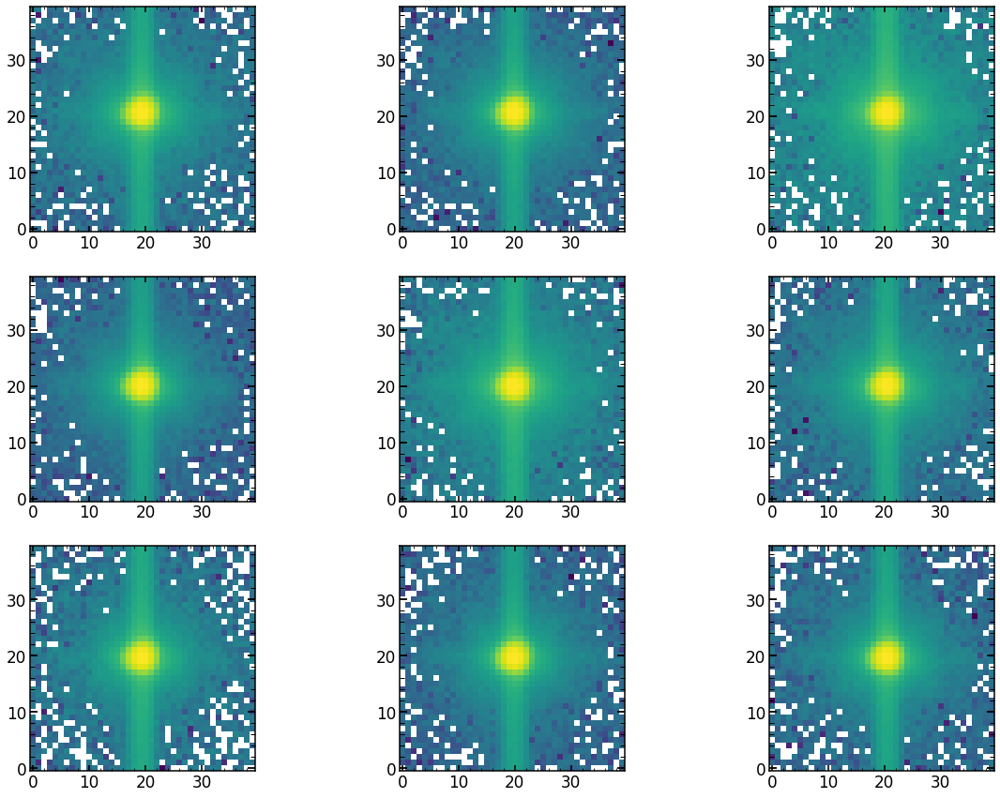

In [1018]:
plt.figure(figsize=(20,15))

plt.subplot(339)
plt.imshow(sci_image_45_stacked_HgAr_image_mp,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(336)
plt.imshow(sci_image_45_stacked_HgAr_image_0p,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(333)
plt.imshow(sci_image_45_stacked_HgAr_image_pp,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(338)
plt.imshow(sci_image_45_stacked_HgAr_image_m0,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(335)
plt.imshow(sci_image_45_stacked_HgAr_image_00,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(332)
plt.imshow(sci_image_45_stacked_HgAr_image_p0,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(337)
plt.imshow(sci_image_45_stacked_HgAr_image_mm,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(334)
plt.imshow(sci_image_45_stacked_HgAr_image_0m,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(331)
plt.imshow(sci_image_45_stacked_HgAr_image_pm,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

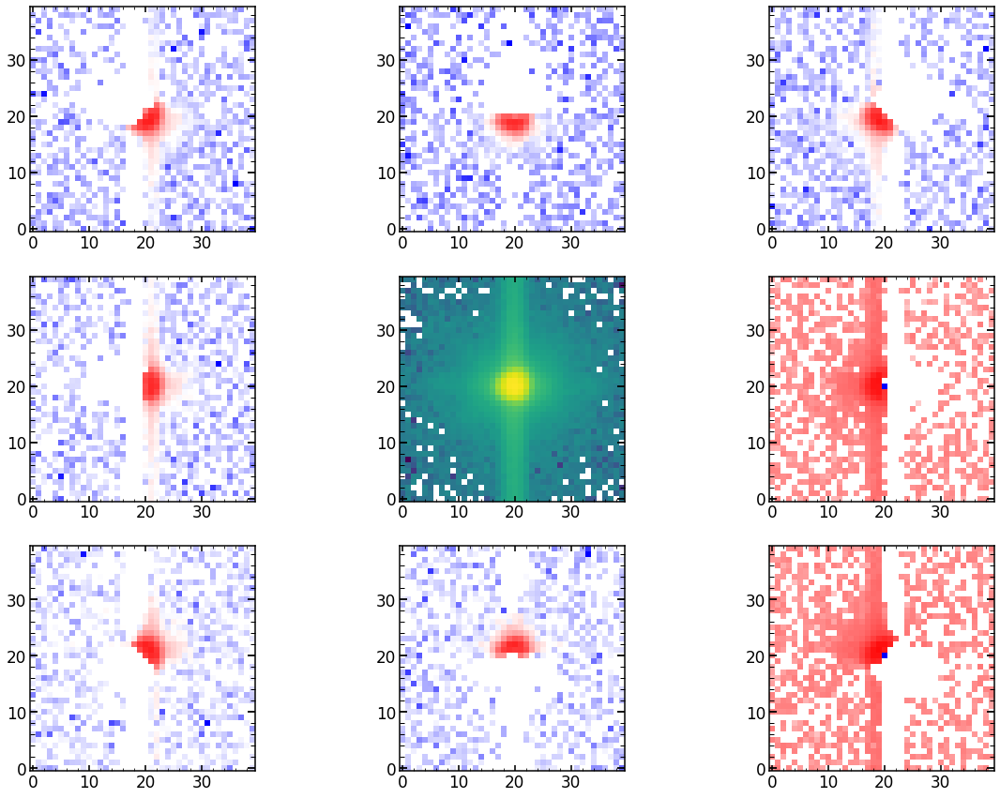

In [1019]:
plt.figure(figsize=(20,15))

plt.subplot(339)
plt.imshow(sci_image_45_stacked_HgAr_image_00-sci_image_45_stacked_HgAr_image_mp,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00),cmap='bwr')

plt.subplot(336)
plt.imshow(sci_image_45_stacked_HgAr_image_00-sci_image_45_stacked_HgAr_image_0p,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00),cmap='bwr')

plt.subplot(333)
plt.imshow(sci_image_45_stacked_HgAr_image_00-sci_image_45_stacked_HgAr_image_pp,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00),cmap='bwr')

plt.subplot(338)
plt.imshow(sci_image_45_stacked_HgAr_image_00-sci_image_45_stacked_HgAr_image_m0,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00),cmap='bwr')

plt.subplot(335)
plt.imshow(sci_image_45_stacked_HgAr_image_00,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00))

plt.subplot(332)
plt.imshow(sci_image_45_stacked_HgAr_image_00-sci_image_45_stacked_HgAr_image_p0,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00),cmap='bwr')

plt.subplot(337)
plt.imshow(sci_image_45_stacked_HgAr_image_00-sci_image_45_stacked_HgAr_image_mm,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00),cmap='bwr')

plt.subplot(334)
plt.imshow(sci_image_45_stacked_HgAr_image_00-sci_image_45_stacked_HgAr_image_0m,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00),cmap='bwr')

plt.subplot(331)
plt.imshow(sci_image_45_stacked_HgAr_image_00-sci_image_45_stacked_HgAr_image_pm,norm=LogNorm(),origin='lower',vmax=np.max(sci_image_45_stacked_HgAr_image_00),cmap='bwr')

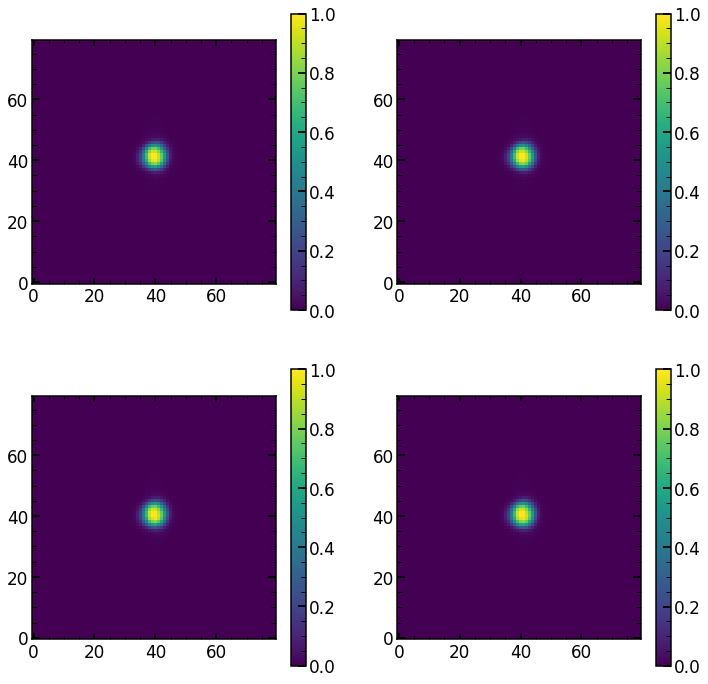

In [1020]:
# mm dithering
sci_image_45_dithering_mm=np.zeros((80,80))
# top left
sci_image_45_dithering_mm[1::2,::2] = sci_image_45_stacked_HgAr_image_m0
# top right
sci_image_45_dithering_mm[1::2,1::2] = sci_image_45_stacked_HgAr_image_mm
#lower left
sci_image_45_dithering_mm[::2,::2] = sci_image_45_stacked_HgAr_image_00
# lower right
sci_image_45_dithering_mm[::2,1::2] = sci_image_45_stacked_HgAr_image_0m

# pp dithering
sci_image_45_dithering_pp=np.zeros((80,80))
# top left
sci_image_45_dithering_pp[1::2,::2] = sci_image_45_stacked_HgAr_image_0p
# top right
sci_image_45_dithering_pp[1::2,1::2] = sci_image_45_stacked_HgAr_image_00
#lower left
sci_image_45_dithering_pp[::2,::2] = sci_image_45_stacked_HgAr_image_pp
# lower right
sci_image_45_dithering_pp[::2,1::2] = sci_image_45_stacked_HgAr_image_p0

# pm dithering
sci_image_45_dithering_pm=np.zeros((80,80))
# top left
sci_image_45_dithering_pm[1::2,::2] = sci_image_45_stacked_HgAr_image_00
# top right
sci_image_45_dithering_pm[1::2,1::2] = sci_image_45_stacked_HgAr_image_0m
#lower left
sci_image_45_dithering_pm[::2,::2] = sci_image_45_stacked_HgAr_image_p0
# lower right
sci_image_45_dithering_pm[::2,1::2] = sci_image_45_stacked_HgAr_image_pm

# mp dithering
sci_image_45_dithering_mp=np.zeros((80,80))
# top left
sci_image_45_dithering_mp[1::2,::2] = sci_image_45_stacked_HgAr_image_mp
# top right
sci_image_45_dithering_mp[1::2,1::2] = sci_image_45_stacked_HgAr_image_m0
#lower left
sci_image_45_dithering_mp[::2,::2] = sci_image_45_stacked_HgAr_image_0p
# lower right
sci_image_45_dithering_mp[::2,1::2] = sci_image_45_stacked_HgAr_image_00

plt.figure(figsize=(12,12))

plt.subplot(221)
plt.imshow(sci_image_45_dithering_pm)
plt.colorbar()

plt.subplot(222)
plt.imshow(sci_image_45_dithering_pp)
plt.colorbar()

plt.subplot(223)
plt.imshow(sci_image_45_dithering_mm)
plt.colorbar()

plt.subplot(224)
plt.imshow(sci_image_45_dithering_mp)
plt.colorbar()

In [1021]:
print(np.max(sci_image_45_stacked_HgAr_image_mm))
print(np.max(sci_image_45_stacked_HgAr_image_mp))
print(np.max(sci_image_45_stacked_HgAr_image_00))
print(np.max(sci_image_45_stacked_HgAr_image_0p))
print(np.max(sci_image_45_stacked_HgAr_image_p0))
print(np.max(sci_image_45_stacked_HgAr_image_pp))
print(np.max(sci_image_45_stacked_HgAr_image_0m))
print(np.max(sci_image_45_stacked_HgAr_image_m0))
print(np.max(sci_image_45_stacked_HgAr_image_pm))


1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


In [1022]:
print('00 '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_00)))
print('0p '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_0p)))
print('p0 '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_p0)))
print('pp '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_pp)))

print('0m '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_0m)))
print('m0 '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_m0)))
print('mm '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_mm)))

print('mp '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_mp)))
print('pm '+str(find_centroid_of_flux(sci_image_45_stacked_HgAr_image_pm)))

00 (19.837911968922874, 20.181811576479888)
0p (20.365073594870687, 20.173967940346998)
p0 (19.832729063467674, 20.683491631318496)
pp (20.358983815626083, 20.67798516943313)
0m (19.352684729919858, 20.19891921434612)
m0 (19.832870562245823, 19.676998424326012)
mm (19.358661268094025, 19.70501741886457)
mp (20.363891349553512, 19.665885660208865)
pm (19.344253311610075, 20.691767364142386)


In [1069]:
#######################
sci_image_46_dithering_mm=np.zeros((80,80))
# top left
sci_image_46_dithering_mm[1::2,::2] = sci_image_46_stacked_HgAr_image_m0
# top right
sci_image_46_dithering_mm[1::2,1::2] = sci_image_46_stacked_HgAr_image_mm
#lower leftb
sci_image_46_dithering_mm[::2,::2] = sci_image_46_stacked_HgAr_image_00
# lower right
sci_image_46_dithering_mm[::2,1::2] = sci_image_46_stacked_HgAr_image_0m

#######################
sci_image_44b_dithering_mm=np.zeros((80,80))
# top left
sci_image_44b_dithering_mm[1::2,::2] = sci_image_44b_stacked_HgAr_image_m0
# top right
sci_image_44b_dithering_mm[1::2,1::2] = sci_image_44b_stacked_HgAr_image_mm
#lower leftb
sci_image_44b_dithering_mm[::2,::2] = sci_image_44b_stacked_HgAr_image_00
# lower right
sci_image_44b_dithering_mm[::2,1::2] = sci_image_44b_stacked_HgAr_image_0m

#######################
sci_image_44_dithering_mm=np.zeros((80,80))
# top left
sci_image_44_dithering_mm[1::2,::2] = sci_image_44_stacked_HgAr_image_m0
# top right
sci_image_44_dithering_mm[1::2,1::2] = sci_image_44_stacked_HgAr_image_mm
#lower left
sci_image_44_dithering_mm[::2,::2] = sci_image_44_stacked_HgAr_image_00
# lower right
sci_image_44_dithering_mm[::2,1::2] = sci_image_44_stacked_HgAr_image_0m

#######################
sci_image_43b_dithering_mm=np.zeros((80,80))
# top left
sci_image_43b_dithering_mm[1::2,::2] = sci_image_43b_stacked_HgAr_image_m0
# top right
sci_image_43b_dithering_mm[1::2,1::2] = sci_image_43b_stacked_HgAr_image_mm
#lower left
sci_image_43b_dithering_mm[::2,::2] = sci_image_43b_stacked_HgAr_image_00
# lower right
sci_image_43b_dithering_mm[::2,1::2] = sci_image_43b_stacked_HgAr_image_0m

#######################
sci_image_43a_dithering_mm=np.zeros((80,80))
# top left
sci_image_43a_dithering_mm[1::2,::2] = sci_image_43a_stacked_HgAr_image_m0
# top right
sci_image_43a_dithering_mm[1::2,1::2] = sci_image_43a_stacked_HgAr_image_mm
#lower left
sci_image_43a_dithering_mm[::2,::2] = sci_image_43a_stacked_HgAr_image_00
# lower right
sci_image_43a_dithering_mm[::2,1::2] = sci_image_43a_stacked_HgAr_image_0m

#######################
sci_image_43_dithering_mm=np.zeros((80,80))
# top left
sci_image_43_dithering_mm[1::2,::2] = sci_image_43_stacked_HgAr_image_m0
# top right
sci_image_43_dithering_mm[1::2,1::2] = sci_image_43_stacked_HgAr_image_mm
#lower left
sci_image_43_dithering_mm[::2,::2] = sci_image_43_stacked_HgAr_image_00
# lower right
sci_image_43_dithering_mm[::2,1::2] = sci_image_43_stacked_HgAr_image_0m
########################
sci_image_42_dithering_mm=np.zeros((80,80))
# top left
sci_image_42_dithering_mm[1::2,::2] = sci_image_42_stacked_HgAr_image_m0
# top right
sci_image_42_dithering_mm[1::2,1::2] = sci_image_42_stacked_HgAr_image_mm
#lower left
sci_image_42_dithering_mm[::2,::2] = sci_image_42_stacked_HgAr_image_00
# lower right
sci_image_42_dithering_mm[::2,1::2] = sci_image_42_stacked_HgAr_image_0m

########################
sci_image_40_dithering_mm=np.zeros((80,80))
# top left
sci_image_40_dithering_mm[1::2,::2] = sci_image_40_stacked_HgAr_image_m0
# top right
sci_image_40_dithering_mm[1::2,1::2] = sci_image_40_stacked_HgAr_image_mm
#lower left
sci_image_40_dithering_mm[::2,::2] = sci_image_40_stacked_HgAr_image_00
# lower right
sci_image_40_dithering_mm[::2,1::2] = sci_image_40_stacked_HgAr_image_0m

########################
sci_image_40b_dithering_mm=np.zeros((80,80))
# top left
sci_image_40b_dithering_mm[1::2,::2] = sci_image_40b_stacked_HgAr_image_m0
# top right
sci_image_40b_dithering_mm[1::2,1::2] = sci_image_40b_stacked_HgAr_image_mm
#lower left
sci_image_40b_dithering_mm[::2,::2] = sci_image_40b_stacked_HgAr_image_00
# lower right
sci_image_40b_dithering_mm[::2,1::2] = sci_image_40b_stacked_HgAr_image_0m

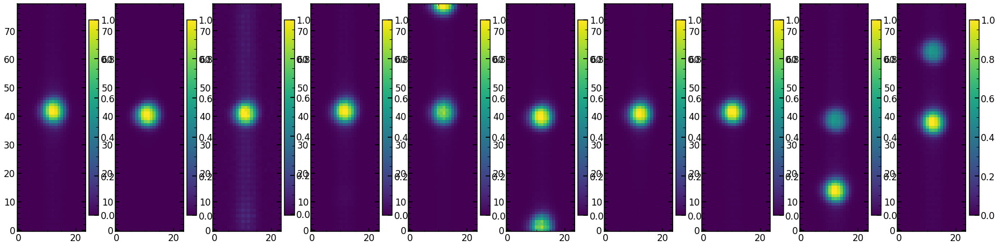

In [1077]:
sci_image_46_dithering_24=sci_image_46_dithering_mm[:,29:53]
sci_image_45_dithering_24=sci_image_45_dithering_mm[:,29:53]
sci_image_44b_dithering_24=sci_image_44b_dithering_mm[:,29:53]

sci_image_44_dithering_24=sci_image_44_dithering_mm[:,29:53]
sci_image_43b_dithering_24=sci_image_43b_dithering_mm[:,29:53]
sci_image_43a_dithering_24=sci_image_43a_dithering_mm[:,29:53]

sci_image_43_dithering_24=sci_image_43_dithering_mm[:,29:53]
sci_image_42_dithering_24=sci_image_42_dithering_mm[:,31:55]

sci_image_40_dithering_24=sci_image_40_dithering_mm[:,29:53]
sci_image_40b_dithering_24=sci_image_40b_dithering_mm[:,29:53]

sci_image_Ne_42_dithering_24=sci_image_Ne_42_dithering[:,31:55]
sci_image_Ne_43_dithering_24=sci_image_Ne_43_dithering[:,29:53]
sci_image_Ne_44_dithering_24=sci_image_Ne_44_dithering[:,29:53]

sci_image_40_dithering_24_1D=np.sum(sci_image_40_dithering_24*np.max(np.sum(sci_image_40_dithering_24,axis=1))/np.max(np.sum(sci_image_40_dithering_24,axis=1)),axis=1)
sci_image_40_dithering_24_1D=sci_image_40_dithering_24_1D/np.max(sci_image_40_dithering_24_1D[30:50])

sci_image_40b_dithering_24_1D=np.sum(sci_image_40b_dithering_24*np.max(np.sum(sci_image_40b_dithering_24,axis=1))/np.max(np.sum(sci_image_40b_dithering_24,axis=1)),axis=1)
sci_image_40b_dithering_24_1D=sci_image_40b_dithering_24_1D/np.max(sci_image_40b_dithering_24_1D[30:50])

sci_image_42_dithering_24_1D=np.sum(sci_image_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_42_dithering_24,axis=1)),axis=1)
sci_image_42_dithering_24_1D=sci_image_42_dithering_24_1D/np.max(sci_image_42_dithering_24_1D)

sci_image_43_dithering_24_1D=np.sum(sci_image_43_dithering_24*np.max(np.sum(sci_image_43_dithering_24,axis=1))/np.max(np.sum(sci_image_43_dithering_24,axis=1)),axis=1)
sci_image_43_dithering_24_1D=sci_image_43_dithering_24_1D/np.max(sci_image_43_dithering_24_1D)

sci_image_43a_dithering_24_1D=np.sum(sci_image_43a_dithering_24*np.max(np.sum(sci_image_43a_dithering_24,axis=1))/np.max(np.sum(sci_image_43a_dithering_24,axis=1)),axis=1)
sci_image_43a_dithering_24_1D=sci_image_43a_dithering_24_1D/np.max(sci_image_43a_dithering_24_1D[20:60])

sci_image_43b_dithering_24_1D=np.sum(sci_image_43b_dithering_24*np.max(np.sum(sci_image_43b_dithering_24,axis=1))/np.max(np.sum(sci_image_43b_dithering_24,axis=1)),axis=1)
sci_image_43b_dithering_24_1D=sci_image_43b_dithering_24_1D/np.max(sci_image_43b_dithering_24_1D)

sci_image_44_dithering_24_1D=np.sum(sci_image_44_dithering_24*np.max(np.sum(sci_image_44_dithering_24,axis=1))/np.max(np.sum(sci_image_44_dithering_24,axis=1)),axis=1)
sci_image_44_dithering_24_1D=sci_image_44_dithering_24_1D/np.max(sci_image_44_dithering_24_1D)

sci_image_44b_dithering_24_1D=np.sum(sci_image_44b_dithering_24*np.max(np.sum(sci_image_44b_dithering_24,axis=1))/np.max(np.sum(sci_image_44b_dithering_24,axis=1)),axis=1)
sci_image_44b_dithering_24_1D=sci_image_44b_dithering_24_1D/np.max(sci_image_44b_dithering_24_1D)

sci_image_45_dithering_24_1D=np.sum(sci_image_45_dithering_24*np.max(np.sum(sci_image_45_dithering_24,axis=1))/np.max(np.sum(sci_image_45_dithering_24,axis=1)),axis=1)
sci_image_45_dithering_24_1D=sci_image_45_dithering_24_1D/np.max(sci_image_45_dithering_24_1D)

sci_image_46_dithering_24_1D=np.sum(sci_image_46_dithering_24*np.max(np.sum(sci_image_46_dithering_24,axis=1))/np.max(np.sum(sci_image_46_dithering_24,axis=1)),axis=1)
sci_image_46_dithering_24_1D=sci_image_46_dithering_24_1D/np.max(sci_image_46_dithering_24_1D)

plt.figure(figsize=(32,8))

plt.subplot(1,10,1)
plt.imshow(sci_image_46_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,2)
plt.imshow(sci_image_45_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,3)
plt.imshow(sci_image_44b_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,4)
plt.imshow(sci_image_44_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,5)
plt.imshow(sci_image_43a_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,6)
plt.imshow(sci_image_43b_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,7)
plt.imshow(sci_image_43_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,8)
plt.imshow(sci_image_42_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,9)
plt.imshow(sci_image_40b_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)

plt.subplot(1,10,10)
plt.imshow(sci_image_40_dithering_24)
cbar=plt.colorbar(fraction=0.12, pad=0.04)


Text(0.5,1,'vertical (wavelength) extraction, zoom in')

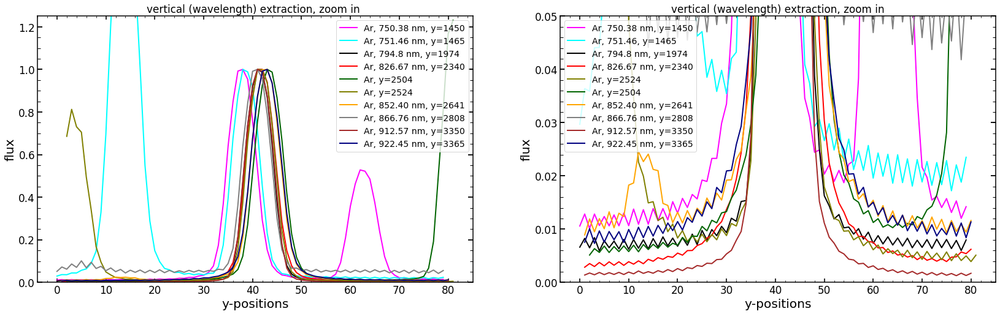

In [1078]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(0,80),sci_image_40_dithering_24_1D,
         label='Ar, 750.38 nm, y=1450',lw=2,color='magenta')
plt.plot(range(0,80),sci_image_40b_dithering_24_1D,
         label='Ar, 751.46 nm, y=1465',lw=2,color='cyan')



plt.plot(range(0,80),sci_image_42_dithering_24_1D,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black')
plt.plot(range(1,81),sci_image_43_dithering_24_1D,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red')
plt.plot(range(2,82),sci_image_43a_dithering_24_1D,
         label='Ar, y=2504',lw=2,color='darkgreen')
plt.plot(range(2,82),sci_image_43b_dithering_24_1D,
         label='Ar, y=2524',lw=2,color='olive')
plt.plot(range(1,81),sci_image_44_dithering_24_1D,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange')
plt.plot(range(0,80),sci_image_44b_dithering_24_1D,
         label='Ar, 866.76 nm, y=2808',lw=2,color='grey')
plt.plot(range(1,81),sci_image_45_dithering_24_1D,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown')
plt.plot(range(1,81),sci_image_46_dithering_24_1D,
         label='Ar, 922.45 nm, y=3365',lw=2,color='navy')
#plt.plot(range(0,80),np.sum(sci_image_Ne_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_42_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2126',lw=2,color='blue')
#plt.plot(range(0,80),np.sum(sci_image_Ne_43_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_43_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2470',lw=2,color='cyan')
#plt.plot(range(0,80),np.sum(sci_image_Ne_44_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_44_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2605',lw=2,color='magenta')

plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*1))
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)

#plt.plot(range(0,80),np.sum(sci_image_42_dithering*np.max(np.sum(sci_image_42_dithering,axis=1))/np.max(np.sum(sci_image_42_dithering,axis=1)),axis=1),
#         label='44',lw=2,color='black')
#plt.plot(range(0,80),np.sum(sci_image_43_dithering*np.max(np.sum(sci_image_43_dithering,axis=1))/np.max(np.sum(sci_image_43_dithering,axis=1)),axis=1),
#         label='43',lw=2,color='red')
#plt.plot(range(0,80),np.sum(sci_image_44_dithering*np.max(np.sum(sci_image_44_dithering,axis=1))/np.max(np.sum(sci_image_44_dithering,axis=1)),axis=1),
#         label='42',lw=2,color='orange')
#plt.plot(range(0,80),np.sum(sci_image_45_dithering*np.max(np.sum(sci_image_45_dithering,axis=1))/np.max(np.sum(sci_image_45_dithering,axis=1)),axis=1),
#         label='41',lw=2,color='brown')
plt.plot(range(0,80),sci_image_40_dithering_24_1D,
         label='Ar, 750.38 nm, y=1450',lw=2,color='magenta')
plt.plot(range(0,80),sci_image_40b_dithering_24_1D,
         label='Ar, 751.46, y=1465',lw=2,color='cyan')

plt.plot(range(0,80),sci_image_42_dithering_24_1D-0.000,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black',ls='-')
plt.plot(range(1,81),sci_image_43_dithering_24_1D-0.000,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red',ls='-')
plt.plot(range(2,82),sci_image_43b_dithering_24_1D,
         label='Ar, y=2524',lw=2,color='olive')
plt.plot(range(2,82),sci_image_43a_dithering_24_1D,
         label='Ar, y=2504',lw=2,color='darkgreen')
plt.plot(range(1,81),sci_image_44_dithering_24_1D,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange')
plt.plot(range(0,80),sci_image_44b_dithering_24_1D,
         label='Ar, 866.76 nm, y=2808',lw=2,color='grey')
plt.plot(range(1,81),sci_image_45_dithering_24_1D-0.0000,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='-')
plt.plot(range(1,81),sci_image_46_dithering_24_1D,
         label='Ar, 922.45 nm, y=3365',lw=2,color='navy')
#plt.plot(range(0,80),np.sum(sci_image_Ne_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_42_dithering_24,axis=1)),axis=1)-0.0005,
#         label='Neon, y= 2126',lw=2,color='blue',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_43_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_43_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2470',lw=2,color='cyan',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_44_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_44_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2605',lw=2,color='magenta',ls='-')



plt.axhline(10000,color='black',ls=':')
plt.ylim(0,0.05)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

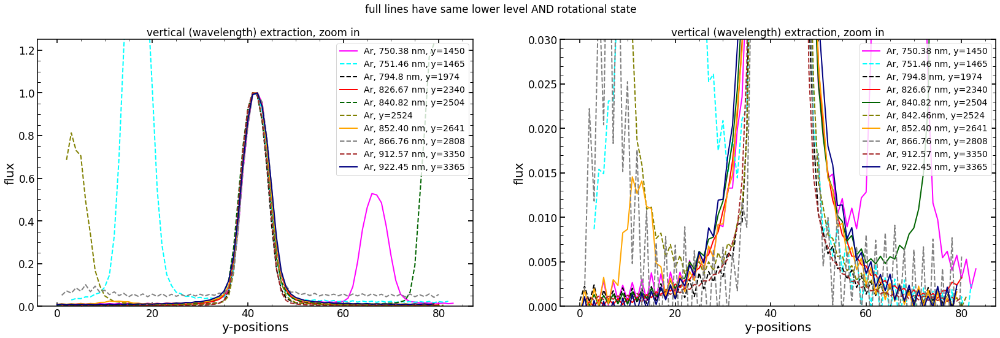

In [1091]:
plt.figure(figsize=(28,8))

plt.suptitle('full lines have same lower level AND rotational state')

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(4,84),sci_image_40_dithering_24_1D,
         label='Ar, 750.38 nm, y=1450',lw=2,color='magenta')
plt.plot(range(3,83),sci_image_40b_dithering_24_1D,
         label='Ar, 751.46 nm, y=1465',lw=2,color='cyan',ls='--')

plt.plot(range(0,80),sci_image_42_dithering_24_1D,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black',ls='--')
plt.plot(range(1,81),sci_image_43_dithering_24_1D,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red')
plt.plot(range(0,80),sci_image_43a_dithering_24_1D,
         label='Ar, 840.82 nm, y=2504',lw=2,color='darkgreen',ls='--')
plt.plot(range(2,82),sci_image_43b_dithering_24_1D,
         label='Ar, y=2524',lw=2,color='olive',ls='--')
plt.plot(range(0,80),sci_image_44_dithering_24_1D,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange')
plt.plot(range(1,81),sci_image_44b_dithering_24_1D,
         label='Ar, 866.76 nm, y=2808',lw=2,color='grey',ls='--')
plt.plot(range(1,81),sci_image_45_dithering_24_1D,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='--')
plt.plot(range(0,80),sci_image_46_dithering_24_1D,
         label='Ar, 922.45 nm, y=3365',lw=2,color='navy')
#plt.plot(range(0,80),np.sum(sci_image_Ne_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_42_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2126',lw=2,color='blue')
#plt.plot(range(0,80),np.sum(sci_image_Ne_43_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_43_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2470',lw=2,color='cyan')
#plt.plot(range(0,80),np.sum(sci_image_Ne_44_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_44_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2605',lw=2,color='magenta')

plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*1))
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)

#plt.plot(range(0,80),np.sum(sci_image_42_dithering*np.max(np.sum(sci_image_42_dithering,axis=1))/np.max(np.sum(sci_image_42_dithering,axis=1)),axis=1),
#         label='44',lw=2,color='black')
#plt.plot(range(0,80),np.sum(sci_image_43_dithering*np.max(np.sum(sci_image_43_dithering,axis=1))/np.max(np.sum(sci_image_43_dithering,axis=1)),axis=1),
#         label='43',lw=2,color='red')
#plt.plot(range(0,80),np.sum(sci_image_44_dithering*np.max(np.sum(sci_image_44_dithering,axis=1))/np.max(np.sum(sci_image_44_dithering,axis=1)),axis=1),
#         label='42',lw=2,color='orange')
#plt.plot(range(0,80),np.sum(sci_image_45_dithering*np.max(np.sum(sci_image_45_dithering,axis=1))/np.max(np.sum(sci_image_45_dithering,axis=1)),axis=1),
#         label='41',lw=2,color='brown')
plt.plot(range(4,84),sci_image_40_dithering_24_1D-0.01,ls='-',
         label='Ar, 750.38 nm, y=1450',lw=2,color='magenta')
plt.plot(range(3,83),sci_image_40b_dithering_24_1D-0.021,ls='--',
         label='Ar, 751.46 nm, y=1465',lw=2,color='cyan')
plt.plot(range(0,80),sci_image_42_dithering_24_1D-0.006,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black',ls='--')
plt.plot(range(1,81),sci_image_43_dithering_24_1D-0.003,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red',ls='-')
plt.plot(range(0,80),sci_image_43a_dithering_24_1D-0.0055,
         label='Ar, 840.82 nm, y=2504',lw=2,color='darkgreen',ls='-')
plt.plot(range(2,82),sci_image_43b_dithering_24_1D-.004,
         label='Ar, 842.46nm, y=2524',lw=2,color='olive',ls='--')
plt.plot(range(0,80),sci_image_44_dithering_24_1D-0.01,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange',ls='-')
plt.plot(range(1,81),sci_image_44b_dithering_24_1D-0.05,
         label='Ar, 866.76 nm, y=2808',lw=2,color='grey',ls='--')
plt.plot(range(1,81),sci_image_45_dithering_24_1D-0.0007,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='--')
plt.plot(range(0,80),sci_image_46_dithering_24_1D-0.009,
         label='Ar, 922.45 nm, y=3365',lw=2,color='navy',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_42_dithering_24,axis=1)),axis=1)-0.0005,
#         label='Neon, y= 2126',lw=2,color='blue',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_43_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_43_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2470',lw=2,color='cyan',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_44_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_44_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2605',lw=2,color='magenta',ls='-')



plt.axhline(10000,color='black',ls=':')
plt.ylim(0,0.03)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

In [994]:
# check times
# check perpendicular

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
60,401,1992,771,690.9346,0,HgAr,1992,84,nan
61,401,1992,836,696.7261,1,HgAr,1992,85,93.0
62,401,1992,952,706.8989,0,HgAr,1992,86,nan
63,401,1992,1187,727.47876,1,HgAr,1992,87,nan
64,401,1992,1314,738.6248,0,HgAr,1992,88,83.0
65,401,1992,1603,763.74286,0.5,HgAr,1992,89,73.0
66,401,1992,1965,795.0522,1,HgAr,1992,90,53.0
67,401,1992,2332,826.6699,0.5,HgAr,1992,91,43.0
68,401,1992,2631,852.4029,0.5,HgAr,1992,92,33.0
69,401,1992,3340,912.5693,1,HgAr,1992,93,23.0


In [995]:
(852.40-826.45)/301

0.08621262458471739

In [1061]:
(1450-2340)*0.0854+826.45

750.4440000000001

In [ ]:
# Ar I 	826.4522   	0.0010  	826.4521   	0.0010   	 10000 	1.53e+07 	  B+	95 399.8276 	- 	107 496.4166 	 3s23p5(2P°1/2)4s 	 2[1/2]° 	 1
# Ar I 	840.8210   	0.0010  	840.8209   	0.0010   	 15000 	2.23e+07 	  B+	95 399.8276 	- 	107 289.7001 	 3s23p5(2P°1/2)4s 	 2[1/2]° 	 1 	 3s23p5(2P°1/2)4p 	 2[3/2] 	 2 
# Ar I 	852.1442   	0.0010  	852.1441   	0.0010   	 15000 	1.39e+07 	  B	95 399.8276 	- 	107 131.7086 	 3s23p5(2P°1/2)4s 	 2[1/2]° 	 1 	 3s23p5(2P°1/2)4p 	 2[3/2] 	 1


# Ar I 	794.8176   	0.0010  	794.8176   	0.0010   	 20000 	1.86e+07 	  B	94 553.6652 	- 	107 131.7086 	 3s23p5(2P°1/2)4s 	 2[1/2]° 	 0 	 3s23p5(2P°1/2)4p 	 2[3/2] 	 1 
# Ar I 	842.4648   	0.0010  	842.4647   	0.0010   	 20000 	2.15e+07 	  B+	93 750.5978 	- 	105 617.2700 	 3s23p5(2P°3/2)4s 	 2[3/2]° 	 1 	 3s23p5(2P°3/2)4p 	 2[5/2] 	 2
# Ar I 	866.7944   	0.0010  	866.7943   	0.0010   	 4500 	2.43e+06 	  B	94 553.6652 	- 	106 087.2598 	 3s23p5(2P°1/2)4s 	 2[1/2]° 	 0 	 3s23p5(2P°3/2)4p 	 2[3/2] 	 1
# Ar I 	912.2967   	0.0010  	912.2967   	0.0010   	 35000 	1.89e+07 	  B	93 143.7600 	- 	104 102.0990 	 3s23p5(2P°3/2)4s 	 2[3/2]° 	 2 	 3s23p5(2P°3/2)4p 	 2[1/2] 	 1 

## recuting Neon

### single run 

In [80]:
from astropy.io import fits
stacked_Ne_image=np.zeros((4176,4096))
stacked_Ne_var_image=np.zeros((4176,4096))
for i in range(6):
    single_Ne_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19526+i)+'/calExp-LA0'+str(19526+i)+'r1.fits')[1].data
    single_Ne_var_image=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19526+i)+'/calExp-LA0'+str(19526+i)+'r1.fits')[3].data

    stacked_Ne_image+=single_Ne_image
    stacked_Ne_var_image+=single_Ne_var_image

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

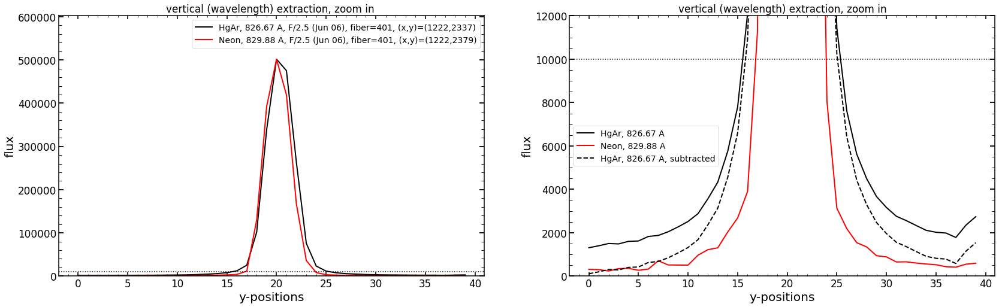

In [ ]:
# nearby spots and dithering

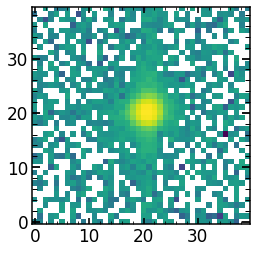

In [143]:
sci_image_40_Ne_stack_2=stacked_Ne_image[2126-20:2126+20,1222-20:1222+20]
plt.imshow(sci_image_40_Ne_stack_2,norm=LogNorm(),origin='lower')

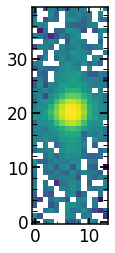

In [144]:
sci_image_40_Ne_stack_1_2=sci_image_40_Ne_stack_2[:,14:28]
plt.imshow(sci_image_40_Ne_stack_1_2,norm=LogNorm(),origin='lower')

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

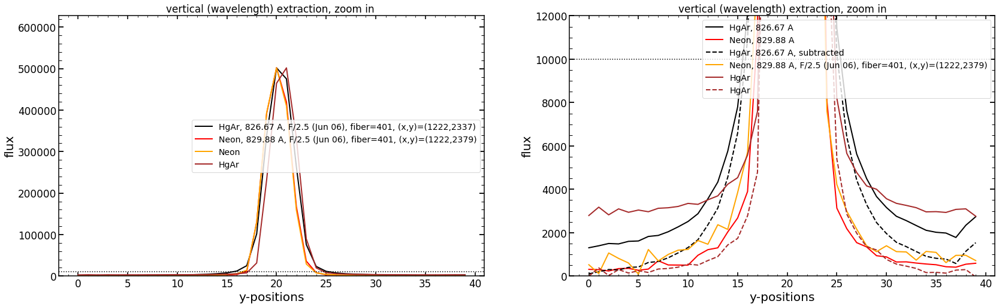

In [169]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(sci_image_40_HgAr_12,axis=1),label='HgAr, 826.67 A, F/2.5 (Jun 06), fiber=401, (x,y)=(1222,2337)',lw=2,color='black')
plt.plot(range(0,40),np.sum(sci_image_40_Ne_stack_1_12*np.max(np.sum(sci_image_40_HgAr_12,axis=1))/np.max(np.sum(sci_image_40_Ne_stack_1_12,axis=1)),axis=1),
         label='Neon, 829.88 A, F/2.5 (Jun 06), fiber=401, (x,y)=(1222,2379)',lw=2,color='red')
plt.plot(range(0,40),np.sum(sci_image_40_Ne_stack_1_2*np.max(np.sum(sci_image_40_HgAr_12,axis=1))/np.max(np.sum(sci_image_40_Ne_stack_1_2,axis=1)),axis=1),
         label='Neon',lw=2,color='orange')
plt.plot(range(0,40),np.sum(sci_image_40_HgAr_2_12*np.max(np.sum(sci_image_40_HgAr_12,axis=1))/np.max(np.sum(sci_image_40_HgAr_2_12,axis=1)),axis=1),
         label='HgAr',lw=2,color='brown')


plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*np.sum(sci_image_40_HgAr_12,axis=1)))
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(np.sum(sci_image_40_HgAr_12,axis=1),label='HgAr, 826.67 A',lw=2,color='black')
plt.plot(range(0,40),np.sum(sci_image_40_Ne_stack_1_12*np.max(np.sum(sci_image_40_HgAr_12,axis=1))/np.max(np.sum(sci_image_40_Ne_stack_1_12,axis=1)),axis=1),label='Neon, 829.88 A',lw=2,color='red')
plt.plot(np.sum(sci_image_40_HgAr_12,axis=1)-1200,label='HgAr, 826.67 A, subtracted',lw=2,color='black',ls='--')
plt.plot(range(0,40),np.sum(sci_image_40_Ne_stack_1_2*np.max(np.sum(sci_image_40_HgAr_12,axis=1))/np.max(np.sum(sci_image_40_Ne_stack_1_2,axis=1)),axis=1),
         label='Neon, 829.88 A, F/2.5 (Jun 06), fiber=401, (x,y)=(1222,2379)',lw=2,color='orange')
plt.plot(range(0,40),np.sum(sci_image_40_HgAr_2_12*np.max(np.sum(sci_image_40_HgAr_12,axis=1))/np.max(np.sum(sci_image_40_HgAr_2_12,axis=1)),axis=1),
         label='HgAr',lw=2,color='brown')
plt.plot(range(0,40),np.sum(sci_image_40_HgAr_2_12*np.max(np.sum(sci_image_40_HgAr_12,axis=1))/np.max(np.sum(sci_image_40_HgAr_2_12,axis=1)),axis=1)-2800,
         label='HgAr',lw=2,color='brown',ls='--')

plt.axhline(10000,color='black',ls=':')
plt.ylim(0,12000)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

### dithered Neon

In [562]:
from astropy.io import fits

# 19220 0.0 -0.0
stacked_Ne_image_00=np.zeros((4176,4096))
stacked_Ne_var_image_00=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19220+180+i)+'/calExp-LA0'+str(19220+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19400+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])    
    
    stacked_Ne_image_00+=single_Ne_image
    
# 19214 -1e-05 0.017
stacked_Ne_image_0p=np.zeros((4176,4096))
stacked_Ne_var_image_0p=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19214+180+i)+'/calExp-LA0'+str(19214+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19214+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])    
    
    stacked_Ne_image_0p+=single_Ne_image

    
# 19202 0.01701 0.0
stacked_Ne_image_p0=np.zeros((4176,4096))
stacked_Ne_var_image_p0=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19202+180+i)+'/calExp-LA0'+str(19202+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19202+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    
    stacked_Ne_image_p0+=single_Ne_image

    
# 19196 0.017 0.017
stacked_Ne_image_pp=np.zeros((4176,4096))
stacked_Ne_var_image_pp=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19196+180+i)+'/calExp-LA0'+str(19196+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19196+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    
    stacked_Ne_image_pp+=single_Ne_image

    
# 19208 -1e-05 -0.01701 
stacked_Ne_image_0m=np.zeros((4176,4096))
stacked_Ne_var_image_0m=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19208+180+i)+'/calExp-LA0'+str(19208+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19208+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    
    stacked_Ne_image_0m+=single_Ne_image

  
# 19190 0.01702 -0.017
stacked_Ne_image_pm=np.zeros((4176,4096))
stacked_Ne_var_image_pm=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19190+180+i)+'/calExp-LA0'+str(19190+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19190+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    
    stacked_Ne_image_pm+=single_Ne_image

  
# 19184 -0.01701 1e-05
stacked_Ne_image_m0=np.zeros((4176,4096))
stacked_Ne_var_image_m0=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19184+180+i)+'/calExp-LA0'+str(19184+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19184+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    
    stacked_Ne_image_m0+=single_Ne_image

    
# 19178 -0.01701 0.017    
stacked_Ne_image_mp=np.zeros((4176,4096))
stacked_Ne_var_image_mp=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19178+180+i)+'/calExp-LA0'+str(19178+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19178+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ'])  
    
    stacked_Ne_image_mp+=single_Ne_image


# 19172 -0.01701 -0.017
stacked_Ne_image_mm=np.zeros((4176,4096))
stacked_Ne_var_image_mm=np.zeros((4176,4096))
for i in range(6):
    hdul=fits.open('/Volumes/My Passport for Mac/Old_Files/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-06-08/v00'+str(19172+180+i)+'/calExp-LA0'+str(19172+180+i)+'r1.fits')
    hdr = hdul[0].header
    single_Ne_image=hdul[1].data
    print(19172+i,hdr['W_ENFCAY'],hdr['W_ENFCAZ']) 
    
    stacked_Ne_image_mm+=single_Ne_image


19400 0.0 -0.0
19401 0.0 -0.0
19402 0.0 -0.0
19403 0.0 -0.0
19404 0.0 -0.0
19405 0.0 -0.0
19214 -1e-05 0.017
19215 -0.0 0.01701
19216 -0.0 0.01701
19217 -0.0 0.01701
19218 -0.0 0.01701
19219 -0.0 0.01701
19202 0.01701 0.0
19203 0.01701 0.0
19204 0.01701 0.0
19205 0.01701 0.0
19206 0.01701 0.0
19207 0.01701 0.0
19196 0.017 0.017
19197 0.01701 0.01701
19198 0.01701 0.01701
19199 0.01701 0.01701
19200 0.01701 0.01701
19201 0.01701 0.01701
19208 -1e-05 -0.01701
19209 -1e-05 -0.01701
19210 -1e-05 -0.01701
19211 -1e-05 -0.01701
19212 -1e-05 -0.01701
19213 -1e-05 -0.01701
19190 0.01702 -0.017
19191 0.01701 -0.017
19192 0.01701 -0.017
19193 0.01701 -0.017
19194 0.01701 -0.017
19195 0.01701 -0.017
19184 -0.017 1e-05
19185 -0.017 0.0
19186 -0.017 0.0
19187 -0.017 0.0
19188 -0.017 0.0
19189 -0.017 0.0
19178 -0.01701 0.017
19179 -0.01701 0.01701
19180 -0.01701 0.01701
19181 -0.01701 0.01701
19182 -0.01701 0.01701
19183 -0.01701 0.01701
19172 -0.01701 -0.017
19173 -0.01701 -0.017
19174 -0.01701 -0.

In [787]:
sci_image_42_stacked_Ne_image_00=stacked_Ne_image_00[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_00=sci_image_42_stacked_Ne_image_00/np.max(sci_image_42_stacked_Ne_image_00)

sci_image_42_stacked_Ne_image_0p=stacked_Ne_image_0p[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_0p=sci_image_42_stacked_Ne_image_0p/np.max(sci_image_42_stacked_Ne_image_0p)

sci_image_42_stacked_Ne_image_p0=stacked_Ne_image_p0[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_p0=sci_image_42_stacked_Ne_image_p0/np.max(sci_image_42_stacked_Ne_image_p0)

sci_image_42_stacked_Ne_image_pp=stacked_Ne_image_pp[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_pp=sci_image_42_stacked_Ne_image_pp/np.max(sci_image_42_stacked_Ne_image_pp)

sci_image_42_stacked_Ne_image_0m=stacked_Ne_image_0m[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_0m=sci_image_42_stacked_Ne_image_0m/np.max(sci_image_42_stacked_Ne_image_0m)

sci_image_42_stacked_Ne_image_m0=stacked_Ne_image_m0[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_m0=sci_image_42_stacked_Ne_image_m0/np.max(sci_image_42_stacked_Ne_image_m0)

sci_image_42_stacked_Ne_image_mm=stacked_Ne_image_mm[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_mm=sci_image_42_stacked_Ne_image_mm/np.max(sci_image_42_stacked_Ne_image_mm)

sci_image_42_stacked_Ne_image_mp=stacked_Ne_image_mp[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_mp=sci_image_42_stacked_Ne_image_mp/np.max(sci_image_42_stacked_Ne_image_mp)

sci_image_42_stacked_Ne_image_pm=stacked_Ne_image_pm[2126-20:2126+20,1222-20:1222+20]
sci_image_42_stacked_Ne_image_pm=sci_image_42_stacked_Ne_image_pm/np.max(sci_image_42_stacked_Ne_image_pm)


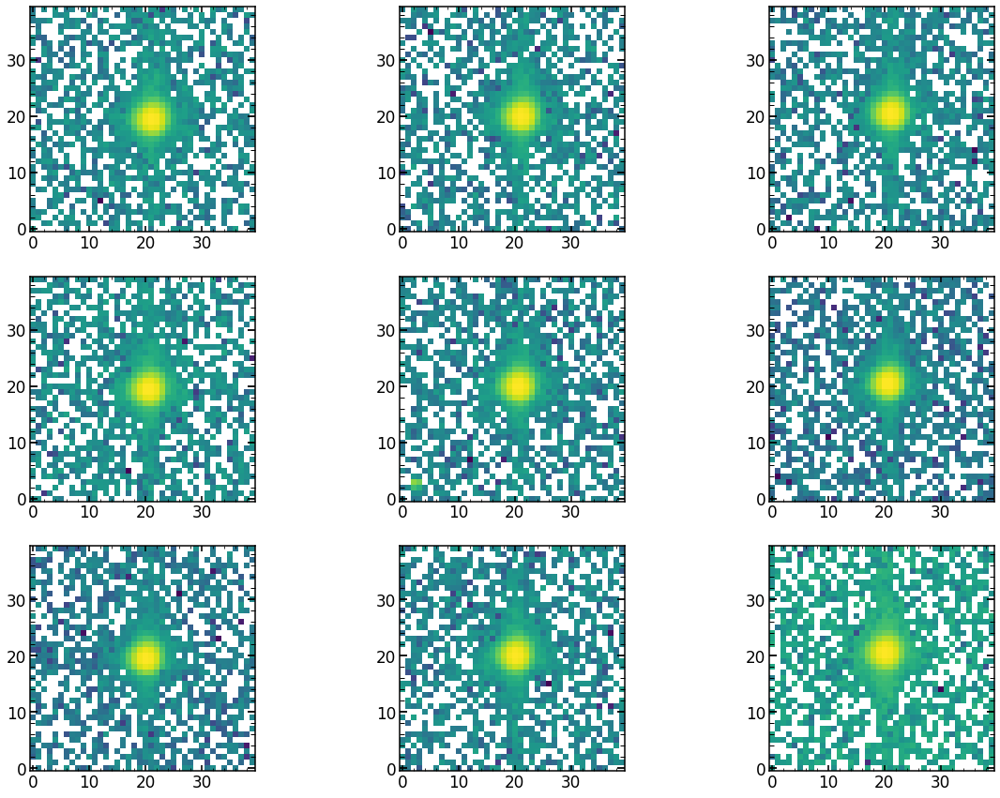

In [788]:
plt.figure(figsize=(20,15))

plt.subplot(331)
plt.imshow(sci_image_42_stacked_Ne_image_mp,norm=LogNorm(),origin='lower')

plt.subplot(332)
plt.imshow(sci_image_42_stacked_Ne_image_0p,norm=LogNorm(),origin='lower')

plt.subplot(333)
plt.imshow(sci_image_42_stacked_Ne_image_pp,norm=LogNorm(),origin='lower')

plt.subplot(334)
plt.imshow(sci_image_42_stacked_Ne_image_m0,norm=LogNorm(),origin='lower')

plt.subplot(335)
plt.imshow(sci_image_42_stacked_Ne_image_00,norm=LogNorm(),origin='lower')

plt.subplot(336)
plt.imshow(sci_image_42_stacked_Ne_image_p0,norm=LogNorm(),origin='lower')

plt.subplot(337)
plt.imshow(sci_image_42_stacked_Ne_image_mm,norm=LogNorm(),origin='lower')

plt.subplot(338)
plt.imshow(sci_image_42_stacked_Ne_image_0m,norm=LogNorm(),origin='lower')

plt.subplot(339)
plt.imshow(sci_image_42_stacked_Ne_image_pm,norm=LogNorm(),origin='lower')


In [789]:
print(np.max(sci_image_42_stacked_Ne_image_00))
print(np.max(sci_image_42_stacked_Ne_image_0p))
print(np.max(sci_image_42_stacked_Ne_image_p0))
print(np.max(sci_image_42_stacked_Ne_image_pp))
print(np.max(sci_image_42_stacked_Ne_image_0m))
print(np.max(sci_image_42_stacked_Ne_image_m0))
print(np.max(sci_image_42_stacked_Ne_image_mm))
print(np.max(sci_image_42_stacked_Ne_image_mp))
print(np.max(sci_image_42_stacked_Ne_image_pm))


1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


In [790]:
print('0p '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_0p)))
print('p0 '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_p0)))
print('pp '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_pp)))
print('pm '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_pm)))
print('mp '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_mp)))

print('00 '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_00)))
print('0m '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_0m)))
print('m0 '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_m0)))
print('mm '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_mm)))

0p (21.16448189941799, 20.036015009189676)
p0 (20.6152503976562, 20.50154020441677)
pp (21.197843996579053, 20.558137826077214)
pm (20.158147475237516, 20.556993718334272)
mp (21.123007436075305, 19.564162619324595)
00 (20.36349998192425, 19.8378206183724)
0m (20.138681806710114, 20.10676015936061)
m0 (20.604361675024, 19.562462274137694)
mm (20.12475475195639, 19.579727591745694)


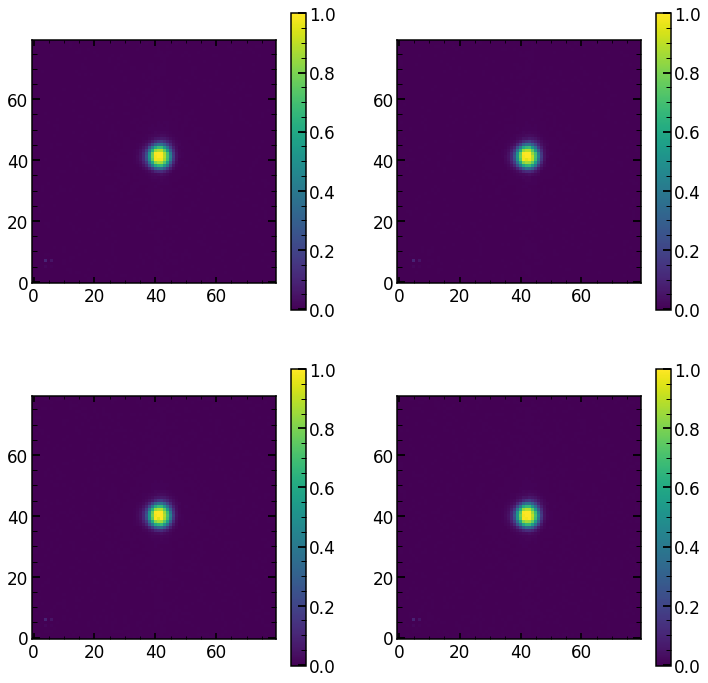

In [791]:
# mm dithering
sci_image_42_Ne_dithering_mm=np.zeros((80,80))
# top left
sci_image_42_Ne_dithering_mm[1::2,::2] = sci_image_42_stacked_Ne_image_m0
# top right
sci_image_42_Ne_dithering_mm[1::2,1::2] = sci_image_42_stacked_Ne_image_mm
#lower left
sci_image_42_Ne_dithering_mm[::2,::2] = sci_image_42_stacked_Ne_image_00
# lower right
sci_image_42_Ne_dithering_mm[::2,1::2] = sci_image_42_stacked_Ne_image_0m

# pp dithering
sci_image_42_Ne_dithering_pp=np.zeros((80,80))
# top left
sci_image_42_Ne_dithering_pp[1::2,::2] = sci_image_42_stacked_Ne_image_0p
# top right
sci_image_42_Ne_dithering_pp[1::2,1::2] = sci_image_42_stacked_Ne_image_00
#lower left
sci_image_42_Ne_dithering_pp[::2,::2] = sci_image_42_stacked_Ne_image_pp
# lower right
sci_image_42_Ne_dithering_pp[::2,1::2] = sci_image_42_stacked_Ne_image_p0

# pm dithering
sci_image_42_Ne_dithering_pm=np.zeros((80,80))
# top left
sci_image_42_Ne_dithering_pm[1::2,::2] = sci_image_42_stacked_Ne_image_00
# top right
sci_image_42_Ne_dithering_pm[1::2,1::2] = sci_image_42_stacked_Ne_image_0m
#lower left
sci_image_42_Ne_dithering_pm[::2,::2] = sci_image_42_stacked_Ne_image_p0
# lower right
sci_image_42_Ne_dithering_pm[::2,1::2] = sci_image_42_stacked_Ne_image_pm

# mp dithering
sci_image_42_Ne_dithering_mp=np.zeros((80,80))
# top left
sci_image_42_Ne_dithering_mp[1::2,::2] = sci_image_42_stacked_Ne_image_mp
# top right
sci_image_42_Ne_dithering_mp[1::2,1::2] = sci_image_42_stacked_Ne_image_m0
#lower left
sci_image_42_Ne_dithering_mp[::2,::2] = sci_image_42_stacked_Ne_image_0p
# lower right
sci_image_42_Ne_dithering_mp[::2,1::2] = sci_image_42_stacked_Ne_image_00

plt.figure(figsize=(12,12))

plt.subplot(221)
plt.imshow(sci_image_42_Ne_dithering_pm)
plt.colorbar()

plt.subplot(222)
plt.imshow(sci_image_42_Ne_dithering_pp)
plt.colorbar()

plt.subplot(223)
plt.imshow(sci_image_42_Ne_dithering_mm)
plt.colorbar()

plt.subplot(224)
plt.imshow(sci_image_42_Ne_dithering_mp)
plt.colorbar()

In [796]:
value_y=2469

sci_image_43_stacked_Ne_image_00=stacked_Ne_image_00[value_y-20:value_y+20,1222-20:1222+20]
sci_image_43_stacked_Ne_image_00=sci_image_43_stacked_Ne_image_00/np.max(sci_image_43_stacked_Ne_image_00)

sci_image_43_stacked_Ne_image_0m=stacked_Ne_image_0m[value_y-20:value_y+20,1222-20:1222+20]
sci_image_43_stacked_Ne_image_0m=sci_image_43_stacked_Ne_image_0m/np.max(sci_image_43_stacked_Ne_image_0m)

sci_image_43_stacked_Ne_image_m0=stacked_Ne_image_m0[value_y-20:value_y+20,1222-20:1222+20]
sci_image_43_stacked_Ne_image_m0=sci_image_43_stacked_Ne_image_m0/np.max(sci_image_43_stacked_Ne_image_m0)

sci_image_43_stacked_Ne_image_mm=stacked_Ne_image_mm[value_y-20:value_y+20,1222-20:1222+20]
sci_image_43_stacked_Ne_image_mm=sci_image_43_stacked_Ne_image_mm/np.max(sci_image_43_stacked_Ne_image_mm)


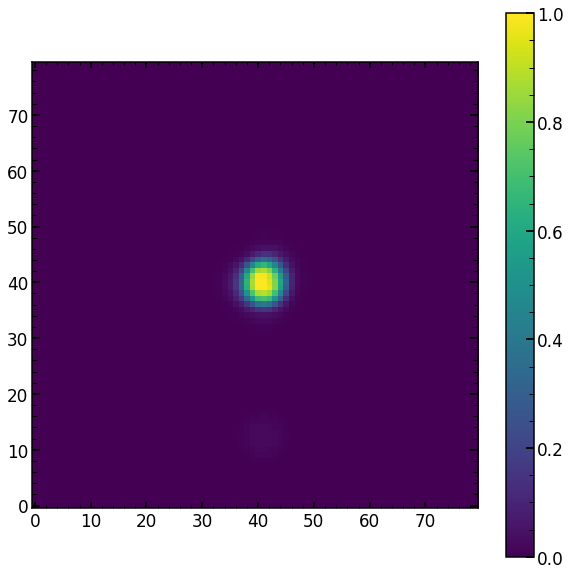

In [797]:
plt.figure(figsize=(10,10))

sci_image_43_Ne_dithering_mm=np.zeros((80,80))
# top left
sci_image_43_Ne_dithering_mm[1::2,::2] = sci_image_43_stacked_Ne_image_m0
# top right
sci_image_43_Ne_dithering_mm[1::2,1::2] = sci_image_43_stacked_Ne_image_mm
#lower left
sci_image_43_Ne_dithering_mm[::2,::2] = sci_image_43_stacked_Ne_image_00
# lower right
sci_image_43_Ne_dithering_mm[::2,1::2] = sci_image_43_stacked_Ne_image_0m

plt.imshow(sci_image_43_Ne_dithering_mm)
plt.colorbar()

In [798]:
value_y=2606

sci_image_44_stacked_Ne_image_00=stacked_Ne_image_00[value_y-20:value_y+20,1222-20:1222+20]
sci_image_44_stacked_Ne_image_00=sci_image_44_stacked_Ne_image_00/np.max(sci_image_44_stacked_Ne_image_00)

sci_image_44_stacked_Ne_image_0m=stacked_Ne_image_0m[value_y-20:value_y+20,1222-20:1222+20]
sci_image_44_stacked_Ne_image_0m=sci_image_44_stacked_Ne_image_0m/np.max(sci_image_44_stacked_Ne_image_0m)

sci_image_44_stacked_Ne_image_m0=stacked_Ne_image_m0[value_y-20:value_y+20,1222-20:1222+20]
sci_image_44_stacked_Ne_image_m0=sci_image_44_stacked_Ne_image_m0/np.max(sci_image_44_stacked_Ne_image_m0)

sci_image_44_stacked_Ne_image_mm=stacked_Ne_image_mm[value_y-20:value_y+20,1222-20:1222+20]
sci_image_44_stacked_Ne_image_mm=sci_image_44_stacked_Ne_image_mm/np.max(sci_image_44_stacked_Ne_image_mm)

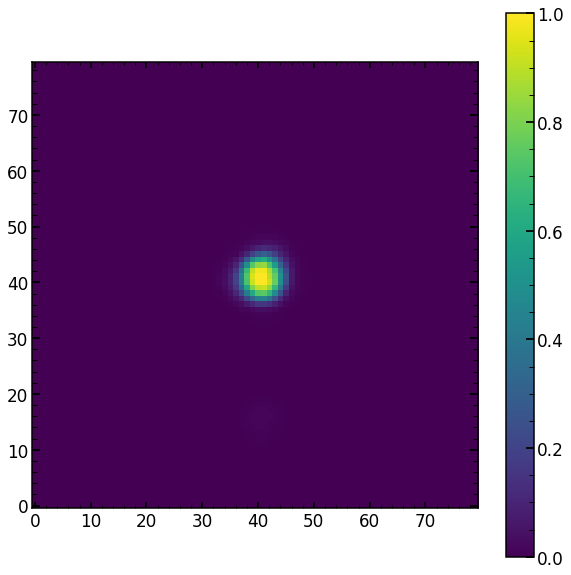

In [799]:
plt.figure(figsize=(10,10))

sci_image_44_Ne_dithering_mm=np.zeros((80,80))
# top left
sci_image_44_Ne_dithering_mm[1::2,::2] = sci_image_44_stacked_Ne_image_m0
# top right
sci_image_44_Ne_dithering_mm[1::2,1::2] = sci_image_44_stacked_Ne_image_mm
#lower left
sci_image_44_Ne_dithering_mm[::2,::2] = sci_image_44_stacked_Ne_image_00
# lower right
sci_image_44_Ne_dithering_mm[::2,1::2] = sci_image_44_stacked_Ne_image_0m

plt.imshow(sci_image_44_Ne_dithering_mm)
plt.colorbar()

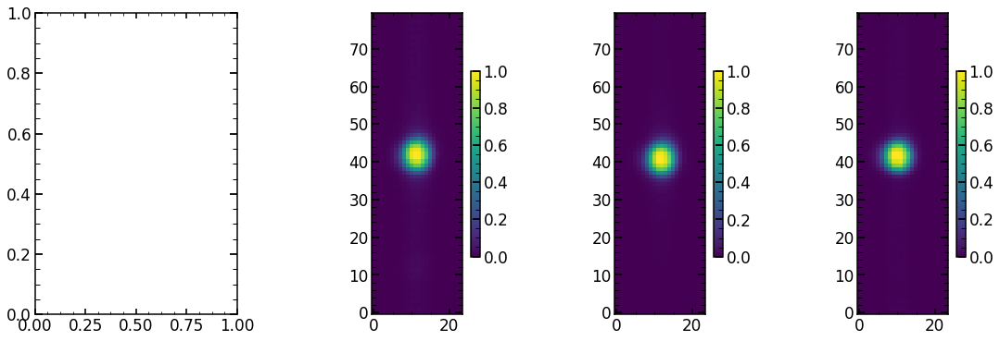

In [803]:
sci_image_44_Ne_dithering_24=sci_image_44_Ne_dithering_mm[:,29:53]
sci_image_43_Ne_dithering_24=sci_image_43_Ne_dithering_mm[:,29:53]
sci_image_42_Ne_dithering_24=sci_image_42_Ne_dithering_mm[:,31:55]

sci_image_42_Ne_dithering_24_1D=np.sum(sci_image_42_Ne_dithering_24*np.max(np.sum(sci_image_42_Ne_dithering_24,axis=1))/np.max(np.sum(sci_image_42_Ne_dithering_24,axis=1)),axis=1)
sci_image_42_Ne_dithering_24_1D=sci_image_42_Ne_dithering_24_1D/np.max(sci_image_42_Ne_dithering_24_1D)

sci_image_43_Ne_dithering_24_1D=np.sum(sci_image_43_Ne_dithering_24*np.max(np.sum(sci_image_43_Ne_dithering_24,axis=1))/np.max(np.sum(sci_image_43_Ne_dithering_24,axis=1)),axis=1)
sci_image_43_Ne_dithering_24_1D=sci_image_43_Ne_dithering_24_1D/np.max(sci_image_43_Ne_dithering_24_1D)

sci_image_44_Ne_dithering_24_1D=np.sum(sci_image_44_Ne_dithering_24*np.max(np.sum(sci_image_44_Ne_dithering_24,axis=1))/np.max(np.sum(sci_image_44_Ne_dithering_24,axis=1)),axis=1)
sci_image_44_Ne_dithering_24_1D=sci_image_44_Ne_dithering_24_1D/np.max(sci_image_44_Ne_dithering_24_1D)

#sci_image_45_dithering_24_1D=np.sum(sci_image_45_dithering_24*np.max(np.sum(sci_image_45_dithering_24,axis=1))/np.max(np.sum(sci_image_45_dithering_24,axis=1)),axis=1)
#sci_image_45_dithering_24_1D=sci_image_45_dithering_24_1D/np.max(sci_image_45_dithering_24_1D)

plt.figure(figsize=(18,6))

plt.subplot(141)
#plt.imshow(sci_image_45_dithering_24)
#cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(142)
plt.imshow(sci_image_44_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(143)
plt.imshow(sci_image_43_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(144)
plt.imshow(sci_image_42_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)


Text(0.5,1,'vertical (wavelength) extraction, zoom in')

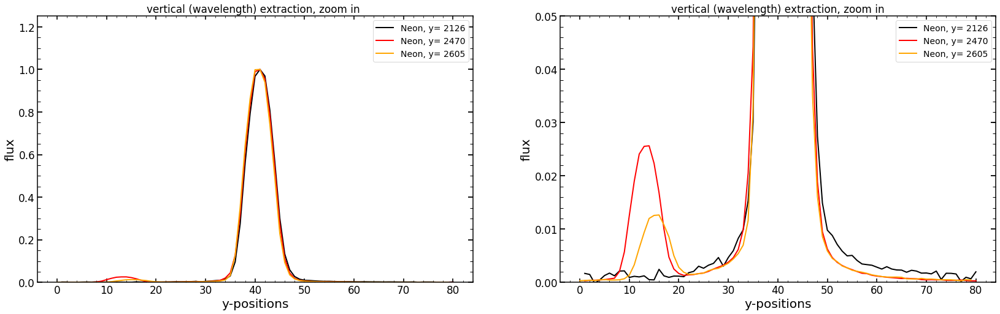

In [807]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(1,81),sci_image_42_Ne_dithering_24_1D,
         label='Neon, y= 2126',lw=2,color='black')
plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D,
         label='Neon, y= 2470',lw=2,color='red')
plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D,
         label='Neon, y= 2605',lw=2,color='orange')
#plt.plot(range(1,81),sci_image_45_dithering_24_1D,
#         label='Ar, 912.57 nm, y=3350',lw=2,color='brown')
#plt.plot(range(0,80),np.sum(sci_image_Ne_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_42_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2126',lw=2,color='blue')
#plt.plot(range(0,80),np.sum(sci_image_Ne_43_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_43_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2470',lw=2,color='cyan')
#plt.plot(range(0,80),np.sum(sci_image_Ne_44_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_44_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2605',lw=2,color='magenta')

plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*1))
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)

#plt.plot(range(0,80),np.sum(sci_image_42_dithering*np.max(np.sum(sci_image_42_dithering,axis=1))/np.max(np.sum(sci_image_42_dithering,axis=1)),axis=1),
#         label='44',lw=2,color='black')
#plt.plot(range(0,80),np.sum(sci_image_43_dithering*np.max(np.sum(sci_image_43_dithering,axis=1))/np.max(np.sum(sci_image_43_dithering,axis=1)),axis=1),
#         label='43',lw=2,color='red')
#plt.plot(range(0,80),np.sum(sci_image_44_dithering*np.max(np.sum(sci_image_44_dithering,axis=1))/np.max(np.sum(sci_image_44_dithering,axis=1)),axis=1),
#         label='42',lw=2,color='orange')
#plt.plot(range(0,80),np.sum(sci_image_45_dithering*np.max(np.sum(sci_image_45_dithering,axis=1))/np.max(np.sum(sci_image_45_dithering,axis=1)),axis=1),
#         label='41',lw=2,color='brown')

plt.plot(range(1,81),sci_image_42_Ne_dithering_24_1D-0.000,
         label='Neon, y= 2126',lw=2,color='black',ls='-')
plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D-0.000,
         label='Neon, y= 2470',lw=2,color='red',ls='-')
plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D-0.00,
         label='Neon, y= 2605',lw=2,color='orange',ls='-')
#plt.plot(range(1,81),sci_image_45_dithering_24_1D-0.0000,
#         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_42_dithering_24,axis=1)),axis=1)-0.0005,
#         label='Neon, y= 2126',lw=2,color='blue',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_43_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_43_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2470',lw=2,color='cyan',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_44_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_44_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2605',lw=2,color='magenta',ls='-')



plt.axhline(10000,color='black',ls=':')
plt.ylim(0,0.05)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

## together 

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

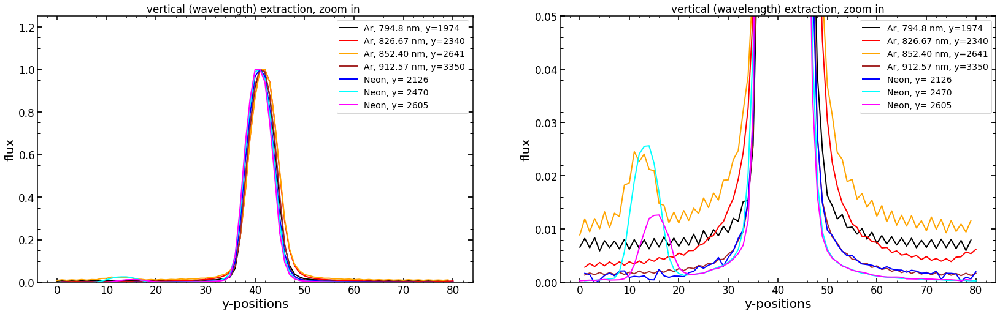

In [810]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(0,80),sci_image_42_dithering_24_1D,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black')
plt.plot(range(1,81),sci_image_43_dithering_24_1D,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red')
plt.plot(range(0,80),sci_image_44_dithering_24_1D,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange')
plt.plot(range(1,81),sci_image_45_dithering_24_1D,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown')
plt.plot(range(1,81),sci_image_42_Ne_dithering_24_1D,
         label='Neon, y= 2126',lw=2,color='blue')
plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D,
         label='Neon, y= 2470',lw=2,color='cyan')
plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D,
         label='Neon, y= 2605',lw=2,color='magenta')

plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*1))
plt.legend()
plt.title('vertical (wavelength) extraction, fiber at x=1220 ')

plt.subplot(122)

#plt.plot(range(0,80),np.sum(sci_image_42_dithering*np.max(np.sum(sci_image_42_dithering,axis=1))/np.max(np.sum(sci_image_42_dithering,axis=1)),axis=1),
#         label='44',lw=2,color='black')
#plt.plot(range(0,80),np.sum(sci_image_43_dithering*np.max(np.sum(sci_image_43_dithering,axis=1))/np.max(np.sum(sci_image_43_dithering,axis=1)),axis=1),
#         label='43',lw=2,color='red')
#plt.plot(range(0,80),np.sum(sci_image_44_dithering*np.max(np.sum(sci_image_44_dithering,axis=1))/np.max(np.sum(sci_image_44_dithering,axis=1)),axis=1),
#         label='42',lw=2,color='orange')
#plt.plot(range(0,80),np.sum(sci_image_45_dithering*np.max(np.sum(sci_image_45_dithering,axis=1))/np.max(np.sum(sci_image_45_dithering,axis=1)),axis=1),
#         label='41',lw=2,color='brown')

plt.plot(range(0,80),sci_image_42_dithering_24_1D-0.0,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black',ls='-')
plt.plot(range(1,81),sci_image_43_dithering_24_1D-0.00,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red',ls='-')
plt.plot(range(0,80),sci_image_44_dithering_24_1D-0.0,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange',ls='-')
plt.plot(range(1,81),sci_image_45_dithering_24_1D-0.000,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='-')
plt.plot(range(1,81),sci_image_42_Ne_dithering_24_1D,
         label='Neon, y= 2126',lw=2,color='blue')
plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D,
         label='Neon, y= 2470',lw=2,color='cyan')
plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D,
         label='Neon, y= 2605',lw=2,color='magenta')



plt.axhline(10000,color='black',ls=':')
plt.ylim(0,0.05)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

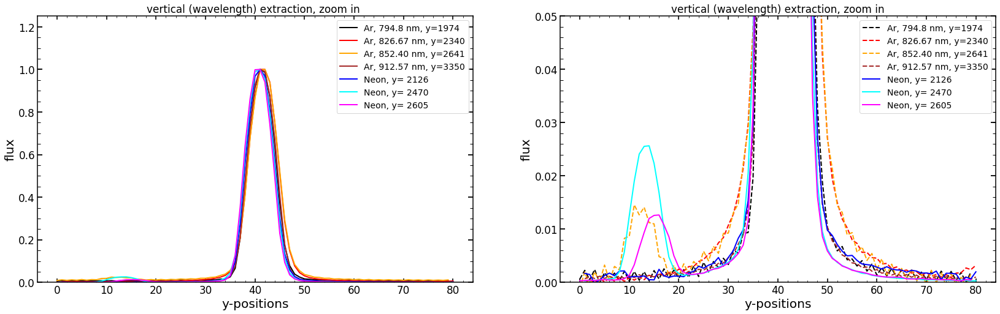

In [808]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(0,80),sci_image_42_dithering_24_1D,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black')
plt.plot(range(1,81),sci_image_43_dithering_24_1D,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red')
plt.plot(range(0,80),sci_image_44_dithering_24_1D,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange')
plt.plot(range(1,81),sci_image_45_dithering_24_1D,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown')
plt.plot(range(1,81),sci_image_42_Ne_dithering_24_1D,
         label='Neon, y= 2126',lw=2,color='blue')
plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D,
         label='Neon, y= 2470',lw=2,color='cyan')
plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D,
         label='Neon, y= 2605',lw=2,color='magenta')

plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*1))
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)

#plt.plot(range(0,80),np.sum(sci_image_42_dithering*np.max(np.sum(sci_image_42_dithering,axis=1))/np.max(np.sum(sci_image_42_dithering,axis=1)),axis=1),
#         label='44',lw=2,color='black')
#plt.plot(range(0,80),np.sum(sci_image_43_dithering*np.max(np.sum(sci_image_43_dithering,axis=1))/np.max(np.sum(sci_image_43_dithering,axis=1)),axis=1),
#         label='43',lw=2,color='red')
#plt.plot(range(0,80),np.sum(sci_image_44_dithering*np.max(np.sum(sci_image_44_dithering,axis=1))/np.max(np.sum(sci_image_44_dithering,axis=1)),axis=1),
#         label='42',lw=2,color='orange')
#plt.plot(range(0,80),np.sum(sci_image_45_dithering*np.max(np.sum(sci_image_45_dithering,axis=1))/np.max(np.sum(sci_image_45_dithering,axis=1)),axis=1),
#         label='41',lw=2,color='brown')

plt.plot(range(0,80),sci_image_42_dithering_24_1D-0.006,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black',ls='--')
plt.plot(range(1,81),sci_image_43_dithering_24_1D-0.003,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red',ls='--')
plt.plot(range(0,80),sci_image_44_dithering_24_1D-0.01,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange',ls='--')
plt.plot(range(1,81),sci_image_45_dithering_24_1D-0.0007,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='--')
plt.plot(range(1,81),sci_image_42_Ne_dithering_24_1D,
         label='Neon, y= 2126',lw=2,color='blue')
plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D,
         label='Neon, y= 2470',lw=2,color='cyan')
plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D,
         label='Neon, y= 2605',lw=2,color='magenta')



plt.axhline(10000,color='black',ls=':')
plt.ylim(0,0.05)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

## different fiber HgAr 

In [872]:
value_y=3340
value_x=1610

sci_image_45_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_00=sci_image_45_stacked_HgAr_image_00/np.max(sci_image_45_stacked_HgAr_image_00)

sci_image_45_stacked_HgAr_image_0p=stacked_HgAr_image_0p[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_0p=sci_image_45_stacked_HgAr_image_0p/np.max(sci_image_45_stacked_HgAr_image_0p)

sci_image_45_stacked_HgAr_image_p0=stacked_HgAr_image_p0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_p0=sci_image_45_stacked_HgAr_image_p0/np.max(sci_image_45_stacked_HgAr_image_p0)

sci_image_45_stacked_HgAr_image_pp=stacked_HgAr_image_pp[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_pp=sci_image_45_stacked_HgAr_image_pp/np.max(sci_image_45_stacked_HgAr_image_pp)

sci_image_45_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_0m=sci_image_45_stacked_HgAr_image_0m/np.max(sci_image_45_stacked_HgAr_image_0m)

sci_image_45_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_m0=sci_image_45_stacked_HgAr_image_m0/np.max(sci_image_45_stacked_HgAr_image_m0)

sci_image_45_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_mm=sci_image_45_stacked_HgAr_image_mm/np.max(sci_image_45_stacked_HgAr_image_mm)

sci_image_45_stacked_HgAr_image_mp=stacked_HgAr_image_mp[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_mp=sci_image_45_stacked_HgAr_image_mp/np.max(sci_image_45_stacked_HgAr_image_mp)

sci_image_45_stacked_HgAr_image_pm=stacked_HgAr_image_pm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_45_stacked_HgAr_image_pm=sci_image_45_stacked_HgAr_image_pm/np.max(sci_image_45_stacked_HgAr_image_pm)

########
value_y=2636-5
value_x=1610

sci_image_44_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_HgAr_image_0m=sci_image_44_stacked_HgAr_image_0m/np.max(sci_image_44_stacked_HgAr_image_0m)

sci_image_44_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_HgAr_image_m0=sci_image_44_stacked_HgAr_image_m0/np.max(sci_image_44_stacked_HgAr_image_m0)

sci_image_44_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_HgAr_image_mm=sci_image_44_stacked_HgAr_image_mm/np.max(sci_image_44_stacked_HgAr_image_mm)

sci_image_44_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_HgAr_image_00=sci_image_44_stacked_HgAr_image_00/np.max(sci_image_44_stacked_HgAr_image_00)

########
value_y=2337-5
value_x=1610

sci_image_43_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_HgAr_image_0m=sci_image_43_stacked_HgAr_image_0m/np.max(sci_image_43_stacked_HgAr_image_0m)

sci_image_43_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_HgAr_image_m0=sci_image_43_stacked_HgAr_image_m0/np.max(sci_image_43_stacked_HgAr_image_m0)

sci_image_43_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_HgAr_image_mm=sci_image_43_stacked_HgAr_image_mm/np.max(sci_image_43_stacked_HgAr_image_mm)

sci_image_43_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_HgAr_image_00=sci_image_43_stacked_HgAr_image_00/np.max(sci_image_43_stacked_HgAr_image_00)


########
value_y=1970-5
value_x=1610

sci_image_42_stacked_HgAr_image_0m=stacked_HgAr_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_HgAr_image_0m=sci_image_42_stacked_HgAr_image_0m/np.max(sci_image_42_stacked_HgAr_image_0m)

sci_image_42_stacked_HgAr_image_m0=stacked_HgAr_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_HgAr_image_m0=sci_image_42_stacked_HgAr_image_m0/np.max(sci_image_42_stacked_HgAr_image_m0)

sci_image_42_stacked_HgAr_image_mm=stacked_HgAr_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_HgAr_image_mm=sci_image_42_stacked_HgAr_image_mm/np.max(sci_image_42_stacked_HgAr_image_mm)

sci_image_42_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_HgAr_image_00=sci_image_42_stacked_HgAr_image_00/np.max(sci_image_42_stacked_HgAr_image_00)

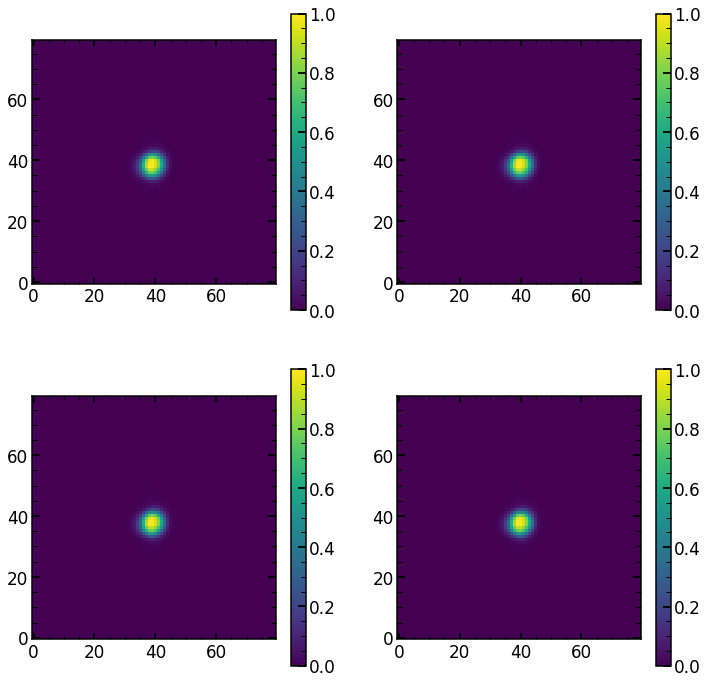

In [873]:
# mm dithering
sci_image_45_dithering_mm=np.zeros((80,80))
# top left
sci_image_45_dithering_mm[1::2,::2] = sci_image_45_stacked_HgAr_image_m0
# top right
sci_image_45_dithering_mm[1::2,1::2] = sci_image_45_stacked_HgAr_image_mm
#lower left
sci_image_45_dithering_mm[::2,::2] = sci_image_45_stacked_HgAr_image_00
# lower right
sci_image_45_dithering_mm[::2,1::2] = sci_image_45_stacked_HgAr_image_0m

# pp dithering
sci_image_45_dithering_pp=np.zeros((80,80))
# top left
sci_image_45_dithering_pp[1::2,::2] = sci_image_45_stacked_HgAr_image_0p
# top right
sci_image_45_dithering_pp[1::2,1::2] = sci_image_45_stacked_HgAr_image_00
#lower left
sci_image_45_dithering_pp[::2,::2] = sci_image_45_stacked_HgAr_image_pp
# lower right
sci_image_45_dithering_pp[::2,1::2] = sci_image_45_stacked_HgAr_image_p0

# pm dithering
sci_image_45_dithering_pm=np.zeros((80,80))
# top left
sci_image_45_dithering_pm[1::2,::2] = sci_image_45_stacked_HgAr_image_00
# top right
sci_image_45_dithering_pm[1::2,1::2] = sci_image_45_stacked_HgAr_image_0m
#lower left
sci_image_45_dithering_pm[::2,::2] = sci_image_45_stacked_HgAr_image_p0
# lower right
sci_image_45_dithering_pm[::2,1::2] = sci_image_45_stacked_HgAr_image_pm

# mp dithering
sci_image_45_dithering_mp=np.zeros((80,80))
# top left
sci_image_45_dithering_mp[1::2,::2] = sci_image_45_stacked_HgAr_image_mp
# top right
sci_image_45_dithering_mp[1::2,1::2] = sci_image_45_stacked_HgAr_image_m0
#lower left
sci_image_45_dithering_mp[::2,::2] = sci_image_45_stacked_HgAr_image_0p
# lower right
sci_image_45_dithering_mp[::2,1::2] = sci_image_45_stacked_HgAr_image_00

plt.figure(figsize=(12,12))

plt.subplot(221)
plt.imshow(sci_image_45_dithering_pm)
plt.colorbar()

plt.subplot(222)
plt.imshow(sci_image_45_dithering_pp)
plt.colorbar()

plt.subplot(223)
plt.imshow(sci_image_45_dithering_mm)
plt.colorbar()

plt.subplot(224)
plt.imshow(sci_image_45_dithering_mp)
plt.colorbar()

In [874]:
#######################
sci_image_44_dithering_mm=np.zeros((80,80))
# top left
sci_image_44_dithering_mm[1::2,::2] = sci_image_44_stacked_HgAr_image_m0
# top right
sci_image_44_dithering_mm[1::2,1::2] = sci_image_44_stacked_HgAr_image_mm
#lower left
sci_image_44_dithering_mm[::2,::2] = sci_image_44_stacked_HgAr_image_00
# lower right
sci_image_44_dithering_mm[::2,1::2] = sci_image_44_stacked_HgAr_image_0m
#######################
sci_image_43_dithering_mm=np.zeros((80,80))
# top left
sci_image_43_dithering_mm[1::2,::2] = sci_image_43_stacked_HgAr_image_m0
# top right
sci_image_43_dithering_mm[1::2,1::2] = sci_image_43_stacked_HgAr_image_mm
#lower left
sci_image_43_dithering_mm[::2,::2] = sci_image_43_stacked_HgAr_image_00
# lower right
sci_image_43_dithering_mm[::2,1::2] = sci_image_43_stacked_HgAr_image_0m
########################
sci_image_42_dithering_mm=np.zeros((80,80))
# top left
sci_image_42_dithering_mm[1::2,::2] = sci_image_42_stacked_HgAr_image_m0
# top right
sci_image_42_dithering_mm[1::2,1::2] = sci_image_42_stacked_HgAr_image_mm
#lower left
sci_image_42_dithering_mm[::2,::2] = sci_image_42_stacked_HgAr_image_00
# lower right
sci_image_42_dithering_mm[::2,1::2] = sci_image_42_stacked_HgAr_image_0m

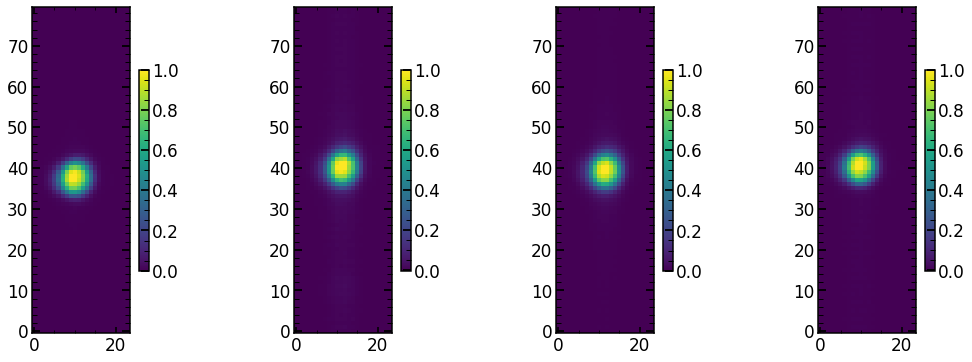

In [875]:
sci_image_45_dithering_24=sci_image_45_dithering_mm[:,29:53]
sci_image_44_dithering_24=sci_image_44_dithering_mm[:,29:53]
sci_image_43_dithering_24=sci_image_43_dithering_mm[:,29:53]
sci_image_42_dithering_24=sci_image_42_dithering_mm[:,31:55]
sci_image_Ne_42_dithering_24=sci_image_Ne_42_dithering[:,31:55]
sci_image_Ne_43_dithering_24=sci_image_Ne_43_dithering[:,29:53]
sci_image_Ne_44_dithering_24=sci_image_Ne_44_dithering[:,29:53]

sci_image_42_dithering_24_1D=np.sum(sci_image_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_42_dithering_24,axis=1)),axis=1)
sci_image_42_dithering_24_1D=sci_image_42_dithering_24_1D/np.max(sci_image_42_dithering_24_1D)

sci_image_43_dithering_24_1D=np.sum(sci_image_43_dithering_24*np.max(np.sum(sci_image_43_dithering_24,axis=1))/np.max(np.sum(sci_image_43_dithering_24,axis=1)),axis=1)
sci_image_43_dithering_24_1D=sci_image_43_dithering_24_1D/np.max(sci_image_43_dithering_24_1D)

sci_image_44_dithering_24_1D=np.sum(sci_image_44_dithering_24*np.max(np.sum(sci_image_44_dithering_24,axis=1))/np.max(np.sum(sci_image_44_dithering_24,axis=1)),axis=1)
sci_image_44_dithering_24_1D=sci_image_44_dithering_24_1D/np.max(sci_image_44_dithering_24_1D)

sci_image_45_dithering_24_1D=np.sum(sci_image_45_dithering_24*np.max(np.sum(sci_image_45_dithering_24,axis=1))/np.max(np.sum(sci_image_45_dithering_24,axis=1)),axis=1)
sci_image_45_dithering_24_1D=sci_image_45_dithering_24_1D/np.max(sci_image_45_dithering_24_1D)

plt.figure(figsize=(18,6))

plt.subplot(141)
plt.imshow(sci_image_45_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(142)
plt.imshow(sci_image_44_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(143)
plt.imshow(sci_image_43_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(144)
plt.imshow(sci_image_42_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)


Text(0.5,1,'vertical (wavelength) extraction, zoom in')

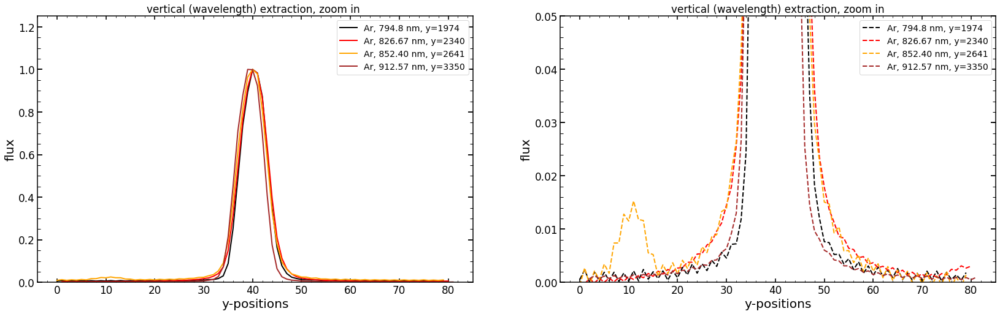

In [876]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(0,80),sci_image_42_dithering_24_1D,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black')
plt.plot(range(1,81),sci_image_43_dithering_24_1D,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red')
plt.plot(range(0,80),sci_image_44_dithering_24_1D,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange')
plt.plot(range(2,82),sci_image_45_dithering_24_1D,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown')
#plt.plot(range(1,81),sci_image_42_Ne_dithering_24_1D,
#         label='Neon, y= 2126',lw=2,color='blue')
#plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D,
#         label='Neon, y= 2470',lw=2,color='cyan')
#plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D,
#         label='Neon, y= 2605',lw=2,color='magenta')

plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*1))
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)

#plt.plot(range(0,80),np.sum(sci_image_42_dithering*np.max(np.sum(sci_image_42_dithering,axis=1))/np.max(np.sum(sci_image_42_dithering,axis=1)),axis=1),
#         label='44',lw=2,color='black')
#plt.plot(range(0,80),np.sum(sci_image_43_dithering*np.max(np.sum(sci_image_43_dithering,axis=1))/np.max(np.sum(sci_image_43_dithering,axis=1)),axis=1),
#         label='43',lw=2,color='red')
#plt.plot(range(0,80),np.sum(sci_image_44_dithering*np.max(np.sum(sci_image_44_dithering,axis=1))/np.max(np.sum(sci_image_44_dithering,axis=1)),axis=1),
#         label='42',lw=2,color='orange')
#plt.plot(range(0,80),np.sum(sci_image_45_dithering*np.max(np.sum(sci_image_45_dithering,axis=1))/np.max(np.sum(sci_image_45_dithering,axis=1)),axis=1),
#         label='41',lw=2,color='brown')

plt.plot(range(0,80),sci_image_42_dithering_24_1D-0.006,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black',ls='--')
plt.plot(range(1,81),sci_image_43_dithering_24_1D-0.003,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red',ls='--')
plt.plot(range(0,80),sci_image_44_dithering_24_1D-0.01,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange',ls='--')
plt.plot(range(2,82),sci_image_45_dithering_24_1D-0.0007,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='--')
#plt.plot(range(1,81),sci_image_42_Ne_dithering_24_1D,
#         label='Neon, y= 2126',lw=2,color='blue')
#plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D,
#         label='Neon, y= 2470',lw=2,color='cyan')
#plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D,
#         label='Neon, y= 2605',lw=2,color='magenta')


plt.axhline(10000,color='black',ls=':')
plt.ylim(0,0.05)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

## different fiber Neon

In [877]:
value_y=2120
value_x=1610

sci_image_42_stacked_Ne_image_00=stacked_Ne_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_00=sci_image_42_stacked_Ne_image_00/np.max(sci_image_42_stacked_Ne_image_00)

sci_image_42_stacked_Ne_image_0p=stacked_Ne_image_0p[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_0p=sci_image_42_stacked_Ne_image_0p/np.max(sci_image_42_stacked_Ne_image_0p)

sci_image_42_stacked_Ne_image_p0=stacked_Ne_image_p0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_p0=sci_image_42_stacked_Ne_image_p0/np.max(sci_image_42_stacked_Ne_image_p0)

sci_image_42_stacked_Ne_image_pp=stacked_Ne_image_pp[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_pp=sci_image_42_stacked_Ne_image_pp/np.max(sci_image_42_stacked_Ne_image_pp)

sci_image_42_stacked_Ne_image_0m=stacked_Ne_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_0m=sci_image_42_stacked_Ne_image_0m/np.max(sci_image_42_stacked_Ne_image_0m)

sci_image_42_stacked_Ne_image_m0=stacked_Ne_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_m0=sci_image_42_stacked_Ne_image_m0/np.max(sci_image_42_stacked_Ne_image_m0)

sci_image_42_stacked_Ne_image_mm=stacked_Ne_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_mm=sci_image_42_stacked_Ne_image_mm/np.max(sci_image_42_stacked_Ne_image_mm)

sci_image_42_stacked_Ne_image_mp=stacked_Ne_image_mp[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_mp=sci_image_42_stacked_Ne_image_mp/np.max(sci_image_42_stacked_Ne_image_mp)

sci_image_42_stacked_Ne_image_pm=stacked_Ne_image_pm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_42_stacked_Ne_image_pm=sci_image_42_stacked_Ne_image_pm/np.max(sci_image_42_stacked_Ne_image_pm)


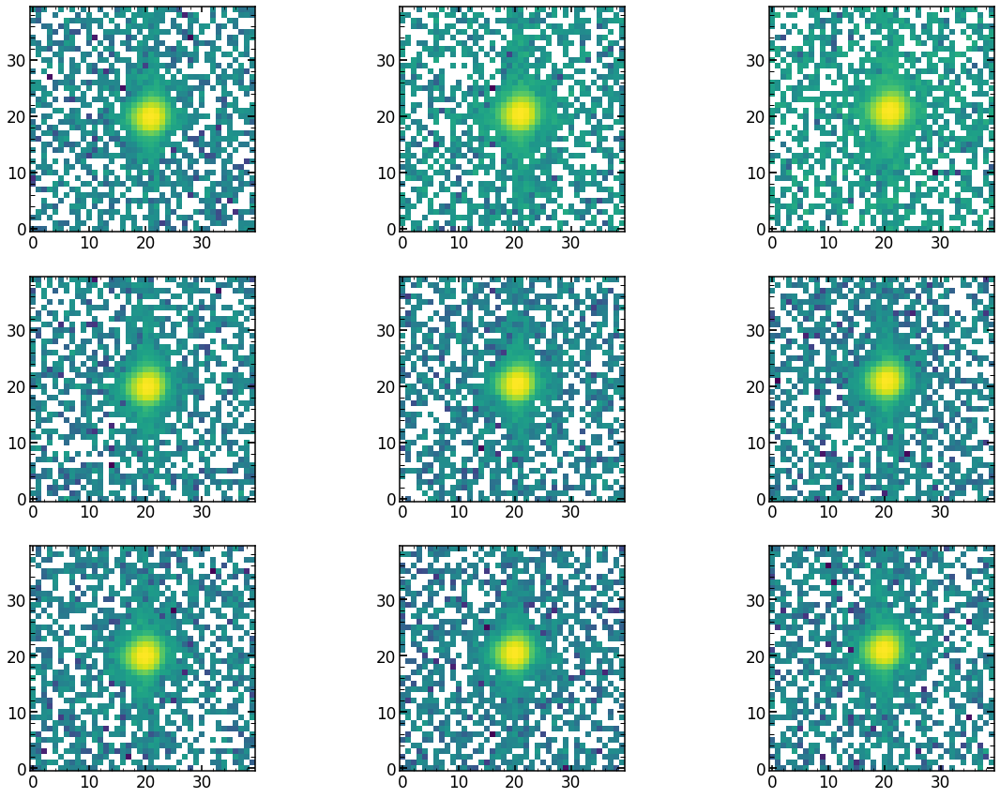

In [878]:
plt.figure(figsize=(20,15))

plt.subplot(331)
plt.imshow(sci_image_42_stacked_Ne_image_mp,norm=LogNorm(),origin='lower')

plt.subplot(332)
plt.imshow(sci_image_42_stacked_Ne_image_0p,norm=LogNorm(),origin='lower')

plt.subplot(333)
plt.imshow(sci_image_42_stacked_Ne_image_pp,norm=LogNorm(),origin='lower')

plt.subplot(334)
plt.imshow(sci_image_42_stacked_Ne_image_m0,norm=LogNorm(),origin='lower')

plt.subplot(335)
plt.imshow(sci_image_42_stacked_Ne_image_00,norm=LogNorm(),origin='lower')

plt.subplot(336)
plt.imshow(sci_image_42_stacked_Ne_image_p0,norm=LogNorm(),origin='lower')

plt.subplot(337)
plt.imshow(sci_image_42_stacked_Ne_image_mm,norm=LogNorm(),origin='lower')

plt.subplot(338)
plt.imshow(sci_image_42_stacked_Ne_image_0m,norm=LogNorm(),origin='lower')

plt.subplot(339)
plt.imshow(sci_image_42_stacked_Ne_image_pm,norm=LogNorm(),origin='lower')


In [879]:
print(np.max(sci_image_42_stacked_Ne_image_00))
print(np.max(sci_image_42_stacked_Ne_image_0p))
print(np.max(sci_image_42_stacked_Ne_image_p0))
print(np.max(sci_image_42_stacked_Ne_image_pp))
print(np.max(sci_image_42_stacked_Ne_image_0m))
print(np.max(sci_image_42_stacked_Ne_image_m0))
print(np.max(sci_image_42_stacked_Ne_image_mm))
print(np.max(sci_image_42_stacked_Ne_image_mp))
print(np.max(sci_image_42_stacked_Ne_image_pm))


1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


In [880]:
print('0p '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_0p)))
print('p0 '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_p0)))
print('pp '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_pp)))
print('pm '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_pm)))
print('mp '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_mp)))

print('00 '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_00)))
print('0m '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_0m)))
print('m0 '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_m0)))
print('mm '+str(find_centroid_of_flux(sci_image_42_stacked_Ne_image_mm)))

0p (20.90855519487385, 20.344217534695808)
p0 (20.339262145398795, 20.84173554445215)
pp (20.92226448629158, 20.862733554481817)
pm (19.885481894281096, 20.921522162166728)
mp (20.908211113698332, 19.904305436591418)
00 (20.381480720961033, 20.422614191718022)
0m (19.889204964397972, 20.375469473772068)
m0 (20.359334959238364, 19.947450554120937)
mm (19.846365614013806, 19.911537568096755)


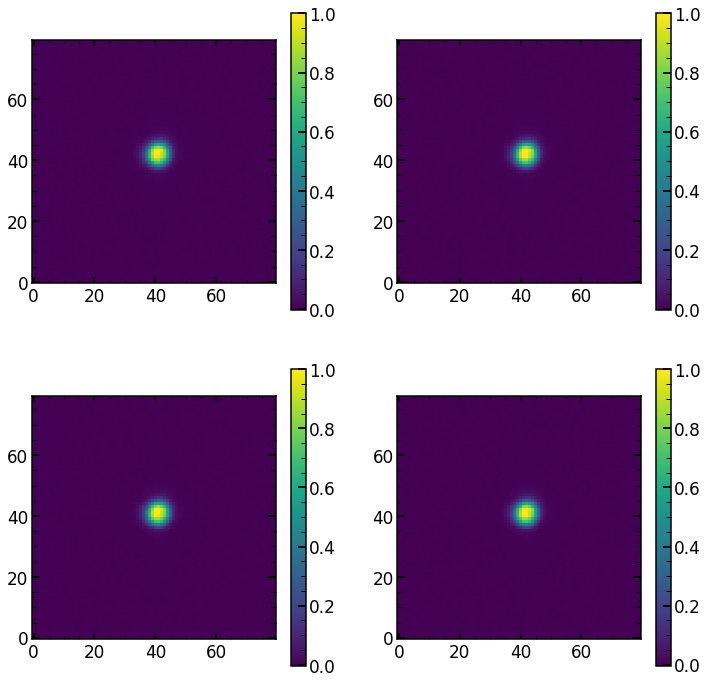

In [881]:
# mm dithering
sci_image_42_Ne_dithering_mm=np.zeros((80,80))
# top left
sci_image_42_Ne_dithering_mm[1::2,::2] = sci_image_42_stacked_Ne_image_m0
# top right
sci_image_42_Ne_dithering_mm[1::2,1::2] = sci_image_42_stacked_Ne_image_mm
#lower left
sci_image_42_Ne_dithering_mm[::2,::2] = sci_image_42_stacked_Ne_image_00
# lower right
sci_image_42_Ne_dithering_mm[::2,1::2] = sci_image_42_stacked_Ne_image_0m

# pp dithering
sci_image_42_Ne_dithering_pp=np.zeros((80,80))
# top left
sci_image_42_Ne_dithering_pp[1::2,::2] = sci_image_42_stacked_Ne_image_0p
# top right
sci_image_42_Ne_dithering_pp[1::2,1::2] = sci_image_42_stacked_Ne_image_00
#lower left
sci_image_42_Ne_dithering_pp[::2,::2] = sci_image_42_stacked_Ne_image_pp
# lower right
sci_image_42_Ne_dithering_pp[::2,1::2] = sci_image_42_stacked_Ne_image_p0

# pm dithering
sci_image_42_Ne_dithering_pm=np.zeros((80,80))
# top left
sci_image_42_Ne_dithering_pm[1::2,::2] = sci_image_42_stacked_Ne_image_00
# top right
sci_image_42_Ne_dithering_pm[1::2,1::2] = sci_image_42_stacked_Ne_image_0m
#lower left
sci_image_42_Ne_dithering_pm[::2,::2] = sci_image_42_stacked_Ne_image_p0
# lower right
sci_image_42_Ne_dithering_pm[::2,1::2] = sci_image_42_stacked_Ne_image_pm

# mp dithering
sci_image_42_Ne_dithering_mp=np.zeros((80,80))
# top left
sci_image_42_Ne_dithering_mp[1::2,::2] = sci_image_42_stacked_Ne_image_mp
# top right
sci_image_42_Ne_dithering_mp[1::2,1::2] = sci_image_42_stacked_Ne_image_m0
#lower left
sci_image_42_Ne_dithering_mp[::2,::2] = sci_image_42_stacked_Ne_image_0p
# lower right
sci_image_42_Ne_dithering_mp[::2,1::2] = sci_image_42_stacked_Ne_image_00

plt.figure(figsize=(12,12))

plt.subplot(221)
plt.imshow(sci_image_42_Ne_dithering_pm)
plt.colorbar()

plt.subplot(222)
plt.imshow(sci_image_42_Ne_dithering_pp)
plt.colorbar()

plt.subplot(223)
plt.imshow(sci_image_42_Ne_dithering_mm)
plt.colorbar()

plt.subplot(224)
plt.imshow(sci_image_42_Ne_dithering_mp)
plt.colorbar()

In [882]:
value_y=2463
value_x=1610

sci_image_43_stacked_Ne_image_00=stacked_Ne_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_Ne_image_00=sci_image_43_stacked_Ne_image_00/np.max(sci_image_43_stacked_Ne_image_00)

sci_image_43_stacked_Ne_image_0m=stacked_Ne_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_Ne_image_0m=sci_image_43_stacked_Ne_image_0m/np.max(sci_image_43_stacked_Ne_image_0m)

sci_image_43_stacked_Ne_image_m0=stacked_Ne_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_Ne_image_m0=sci_image_43_stacked_Ne_image_m0/np.max(sci_image_43_stacked_Ne_image_m0)

sci_image_43_stacked_Ne_image_mm=stacked_Ne_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_43_stacked_Ne_image_mm=sci_image_43_stacked_Ne_image_mm/np.max(sci_image_43_stacked_Ne_image_mm)


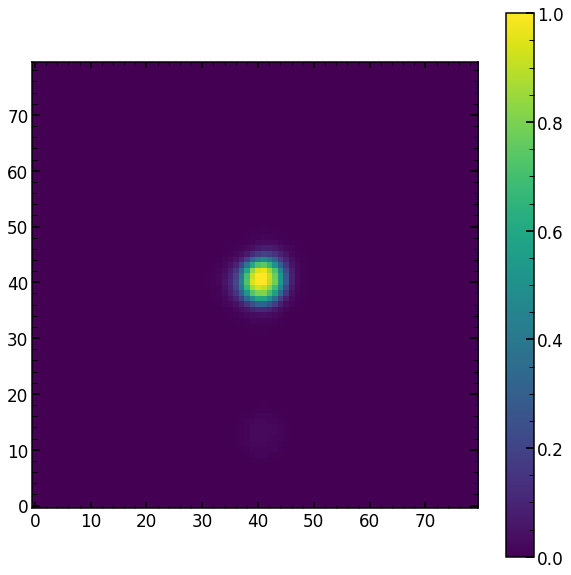

In [883]:
plt.figure(figsize=(10,10))

sci_image_43_Ne_dithering_mm=np.zeros((80,80))
# top left
sci_image_43_Ne_dithering_mm[1::2,::2] = sci_image_43_stacked_Ne_image_m0
# top right
sci_image_43_Ne_dithering_mm[1::2,1::2] = sci_image_43_stacked_Ne_image_mm
#lower left
sci_image_43_Ne_dithering_mm[::2,::2] = sci_image_43_stacked_Ne_image_00
# lower right
sci_image_43_Ne_dithering_mm[::2,1::2] = sci_image_43_stacked_Ne_image_0m

plt.imshow(sci_image_43_Ne_dithering_mm)
plt.colorbar()

In [884]:
value_y=2600
value_x=1610

sci_image_44_stacked_Ne_image_00=stacked_Ne_image_00[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_Ne_image_00=sci_image_44_stacked_Ne_image_00/np.max(sci_image_44_stacked_Ne_image_00)

sci_image_44_stacked_Ne_image_0m=stacked_Ne_image_0m[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_Ne_image_0m=sci_image_44_stacked_Ne_image_0m/np.max(sci_image_44_stacked_Ne_image_0m)

sci_image_44_stacked_Ne_image_m0=stacked_Ne_image_m0[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_Ne_image_m0=sci_image_44_stacked_Ne_image_m0/np.max(sci_image_44_stacked_Ne_image_m0)

sci_image_44_stacked_Ne_image_mm=stacked_Ne_image_mm[value_y-20:value_y+20,value_x-20:value_x+20]
sci_image_44_stacked_Ne_image_mm=sci_image_44_stacked_Ne_image_mm/np.max(sci_image_44_stacked_Ne_image_mm)

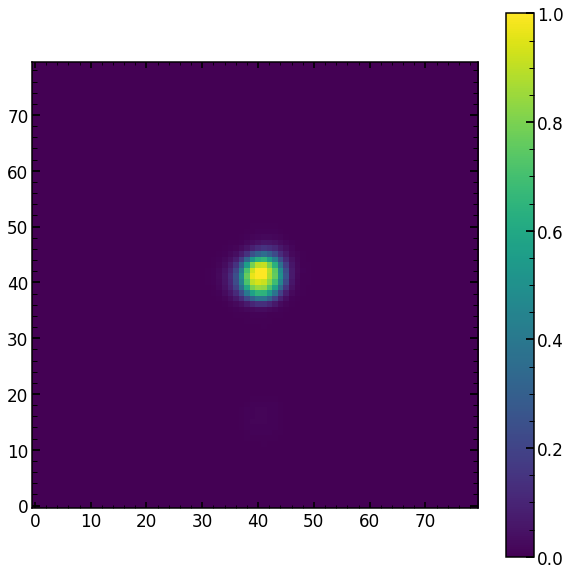

In [885]:
plt.figure(figsize=(10,10))

sci_image_44_Ne_dithering_mm=np.zeros((80,80))
# top left
sci_image_44_Ne_dithering_mm[1::2,::2] = sci_image_44_stacked_Ne_image_m0
# top right
sci_image_44_Ne_dithering_mm[1::2,1::2] = sci_image_44_stacked_Ne_image_mm
#lower left
sci_image_44_Ne_dithering_mm[::2,::2] = sci_image_44_stacked_Ne_image_00
# lower right
sci_image_44_Ne_dithering_mm[::2,1::2] = sci_image_44_stacked_Ne_image_0m

plt.imshow(sci_image_44_Ne_dithering_mm)
plt.colorbar()

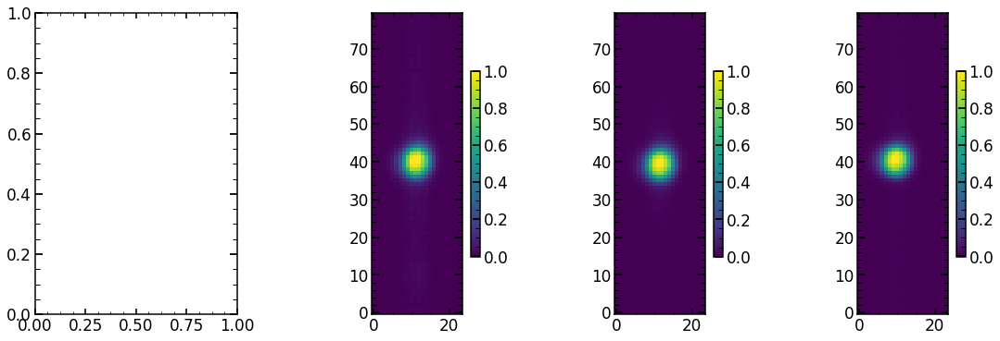

In [886]:
sci_image_44_Ne_dithering_24=sci_image_44_Ne_dithering_mm[:,29:53]
sci_image_43_Ne_dithering_24=sci_image_43_Ne_dithering_mm[:,29:53]
sci_image_42_Ne_dithering_24=sci_image_42_Ne_dithering_mm[:,31:55]

sci_image_42_Ne_dithering_24_1D=np.sum(sci_image_42_Ne_dithering_24*np.max(np.sum(sci_image_42_Ne_dithering_24,axis=1))/np.max(np.sum(sci_image_42_Ne_dithering_24,axis=1)),axis=1)
sci_image_42_Ne_dithering_24_1D=sci_image_42_Ne_dithering_24_1D/np.max(sci_image_42_Ne_dithering_24_1D)

sci_image_43_Ne_dithering_24_1D=np.sum(sci_image_43_Ne_dithering_24*np.max(np.sum(sci_image_43_Ne_dithering_24,axis=1))/np.max(np.sum(sci_image_43_Ne_dithering_24,axis=1)),axis=1)
sci_image_43_Ne_dithering_24_1D=sci_image_43_Ne_dithering_24_1D/np.max(sci_image_43_Ne_dithering_24_1D)

sci_image_44_Ne_dithering_24_1D=np.sum(sci_image_44_Ne_dithering_24*np.max(np.sum(sci_image_44_Ne_dithering_24,axis=1))/np.max(np.sum(sci_image_44_Ne_dithering_24,axis=1)),axis=1)
sci_image_44_Ne_dithering_24_1D=sci_image_44_Ne_dithering_24_1D/np.max(sci_image_44_Ne_dithering_24_1D)

#sci_image_45_dithering_24_1D=np.sum(sci_image_45_dithering_24*np.max(np.sum(sci_image_45_dithering_24,axis=1))/np.max(np.sum(sci_image_45_dithering_24,axis=1)),axis=1)
#sci_image_45_dithering_24_1D=sci_image_45_dithering_24_1D/np.max(sci_image_45_dithering_24_1D)

plt.figure(figsize=(18,6))

plt.subplot(141)
#plt.imshow(sci_image_45_dithering_24)
#cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(142)
plt.imshow(sci_image_44_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(143)
plt.imshow(sci_image_43_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(144)
plt.imshow(sci_image_42_dithering_24)
cbar=plt.colorbar(fraction=0.046, pad=0.04)


Text(0.5,1,'vertical (wavelength) extraction, zoom in')

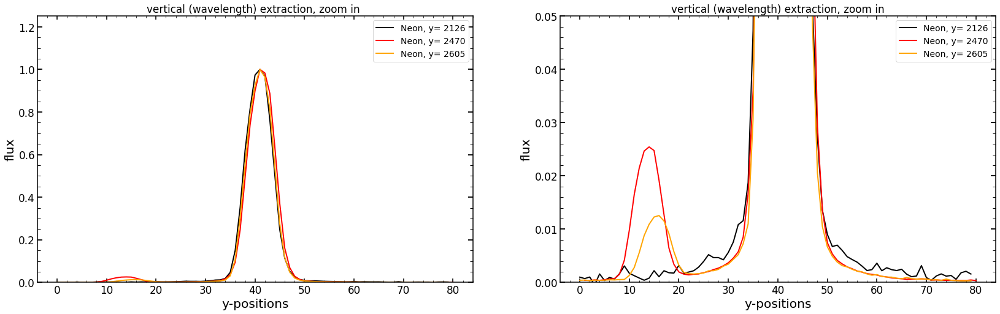

In [887]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(0,80),sci_image_42_Ne_dithering_24_1D,
         label='Neon, y= 2126',lw=2,color='black')
plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D,
         label='Neon, y= 2470',lw=2,color='red')
plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D,
         label='Neon, y= 2605',lw=2,color='orange')
#plt.plot(range(1,81),sci_image_45_dithering_24_1D,
#         label='Ar, 912.57 nm, y=3350',lw=2,color='brown')
#plt.plot(range(0,80),np.sum(sci_image_Ne_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_42_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2126',lw=2,color='blue')
#plt.plot(range(0,80),np.sum(sci_image_Ne_43_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_43_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2470',lw=2,color='cyan')
#plt.plot(range(0,80),np.sum(sci_image_Ne_44_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_44_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2605',lw=2,color='magenta')

plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*1))
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in ')

plt.subplot(122)

#plt.plot(range(0,80),np.sum(sci_image_42_dithering*np.max(np.sum(sci_image_42_dithering,axis=1))/np.max(np.sum(sci_image_42_dithering,axis=1)),axis=1),
#         label='44',lw=2,color='black')
#plt.plot(range(0,80),np.sum(sci_image_43_dithering*np.max(np.sum(sci_image_43_dithering,axis=1))/np.max(np.sum(sci_image_43_dithering,axis=1)),axis=1),
#         label='43',lw=2,color='red')
#plt.plot(range(0,80),np.sum(sci_image_44_dithering*np.max(np.sum(sci_image_44_dithering,axis=1))/np.max(np.sum(sci_image_44_dithering,axis=1)),axis=1),
#         label='42',lw=2,color='orange')
#plt.plot(range(0,80),np.sum(sci_image_45_dithering*np.max(np.sum(sci_image_45_dithering,axis=1))/np.max(np.sum(sci_image_45_dithering,axis=1)),axis=1),
#         label='41',lw=2,color='brown')

plt.plot(range(0,80),sci_image_42_Ne_dithering_24_1D-0.000,
         label='Neon, y= 2126',lw=2,color='black',ls='-')
plt.plot(range(1,81),sci_image_43_Ne_dithering_24_1D-0.000,
         label='Neon, y= 2470',lw=2,color='red',ls='-')
plt.plot(range(0,80),sci_image_44_Ne_dithering_24_1D-0.00,
         label='Neon, y= 2605',lw=2,color='orange',ls='-')
#plt.plot(range(1,81),sci_image_45_dithering_24_1D-0.0000,
#         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_42_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_42_dithering_24,axis=1)),axis=1)-0.0005,
#         label='Neon, y= 2126',lw=2,color='blue',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_43_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_43_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2470',lw=2,color='cyan',ls='-')
#plt.plot(range(0,80),np.sum(sci_image_Ne_44_dithering_24*np.max(np.sum(sci_image_42_dithering_24,axis=1))/np.max(np.sum(sci_image_Ne_44_dithering_24,axis=1)),axis=1),
#         label='Neon, y= 2605',lw=2,color='magenta',ls='-')



plt.axhline(10000,color='black',ls=':')
plt.ylim(0,0.05)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

## different fiber together

Text(0.5,1,'vertical (wavelength) extraction, zoom in')

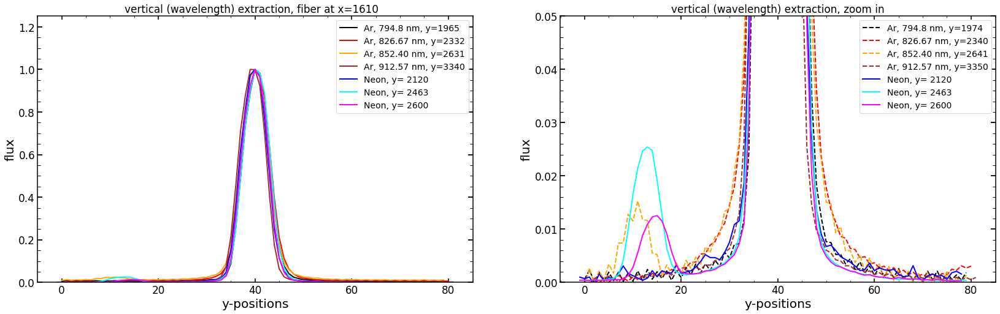

In [888]:
plt.figure(figsize=(28,8))

plt.subplot(121)
#plt.plot(np.sum(sci_image_40_Ne_3_1*np.sum(list_of_sci_image_HgAr_40[7])/np.sum(sci_image_40_Ne_3_1),axis=1),label='Neon, 829.88 A, overexposed',lw=2)
plt.plot(range(0,80),sci_image_42_dithering_24_1D,
         label='Ar, 794.8 nm, y=1965',lw=2,color='black')
plt.plot(range(1,81),sci_image_43_dithering_24_1D,
         label='Ar, 826.67 nm, y=2332',lw=2,color='red')
plt.plot(range(0,80),sci_image_44_dithering_24_1D,
         label='Ar, 852.40 nm, y=2631',lw=2,color='orange')
plt.plot(range(2,82),sci_image_45_dithering_24_1D,
         label='Ar, 912.57 nm, y=3340',lw=2,color='brown')
plt.plot(range(-1,79),sci_image_42_Ne_dithering_24_1D,
         label='Neon, y= 2120',lw=2,color='blue')
plt.plot(range(0,80),sci_image_43_Ne_dithering_24_1D,
         label='Neon, y= 2463',lw=2,color='cyan')
plt.plot(range(-1,79),sci_image_44_Ne_dithering_24_1D,
         label='Neon, y= 2600',lw=2,color='magenta')

plt.axhline(10000,color='black',ls=':')
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.ylim(0,np.max(1.25*1))
plt.legend()
plt.title('vertical (wavelength) extraction, fiber at x=1610  ')

plt.subplot(122)

#plt.plot(range(0,80),np.sum(sci_image_42_dithering*np.max(np.sum(sci_image_42_dithering,axis=1))/np.max(np.sum(sci_image_42_dithering,axis=1)),axis=1),
#         label='44',lw=2,color='black')
#plt.plot(range(0,80),np.sum(sci_image_43_dithering*np.max(np.sum(sci_image_43_dithering,axis=1))/np.max(np.sum(sci_image_43_dithering,axis=1)),axis=1),
#         label='43',lw=2,color='red')
#plt.plot(range(0,80),np.sum(sci_image_44_dithering*np.max(np.sum(sci_image_44_dithering,axis=1))/np.max(np.sum(sci_image_44_dithering,axis=1)),axis=1),
#         label='42',lw=2,color='orange')
#plt.plot(range(0,80),np.sum(sci_image_45_dithering*np.max(np.sum(sci_image_45_dithering,axis=1))/np.max(np.sum(sci_image_45_dithering,axis=1)),axis=1),
#         label='41',lw=2,color='brown')

plt.plot(range(0,80),sci_image_42_dithering_24_1D-0.006,
         label='Ar, 794.8 nm, y=1974',lw=2,color='black',ls='--')
plt.plot(range(1,81),sci_image_43_dithering_24_1D-0.003,
         label='Ar, 826.67 nm, y=2340',lw=2,color='red',ls='--')
plt.plot(range(0,80),sci_image_44_dithering_24_1D-0.01,
         label='Ar, 852.40 nm, y=2641',lw=2,color='orange',ls='--')
plt.plot(range(2,82),sci_image_45_dithering_24_1D-0.0007,
         label='Ar, 912.57 nm, y=3350',lw=2,color='brown',ls='--')
plt.plot(range(-1,79),sci_image_42_Ne_dithering_24_1D,
         label='Neon, y= 2120',lw=2,color='blue')
plt.plot(range(0,80),sci_image_43_Ne_dithering_24_1D,
         label='Neon, y= 2463',lw=2,color='cyan')
plt.plot(range(-1,79),sci_image_44_Ne_dithering_24_1D,
         label='Neon, y= 2600',lw=2,color='magenta')



plt.axhline(10000,color='black',ls=':')
plt.ylim(0,0.05)
plt.xlabel('y-positions')
plt.ylabel('flux')
plt.legend()
plt.title('vertical (wavelength) extraction, zoom in')

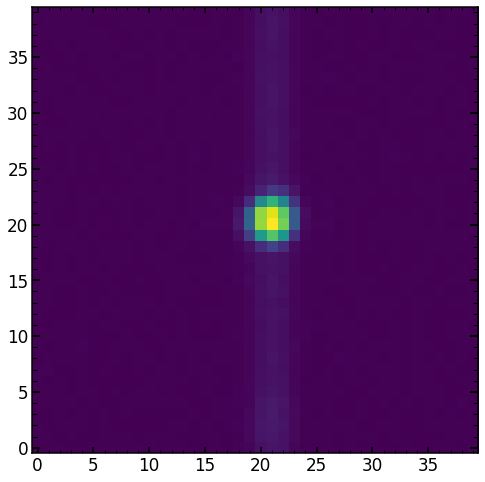

In [936]:
plt.figure(figsize=(8,28))
value_y=2808
sci_image_45_stacked_HgAr_image_00=stacked_HgAr_image_00[value_y-20:value_y+20,1221-20:1221+20]
sci_image_45_stacked_HgAr_image_00=sci_image_45_stacked_HgAr_image_00/np.max(sci_image_45_stacked_HgAr_image_00)
plt.imshow(sci_image_45_stacked_HgAr_image_00)

In [926]:
(852.40-826.45)/301

0.08621262458471739

In [932]:
(2812-2340)*0.0854+826.45

866.7588000000001

# Next 